In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import interpolate
from math import pi, cos, sin,atan
import math
import os
import pickle
from sklearn.cluster import DBSCAN

from numpy.random import randint
from numpy.random import rand

import json

from paretoset import paretoset
import pandas as pd

import pygad

from bayes_opt import BayesianOptimization

import datetime

import warnings
warnings.filterwarnings('ignore')

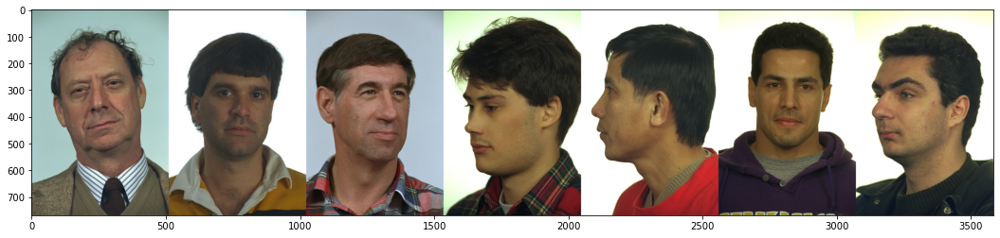

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])
IMAGE = cv2.cvtColor(IMAGE,cv2.COLOR_BGR2RGB)
plt.figure(figsize = (20,4))
plt.imshow(IMAGE)

## B-spline curve modeling

In [2]:
MasterColors = np.zeros((256,256,256)).astype(int)
MasterNonColors = np.zeros((256,256,256)).astype(int)

In [3]:
#Getting a count of each pixel that is skin

def MSK(s):
    return s.replace('\\ORI\\','\\GT\\')
images = 0
for filename in os.scandir("..\\Data\\sfa\\ORI"):
    if filename.is_file() and filename.path[-4:]==".jpg":
            #print("Image "+str(images)+" -- "+file)
        images+=1
            
        img = cv2.cvtColor(cv2.cvtColor(cv2.imread(filename.path),cv2.COLOR_BGR2LAB),cv2.COLOR_BGR2RGB)
        msk = cv2.imread(MSK(filename.path),0)
            
        skin = img[msk!=0]
        skin = skin.reshape(-1,3)
    
        for i in range(skin.shape[0]):
            MasterColors[skin[i,0],skin[i,1],skin[i,2]] += 1
print("Done processing ",images," images.")

Done processing  1115  images.


In [4]:
images = 0
for filename in os.scandir("..\\Data\\sfa\\ORI"):
    if filename.is_file() and filename.path[-4:]==".jpg":
            #print("Image "+str(images)+" -- "+file)
        images+=1
            
        img = cv2.cvtColor(cv2.cvtColor(cv2.imread(filename.path),cv2.COLOR_BGR2LAB),cv2.COLOR_BGR2RGB)
        msk = cv2.imread(MSK(filename.path),0)
            
        skin = img[msk==0]
        skin = skin.reshape(-1,3)
    
        for i in range(skin.shape[0]):
            MasterNonColors[skin[i,0],skin[i,1],skin[i,2]] += 1
print("Done processing ",images," images.")

Done processing  1115  images.


In [5]:
#Extracting the pixels that are skin
Points = np.argwhere(MasterColors>0)

In [6]:
class Ellipse:
    def __init__(self,clus,H1,H2,S1,S2,T):
        self.cluster = clus
        self.HMoy = H1
        self.SMoy = S1
        self.HEct = H2
        self.SEct = S2
        self.thet = 0 if np.isnan(T) else T
        self.Th = 2
    def __str__(self):
        return "Of cluster:"+str(self.cluster)+" with Th "+str(self.Th)+" At("+str(self.HMoy)+","+str(self.SMoy)+"),with("+str(self.HEct)+","+str(self.SEct)+"), theta "+str(self.thet)
    def is_it_in(self,H,S):
        return (pow((cos(self.thet)*(H-self.HMoy) + sin(self.thet)*(S-self.SMoy)),2) / pow(self.Th*self.HEct,2)) + (pow((-sin(self.thet)*(H-self.HMoy) + cos(self.thet)*(S-self.SMoy)),2) / pow(self.Th*self.SEct,2)) <= 1
    def are_they_in(self,H,S):
        return (np.power((cos(self.thet)*(H-self.HMoy) + sin(self.thet)*(S-self.SMoy)),2) / pow(self.Th*self.HEct,2)) + (np.power((-sin(self.thet)*(H-self.HMoy) + cos(self.thet)*(S-self.SMoy)),2) / pow(self.Th*self.SEct,2)) <= 1
    def F(self):
        print(Points)

In [7]:
class CLUSTER:
    def __init__(self,numero):
        self.id = numero
    def fit(self,points):
        valeurs = np.unique(points[:,2])
        self.nbVal = valeurs.shape[0]
        HuesMoyennes = []
        SatsMoyennes = []
        HuesEcartsTy = []
        SatsEcartsTy = []
        thetas = []
        for i in valeurs:
            Hues = points[(points[:,2]==i)][:,0];Sats = points[(points[:,2]==i)][:,1]
            HM = Hues.mean();HE = Hues.std()
            SM = Sats.mean();SE = Sats.std()
            theta = 0 if HE == SE else 0.5 * atan(2* np.corrcoef(Hues,Sats)[0,1] *HE*SE/(HE**2-SE**2))
                
            HuesMoyennes.append(HM);HuesEcartsTy.append(HE)
            SatsMoyennes.append(SM);SatsEcartsTy.append(SE)
            thetas.append(theta)
        
        self.min = valeurs.min()
        self.max = valeurs.max()
        K = min(3,valeurs.shape[0]-1)
        t, c, k = interpolate.splrep(valeurs, HuesMoyennes, s=0,k = K)
        self.HueMoy = interpolate.BSpline(t, c, k, extrapolate=True)
        t, c, k = interpolate.splrep(valeurs, SatsMoyennes, s=0,k = K)
        self.SatMoy = interpolate.BSpline(t, c, k, extrapolate=True)
        t, c, k = interpolate.splrep(valeurs, HuesEcartsTy, s=0,k = K)
        self.HueEct = interpolate.BSpline(t, c, k, extrapolate=True)
        t, c, k = interpolate.splrep(valeurs, SatsEcartsTy, s=0,k = K)
        self.SatEct = interpolate.BSpline(t, c, k, extrapolate=True)
        t, c, k = interpolate.splrep(valeurs, thetas, s=0,k = K)
        self.Theta = interpolate.BSpline(t, c, k, extrapolate=True)
    def __str__(self):
        return 'ID: '+str(self.id)+' Nb val '+str(self.nbVal)

In [8]:
#Finding which ellipses exist at each intensity level
ELLIPSES = {}
for i in range(256):
    ELLIPSES[i] = []
ELLIPSESFLAT = []

# Fonction cout

In [9]:
def EvaluationGlobale():
    P = np.argwhere(MasterColors!=0)
    t = 0;vt = 0
    st = 0;sst = 0
    
    for i in range(256):
        p = P[P[:,2]==i]
        if(p.shape[0]<1):
            continue
        R = np.zeros((p.shape[0],1))
        for e in ELLIPSES[i]:
            R = R + e.are_they_in(p[:,0],p[:,1]).reshape((-1,1))
        R=(R>0).flatten()
        t += R.sum()
        vt += p.shape[0]
        st += MasterColors[p[:,0],p[:,1],p[:,2]][R].sum()
    sst = MasterColors[P[:,0],P[:,1],P[:,2]].sum()
    print(t,vt,t/vt,st,sst,st/sst)
    P = np.argwhere(MasterNonColors!=0)
    f = 0;vf = 0
    sf = 0;ssf = 0
    
    for i in range(256):
        p = P[P[:,2]==i]
        if(p.shape[0]<1):
            continue
        R = np.zeros((p.shape[0],1))
        for e in ELLIPSES[i]:
            R = R + e.are_they_in(p[:,0],p[:,1]).reshape((-1,1))
        R = (R>0).flatten()
        f += (R>0).sum()
        vf += p.shape[0]
        sf += MasterNonColors[p[:,0],p[:,1],p[:,2]][R].sum()
    ssf = MasterNonColors[P[:,0],P[:,1],P[:,2]].sum()

    print(f,vf,f/vf,sf,ssf,sf/ssf)
    return (t/vt,f/vf,st/sst,sf/ssf)


In [10]:
def getMask(img):
    I = img.reshape((img.shape[0]*img.shape[1],3))
    msk = np.zeros((img.shape[0],img.shape[1]))
    for i in range(256):
        P = np.argwhere(img[:,:,2]==i)
        
        R = np.zeros((P.shape[0],1))
        for e in ELLIPSES[i]:
            R = R + e.are_they_in(img[P[:,0],P[:,1],0],img[P[:,0],P[:,1],1]).reshape((-1,1))
        R=(R>0).flatten()
        
        msk[P[:,0],P[:,1]] = 1+R-1
    return msk

# Trouver les seuils Th

In [11]:
ResV = {2:{},3:{}}
ResF = {2:{},3:{}}
RES  = {2:{},3:{}}

In [12]:
EPS = [2]*18+[3]*20
MIN_Sam = [i for i in range(9,27)]+[i for i in range(15,35)]

for ID in range(len(EPS)):
    clustering = DBSCAN(eps=EPS[ID], min_samples=MIN_Sam[ID]).fit(Points)
    nbCluster = clustering.labels_.max()
    try:
        Clusters = {}
        for C in range(nbCluster+1):
            Clus = CLUSTER(C)
            Clus.fit(Points[np.ravel(np.argwhere(clustering.labels_==C))] )
            Clusters[C] = Clus

        ELLIPSES = {}
        for i in range(256):
            ELLIPSES[i] = []
        ELLIPSESFLAT = []

        for C in range(nbCluster+1):
            Clus = Clusters[C]
            for v in range(Clus.min,Clus.max+1):
                e = Ellipse(C,Clus.HueMoy(v),Clus.HueEct(v),Clus.SatMoy(v),Clus.SatEct(v),Clus.Theta(v))
                ELLIPSES[v].append(e)
                ELLIPSESFLAT.append(e)
            
        ResV[EPS[ID]][MIN_Sam[ID]]={}
        ResF[EPS[ID]][MIN_Sam[ID]]={}
        RES[EPS[ID]][MIN_Sam[ID]]={}
            
        for Th in np.arange(0.1,2,0.1): #Pour chaque valeur de V
       
            for e in ELLIPSESFLAT:
                e.Th = Th
            print("Th = ",Th," eps = ",EPS[ID]," MinSamp = ",MIN_Sam[ID])
            V1,F1,V,F = EvaluationGlobale()
            ResV[EPS[ID]][MIN_Sam[ID]][Th] = [V1,V]
            ResF[EPS[ID]][MIN_Sam[ID]][Th] = [F1,F]
            RES[EPS[ID]][MIN_Sam[ID]][Th] = {"Clus":clustering}
            print("-----------------------------------------------")
    except:
        print("Failed for ",EPS[ID],MIN_Sam[ID])

Th =  0.1  eps =  2  MinSamp =  9
1025 338587 0.0030272869306854663 2888291 131235458 0.022008465120760275
1034 571621 0.0018088908560042406 297648 319095166 0.0009327875559230502
-----------------------------------------------
Th =  0.2  eps =  2  MinSamp =  9
4119 338587 0.01216526328535945 13102931 131235458 0.09984291745299506
4124 571621 0.007214570493386352 1475765 319095166 0.004624842859575002
-----------------------------------------------
Th =  0.30000000000000004  eps =  2  MinSamp =  9
9194 338587 0.02715402540558261 29177710 131235458 0.2223309953320695
9184 571621 0.016066589575960296 4835913 319095166 0.015155080725980036
-----------------------------------------------
Th =  0.4  eps =  2  MinSamp =  9
16474 338587 0.04865514624010963 51646743 131235458 0.39354259730628594
16416 571621 0.028718329102674675 9467218 319095166 0.02966894835379612
-----------------------------------------------
Th =  0.5  eps =  2  MinSamp =  9
25768 338587 0.07610451671210058 71648234 13123

256320 338587 0.7570284742178525 129929587 131235458 0.9900494041785567
273156 571621 0.4778620799445787 299536609 319095166 0.9387061946278434
-----------------------------------------------
Th =  1.8000000000000003  eps =  2  MinSamp =  10
273860 338587 0.808831998865875 130338007 131235458 0.9931615204177517
301970 571621 0.5282696052104454 303152170 319095166 0.9500368614170733
-----------------------------------------------
Th =  1.9000000000000001  eps =  2  MinSamp =  10
288551 338587 0.8522211425719239 130857676 131235458 0.9971213420080418
330708 571621 0.5785441752489849 307205310 319095166 0.9627388401114167
-----------------------------------------------
Th =  0.1  eps =  2  MinSamp =  11
1008 338587 0.002977078269396049 3045787 131235458 0.02320856761135394
1015 571621 0.0017756520491724413 305828 319095166 0.0009584225415686805
-----------------------------------------------
Th =  0.2  eps =  2  MinSamp =  11
4061 338587 0.011993963146842614 13754599 131235458 0.104808557

188107 571621 0.3290764335110152 162249829 319095166 0.5084684642323914
-----------------------------------------------
Th =  1.5000000000000002  eps =  2  MinSamp =  12
211040 338587 0.6232962281481569 128526797 131235458 0.9793602960565734
214089 571621 0.3745296271480579 169809530 319095166 0.5321595188314447
-----------------------------------------------
Th =  1.6  eps =  2  MinSamp =  12
233634 338587 0.6900264924524568 129219577 131235458 0.9846392047490702
241589 571621 0.4226384265098728 176829148 319095166 0.5541580282040374
-----------------------------------------------
Th =  1.7000000000000002  eps =  2  MinSamp =  12
254291 338587 0.7510359228204272 129906361 131235458 0.9898724245698902
269693 571621 0.4718038700467618 298838094 319095166 0.9365171454838022
-----------------------------------------------
Th =  1.8000000000000003  eps =  2  MinSamp =  12
271992 338587 0.8033149530253672 130316884 131235458 0.9930005654416965
298273 571621 0.5218020331653316 302606538 3190

139444 338587 0.4118409744024431 123741578 131235458 0.9428974446829759
137244 571621 0.2400961476222882 132420254 319095166 0.41498671277270305
-----------------------------------------------
Th =  1.3000000000000003  eps =  2  MinSamp =  14
161723 338587 0.47764090174755675 125821396 131235458 0.9587454329606561
159860 571621 0.27966082421744476 144801065 319095166 0.4537864575485296
-----------------------------------------------
Th =  1.4000000000000001  eps =  2  MinSamp =  14
184624 338587 0.5452778754057303 127244553 131235458 0.969589735420438
183878 571621 0.321678174874611 154416493 319095166 0.48391987548943316
-----------------------------------------------
Th =  1.5000000000000002  eps =  2  MinSamp =  14
207538 338587 0.6129532439225369 128289534 131235458 0.9775523776508632
209472 571621 0.36645259708793065 162919321 319095166 0.5105665593191718
-----------------------------------------------
Th =  1.6  eps =  2  MinSamp =  14
229975 338587 0.6792198164725758 129017703 1

78482 338587 0.23179271501859197 112344597 131235458 0.8560536817724977
76673 571621 0.13413258085339763 80123422 319095166 0.25109569350229516
-----------------------------------------------
Th =  1.0  eps =  2  MinSamp =  16
96662 338587 0.2854864480916279 117130827 131235458 0.89252423685678
94297 571621 0.1649641983062204 99281838 319095166 0.31113551246965615
-----------------------------------------------
Th =  1.1  eps =  2  MinSamp =  16
116017 338587 0.3426504856949617 120814468 131235458 0.9205931829795573
113427 571621 0.1984304285531847 114993364 319095166 0.36037325617148336
-----------------------------------------------
Th =  1.2000000000000002  eps =  2  MinSamp =  16
137026 338587 0.40469953069668946 123504668 131235458 0.9410922160990972
134334 571621 0.23500536194436525 127203583 319095166 0.39863838927600675
-----------------------------------------------
Th =  1.3000000000000003  eps =  2  MinSamp =  16
158993 338587 0.4695779814346091 125559125 131235458 0.9567469

33780 571621 0.05909509972516755 25671425 319095166 0.08045068598751509
-----------------------------------------------
Th =  0.7000000000000001  eps =  2  MinSamp =  18
46488 338587 0.13730001447190826 97383140 131235458 0.7420489971544123
45670 571621 0.07989559515833043 38517226 319095166 0.12070764494125868
-----------------------------------------------
Th =  0.8  eps =  2  MinSamp =  18
60783 338587 0.1795195917149802 105914986 131235458 0.8070607411603654
59484 571621 0.10406195713593447 55297815 319095166 0.17329568383370622
-----------------------------------------------
Th =  0.9  eps =  2  MinSamp =  18
76689 338587 0.22649717797789046 112018975 131235458 0.8535724773406894
74838 571621 0.13092241187780015 75757241 319095166 0.2374126877246395
-----------------------------------------------
Th =  1.0  eps =  2  MinSamp =  18
94524 338587 0.2791719705718176 116840466 131235458 0.890311717432342
92038 571621 0.161012279115008 92692884 319095166 0.2904866443511087
-------------

8290 571621 0.01450261624397984 4408148 319095166 0.013814524535918542
-----------------------------------------------
Th =  0.4  eps =  2  MinSamp =  20
14753 338587 0.04357225764722213 50497038 131235458 0.3847819695192438
14697 571621 0.025711091789839772 8211839 319095166 0.025734764656384673
-----------------------------------------------
Th =  0.5  eps =  2  MinSamp =  20
23039 338587 0.06804454984981703 68921455 131235458 0.5251740349014518
22846 571621 0.039967041098909944 13806352 319095166 0.04326719258417096
-----------------------------------------------
Th =  0.6  eps =  2  MinSamp =  20
33406 338587 0.09866297288436945 85063567 131235458 0.6481751829600808
32970 571621 0.057678076907601364 23132227 319095166 0.0724931915765844
-----------------------------------------------
Th =  0.7000000000000001  eps =  2  MinSamp =  20
45405 338587 0.13410142740270595 95928428 131235458 0.7309642490065452
44604 571621 0.0780307231539779 35564657 319095166 0.1114547031401911
----------

288708 571621 0.5050689180418494 269557997 319095166 0.8447573818777311
-----------------------------------------------
Th =  0.1  eps =  2  MinSamp =  22
896 338587 0.00264629179501871 3172201 131235458 0.024171828622718716
897 571621 0.0015692215646381082 472823 319095166 0.0014817617136826198
-----------------------------------------------
Th =  0.2  eps =  2  MinSamp =  22
3430 338587 0.010130335777806 12631589 131235458 0.09625134237730172
3430 571621 0.006000479338582733 1400372 319095166 0.004388571652633559
-----------------------------------------------
Th =  0.30000000000000004  eps =  2  MinSamp =  22
7779 338587 0.022974892715904627 28830327 131235458 0.21968397443319015
7751 571621 0.013559683776488267 4247795 319095166 0.013312000470731042
-----------------------------------------------
Th =  0.4  eps =  2  MinSamp =  22
13682 338587 0.04040911198598883 46276347 131235458 0.3526207604655138
13604 571621 0.023798985691568363 7227919 319095166 0.02265129582063302
----------

218119 338587 0.6442037053992031 123315588 131235458 0.939651446943554
219292 571621 0.3836318119873133 232232842 319095166 0.7277855221410656
-----------------------------------------------
Th =  1.8000000000000003  eps =  2  MinSamp =  23
236192 338587 0.6975814192511821 123981930 131235458 0.9447289009346849
243072 571621 0.425232802853639 237536002 319095166 0.7444048901699751
-----------------------------------------------
Th =  1.9000000000000001  eps =  2  MinSamp =  23
251561 338587 0.7429730025074797 124620405 131235458 0.949594011398962
266812 571621 0.4667638172845294 242748496 319095166 0.7607401235279133
-----------------------------------------------
Th =  0.1  eps =  2  MinSamp =  24
855 338587 0.0025252003177912916 2674541 131235458 0.020379713232684418
861 571621 0.0015062427727462776 408658 319095166 0.001280677501708064
-----------------------------------------------
Th =  0.2  eps =  2  MinSamp =  24
3317 338587 0.009796595852764578 10433972 131235458 0.079505738456

142709 571621 0.24965667811364523 75413111 319095166 0.23633423202656728
-----------------------------------------------
Th =  1.5000000000000002  eps =  2  MinSamp =  25
167293 338587 0.4940916219465012 115735342 131235458 0.8818907920449365
162043 571621 0.28347978818132996 82973760 319095166 0.26002825752615755
-----------------------------------------------
Th =  1.6  eps =  2  MinSamp =  25
186419 338587 0.5505793193477599 116855593 131235458 0.8904269835367207
182137 571621 0.3186324505222866 89631666 319095166 0.2808932116508465
-----------------------------------------------
Th =  1.7000000000000002  eps =  2  MinSamp =  25
205225 338587 0.606121912536512 117890793 131235458 0.898315095604726
203119 571621 0.35533858972990845 212149752 319095166 0.6648479030860656
-----------------------------------------------
Th =  1.8000000000000003  eps =  2  MinSamp =  25
222741 338587 0.6578545543685965 118472821 131235458 0.9027500860323892
224822 571621 0.3933060541862528 216544454 3190

148802 338587 0.43947936571693536 124663633 131235458 0.949923404084893
147843 571621 0.2586381536017746 148725318 319095166 0.46608452225816543
-----------------------------------------------
Th =  1.3000000000000003  eps =  3  MinSamp =  15
171976 338587 0.5079226314064037 126488614 131235458 0.9638295619770687
172060 571621 0.30100363702523175 158085267 319095166 0.49541730444139664
-----------------------------------------------
Th =  1.4000000000000001  eps =  3  MinSamp =  15
195775 338587 0.5782118037609241 127796182 131235458 0.9737930887550222
197923 571621 0.34624865076685424 165993830 319095166 0.5202016441703162
-----------------------------------------------
Th =  1.5000000000000002  eps =  3  MinSamp =  15
219337 338587 0.6478010083080568 128711771 131235458 0.9807697779360819
225286 571621 0.39411778083730303 173017335 319095166 0.5422123348618826
-----------------------------------------------
Th =  1.6  eps =  3  MinSamp =  15
241932 338587 0.7145342260630207 129337819

85994 338587 0.25397903640718633 113866300 131235458 0.8676488940968987
84347 571621 0.1475575599916728 95657509 319095166 0.29977736798432103
-----------------------------------------------
Th =  1.0  eps =  3  MinSamp =  17
105428 338587 0.3113763966129828 118519693 131235458 0.9031072456043092
103716 571621 0.18144189944036346 116835612 319095166 0.3661466059313478
-----------------------------------------------
Th =  1.1  eps =  3  MinSamp =  17
126276 338587 0.37294993605779314 122010903 131235458 0.9297098883138732
124758 571621 0.21825300330113834 134637787 319095166 0.42193615368024723
-----------------------------------------------
Th =  1.2000000000000002  eps =  3  MinSamp =  17
148552 338587 0.4387410030509145 124603789 131235458 0.949467399275583
147499 571621 0.2580363562570304 148634063 319095166 0.46579854174287305
-----------------------------------------------
Th =  1.3000000000000003  eps =  3  MinSamp =  17
171763 338587 0.5072935464149539 126458949 131235458 0.9636

38272 338587 0.1130344638157992 88983288 131235458 0.6780430331564812
37774 571621 0.06608224680338896 30463286 319095166 0.09546771385436782
-----------------------------------------------
Th =  0.7000000000000001  eps =  3  MinSamp =  19
52100 338587 0.15387477959874418 99468808 131235458 0.7579415617995557
51233 571621 0.08962756791650411 46348924 319095166 0.14525110041936518
-----------------------------------------------
Th =  0.8  eps =  3  MinSamp =  19
67979 338587 0.2007726226937242 107862496 131235458 0.8219005567839752
66683 571621 0.11665596610341468 70593657 319095166 0.22123073152414977
-----------------------------------------------
Th =  0.9  eps =  3  MinSamp =  19
85766 338587 0.25330564965577534 113820142 131235458 0.8672971751277768
84076 571621 0.14708346964159819 95557082 319095166 0.2994626436929477
-----------------------------------------------
Th =  1.0  eps =  3  MinSamp =  19
105165 338587 0.3105996390883288 118485198 131235458 0.9028443974341142
103380 571

9424 338587 0.02783331905832179 28652764 131235458 0.21833096357236015
9403 571621 0.01644971055996893 4928007 319095166 0.01544369055092486
-----------------------------------------------
Th =  0.4  eps =  3  MinSamp =  21
16862 338587 0.049801085097773985 51029102 131235458 0.3888362396693125
16787 571621 0.029367360541337706 9736057 319095166 0.030511452498782135
-----------------------------------------------
Th =  0.5  eps =  3  MinSamp =  21
26448 338587 0.07811286316367728 71786312 131235458 0.5470039354760358
26228 571621 0.04588354871497023 17473112 319095166 0.054758309939424155
-----------------------------------------------
Th =  0.6  eps =  3  MinSamp =  21
38198 338587 0.11281590846665702 88907054 131235458 0.6774621383193558
37714 571621 0.0659772821502359 30344151 319095166 0.0950943612853101
-----------------------------------------------
Th =  0.7000000000000001  eps =  3  MinSamp =  21
51951 338587 0.15343471544979576 99369109 131235458 0.7571818661996059
51097 57162

291701 338587 0.8615245121637866 130875821 131235458 0.9972596049460962
338492 571621 0.5921615895847073 307861926 319095166 0.9647965835997654
-----------------------------------------------
Th =  0.1  eps =  3  MinSamp =  23
1015 338587 0.0029977524240446325 2727819 131235458 0.020785685831949473
1016 571621 0.0017774014600583253 309542 319095166 0.0009700617025329678
-----------------------------------------------
Th =  0.2  eps =  3  MinSamp =  23
4232 338587 0.012499003210400872 12704628 131235458 0.09680789165988966
4231 571621 0.007401757458175959 1511361 319095166 0.00473639578733073
-----------------------------------------------
Th =  0.30000000000000004  eps =  3  MinSamp =  23
9393 338587 0.027741762087735204 28734464 131235458 0.21895350873846914
9369 571621 0.01639023058984887 4930198 319095166 0.015450556841089846
-----------------------------------------------
Th =  0.4  eps =  3  MinSamp =  23
16801 338587 0.049620924607264895 51065663 131235458 0.3891148305361193
1672

250779 571621 0.4387155125511484 178726828 319095166 0.5601050941649176
-----------------------------------------------
Th =  1.7000000000000002  eps =  3  MinSamp =  24
260111 338587 0.7682250056853925 129975659 131235458 0.9904004678369774
279393 571621 0.4887731556398383 300262210 319095166 0.9409801275397572
-----------------------------------------------
Th =  1.8000000000000003  eps =  3  MinSamp =  24
277205 338587 0.8187112913372339 130371248 131235458 0.9934148132435366
308565 571621 0.5398069700028515 303813665 319095166 0.9521098950148308
-----------------------------------------------
Th =  1.9000000000000001  eps =  3  MinSamp =  24
291281 338587 0.8602840628848716 130871584 131235458 0.9972273194642259
337662 571621 0.5907095785494235 307778031 319095166 0.9645336683038314
-----------------------------------------------
Th =  0.1  eps =  3  MinSamp =  25
1009 338587 0.0029800317200601324 2702335 131235458 0.02059150050743146
1010 571621 0.0017669049947430203 307566 319095

193731 338587 0.5721749506035376 127716075 131235458 0.9731826820766687
195130 571621 0.34136254616257977 165347606 319095166 0.5181764677688662
-----------------------------------------------
Th =  1.5000000000000002  eps =  3  MinSamp =  26
217202 338587 0.6414953911402387 128670922 131235458 0.9804585129729193
222091 571621 0.3885284130569031 172486508 319095166 0.5405487966558541
-----------------------------------------------
Th =  1.6  eps =  3  MinSamp =  26
239658 338587 0.7078180792528951 129315664 131235458 0.985371377299571
250285 571621 0.43785130357352164 178671259 319095166 0.5599309486249002
-----------------------------------------------
Th =  1.7000000000000002  eps =  3  MinSamp =  26
259820 338587 0.7673655515421443 129974857 131235458 0.9903943566836945
278814 571621 0.4877602467369113 300208817 319095166 0.940812801281985
-----------------------------------------------
Th =  1.8000000000000003  eps =  3  MinSamp =  26
276895 338587 0.817795721631368 130368380 13123

122862 571621 0.21493612026150194 133644532 319095166 0.4188234302490186
-----------------------------------------------
Th =  1.2000000000000002  eps =  3  MinSamp =  28
146708 338587 0.4332948400263448 124416824 131235458 0.9480427461913532
145335 571621 0.2542506310999771 147987901 319095166 0.4637735596408252
-----------------------------------------------
Th =  1.3000000000000003  eps =  3  MinSamp =  28
169779 338587 0.5014339002974125 126347086 131235458 0.9627511339199197
169264 571621 0.2961122841882996 157417340 319095166 0.4933241138475912
-----------------------------------------------
Th =  1.4000000000000001  eps =  3  MinSamp =  28
193331 338587 0.5709935703379043 127691608 131235458 0.9729962461821865
194644 571621 0.34051233247204005 165336128 319095166 0.5181404973085678
-----------------------------------------------
Th =  1.5000000000000002  eps =  3  MinSamp =  28
216776 338587 0.6402372211573392 128655114 131235458 0.9803380577221744
221629 571621 0.38772018522762

65639 571621 0.11482958113855159 69270882 319095166 0.21708533810881986
-----------------------------------------------
Th =  0.9  eps =  3  MinSamp =  30
84450 338587 0.2494189085818416 113494595 131235458 0.864816542187859
82816 571621 0.14487921192538414 94620804 319095166 0.2965284782784832
-----------------------------------------------
Th =  1.0  eps =  3  MinSamp =  30
103608 338587 0.306001116404351 118142128 131235458 0.9002302411288876
101742 571621 0.17798856235162808 115671274 319095166 0.362497732102905
-----------------------------------------------
Th =  1.1  eps =  3  MinSamp =  30
124164 338587 0.366712248255249 121744147 131235458 0.9276772364371221
122418 571621 0.21415938182816938 133524539 319095166 0.41844738882694327
-----------------------------------------------
Th =  1.2000000000000002  eps =  3  MinSamp =  30
146197 338587 0.43178562673699816 124379971 131235458 0.9477619303161193
144828 571621 0.2533636797808338 147836661 319095166 0.4632995944539003
-------

37538 338587 0.11086663102836199 88854473 131235458 0.6770614767847268
37122 571621 0.06494163090579247 30568361 319095166 0.09579700433318379
-----------------------------------------------
Th =  0.7000000000000001  eps =  3  MinSamp =  32
51018 338587 0.150679145980206 99092428 131235458 0.7550735868960049
50237 571621 0.08788515467416348 46250508 319095166 0.1449426783231182
-----------------------------------------------
Th =  0.8  eps =  3  MinSamp =  32
66625 338587 0.1967736504945553 107432063 131235458 0.818620703864957
65400 571621 0.11441147193682527 69045300 319095166 0.21637839540320708
-----------------------------------------------
Th =  0.9  eps =  3  MinSamp =  32
84127 338587 0.24846494401734268 113462160 131235458 0.8645693909949246
82464 571621 0.1442634192935529 94328319 319095166 0.29561187084858564
-----------------------------------------------
Th =  1.0  eps =  3  MinSamp =  32
103271 338587 0.3050058035305549 118141345 131235458 0.9002242747535503
101355 571621

9228 338587 0.027254442728161448 30248717 131235458 0.23049195286840848
9219 571621 0.01612781895696624 4973350 319095166 0.01558578922502386
-----------------------------------------------
Th =  0.4  eps =  3  MinSamp =  34
16492 338587 0.048708308352063134 52857430 131235458 0.40276790133959073
16441 571621 0.028762064374821778 9817619 319095166 0.03076705649624288
-----------------------------------------------
Th =  0.5  eps =  3  MinSamp =  34
25817 338587 0.07624923579464067 72535372 131235458 0.5527116916832034
25633 571621 0.044842649237869146 17470945 319095166 0.05475151886193099
-----------------------------------------------
Th =  0.6  eps =  3  MinSamp =  34
37448 338587 0.11060082046859449 88937193 131235458 0.6776917942405474
37009 571621 0.06474394747568757 30559855 319095166 0.09577034770874593
-----------------------------------------------
Th =  0.7000000000000001  eps =  3  MinSamp =  34
50873 338587 0.1502508956339139 99064822 131235458 0.7548632321609302
50064 571

In [13]:
with open("ResV.json", "w") as write_file:
    json.dump(ResV, write_file, indent=4)
with open("ResF.json", "w") as write_file:
    json.dump(ResF, write_file, indent=4)
with open('RES.pkl', 'wb') as f:
    pickle.dump(RES, f)

# Loading data

In [12]:
with open("ResF.json", "r") as write_file:
    ResF = json.load(write_file)
with open("ResV.json", "r") as write_file:
    ResV = json.load(write_file)
with open('RES.pkl', 'rb') as f:
    RES = pickle.load(f)

# For global cost function 1 : 

In [13]:
#################################################################################################
# Creating the sets a.k.a the game
#################################################################################################
A = []
B = []
C = []
setV = []
setF = []
for a in ResV.keys():
    for b in ResV[a].keys():
        for c in ResV[a][b].keys():
            setV += [ResV[a][b][c][0]]
            setF += [ResF[a][b][c][0]]
            A += [a];B += [b];C += [c]
            
#################################################################################################
# Trouver l'equilibre
#################################################################################################
JEU = pd.DataFrame({"V": setV, 
                    "F": setF})
mask = paretoset(JEU, sense=["max", "min"])
paretoset_JEU = JEU[mask]
print("Il y a "+str(paretoset_JEU.shape[0])+" optimums de pareto !")
PS = paretoset_JEU.to_numpy()

#### LE MEILLEUR DANS LE SANS QUE la difference entre metric1 et metric2 soit maximale
PS[np.argmax(PS[:,0]-PS[:,1])]
idx = np.array([i for i in range(JEU.shape[0])])[mask][np.argmax(PS[:,0]-PS[:,1])]

bestEPS = A[idx]
bestMinSample = B[idx]
bestTh = C[idx]

print("Le meilleur résultat est ("+str(setV[idx])+", "+str(setF[idx])+") a "+str(idx)+". Pour ("+str(bestEPS)+","+str(bestMinSample)+","+str(bestTh)+")")

#################################################################################################
# Setting our model to the best solution
#################################################################################################
clustering = RES[int(bestEPS)][int(bestMinSample)][float(bestTh)]["Clus"]
nbCluster = clustering.labels_.max()
Clusters = {}
for C in range(nbCluster+1):
    Clus = CLUSTER(C)
    Clus.fit(Points[np.ravel(np.argwhere(clustering.labels_==C))] )
    Clusters[C] = Clus

ELLIPSES = {}
for i in range(256):
    ELLIPSES[i] = []
ELLIPSESFLAT = []

for C in range(nbCluster+1):
    Clus = Clusters[C]
    for v in range(Clus.min,Clus.max+1):
        e = Ellipse(C,Clus.HueMoy(v),Clus.HueEct(v),Clus.SatMoy(v),Clus.SatEct(v),Clus.Theta(v))
        ELLIPSES[v].append(e)
        ELLIPSESFLAT.append(e)

for e in ELLIPSESFLAT:
    e.Th = float(bestTh)
    
#################################################################################################
# Evaluer
#################################################################################################
_=EvaluationGlobale()

Il y a 492 optimums de pareto !
Le meilleur résultat est (0.764878746082986, 0.48121220179104685) a 207. Pour (2,19,1.8000000000000003)
258978 338587 0.764878746082986 129720798 131235458 0.9884584545740679
275071 571621 0.48121220179104685 282754598 319095166 0.8861136993845905


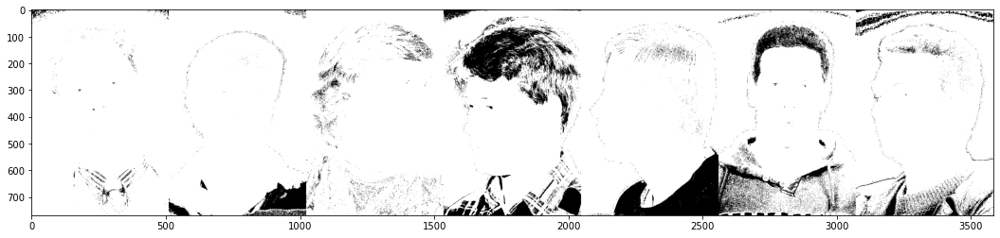

In [14]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (50).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])

MASK = getMask(cv2.cvtColor(cv2.cvtColor(IMAGE,cv2.COLOR_BGR2LAB),cv2.COLOR_BGR2RGB))
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

# For global cost function 2 (the weighted one):

In [15]:
#################################################################################################
# Creating the sets a.k.a the game
#################################################################################################
A = []
B = []
C = []
setV = []
setF = []
for a in ResV.keys():
    for b in ResV[a].keys():
        for c in ResV[a][b].keys():
            setV += [ResV[a][b][c][1]]
            setF += [ResF[a][b][c][1]]
            A += [a];B += [b];C += [c]
            
#################################################################################################
# Trouver l'equilibre
#################################################################################################
JEU = pd.DataFrame({"V": setV, 
                    "F": setF})
mask = paretoset(JEU, sense=["max", "min"])
paretoset_JEU = JEU[mask]
print("Il y a "+str(paretoset_JEU.shape[0])+" optimums de pareto !")
PS = paretoset_JEU.to_numpy()

#### LE MEILLEUR DANS LE SANS QUE la difference entre metric1 et metric2 soit maximale
PS[np.argmax(PS[:,0]-PS[:,1])]
idx = np.array([i for i in range(JEU.shape[0])])[mask][np.argmax(PS[:,0]-PS[:,1])]

bestEPS = A[idx]
bestMinSample = B[idx]
bestTh = C[idx]

print("Le meilleur résultat est ("+str(setV[idx])+", "+str(setF[idx])+") a "+str(idx)+". Pour ("+str(bestEPS)+","+str(bestMinSample)+","+str(bestTh)+")")

#################################################################################################
# Setting our model to the best solution
#################################################################################################
clustering = RES[int(bestEPS)][int(bestMinSample)][float(bestTh)]["Clus"]
nbCluster = clustering.labels_.max()
Clusters = {}
for C in range(nbCluster+1):
    Clus = CLUSTER(C)
    Clus.fit(Points[np.ravel(np.argwhere(clustering.labels_==C))] )
    Clusters[C] = Clus

ELLIPSES = {}
for i in range(256):
    ELLIPSES[i] = []
ELLIPSESFLAT = []

for C in range(nbCluster+1):
    Clus = Clusters[C]
    for v in range(Clus.min,Clus.max+1):
        e = Ellipse(C,Clus.HueMoy(v),Clus.HueEct(v),Clus.SatMoy(v),Clus.SatEct(v),Clus.Theta(v))
        ELLIPSES[v].append(e)
        ELLIPSESFLAT.append(e)

for e in ELLIPSESFLAT:
    e.Th = float(bestTh)
    
#################################################################################################
# Evaluer
#################################################################################################
_=EvaluationGlobale()

Il y a 138 optimums de pareto !
Le meilleur résultat est (0.8249814695659461, 0.17313509224392323) a 295. Pour (2,24,1.1)
97214 338587 0.2871167528582019 108266821 131235458 0.8249814695659461
94456 571621 0.16524235463707596 55246571 319095166 0.17313509224392323


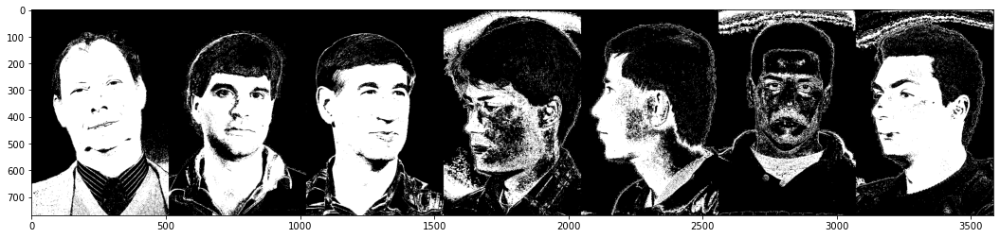

In [16]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])

MASK = getMask(cv2.cvtColor(cv2.cvtColor(IMAGE,cv2.COLOR_BGR2LAB),cv2.COLOR_BGR2RGB))
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

# Algorithme génetique

In [17]:
def setWeights(i,vals):
    j = 0
    for e in ELLIPSES[i]:
        e.Th = vals[j]
        j+=1
def getWeights(i):
    res = []
    for e in ELLIPSES[i]:
        res += [e.Th]
    return res

In [18]:
def Evaluer(Ellips,Points,i):
    P = np.argwhere(Points[:,:,i]!=0)    
    R = np.zeros((P.shape[0],1))
    for e in Ellips:
        R = R + e.are_they_in(P[:,0],P[:,1]).reshape((-1,1))
    R=(R>0).flatten()
    return R.sum()/P.shape[0]

# GA m1 - 1.8 m2

In [31]:
def Evaluation(i):
    return Evaluer(ELLIPSES[i],MasterColors,i) - 1.8*Evaluer(ELLIPSES[i],MasterNonColors,i)
EvaluationGlobale()

desired_output = 0
num_generations = 80
num_parents_mating = 4
sol_per_pop = 8
init_range_low = 0.8
init_range_high = 4.8
parent_selection_type = "sss"
keep_parents = 1
crossover_type = "single_point"
mutation_type = "random"
mutation_percent_genes = 10

for I in range(256):
    function_inputs = getWeights(I)
    num_genes = len(function_inputs)
    if(num_genes<1):
        continue
    def fitness_func(ga_instance, solution, solution_idx):
        setWeights(I,solution)
        return Evaluation(I)

    fitness_function = fitness_func
    
    ga_instance = pygad.GA(num_generations=num_generations,
                                   num_parents_mating=num_parents_mating,
                                   fitness_func=fitness_function,
                                   sol_per_pop=sol_per_pop,
                                   num_genes=num_genes,
                                   init_range_low=init_range_low,
                                   init_range_high=init_range_high,
                                   parent_selection_type=parent_selection_type,
                                   keep_parents=keep_parents,
                                   crossover_type=crossover_type,
                                   mutation_type=mutation_type,
                                   mutation_percent_genes=mutation_percent_genes)

    ga_instance.run()
    
    solution, solution_fitness, solution_idx = ga_instance.best_solution()
    setWeights(I,solution)

EvaluationGlobale()

97214 338587 0.2871167528582019 108266821 131235458 0.8249814695659461
94456 571621 0.16524235463707596 55246571 319095166 0.17313509224392323
76963 338587 0.2273064234598493 99119968 131235458 0.7552834387182159
71522 571621 0.1251213653802082 50601024 319095166 0.1585765921631041


(0.2273064234598493,
 0.1251213653802082,
 0.7552834387182159,
 0.1585765921631041)

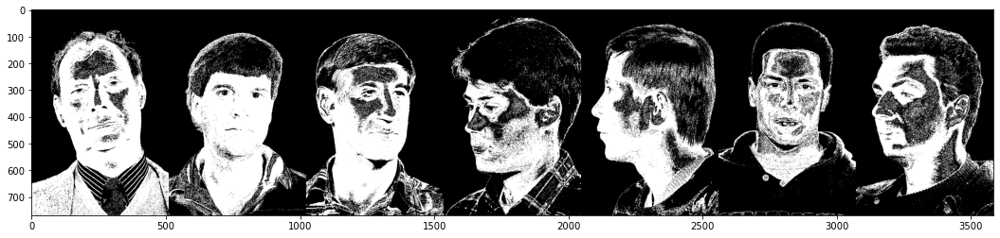

In [32]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])
MASK = getMask(cv2.cvtColor(cv2.cvtColor(IMAGE,cv2.COLOR_BGR2LAB),cv2.COLOR_BGR2RGB))
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

In [33]:
with open('Result GA 1.pkl', 'wb') as f:
    pickle.dump(ELLIPSES, f)

In [30]:
with open('Result GA 1.pkl', 'rb') as f:
    ELLIPSES = pickle.load(f)

In [31]:
%matplotlib qt
import random
 
def color_generator(seed):
    random.seed(seed*20+5)
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    return (r/255, g/255, b/255)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('B')
ax.set_ylabel('A')
ax.set_zlabel('L')

for i in range(256):
    for ELLI in ELLIPSES[i]:
        u=ELLI.HMoy      #x-position of the center
        v=ELLI.SMoy      #y-position of the center
        a=ELLI.Th*ELLI.HEct       #radius on the x-axis
        b=ELLI.Th*ELLI.SEct      #radius on the y-axis
        t_rot=ELLI.thet #rotation angle

        t = np.linspace(0, 2*pi, 100)
        Ell = np.array([a*np.cos(t) , b*np.sin(t)])  
        R_rot = np.array([[cos(t_rot) , -sin(t_rot)],[sin(t_rot) , cos(t_rot)]])  
    #2-D rotation matrix

        Ell_rot = np.zeros((2,Ell.shape[1]))
        for j in range(Ell.shape[1]):
            Ell_rot[:,j] = np.dot(R_rot,Ell[:,j])

        ax.plot( u + Ell_rot[0,:] , v + Ell_rot[1,:],np.ones((Ell_rot[0].shape))*i,color=color_generator(ELLI.cluster) )
plt.show()

# GA with m1-m2

In [24]:
def Evaluation(i):
    return Evaluer(ELLIPSES[i],MasterColors,i)-Evaluer(ELLIPSES[i],MasterNonColors,i)
EvaluationGlobale()

desired_output = 0
num_generations = 80
num_parents_mating = 4
sol_per_pop = 8
init_range_low = 0.8
init_range_high = 4.8
parent_selection_type = "sss"
keep_parents = 1
crossover_type = "single_point"
mutation_type = "random"
mutation_percent_genes = 10

for I in range(256):
    function_inputs = getWeights(I)
    num_genes = len(function_inputs)
    if(num_genes<1):
        continue
    def fitness_func(ga_instance, solution, solution_idx):
        setWeights(I,solution)
        return Evaluation(I)

    fitness_function = fitness_func
    
    ga_instance = pygad.GA(num_generations=num_generations,
                                   num_parents_mating=num_parents_mating,
                                   fitness_func=fitness_function,
                                   sol_per_pop=sol_per_pop,
                                   num_genes=num_genes,
                                   init_range_low=init_range_low,
                                   init_range_high=init_range_high,
                                   parent_selection_type=parent_selection_type,
                                   keep_parents=keep_parents,
                                   crossover_type=crossover_type,
                                   mutation_type=mutation_type,
                                   mutation_percent_genes=mutation_percent_genes)

    ga_instance.run()
    
    solution, solution_fitness, solution_idx = ga_instance.best_solution()
    setWeights(I,solution)

EvaluationGlobale()

97214 338587 0.2871167528582019 108266821 131235458 0.8249814695659461
94456 571621 0.16524235463707596 55246571 319095166 0.17313509224392323
264953 338587 0.7825256138008843 128307483 131235458 0.9776891470901103
277195 571621 0.48492795051266485 147281850 319095166 0.46156089371783215


(0.7825256138008843,
 0.48492795051266485,
 0.9776891470901103,
 0.46156089371783215)

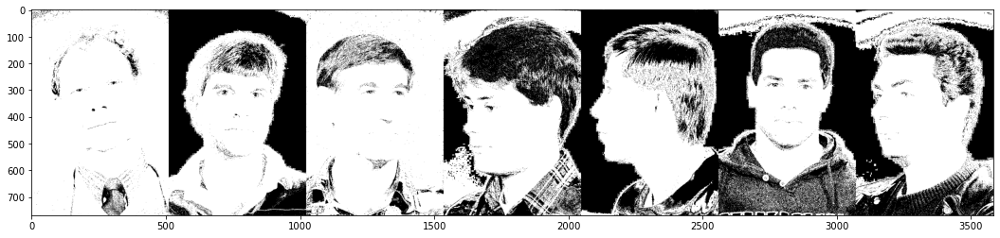

In [36]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])
MASK = getMask(cv2.cvtColor(cv2.cvtColor(IMAGE,cv2.COLOR_BGR2LAB),cv2.COLOR_BGR2RGB))
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

In [25]:
with open('Result GA 2.pkl', 'wb') as f:
    pickle.dump(ELLIPSES, f)

In [34]:
with open('Result GA 2.pkl', 'rb') as f:
    ELLIPSES = pickle.load(f)

# Descente de gradient

In [38]:
def gradient_descent(cost_func, initial_params, learning_rate, num_iterations):
    params = initial_params.copy()  # Make a copy of the initial parameters
    history = []  # Track the cost function value at each iteration

    for _ in range(num_iterations):
        gradient = calculate_gradient(cost_func, params)  # Compute the gradient
        params -= learning_rate * gradient  # Update the parameters
        cost = cost_func(params)  # Compute the cost function
        history.append(cost)  # Store the cost in history

    return params, history

def calculate_gradient(cost_func, params, epsilon=1):
    num_params = len(params)
    gradient = np.zeros(num_params)

    for i in range(num_params):
        # Add a small epsilon to the i-th parameter
        params_plus = params.copy()
        params_plus[i] += epsilon

        # Subtract a small epsilon from the i-th parameter
        params_minus = params.copy()
        params_minus[i] -= epsilon

        # Calculate the partial derivative with respect to the i-th parameter
        gradient[i] = (cost_func(params_plus) - cost_func(params_minus)) / (2 * epsilon)

    return gradient

In [41]:
EvaluationGlobale()

97220 338587 0.28713447356218635 108266880 131235458 0.8249819191395666
94462 571621 0.16525285110239127 55248957 319095166 0.17314256963704677


(0.28713447356218635,
 0.16525285110239127,
 0.8249819191395666,
 0.17314256963704677)

In [42]:
def Evaluation(i):
    return Evaluer(ELLIPSES[i],MasterColors,i) - 1.6*Evaluer(ELLIPSES[i],MasterNonColors,i)

learning_rate = 0.25
num_iterations = 100

for I in range(256):
    def cost_function(params):
        setWeights(I,params)
        return 1-Evaluation(I)
    
    initial_params = getWeights(I)
    if(len(initial_params)==0):
        continue
    print('Iteration '+str(I)+' with '+str(len(initial_params))+' parameters  started at '+str(datetime.datetime.now()))
    optimized_params,hh = gradient_descent(cost_function, initial_params, learning_rate, num_iterations)
    setWeights(I,optimized_params)

Iteration 18 with 1 parameters  started at 2023-05-20 22:50:56.419233
Iteration 19 with 1 parameters  started at 2023-05-20 22:50:57.489566
Iteration 20 with 1 parameters  started at 2023-05-20 22:50:58.581174
Iteration 21 with 1 parameters  started at 2023-05-20 22:50:59.724173
Iteration 25 with 3 parameters  started at 2023-05-20 22:51:00.800530
Iteration 26 with 3 parameters  started at 2023-05-20 22:51:03.661216
Iteration 27 with 3 parameters  started at 2023-05-20 22:51:06.624572
Iteration 28 with 3 parameters  started at 2023-05-20 22:51:09.956380
Iteration 29 with 4 parameters  started at 2023-05-20 22:51:12.904769
Iteration 30 with 4 parameters  started at 2023-05-20 22:51:17.213741
Iteration 31 with 3 parameters  started at 2023-05-20 22:51:21.280830
Iteration 32 with 2 parameters  started at 2023-05-20 22:51:24.215413
Iteration 33 with 2 parameters  started at 2023-05-20 22:51:26.182123
Iteration 34 with 4 parameters  started at 2023-05-20 22:51:28.313236
Iteration 35 with 5 

Iteration 137 with 2 parameters  started at 2023-05-21 00:01:59.512862
Iteration 138 with 1 parameters  started at 2023-05-21 00:02:02.379835
Iteration 139 with 1 parameters  started at 2023-05-21 00:02:03.746919
Iteration 140 with 1 parameters  started at 2023-05-21 00:02:05.111053
Iteration 141 with 1 parameters  started at 2023-05-21 00:02:06.478729
Iteration 142 with 2 parameters  started at 2023-05-21 00:02:07.826118
Iteration 143 with 4 parameters  started at 2023-05-21 00:02:10.672341
Iteration 144 with 4 parameters  started at 2023-05-21 00:02:17.939099
Iteration 145 with 4 parameters  started at 2023-05-21 00:02:25.184074
Iteration 146 with 4 parameters  started at 2023-05-21 00:02:32.465258
Iteration 147 with 2 parameters  started at 2023-05-21 00:02:39.687933
Iteration 148 with 2 parameters  started at 2023-05-21 00:02:42.574224
Iteration 149 with 4 parameters  started at 2023-05-21 00:02:45.418616
Iteration 150 with 3 parameters  started at 2023-05-21 00:02:52.720883
Iterat

Iteration 253 with 1 parameters  started at 2023-05-21 00:08:31.257339
Iteration 254 with 1 parameters  started at 2023-05-21 00:08:32.294918
Iteration 255 with 1 parameters  started at 2023-05-21 00:08:33.303389


In [43]:
EvaluationGlobale()

67396 338587 0.1990507609565636 102575636 131235458 0.7816152552307929
64845 571621 0.11344054889515956 28268617 319095166 0.08858992555217837


(0.1990507609565636,
 0.11344054889515956,
 0.7816152552307929,
 0.08858992555217837)

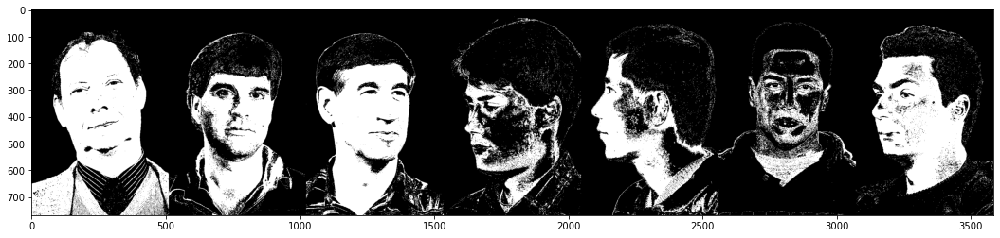

In [44]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])
MASK = getMask(cv2.cvtColor(cv2.cvtColor(IMAGE,cv2.COLOR_BGR2LAB),cv2.COLOR_BGR2RGB))
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

In [45]:
with open('Result GD.pkl', 'wb') as f:
    pickle.dump(ELLIPSES, f)

In [28]:
with open('Result GD.pkl', 'rb') as f:
    ELLIPSES = pickle.load(f)

In [29]:
%matplotlib qt
import random
 
def color_generator(seed):
    random.seed(seed*20+5)
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    return (r/255, g/255, b/255)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('B')
ax.set_ylabel('A')
ax.set_zlabel('L')

for i in range(256):
    for ELLI in ELLIPSES[i]:
        u=ELLI.HMoy      #x-position of the center
        v=ELLI.SMoy      #y-position of the center
        a=ELLI.Th*ELLI.HEct       #radius on the x-axis
        b=ELLI.Th*ELLI.SEct      #radius on the y-axis
        t_rot=ELLI.thet #rotation angle

        t = np.linspace(0, 2*pi, 100)
        Ell = np.array([a*np.cos(t) , b*np.sin(t)])  
        R_rot = np.array([[cos(t_rot) , -sin(t_rot)],[sin(t_rot) , cos(t_rot)]])  
    #2-D rotation matrix

        Ell_rot = np.zeros((2,Ell.shape[1]))
        for j in range(Ell.shape[1]):
            Ell_rot[:,j] = np.dot(R_rot,Ell[:,j])

        ax.plot( u + Ell_rot[0,:] , v + Ell_rot[1,:],np.ones((Ell_rot[0].shape))*i,color=color_generator(ELLI.cluster) )
plt.show()

# Bayesian optimisation

In [24]:
# BlackBox functions
def lesTh(nb):
    res = "Th0"
    for i in range(1,nb):
        res += ",Th"+str(i)
    return res
for i in range(1,35):
    print("def f"+str(i)+"("+lesTh(i)+"):")
    print("\tsetWeights(I,["+lesTh(i)+"])")
    print("\treturn Evaluation(I)")

def f1(Th0):
	setWeights(I,[Th0])
	return Evaluation(I)
def f2(Th0,Th1):
	setWeights(I,[Th0,Th1])
	return Evaluation(I)
def f3(Th0,Th1,Th2):
	setWeights(I,[Th0,Th1,Th2])
	return Evaluation(I)
def f4(Th0,Th1,Th2,Th3):
	setWeights(I,[Th0,Th1,Th2,Th3])
	return Evaluation(I)
def f5(Th0,Th1,Th2,Th3,Th4):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4])
	return Evaluation(I)
def f6(Th0,Th1,Th2,Th3,Th4,Th5):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5])
	return Evaluation(I)
def f7(Th0,Th1,Th2,Th3,Th4,Th5,Th6):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6])
	return Evaluation(I)
def f8(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7])
	return Evaluation(I)
def f9(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8])
	return Evaluation(I)
def f10(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9])
	return Evaluation(I)
def f11(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10):
	setWeights(I,[Th0,Th1,T

In [25]:
def f1(Th0):
	setWeights(I,[Th0])
	return Evaluation(I)
def f2(Th0,Th1):
	setWeights(I,[Th0,Th1])
	return Evaluation(I)
def f3(Th0,Th1,Th2):
	setWeights(I,[Th0,Th1,Th2])
	return Evaluation(I)
def f4(Th0,Th1,Th2,Th3):
	setWeights(I,[Th0,Th1,Th2,Th3])
	return Evaluation(I)
def f5(Th0,Th1,Th2,Th3,Th4):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4])
	return Evaluation(I)
def f6(Th0,Th1,Th2,Th3,Th4,Th5):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5])
	return Evaluation(I)
def f7(Th0,Th1,Th2,Th3,Th4,Th5,Th6):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6])
	return Evaluation(I)
def f8(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7])
	return Evaluation(I)
def f9(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8])
	return Evaluation(I)
def f10(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9])
	return Evaluation(I)
def f11(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10])
	return Evaluation(I)
def f12(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11])
	return Evaluation(I)
def f13(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12])
	return Evaluation(I)
def f14(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13])
	return Evaluation(I)
def f15(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14])
	return Evaluation(I)
def f16(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15])
	return Evaluation(I)
def f17(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16])
	return Evaluation(I)
def f18(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17])
	return Evaluation(I)
def f19(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18])
	return Evaluation(I)
def f20(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19])
	return Evaluation(I)
def f21(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20])
	return Evaluation(I)
def f22(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21])
	return Evaluation(I)
def f23(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22])
	return Evaluation(I)
def f24(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23])
	return Evaluation(I)
def f25(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24])
	return Evaluation(I)
def f26(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25])
	return Evaluation(I)
def f27(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26])
	return Evaluation(I)
def f28(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27])
	return Evaluation(I)
def f29(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28])
	return Evaluation(I)
def f30(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29])
	return Evaluation(I)
def f31(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30])
	return Evaluation(I)
def f32(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31])
	return Evaluation(I)
def f33(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31,Th32):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31,Th32])
	return Evaluation(I)
def f34(Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31,Th32,Th33):
	setWeights(I,[Th0,Th1,Th2,Th3,Th4,Th5,Th6,Th7,Th8,Th9,Th10,Th11,Th12,Th13,Th14,Th15,Th16,Th17,Th18,Th19,Th20,Th21,Th22,Th23,Th24,Th25,Th26,Th27,Th28,Th29,Th30,Th31,Th32,Th33])
	return Evaluation(I)

In [49]:
def getBounds(nb):
    Bounds = {}
    for i in range(nb):
        Bounds['Th'+str(i)] = (0.1,5)
    return Bounds


def Evaluation(i):
    return Evaluer(ELLIPSES[i],MasterColors,i) - 1.6*Evaluer(ELLIPSES[i],MasterNonColors,i)

In [50]:
EvaluationGlobale()

97214 338587 0.2871167528582019 108266821 131235458 0.8249814695659461
94456 571621 0.16524235463707596 55246571 319095166 0.17313509224392323


(0.2871167528582019,
 0.16524235463707596,
 0.8249814695659461,
 0.17313509224392323)

In [54]:
for I in range(256):
    NB = len(ELLIPSES[I])
    if(NB==0):
        continue

    black_box_function = globals()["f"+str(NB)]

    # Bounded region of parameter space
    pbounds = getBounds(NB) #{'x': (2, 4), 'y': (-3, 3)}

    optimizer = BayesianOptimization(
        f=black_box_function,
        pbounds=pbounds,
        random_state=1,
        allow_duplicate_points=True
    )


    optimizer.maximize(
        init_points=20,
        n_iter=100,
    )

    print(optimizer.max)
    setWeights(I, list(optimizer.max['params'].values()))


|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | 0.0       | 2.143     |
| 2         | 0.0       | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | 0.0       | 1.581     |
| 5         | 0.0       | 0.8191    |
| 6         | 0.0       | 0.5525    |
| 7         | 0.0       | 1.013     |
| 8         | 0.0       | 1.793     |
| 9         | 0.0       | 2.044     |
| 10        | 0.0       | 2.74      |
| 11        | 0.0       | 2.154     |
| 12        | 0.0       | 3.458     |
| 13        | 0.0       | 1.102     |
| 14        | 0.0       | 4.403     |
| 15        | 0.0       | 0.2342    |
| 16        | 0.0       | 3.385     |
| 17        | 0.0       | 2.145     |
| 18        | 0.0       | 2.838     |
| 19        | 0.0       | 0.7879    |
| 20        | 0.0       | 1.071     |
| 21        | 0.0       | 4.999     |
| 22        | 0.0       | 5.0       |
| 23        | 0.0       | 4.999     |
| 24        | 0.0       | 5.0       |
| 25        

| 21        | 0.0       | 0.3983    |
| 22        | 0.0       | 0.4776    |
| 23        | 0.0       | 0.1592    |
| 24        | 0.0       | 0.6569    |
| 25        | 0.0       | 0.3163    |
| 26        | 0.0       | 0.6077    |
| 27        | 0.0       | 0.7178    |
| 28        | 0.0       | 0.2754    |
| 29        | 0.0       | 0.4374    |
| 30        | 0.0       | 0.1269    |
| 31        | 0.0       | 0.357     |
| 32        | 0.0       | 0.515     |
| 33        | 0.0       | 0.1967    |
| 34        | 0.0       | 0.6875    |
| 35        | 0.0       | 0.7548    |
| 36        | 0.0       | 0.7984    |
| 37        | 0.0       | 0.5793    |
| 38        | 0.0       | 0.6324    |
| 39        | 0.0       | 0.1       |
| 40        | 0.0       | 0.3779    |
| 41        | 0.0       | 0.255     |
| 42        | 0.0       | 0.2973    |
| 43        | 0.0       | 0.4576    |
| 44        | 0.0       | 0.3371    |
| 45        | 0.0       | 0.418     |
| 46        | 0.0       | 0.1775    |
| 47        

| 33        | -0.000118 | 0.4758    |
| 34        | 0.0       | 0.2338    |
| 35        | -0.000709 | 1.69      |
| 36        | -0.000236 | 0.9137    |
| 37        | -0.000118 | 0.7105    |
| 38        | 0.0       | 0.1992    |
| 39        | 0.0       | 0.1266    |
| 40        | -0.000118 | 0.601     |
| 41        | 0.0       | 0.2703    |
| 42        | 0.0       | 0.2538    |
| 43        | -0.000118 | 0.4353    |
| 44        | 0.0       | 0.181     |
| 45        | 0.0       | 0.2342    |
| 46        | 0.0       | 0.1443    |
| 47        | 0.0       | 0.1128    |
| 48        | 0.0       | 0.2147    |
| 49        | 0.0       | 0.1       |
| 50        | 0.0       | 0.2586    |
| 51        | 0.0       | 0.1719    |
| 52        | 0.0       | 0.1511    |
| 53        | 0.0       | 0.1913    |
| 54        | 0.0       | 0.1334    |
| 55        | 0.0       | 0.1126    |
| 56        | 0.0       | 0.2163    |
| 57        | 0.0       | 0.2755    |
| 58        | 0.0       | 0.2642    |
| 59        

| 43        | -0.000128 | 0.6311    |
| 44        | -0.000128 | 0.9878    |
| 45        | -0.000128 | 0.8446    |
| 46        | -0.000128 | 0.5786    |
| 47        | -0.000128 | 0.8946    |
| 48        | -0.000128 | 1.041     |
| 49        | -0.000128 | 0.942     |
| 50        | -0.000128 | 0.5312    |
| 51        | -0.000128 | 0.3354    |
| 52        | -0.000128 | 0.2549    |
| 53        | -0.000128 | 0.2952    |
| 54        | -0.000128 | 0.4907    |
| 55        | -0.000128 | 0.376     |
| 56        | -0.000128 | 0.4518    |
| 57        | -0.000128 | 0.1       |
| 58        | -0.000128 | 0.4153    |
| 59        | -0.000128 | 0.1789    |
| 60        | -0.000128 | 0.216     |
| 61        | -0.000128 | 0.7701    |
| 62        | -0.000128 | 1.085     |
| 63        | -0.000128 | 0.7339    |
| 64        | -0.000128 | 0.121     |
| 65        | -0.000128 | 0.1467    |
| 66        | -0.000128 | 0.8051    |
| 67        | -0.000128 | 0.6728    |
| 68        | -0.000128 | 0.7025    |
| 69        

| 33        | 0.0       | 0.1351    | 1.633     | 2.972     |
| 34        | 0.0       | 0.1435    | 1.423     | 1.183     |
| 35        | 0.0       | 0.1       | 3.438     | 5.0       |
| 36        | 0.0       | 0.1       | 0.1       | 3.513     |
| 37        | -0.000563 | 1.16      | 5.0       | 3.649     |
| 38        | 0.0       | 0.1       | 4.128     | 3.698     |
| 39        | -0.000563 | 1.406     | 0.1       | 1.94      |
| 40        | 0.0       | 0.1       | 0.1       | 5.0       |
| 41        | 0.0       | 0.105     | 3.736     | 0.1504    |
| 42        | -0.000751 | 1.507     | 2.209     | 0.1403    |
| 43        | -0.03591  | 5.0       | 5.0       | 5.0       |
| 44        | -0.002628 | 2.472     | 3.965     | 3.471     |
| 45        | 0.0       | 0.1       | 1.188     | 0.1       |
| 46        | -0.000938 | 1.676     | 1.479     | 5.0       |
| 47        | -0.000187 | 0.888     | 4.275     | 4.75      |
| 48        | 0.0       | 0.1       | 2.833     | 2.781     |
| 49    

| 114       | -0.000187 | 0.8764    | 3.458     | 1.571     |
| 115       | -0.000187 | 0.7233    | 3.789     | 3.244     |
| 116       | 0.0       | 0.1       | 5.0       | 3.286     |
| 117       | 0.0       | 0.511     | 4.643     | 1.169     |
| 118       | 0.0       | 0.1809    | 2.764     | 1.594     |
| 119       | 0.0       | 0.4517    | 1.49      | 2.115     |
| 120       | 0.0       | 0.1218    | 2.423     | 3.212     |
{'target': 0.0, 'params': {'Th0': 0.2913684378411236, 'Th1': 0.9321690558663877, 'Th2': 4.402898266804124}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |
-------------------------------------------------------------
| 1         | 0.008672  | 2.143     | 3.63      | 0.1006    |
| 2         | 0.002836  | 1.581     | 0.8191    | 0.5525    |
| 3         | 0.01503   | 1.013     | 1.793     | 2.044     |
| 4         | 0.01159   | 2.74      | 2.154     | 3.458     |
| 5         | 0.01187   | 1.102     | 4.403     | 0.2342    |
| 6         | 0.005313  

| 73        | 0.02403   | 0.1       | 4.138     | 4.851     |
| 74        | 0.02406   | 0.4487    | 4.056     | 4.376     |
| 75        | 0.02382   | 1.923     | 4.546     | 4.725     |
| 76        | 0.02382   | 1.816     | 4.112     | 5.0       |
| 77        | 0.024     | 0.7245    | 5.0       | 4.378     |
| 78        | 0.024     | 0.9483    | 4.602     | 4.143     |
| 79        | 0.02406   | 0.133     | 4.902     | 4.042     |
| 80        | 0.02393   | 1.432     | 4.123     | 4.395     |
| 81        | 0.024     | 0.3794    | 4.807     | 5.0       |
| 82        | 0.02395   | 1.105     | 4.191     | 4.983     |
| 83        | 0.02393   | 1.127     | 4.891     | 4.747     |
| 84        | 0.02403   | 0.768     | 4.257     | 4.511     |
| 85        | 0.02398   | 1.098     | 3.996     | 4.573     |
| 86        | 0.02401   | 0.292     | 5.0       | 4.137     |
| 87        | 0.02372   | 2.21      | 5.0       | 4.741     |
| 88        | 0.02406   | 0.1       | 4.701     | 4.26      |
| 89    

| 32        | -0.000243 | 1.506     | 5.0       | 5.0       |
| 33        | 0.005807  | 0.306     | 0.1236    | 4.991     |
| 34        | -0.001915 | 1.258     | 2.51      | 0.9408    |
| 35        | 0.002356  | 0.1       | 3.712     | 0.1       |
| 36        | 0.005533  | 0.9451    | 0.8911    | 5.0       |
| 37        | -0.003488 | 2.055     | 2.025     | 2.454     |
| 38        | 0.0008702 | 0.1       | 1.799     | 2.731     |
| 39        | -0.004769 | 0.1       | 5.0       | 0.1       |
| 40        | -0.01061  | 2.985     | 0.1       | 0.1       |
| 41        | 0.002014  | 1.037     | 0.1294    | 4.052     |
| 42        | -0.00342  | 0.7558    | 4.961     | 3.886     |
| 43        | 0.003089  | 1.074     | 2.904     | 5.0       |
| 44        | 0.002816  | 0.7303    | 4.176     | 5.0       |
| 45        | -0.003401 | 1.001     | 0.9431    | 2.614     |
| 46        | 0.005601  | 0.7617    | 0.1868    | 4.9       |
| 47        | -0.000273 | 0.1       | 1.129     | 0.1       |
| 48    

| 113       | 0.005601  | 0.7747    | 0.2832    | 4.999     |
| 114       | 0.003089  | 0.7786    | 3.526     | 5.0       |
| 115       | 0.0001862 | 0.1       | 3.908     | 1.697     |
| 116       | 0.005601  | 0.5428    | 1.99      | 5.0       |
| 117       | 0.0003041 | 0.7862    | 5.0       | 5.0       |
| 118       | 0.005807  | 0.3039    | 0.7801    | 5.0       |
| 119       | 0.00174   | 0.5159    | 0.1542    | 4.814     |
| 120       | -0.07578  | 5.0       | 5.0       | 5.0       |
{'target': 0.005806536972362782, 'params': {'Th0': 0.30603276674331975, 'Th1': 0.12364548860557713, 'Th2': 4.9908051005199}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |
-------------------------------------------------------------
| 1         | -0.002932 | 2.143     | 3.63      | 0.1006    |
| 2         | -0.001585 | 1.581     | 0.8191    | 0.5525    |
| 3         | 0.007271  | 1.013     | 1.793     | 2.044     |
| 4         | -0.006517 | 2.74      | 2.154     | 3.458     |
| 5    

| 70        | -5.918e-0 | 2.456     | 0.1584    | 4.58      |
| 71        | 0.01294   | 0.1017    | 4.242     | 3.482     |
| 72        | 0.01022   | 0.146     | 3.306     | 3.427     |
| 73        | 0.01294   | 0.1       | 4.587     | 3.868     |
| 74        | 0.01373   | 0.1       | 0.1       | 4.26      |
| 75        | 0.01333   | 0.4644    | 2.08      | 3.025     |
| 76        | 0.01381   | 0.1       | 0.914     | 3.714     |
| 77        | 0.01294   | 0.3892    | 4.647     | 3.579     |
| 78        | 0.01341   | 0.7319    | 1.408     | 3.804     |
| 79        | 0.01262   | 1.253     | 1.35      | 3.997     |
| 80        | 0.01333   | 0.9662    | 0.5935    | 3.769     |
| 81        | 0.01317   | 0.5282    | 1.646     | 3.13      |
| 82        | 0.01159   | 1.558     | 4.58      | 3.411     |
| 83        | 0.01333   | 0.1       | 2.132     | 3.256     |
| 84        | 0.01333   | 0.1       | 2.536     | 3.907     |
| 85        | 0.01317   | 0.6002    | 2.356     | 3.874     |
| 86    

| 23        | 0.0       | 0.4088    | 0.1       | 0.1       | 0.1411    |
| 24        | -0.002695 | 2.286     | 0.1       | 0.1       | 0.8186    |
| 25        | -0.001198 | 0.1       | 2.485     | 0.1       | 0.1       |
| 26        | 0.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 27        | -0.001048 | 0.1       | 2.011     | 0.8352    | 5.0       |
| 28        | -0.003743 | 2.423     | 2.922     | 0.1       | 5.0       |
| 29        | 0.0       | 0.1       | 0.1       | 0.1       | 2.768     |
| 30        | -0.000898 | 0.2253    | 0.1376    | 1.989     | 4.702     |
| 31        | -0.01204  | 5.0       | 0.1       | 0.1       | 0.1       |
| 32        | -0.01536  | 0.1       | 5.0       | 1.155     | 0.1       |
| 33        | -0.000449 | 0.1       | 1.01      | 0.9681    | 3.717     |
| 34        | -0.001497 | 1.227     | 1.411     | 0.1       | 0.1       |
| 35        | -0.001796 | 1.603     | 0.1       | 0.8197    | 5.0       |
| 36        | -0.01204  | 5.0       | 

| 91        | -0.000149 | 0.1       | 0.5805    | 0.1       | 1.919     |
| 92        | -0.000898 | 0.1       | 1.942     | 0.6503    | 0.1       |
| 93        | -0.001198 | 0.1       | 2.537     | 0.1       | 1.116     |
| 94        | -0.000149 | 0.5084    | 0.5707    | 0.7599    | 0.1       |
| 95        | 0.0       | 0.1       | 0.1       | 0.5404    | 4.671     |
| 96        | -0.000748 | 0.5517    | 1.306     | 0.1       | 3.046     |
| 97        | 0.0       | 0.1       | 0.3837    | 0.1       | 0.5313    |
| 98        | 0.0       | 0.4437    | 0.3864    | 0.5105    | 2.435     |
| 99        | -0.001198 | 0.1       | 1.334     | 1.72      | 4.558     |
| 100       | -0.000149 | 0.1       | 0.5214    | 0.7294    | 1.586     |
| 101       | -0.000149 | 0.1       | 0.1       | 0.8923    | 2.644     |
| 102       | 0.0       | 0.4811    | 0.3155    | 0.5013    | 5.0       |
| 103       | -0.000299 | 0.5021    | 0.731     | 1.044     | 3.011     |
| 104       | -0.000149 | 0.1       | 

| 36        | -0.02604  | 0.1       | 0.1       | 5.0       | 5.0       |
| 37        | -0.000175 | 5.0       | 0.1       | 2.297     | 0.1       |
| 38        | 0.001962  | 4.122     | 4.455     | 2.663     | 1.333     |
| 39        | 0.0102    | 0.1       | 5.0       | 0.1       | 0.1       |
| 40        | -0.000475 | 0.7803    | 3.474     | 0.1466    | 0.1072    |
| 41        | 0.0102    | 1.813     | 4.983     | 0.2493    | 0.2314    |
| 42        | 0.0102    | 2.11      | 5.0       | 1.81      | 0.1       |
| 43        | 0.01015   | 2.445     | 5.0       | 1.627     | 1.389     |
| 44        | -0.02358  | 0.1       | 5.0       | 5.0       | 5.0       |
| 45        | -0.000125 | 5.0       | 0.1       | 0.1       | 1.547     |
| 46        | -0.009063 | 5.0       | 0.1       | 5.0       | 1.7       |
| 47        | 0.007361  | 0.1       | 5.0       | 3.847     | 0.1       |
| 48        | 0.0102    | 0.5814    | 4.997     | 1.027     | 0.4708    |
| 49        | 0.0102    | 0.1       | 

| 104       | 0.01015   | 2.95      | 5.0       | 0.7407    | 1.297     |
| 105       | 0.0102    | 1.282     | 5.0       | 1.393     | 0.1       |
| 106       | 0.0102    | 2.563     | 5.0       | 1.569     | 0.4466    |
| 107       | 0.0102    | 0.1       | 5.0       | 2.56      | 0.6584    |
| 108       | 0.01017   | 0.1       | 5.0       | 0.8175    | 1.045     |
| 109       | 0.01017   | 0.7216    | 5.0       | 0.1       | 1.044     |
| 110       | 0.01015   | 1.527     | 5.0       | 1.922     | 1.476     |
| 111       | 0.0102    | 5.0       | 5.0       | 0.9935    | 0.6627    |
| 112       | 0.0102    | 5.0       | 5.0       | 0.1       | 0.5381    |
| 113       | 0.007361  | 0.1       | 5.0       | 3.213     | 0.8461    |
| 114       | 0.0102    | 0.5919    | 5.0       | 2.625     | 0.1       |
| 115       | 0.0102    | 4.075     | 5.0       | 2.144     | 0.1       |
| 116       | -0.01183  | 0.1       | 0.1       | 5.0       | 0.1       |
| 117       | 0.01017   | 0.5857    | 

| 59        | -0.000298 | 0.7498    | 5.0       | 0.1       |
| 60        | -0.000149 | 0.2314    | 4.523     | 0.191     |
| 61        | -0.000149 | 0.1       | 3.049     | 0.1       |
| 62        | -0.000298 | 0.4658    | 1.229     | 0.6439    |
| 63        | -0.000745 | 0.2289    | 0.9671    | 1.678     |
| 64        | -0.001193 | 2.401     | 2.389     | 0.1538    |
| 65        | -0.000149 | 0.1       | 2.404     | 0.8713    |
| 66        | -0.000298 | 0.6466    | 0.1152    | 1.199     |
| 67        | -0.000298 | 0.5734    | 4.537     | 1.023     |
| 68        | -0.000298 | 0.471     | 5.0       | 0.5079    |
| 69        | -0.000149 | 0.4304    | 2.461     | 0.3818    |
| 70        | -0.000149 | 0.2004    | 1.706     | 0.1       |
| 71        | -0.000149 | 0.1       | 0.525     | 0.347     |
| 72        | -0.000298 | 0.778     | 2.285     | 0.1       |
| 73        | -0.000298 | 0.6803    | 2.946     | 0.7601    |
| 74        | -0.000149 | 0.1       | 4.279     | 0.1       |
| 75    

| 22        | -0.000982 | 2.298     | 0.1       |
| 23        | -0.000491 | 1.584     | 5.0       |
| 24        | 0.0       | 0.1       | 4.398     |
| 25        | 0.0       | 0.1       | 0.6832    |
| 26        | 0.0       | 0.1       | 0.1       |
| 27        | 0.0       | 0.1       | 2.298     |
| 28        | 0.0       | 0.1       | 3.934     |
| 29        | -0.005624 | 5.0       | 0.1       |
| 30        | 0.0       | 0.1       | 1.956     |
| 31        | 0.0       | 0.1       | 1.109     |
| 32        | -9.827e-0 | 0.557     | 3.813     |
| 33        | 0.0       | 0.167     | 4.739     |
| 34        | 0.0       | 0.1       | 0.3487    |
| 35        | 0.0       | 0.1027    | 4.724     |
| 36        | -9.827e-0 | 0.5298    | 4.998     |
| 37        | -9.827e-0 | 0.3488    | 1.696     |
| 38        | -0.000687 | 1.804     | 1.189     |
| 39        | -0.000196 | 1.078     | 0.1       |
| 40        | -9.827e-0 | 0.257     | 4.088     |
| 41        | 0.0       | 0.1161    | 3.651     |


| 22        | 0.005867  | 1.013     | 4.923     |
| 23        | 0.004512  | 0.8316    | 3.181     |
| 24        | 0.006243  | 1.083     | 4.405     |
| 25        | 0.006092  | 0.2229    | 4.785     |
| 26        | 0.005341  | 1.826     | 4.934     |
| 27        | 0.00504   | 2.901     | 4.872     |
| 28        | 0.001919  | 3.617     | 3.436     |
| 29        | -0.002255 | 5.0       | 0.1       |
| 30        | 0.003798  | 0.8274    | 2.093     |
| 31        | 0.005038  | 0.1       | 2.505     |
| 32        | -0.000676 | 2.614     | 0.1       |
| 33        | 0.003612  | 4.949     | 4.987     |
| 34        | 0.004439  | 4.03      | 4.842     |
| 35        | 0.005566  | 2.844     | 4.266     |
| 36        | 0.006318  | 0.1054    | 4.374     |
| 37        | 0.001732  | 5.0       | 3.794     |
| 38        | 0.005566  | 2.269     | 4.552     |
| 39        | 0.0002271 | 4.985     | 1.708     |
| 40        | 0.003836  | 0.9077    | 3.905     |
| 41        | 0.005716  | 1.684     | 4.493     |


| 1         | 0.002591  | 2.143     | 3.63      | 0.1006    | 1.581     |
| 2         | 0.0       | 0.8191    | 0.5525    | 1.013     | 1.793     |
| 3         | 0.004947  | 2.044     | 2.74      | 2.154     | 3.458     |
| 4         | 0.0002259 | 1.102     | 4.403     | 0.2342    | 3.385     |
| 5         | 0.004967  | 2.145     | 2.838     | 0.7879    | 1.071     |
| 6         | 0.002674  | 4.024     | 4.844     | 1.636     | 3.492     |
| 7         | 0.0002361 | 4.394     | 4.484     | 0.5167    | 0.2914    |
| 8         | 0.0002259 | 0.9322    | 4.403     | 0.5819    | 2.163     |
| 9         | 0.004947  | 4.794     | 2.713     | 3.49      | 1.646     |
| 10        | 0.0002156 | 3.464     | 4.19      | 0.1896    | 3.776     |
| 11        | 0.002602  | 4.945     | 3.766     | 1.474     | 3.967     |
| 12        | 0.004947  | 0.6058    | 2.295     | 4.552     | 1.539     |
| 13        | 1.027e-05 | 1.51      | 0.7371    | 0.1949    | 3.426     |
| 14        | 0.002479  | 1.137     | 

| 69        | 0.004947  | 0.1       | 2.499     | 0.1       | 5.0       |
| 70        | 0.002581  | 0.1       | 3.387     | 5.0       | 0.1       |
| 71        | 0.004947  | 1.167     | 2.697     | 4.021     | 5.0       |
| 72        | 0.004998  | 4.205     | 3.334     | 2.549     | 2.104     |
| 73        | 0.004967  | 1.014     | 2.836     | 5.0       | 4.604     |
| 74        | 0.004947  | 1.232     | 2.558     | 0.9193    | 5.0       |
| 75        | 0.004998  | 3.221     | 3.224     | 5.0       | 1.046     |
| 76        | 0.004947  | 0.1       | 2.513     | 0.8456    | 3.908     |
| 77        | 0.004947  | 0.1       | 2.44      | 1.936     | 2.431     |
| 78        | 0.004988  | 3.264     | 3.047     | 3.33      | 1.616     |
| 79        | 0.004947  | 0.1       | 2.525     | 1.061     | 0.1       |
| 80        | 0.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 81        | 0.004947  | 1.088     | 2.553     | 0.5978    | 1.029     |
| 82        | 0.004978  | 2.521     | 

| 21        | 0.0181    | 0.1       | 2.278     | 2.657     | 5.0       | 5.0       |
| 22        | 0.01542   | 0.1       | 5.0       | 5.0       | 5.0       | 3.339     |
| 23        | 0.01583   | 0.1       | 2.371     | 2.307     | 5.0       | 2.269     |
| 24        | 0.01571   | 0.1       | 5.0       | 4.025     | 1.892     | 5.0       |
| 25        | 0.01834   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 26        | 0.01834   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 27        | 0.01079   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 28        | 0.01079   | 0.1       | 5.0       | 5.0       | 0.1       | 1.181     |
| 29        | 0.02069   | 1.351     | 2.769     | 0.3905    | 5.0       | 4.184     |
| 30        | 0.01079   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 31        | 0.02037   | 1.483     | 4.212     | 3.106     | 5.0       | 4.533     |
| 32        | 0.01394   | 0.1       | 5.0       | 0.1 

| 79        | 0.01816   | 0.8377    | 0.1       | 3.33      | 3.45      | 4.267     |
| 80        | 0.02028   | 1.326     | 1.079     | 3.88      | 5.0       | 4.027     |
| 81        | 0.02078   | 0.8258    | 2.31      | 0.5025    | 5.0       | 3.563     |
| 82        | 0.02087   | 0.1       | 1.643     | 0.1       | 4.188     | 3.687     |
| 83        | 0.01792   | 1.007     | 5.0       | 3.729     | 5.0       | 5.0       |
| 84        | 0.02072   | 0.6637    | 5.0       | 0.9852    | 4.56      | 3.763     |
| 85        | 0.02069   | 0.9561    | 0.1       | 1.498     | 4.202     | 3.23      |
| 86        | 0.02052   | 1.404     | 2.826     | 1.785     | 4.178     | 3.368     |
| 87        | 0.02081   | 0.4396    | 0.5051    | 0.7049    | 4.468     | 3.755     |
| 88        | 0.02081   | 0.1       | 1.756     | 0.1       | 5.0       | 4.145     |
| 89        | 0.02087   | 0.1       | 3.467     | 0.1       | 4.063     | 3.647     |
| 90        | 0.02034   | 0.9112    | 2.191     | 3.76

| 21        | 0.02384   | 0.1       | 1.784     | 2.827     | 5.0       | 5.0       |
| 22        | 0.01527   | 0.1       | 4.553     | 5.0       | 5.0       | 5.0       |
| 23        | 0.02013   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 24        | 0.02263   | 0.1       | 1.52      | 0.1       | 5.0       | 2.671     |
| 25        | 0.02384   | 0.1       | 0.1       | 5.0       | 5.0       | 2.275     |
| 26        | 0.01963   | 0.1       | 3.769     | 0.1       | 5.0       | 5.0       |
| 27        | 0.02379   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 28        | 0.007439  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 29        | 0.02252   | 0.1       | 2.358     | 2.778     | 5.0       | 2.67      |
| 30        | 0.02397   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 31        | 0.01859   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 32        | 0.02397   | 0.1       | 0.1       | 2.45

| 79        | 0.007684  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 80        | 0.02107   | 0.1       | 1.197     | 5.0       | 5.0       | 1.059     |
| 81        | 0.021     | 0.875     | 2.961     | 5.0       | 3.537     | 5.0       |
| 82        | 0.02004   | 0.1       | 2.029     | 5.0       | 0.1       | 5.0       |
| 83        | 0.02227   | 1.975     | 1.348     | 5.0       | 5.0       | 3.448     |
| 84        | 0.00841   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 85        | 0.02526   | 1.139     | 2.304     | 0.1       | 5.0       | 3.701     |
| 86        | 0.02132   | 0.8484    | 1.515     | 0.1       | 4.242     | 4.062     |
| 87        | 0.02024   | 0.1       | 1.103     | 1.57      | 1.798     | 5.0       |
| 88        | 0.0226    | 1.373     | 0.1       | 0.1       | 5.0       | 2.14      |
| 89        | 0.02378   | 1.199     | 2.684     | 0.1       | 5.0       | 5.0       |
| 90        | 0.02252   | 1.279     | 2.22      | 0.1 

| 21        | 0.02376   | 0.1       | 0.1       | 0.1       | 3.95      | 0.7733    | 5.0       | 5.0       |
| 22        | 0.02131   | 0.1       | 0.1       | 0.1       | 1.222     | 5.0       | 5.0       | 4.355     |
| 23        | 0.02095   | 0.1       | 0.1       | 0.1       | 4.996     | 0.1       | 5.0       | 0.3236    |
| 24        | 0.0007131 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 25        | 0.0234    | 0.1       | 1.667     | 0.1       | 3.076     | 3.014     | 5.0       | 2.02      |
| 26        | 0.02376   | 0.1       | 3.052     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 27        | 0.02376   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 28        | 0.02028   | 2.312     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 29        | 0.02095   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 30      

| 67        | 0.0234    | 0.1       | 2.233     | 0.1       | 5.0       | 5.0       | 5.0       | 3.067     |
| 68        | 0.0234    | 0.1       | 5.0       | 0.1       | 5.0       | 2.512     | 5.0       | 3.405     |
| 69        | 0.02202   | 0.1       | 0.1       | 1.953     | 2.667     | 5.0       | 5.0       | 3.103     |
| 70        | 0.02166   | 1.613     | 0.1       | 0.1       | 1.51      | 1.297     | 5.0       | 2.477     |
| 71        | 0.02238   | 0.1       | 5.0       | 2.128     | 1.959     | 0.1       | 5.0       | 5.0       |
| 72        | 0.01929   | 0.1       | 1.733     | 0.1       | 0.1       | 5.0       | 3.221     | 2.651     |
| 73        | 0.02293   | 1.055     | 1.065     | 1.109     | 0.1       | 1.674     | 3.793     | 3.664     |
| 74        | 0.02807   | 0.1       | 3.111     | 0.1       | 2.773     | 0.1       | 4.436     | 5.0       |
| 75        | 0.0234    | 0.1       | 3.962     | 0.1       | 2.68      | 0.1       | 5.0       | 3.478     |
| 76      

| 112       | 0.01131   | 0.1       | 0.1       | 3.896     | 2.107     | 5.0       | 5.0       | 5.0       |
| 113       | 0.02412   | 0.1       | 0.1       | 1.642     | 0.1       | 3.585     | 5.0       | 2.811     |
| 114       | 0.02317   | 0.1       | 1.711     | 1.762     | 0.1       | 5.0       | 3.574     | 5.0       |
| 115       | 0.02783   | 0.2659    | 4.053     | 1.348     | 2.21      | 4.579     | 3.907     | 5.0       |
| 116       | 0.0289    | 1.425     | 2.734     | 1.387     | 2.281     | 3.873     | 4.098     | 5.0       |
| 117       | 0.02447   | 0.1       | 5.0       | 1.634     | 0.1       | 5.0       | 5.0       | 5.0       |
| 118       | 0.02447   | 1.116     | 3.598     | 1.345     | 1.358     | 5.0       | 5.0       | 5.0       |
| 119       | 0.0204    | 2.463     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 120       | 0.02024   | 0.1       | 0.1       | 1.75      | 0.1       | 5.0       | 2.735     | 5.0       |
{'target':

| 28        | 0.001282  | 0.1       | 0.1       | 0.7046    | 5.0       | 5.0       | 0.1       | 0.1       | 2.014     | 5.0       |
| 29        | 0.00633   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 4.834     | 2.565     | 5.0       | 5.0       |
| 30        | 0.006486  | 0.1       | 0.1       | 0.1       | 1.558     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 31        | 0.003595  | 1.741     | 0.1       | 0.1       | 2.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 32        | 0.004957  | 0.4637    | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 1.116     |
| 33        | 0.004953  | 1.091     | 0.1       | 0.1       | 5.0       | 1.153     | 5.0       | 5.0       | 5.0       | 5.0       |
| 34        | 0.0008489 | 0.1       | 4.51      | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 35        | -0.005485 | 0.1       | 5.0       | 0.1       | 

| 65        | 0.006486  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 66        | -0.005485 | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 67        | -0.00577  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 68        | -0.005652 | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 69        | 0.006486  | 0.1       | 0.1       | 0.1       | 1.257     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 70        | 0.006463  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 71        | 0.00644   | 0.1       | 0.1       | 0.1       | 2.939     | 5.0       | 2.573     | 2.448     | 5.0       | 0.1       |
| 72        | 0.006478  | 0.1       | 0.1       | 0.1       | 

| 102       | 0.005078  | 0.1       | 3.241     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 103       | 0.006486  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 2.659     | 5.0       | 5.0       |
| 104       | 0.006463  | 0.1       | 0.1       | 0.1       | 2.916     | 5.0       | 0.1       | 5.0       | 5.0       | 2.894     |
| 105       | 0.006486  | 0.1       | 0.1       | 0.1       | 2.794     | 3.025     | 0.1       | 0.1       | 5.0       | 0.1       |
| 106       | -0.000170 | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 107       | -0.000186 | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 1.1       | 0.1       |
| 108       | 0.00641   | 0.1       | 0.1       | 0.1       | 0.1       | 2.8       | 2.76      | 5.0       | 5.0       | 0.1       |
| 109       | -0.005603 | 0.1       | 5.0       | 0.1       | 

| 21        | 0.0009363 | 2.666     | 0.1       | 5.0       | 4.493     | 0.1       | 1.7       | 0.1       | 0.1       | 5.0       | 2.353     | 0.1       | 2.128     |
| 22        | 0.0005685 | 0.1       | 0.1       | 2.529     | 5.0       | 0.1       | 0.1       | 3.389     | 1.584     | 0.3584    | 5.0       | 0.1       | 0.1       |
| 23        | -0.006548 | 0.1       | 4.025     | 1.654     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 24        | 0.0001003 | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.9242    | 1.094     | 0.1       | 5.0       | 5.0       | 0.1       | 0.5439    |
| 25        | 0.0006019 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 1.077     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 26        | 0.0005685 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 2.703     | 0.1 

| 50        | 0.0005867 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 51        | 0.00117   | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 1.631     | 5.0       |
| 52        | 0.002508  | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 2.871     | 5.0       |
| 53        | 0.001572  | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 54        | 0.001605  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 3.471     | 0.1       |
| 55        | 5.168e-05 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0 

| 80        | -0.000215 | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 81        | 0.0006688 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 1.4       | 3.136     | 0.1       | 0.1       | 0.1       | 0.1       |
| 82        | 0.00117   | 5.0       | 1.18      | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 83        | 0.001538  | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 84        | 0.001037  | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 3.387     | 0.1       |
| 85        | 0.0005867 | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0 

| 110       | 0.00204   | 1.161     | 0.1       | 5.0       | 5.0       | 0.1       | 2.724     | 5.0       | 2.172     | 1.659     | 1.756     | 2.689     | 2.817     |
| 111       | 0.001572  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 112       | 0.002006  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 3.466     | 5.0       |
| 113       | 0.001605  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.495     | 0.1       | 0.1       | 0.1       | 3.985     | 5.0       |
| 114       | 0.001538  | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 4.567     | 5.0       | 5.0       | 0.1       | 5.0       |
| 115       | 0.0005867 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0 

| 21        | 0.0009974 | 0.1       | 0.1       | 2.071     | 3.846     | 3.618     | 1.066     | 5.0       | 3.868     | 0.8082    | 2.447     | 2.327     | 2.983     | 3.942     | 3.449     |
| 22        | 0.002965  | 0.1       | 0.1       | 2.615     | 4.873     | 5.0       | 2.841     | 5.0       | 3.102     | 0.9377    | 4.584     | 2.084     | 0.2222    | 3.162     | 4.953     |
| 23        | -0.000535 | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 1.377     | 5.0       | 3.922     | 0.1       | 1.835     | 4.497     | 0.2652    | 5.0       | 5.0       |
| 24        | -0.000472 | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 3.742     | 5.0       | 5.0       | 0.1       | 3.762     | 0.3436    | 3.282     | 5.0       | 5.0       |
| 25        | 0.002331  | 0.1       | 0.1       | 0.1       | 4.47      | 5.0       | 2.132     | 3.987     | 4.377     | 2.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.7563    |
| 26        | 0.006237  | 0.1 

| 47        | 0.003727  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 3.468     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 48        | 0.004517  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 4.368     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 49        | 0.006393  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 50        | 0.006237  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.8943    | 5.0       | 0.1       | 5.0       | 5.0       |
| 51        | 0.004736  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 52        | 0.004736  | 0.1 

| 73        | 0.005925  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 74        | 0.005216  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 75        | 0.006081  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 76        | 0.002249  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 77        | 0.0058    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 78        | 0.004675  | 0.1 

| 99        | 0.001809  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 100       | 0.006091  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 3.544     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 101       | 0.005987  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.938     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 3.242     |
| 102       | 0.0009995 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 103       | 0.006768  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 104       | 0.005612  | 0.1 

| 21        | 0.02719   | 2.041     | 0.1       | 2.65      | 0.5382    | 1.448     | 2.411     | 2.796     | 5.0       | 3.599     | 1.989     | 0.1       | 2.928     | 2.348     | 1.047     | 1.971     | 3.599     |
| 22        | 0.02699   | 0.1       | 0.4978    | 0.8314    | 0.9477    | 2.081     | 0.1       | 2.357     | 5.0       | 0.5548    | 0.1       | 0.1       | 5.0       | 3.657     | 0.1       | 2.519     | 5.0       |
| 23        | 0.02765   | 1.172     | 2.04      | 0.6905    | 0.1       | 2.844     | 4.864     | 5.0       | 5.0       | 1.673     | 0.357     | 0.1       | 4.255     | 3.124     | 0.1       | 0.1       | 1.233     |
| 24        | 0.02725   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.6879    | 5.0       | 5.0       | 2.276     | 0.1       | 0.1       | 1.03      | 1.2       | 0.1       | 0.1       | 5.0       |
| 25        | 0.02418   | 5.0       | 0.1       | 5.0       | 0.1       | 2.148     | 5.0       | 5.0       | 5.0       | 4.643 

| 44        | 0.01838   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 4.492     | 4.08      | 2.113     | 2.315     | 0.1       | 5.0       |
| 45        | 0.02318   | 5.0       | 0.1       | 2.19      | 2.08      | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 2.661     | 0.1       | 4.641     | 0.1       |
| 46        | 0.02679   | 5.0       | 0.1       | 5.0       | 0.5351    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 47        | 0.02739   | 4.167     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 4.961     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 48        | 0.03106   | 3.376     | 0.1       | 4.722     | 5.0       | 4.792     | 0.1       | 0.1       | 5.0       | 0.1   

| 67        | 0.02666   | 5.0       | 0.1       | 5.0       | 1.365     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 68        | 0.02585   | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 69        | 0.03033   | 5.0       | 0.1       | 5.0       | 5.0       | 3.865     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 70        | 0.02859   | 0.1       | 0.1       | 5.0       | 5.0       | 3.709     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 71        | 0.02825   | 0.1       | 0.1       | 0.1       | 1.584     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1   

| 90        | 0.02265   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 91        | -0.007268 | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 1.457     | 0.1       | 0.1       | 0.1       |
| 92        | 0.02224   | 0.1       | 0.1       | 0.3611    | 0.1       | 5.0       | 4.54      | 5.0       | 5.0       | 0.1       | 0.1       | 3.653     | 5.0       | 2.622     | 1.41      | 0.1       | 3.898     |
| 93        | 0.02866   | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 4.284     | 5.0       | 0.1       | 5.0       | 0.7401    | 0.1       | 0.1       | 0.1       |
| 94        | 0.02038   | 5.0       | 0.1       | 5.0       | 1.229     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0   

| 113       | 0.02926   | 1.577     | 0.1       | 1.071     | 3.357     | 3.711     | 0.1       | 5.0       | 5.0       | 2.103     | 0.1       | 0.1       | 2.25      | 5.0       | 1.041     | 0.1       | 5.0       |
| 114       | 0.02939   | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 115       | 0.02952   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 2.41      | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 116       | 0.03033   | 5.0       | 0.1       | 5.0       | 5.0       | 2.493     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 117       | 0.03026   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 2.785 

| 22        | 0.02346   | 0.6557    | 3.709     | 3.851     | 2.487     | 5.0       | 4.801     | 2.676     | 0.1       | 3.648     | 4.315     | 2.778     | 2.358     | 2.806     | 3.593     |
| 23        | 0.02346   | 0.8635    | 5.0       | 0.1897    | 3.273     | 5.0       | 5.0       | 0.728     | 0.1       | 5.0       | 4.776     | 3.054     | 3.323     | 1.753     | 2.683     |
| 24        | 0.01625   | 0.1       | 5.0       | 3.204     | 4.686     | 4.345     | 5.0       | 2.75      | 0.1       | 5.0       | 2.996     | 4.926     | 5.0       | 5.0       | 4.821     |
| 25        | 0.02744   | 0.1       | 0.6243    | 5.0       | 2.716     | 2.064     | 4.205     | 3.293     | 0.1       | 0.1       | 5.0       | 3.118     | 2.074     | 5.0       | 5.0       |
| 26        | 0.02876   | 0.1       | 1.779     | 1.265     | 0.1       | 4.622     | 4.976     | 1.56      | 0.1       | 0.5857    | 5.0       | 5.0       | 1.988     | 5.0       | 5.0       |
| 27        | 0.02838   | 0.1 

| 48        | 0.03063   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 49        | 0.0154    | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 3.967     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 50        | 0.03105   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1037    | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 51        | 0.02973   | 0.1       | 0.1       | 5.0       | 5.0       | 2.529     | 5.0       | 5.0       | 0.1       | 0.1       | 2.349     | 5.0       | 0.1       | 0.1       | 5.0       |
| 52        | 0.02961   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 53        | 0.03135   | 0.1 

| 74        | 0.03143   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 75        | 0.02579   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 76        | 0.03113   | 0.1       | 0.1       | 1.81      | 0.1       | 0.1       | 5.0       | 0.109     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 77        | 0.02312   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 78        | 0.0302    | 0.1       | 0.1       | 2.422     | 2.457     | 2.123     | 5.0       | 2.643     | 0.1       | 3.233     | 2.473     | 5.0       | 0.1       | 2.565     | 5.0       |
| 79        | 0.03092   | 0.1 

| 100       | 0.02541   | 0.1       | 4.996     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 101       | 0.03156   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 102       | 0.02956   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.7348    | 0.1       | 5.0       | 0.1       |
| 103       | 0.0313    | 0.1       | 0.1       | 3.286     | 5.0       | 0.1       | 5.0       | 3.229     | 0.1       | 5.0       | 5.0       | 1.465     | 0.1       | 5.0       | 3.762     |
| 104       | 0.03016   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 105       | 0.03007   | 0.1 

| 21        | 0.03068   | 0.9614    | 2.574     | 3.505     | 0.8811    | 1.668     | 3.727     | 5.0       | 1.594     | 0.1       | 5.0       | 4.563     | 3.68      | 2.106     | 0.1       | 4.287     |
| 22        | 0.03253   | 3.178     | 0.1       | 5.0       | 0.1       | 2.005     | 5.0       | 5.0       | 0.1164    | 0.1       | 5.0       | 2.647     | 2.933     | 0.1       | 0.1       | 1.887     |
| 23        | 0.0321    | 0.4008    | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 2.21      | 0.1       | 5.0       | 0.1       | 0.9865    | 0.1       | 0.1       | 5.0       |
| 24        | 0.01717   | 1.445     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 1.14      | 5.0       | 0.1       | 0.1       | 5.0       |
| 25        | 0.03118   | 0.1       | 0.2249    | 3.563     | 0.1       | 5.0       | 5.0       | 5.0       | 1.533     | 0.1       | 5.0       | 3.338     | 0.1       | 0.1   

| 45        | 0.02831   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 3.246     | 0.1       | 0.1       | 0.1       |
| 46        | 0.02231   | 0.1       | 0.1       | 5.0       | 0.1       | 2.334     | 5.0       | 5.0       | 0.1       | 4.904     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 47        | 0.03464   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 2.589     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 48        | 0.03221   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 3.329     | 0.1       | 0.8208    | 5.0       | 3.531     | 5.0       | 0.1       | 0.1       |
| 49        | 0.03137   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 1.223     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0   

| 69        | 0.03289   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 2.699     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 70        | 0.03381   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 71        | 0.03352   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 72        | 0.03369   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 73        | 0.03194   | 0.1       | 5.0       | 1.161     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0   

| 93        | 0.03026   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 4.009     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 94        | 0.03363   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 95        | 0.03352   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 2.714     | 5.0       | 0.1       | 0.1       |
| 96        | 0.03363   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 3.043     |
| 97        | 0.03119   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 1.106     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0   

| 117       | 0.03468   | 1.437     | 2.049     | 5.0       | 0.1       | 2.355     | 5.0       | 5.0       | 1.837     | 0.1       | 5.0       | 0.1       | 2.254     | 5.0       | 2.149     | 2.421     |
| 118       | 0.03151   | 3.123     | 0.1       | 5.0       | 0.1       | 0.1       | 1.391     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 119       | 0.03111   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.748     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 120       | 0.03227   | 0.1       | 1.058     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 1.174     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
{'target': 0.035252809764957926, 'params': {'Th0': 1.2797618266359836, 'Th1': 2.405414683660758, 'Th10': 5.0, 'Th11': 0.1, 'Th12': 3.5429578165224855, 'Th13': 5.0, 'Th14': 5.0,

| 21        | 0.04769   | 0.4787    | 0.9049    | 5.0       | 0.1       | 0.1       | 5.0       | 3.246     | 4.336     | 5.0       | 4.551     | 5.0       | 2.12      | 5.0       | 2.99      | 3.112     | 4.951     | 1.838     |
| 22        | 0.05305   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 3.096     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 4.747     | 5.0       | 2.789     | 5.0       |
| 23        | 0.05248   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 1.749     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 2.617     | 0.1       | 0.1       | 5.0       |
| 24        | 0.05305   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 25        | 0.04847   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1   

| 43        | 0.05305   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 44        | 0.05305   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 45        | 0.05305   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 46        | 0.05305   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 47        | 0.05305   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1   

| 65        | 0.05305   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 66        | 0.04734   | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 67        | 0.05305   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 68        | 0.05191   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 69        | 0.05191   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1   

| 87        | 0.05191   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 88        | 0.05305   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 89        | 0.05305   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 90        | 0.05305   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 91        | 0.05191   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1   

| 109       | 0.05305   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 110       | 0.05305   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 111       | 0.05305   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 112       | 0.05305   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 113       | 0.05305   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1   

| 21        | 0.03822   | 0.1       | 1.634     | 2.25      | 0.515     | 2.453     | 5.0       | 2.851     | 4.689     | 4.151     | 0.1       | 1.121     | 2.018     | 1.96      | 5.0       | 3.728     | 2.099     | 1.099     |
| 22        | 0.02589   | 0.1       | 0.2644    | 0.1       | 0.4956    | 5.0       | 5.0       | 0.7907    | 4.513     | 3.971     | 0.1       | 3.374     | 2.761     | 0.1       | 3.782     | 4.622     | 0.1       | 0.1       |
| 23        | 0.04067   | 0.1       | 3.883     | 3.452     | 0.7645    | 0.1       | 5.0       | 5.0       | 5.0       | 3.609     | 0.1       | 0.1       | 0.1       | 4.589     | 5.0       | 2.382     | 2.385     | 0.1       |
| 24        | 0.03711   | 0.1       | 4.095     | 1.435     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.4418    | 4.274     | 5.0       | 4.232     | 0.9359    | 4.915     |
| 25        | 0.02862   | 0.1       | 5.0       | 0.5997    | 0.1       | 0.1   

| 43        | 0.0327    | 0.1       | 0.1       | 0.1       | 0.1       | 2.456     | 5.0       | 0.862     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 3.146     | 0.1       | 5.0       |
| 44        | 0.03332   | 0.1       | 1.111     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.33      | 5.0       | 0.1       |
| 45        | 0.03613   | 0.1       | 0.1       | 0.9571    | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.7339    | 0.1       | 0.1       |
| 46        | 0.02264   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 3.007     | 0.1       | 0.1       |
| 47        | 0.03344   | 0.1       | 0.1       | 3.112     | 0.1       | 0.1   

| 65        | 0.03147   | 0.1       | 3.928     | 0.1       | 0.1       | 5.0       | 5.0       | 2.167     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 66        | 0.03336   | 0.1       | 0.1       | 0.6549    | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 3.023     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 67        | 0.03228   | 0.1       | 1.767     | 3.416     | 0.1       | 0.1       | 1.959     | 4.165     | 5.0       | 3.361     | 0.1       | 0.1       | 1.554     | 2.775     | 5.0       | 3.089     | 2.148     | 1.368     |
| 68        | 0.02586   | 0.1       | 5.0       | 2.985     | 0.1       | 0.1       | 5.0       | 5.0       | 1.492     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 2.839     | 0.1       |
| 69        | 0.02746   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1   

| 87        | 0.03744   | 0.1       | 2.993     | 5.0       | 3.467     | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 1.395     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 88        | 0.03793   | 0.1       | 2.395     | 2.016     | 1.706     | 0.1       | 5.0       | 5.0       | 5.0       | 3.029     | 0.1       | 0.1       | 2.029     | 2.62      | 5.0       | 0.1       | 2.798     | 1.741     |
| 89        | 0.02707   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 90        | 0.03859   | 0.1       | 3.269     | 5.0       | 0.4341    | 0.1       | 5.0       | 2.946     | 5.0       | 5.0       | 0.1       | 0.1       | 1.355     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 91        | 0.03305   | 0.1       | 0.1       | 5.0       | 2.421     | 0.1   

| 109       | 0.03641   | 0.1       | 3.196     | 5.0       | 0.1       | 0.1       | 5.0       | 3.88      | 5.0       | 5.0       | 0.1       | 0.1       | 2.356     | 5.0       | 3.1       | 2.811     | 2.486     | 2.045     |
| 110       | 0.03235   | 0.1       | 0.1       | 5.0       | 3.233     | 4.041     | 5.0       | 2.551     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 111       | 0.03966   | 0.1       | 3.387     | 1.382     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 2.956     | 0.1       | 0.1       | 0.3654    | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 112       | 0.03714   | 0.1       | 1.539     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 2.098     | 0.1       | 0.1       | 4.3       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 113       | 0.0384    | 0.1       | 1.714     | 0.1       | 0.1       | 0.1   

| 21        | 0.0449    | 0.1       | 4.159     | 0.5764    | 3.974     | 1.252     | 2.166     | 2.586     | 0.1       | 0.6855    | 4.721     | 4.443     | 3.376     | 3.377     | 0.1       | 1.183     |
| 22        | 0.01155   | 0.1       | 3.405     | 0.7351    | 0.1       | 2.53      | 0.1       | 5.0       | 0.1       | 0.9542    | 3.46      | 4.503     | 0.8809    | 4.587     | 0.1       | 0.2056    |
| 23        | 0.04258   | 0.1       | 3.1       | 3.531     | 4.959     | 0.1       | 3.508     | 0.9175    | 0.1       | 0.1993    | 3.964     | 1.907     | 5.0       | 1.84      | 0.1       | 2.733     |
| 24        | 0.04485   | 0.1       | 2.851     | 1.432     | 5.0       | 0.1       | 0.1       | 4.176     | 0.1       | 3.435     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 4.627     |
| 25        | 0.02591   | 0.1       | 5.0       | 0.5084    | 5.0       | 5.0       | 4.112     | 0.1       | 0.1       | 2.782     | 5.0       | 5.0       | 5.0       | 0.1   

| 45        | 0.02487   | 0.1       | 5.0       | 2.168     | 5.0       | 5.0       | 3.159     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 4.172     |
| 46        | 0.04006   | 0.1       | 5.0       | 1.543     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1241    | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 47        | 0.02838   | 0.1       | 0.1       | 1.032     | 0.3309    | 0.1       | 4.302     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 48        | 0.02552   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 49        | 0.02309   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0   

| 69        | 0.04274   | 0.1       | 2.309     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 70        | 0.0271    | 0.1       | 5.0       | 3.051     | 5.0       | 3.974     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 71        | 0.03573   | 0.1       | 1.788     | 3.64      | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 72        | 0.0368    | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 3.225     | 0.9313    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 73        | 0.04348   | 0.1       | 2.881     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1   

| 93        | 0.04235   | 0.1       | 3.103     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 2.124     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 94        | 0.02303   | 0.1       | 0.1       | 3.663     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 95        | 0.04187   | 0.1       | 3.059     | 2.271     | 3.256     | 2.628     | 1.458     | 1.384     | 0.1       | 0.1       | 2.742     | 2.717     | 5.0       | 1.606     | 0.1       | 0.1       |
| 96        | 0.04385   | 0.1       | 2.788     | 0.9102    | 5.0       | 0.1       | 3.054     | 1.026     | 0.1       | 2.882     | 4.372     | 4.235     | 5.0       | 5.0       | 0.1       | 1.909     |
| 97        | 0.03022   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1   

| 117       | 0.05413   | 0.1       | 3.22      | 1.525     | 2.681     | 0.1       | 5.0       | 5.0       | 0.1       | 1.554     | 3.439     | 5.0       | 5.0       | 2.707     | 0.1       | 2.105     |
| 118       | 0.05607   | 0.1       | 2.895     | 1.407     | 2.337     | 0.1       | 5.0       | 4.181     | 0.1       | 2.194     | 5.0       | 2.866     | 5.0       | 2.373     | 0.1       | 2.298     |
| 119       | 0.05257   | 0.1       | 2.54      | 1.407     | 3.563     | 0.1       | 5.0       | 5.0       | 0.1       | 2.25      | 5.0       | 3.805     | 5.0       | 2.899     | 0.1       | 1.516     |
| 120       | 0.05188   | 0.1       | 3.644     | 1.363     | 1.529     | 0.1       | 5.0       | 5.0       | 0.1       | 1.12      | 5.0       | 4.356     | 5.0       | 3.308     | 0.1       | 2.513     |
{'target': 0.05606725911397359, 'params': {'Th0': 0.1, 'Th1': 2.8945125740266158, 'Th10': 1.4071495649368375, 'Th11': 2.336673793771371, 'Th12': 0.1, 'Th13': 5.0, 'Th14': 4.181

| 21        | 0.03727   | 0.1       | 4.026     | 0.1       | 4.499     | 1.208     | 1.403     | 4.463     | 0.1       | 0.1       | 3.934     | 3.568     | 3.749     | 1.856     | 0.1       | 0.4666    |
| 22        | 0.02106   | 0.1       | 0.1       | 1.402     | 1.105     | 0.3233    | 0.1       | 5.0       | 0.1       | 0.1       | 4.356     | 0.909     | 1.865     | 1.515     | 0.2524    | 0.1       |
| 23        | 0.03419   | 0.1       | 5.0       | 1.647     | 2.383     | 3.658     | 0.1       | 5.0       | 0.1       | 2.712     | 2.43      | 5.0       | 5.0       | 1.134     | 0.1       | 2.776     |
| 24        | 0.0355    | 0.1       | 3.746     | 3.753     | 5.0       | 0.1       | 3.724     | 5.0       | 0.1       | 0.1       | 0.565     | 3.272     | 5.0       | 1.646     | 0.1       | 3.061     |
| 25        | 0.03596   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.3427    | 0.1       | 0.1       | 5.0       | 4.369     | 5.0       | 2.197 

| 45        | 0.03245   | 0.1       | 2.728     | 0.1       | 5.0       | 0.894     | 0.4122    | 2.237     | 0.1       | 3.683     | 2.942     | 1.582     | 5.0       | 0.1       | 0.547     | 2.654     |
| 46        | 0.03644   | 0.1       | 5.0       | 0.1       | 5.0       | 3.013     | 3.34      | 0.6286    | 0.1       | 0.1       | 0.1519    | 5.0       | 5.0       | 0.1       | 1.907     | 2.217     |
| 47        | -0.000614 | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.9264    | 0.1209    | 0.1       | 0.1       | 1.963     | 2.689     | 5.0       | 0.1       | 0.1       | 0.1       |
| 48        | 0.01928   | 0.1       | 5.0       | 0.1       | 2.181     | 3.906     | 1.051     | 1.514     | 0.1       | 0.1       | 2.933     | 3.344     | 2.66      | 2.645     | 2.711     | 3.02      |
| 49        | 0.02309   | 0.1       | 5.0       | 3.843     | 5.0       | 5.0       | 5.0       | 3.704     | 0.1       | 0.5692    | 2.49      | 3.004     | 5.0       | 0.1   

| 69        | 0.01895   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 4.425     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 70        | 0.02007   | 0.1       | 5.0       | 1.883     | 5.0       | 4.718     | 0.1       | 5.0       | 0.1       | 2.283     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 71        | 0.03861   | 0.1       | 5.0       | 0.1546    | 2.073     | 0.1       | 2.975     | 5.0       | 0.1       | 0.1       | 2.943     | 3.542     | 5.0       | 2.62      | 0.1       | 5.0       |
| 72        | 0.04166   | 0.1       | 5.0       | 0.8283    | 3.746     | 2.9       | 2.906     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 73        | 0.03667   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 3.034     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1   

| 93        | 0.04391   | 0.1       | 2.258     | 2.009     | 3.721     | 2.092     | 2.196     | 3.511     | 0.1       | 1.365     | 3.831     | 2.991     | 5.0       | 1.585     | 0.1       | 1.931     |
| 94        | 0.04067   | 0.1       | 2.076     | 0.9015    | 3.471     | 2.033     | 1.667     | 3.666     | 0.1       | 1.799     | 3.133     | 5.0       | 5.0       | 0.1       | 0.1       | 1.39      |
| 95        | 0.03935   | 0.1       | 3.012     | 2.553     | 5.0       | 2.348     | 1.403     | 5.0       | 0.1       | 2.687     | 5.0       | 5.0       | 5.0       | 1.853     | 0.1       | 1.472     |
| 96        | 0.03834   | 0.1       | 0.1       | 2.446     | 5.0       | 3.099     | 2.839     | 0.1       | 0.1       | 2.479     | 5.0       | 3.958     | 5.0       | 1.081     | 0.1       | 0.1       |
| 97        | 0.04114   | 0.1       | 2.115     | 0.5875    | 4.338     | 1.355     | 2.243     | 2.446     | 0.1       | 2.095     | 5.0       | 4.091     | 5.0       | 2.3   

| 117       | 0.04478   | 0.1       | 3.331     | 1.849     | 3.055     | 0.1       | 0.1562    | 5.0       | 1.945     | 2.221     | 3.993     | 4.36      | 4.109     | 1.981     | 0.1       | 0.1       |
| 118       | 0.04414   | 0.1       | 2.41      | 2.478     | 3.969     | 0.8934    | 0.1       | 3.424     | 1.041     | 2.103     | 5.0       | 2.711     | 5.0       | 1.549     | 0.7378    | 0.1       |
| 119       | 0.0454    | 0.1       | 2.598     | 2.011     | 3.82      | 0.55      | 0.6332    | 5.0       | 1.61      | 1.794     | 3.448     | 2.984     | 5.0       | 1.267     | 0.1       | 1.557     |
| 120       | 0.0424    | 0.1       | 2.72      | 2.818     | 2.77      | 1.192     | 0.8152    | 5.0       | 1.216     | 1.992     | 4.414     | 3.017     | 5.0       | 3.045     | 0.1       | 0.1       |
{'target': 0.04800587808289514, 'params': {'Th0': 0.1, 'Th1': 3.137841134199582, 'Th10': 1.9464234786969714, 'Th11': 3.2178048176356766, 'Th12': 1.4914734779816092, 'Th13': 0.9

| 22        | 0.02048   | 1.681     | 4.784     | 2.772     | 3.642     | 3.548     | 3.901     | 1.831     | 2.368     | 3.982     | 3.608     | 3.173     | 3.18      | 2.738     | 2.353     |
| 23        | 0.03206   | 1.62      | 5.0       | 3.413     | 1.675     | 3.482     | 3.533     | 1.378     | 1.079     | 4.019     | 4.797     | 2.353     | 2.893     | 3.393     | 2.438     |
| 24        | 0.03046   | 1.689     | 3.574     | 5.0       | 1.012     | 1.378     | 3.538     | 1.635     | 0.1       | 1.996     | 4.846     | 2.275     | 3.066     | 4.072     | 2.671     |
| 25        | 0.03289   | 1.275     | 5.0       | 5.0       | 1.069     | 3.523     | 5.0       | 0.1       | 0.1       | 5.0       | 4.98      | 1.294     | 5.0       | 1.833     | 1.403     |
| 26        | 0.02719   | 1.956     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 4.476     | 3.178     | 1.809     | 4.476     |
| 27        | 0.02752   | 0.1 

| 48        | 0.03185   | 0.1       | 5.0       | 5.0       | 0.1       | 4.522     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 3.675     | 5.0       | 5.0       | 0.1       |
| 49        | 0.02698   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 4.532     | 3.258     | 5.0       | 0.1       |
| 50        | 0.02967   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.4272    | 5.0       | 0.1       | 3.679     |
| 51        | 0.01695   | 0.1       | 5.0       | 1.164     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 1.606     | 0.1       | 5.0       | 0.1       |
| 52        | 0.03013   | 0.1       | 5.0       | 5.0       | 0.1       | 3.107     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 4.377     | 0.6841    | 0.3409    | 0.1       |
| 53        | 0.02916   | 0.1 

| 74        | 0.01142   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 75        | 0.03449   | 0.1       | 5.0       | 5.0       | 1.484     | 5.0       | 5.0       | 0.1       | 1.583     | 5.0       | 5.0       | 3.035     | 5.0       | 5.0       | 2.483     |
| 76        | 0.03567   | 2.636     | 5.0       | 5.0       | 0.1       | 2.927     | 5.0       | 1.255     | 1.694     | 5.0       | 5.0       | 3.154     | 5.0       | 5.0       | 1.203     |
| 77        | 0.02824   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 78        | 0.02962   | 0.1       | 1.398     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 2.362     | 5.0       | 5.0       | 4.82      | 0.1       | 0.1       | 0.1       |
| 79        | 0.02052   | 0.1 

| 100       | 0.03625   | 1.218     | 5.0       | 5.0       | 0.9059    | 2.693     | 5.0       | 2.544     | 2.1       | 2.403     | 5.0       | 1.826     | 5.0       | 5.0       | 1.406     |
| 101       | 0.03294   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 3.675     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 102       | 0.03445   | 2.047     | 5.0       | 5.0       | 0.1       | 0.1       | 1.943     | 2.06      | 2.16      | 0.1       | 5.0       | 0.8335    | 5.0       | 5.0       | 0.1       |
| 103       | 0.03164   | 1.519     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 2.635     | 2.731     | 0.1       | 1.929     | 0.1       | 5.0       | 5.0       | 0.1       |
| 104       | 0.03285   | 2.763     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 2.576     | 2.135     | 0.1       | 5.0       | 0.8714    | 5.0       | 2.312     | 0.1       |
| 105       | 0.03835   | 1.52

| 22        | 0.0269    | 1.749     | 0.5243    | 3.448     | 2.371     | 2.651     | 4.407     | 2.799     | 3.368     | 2.23      |
| 23        | 0.02459   | 1.935     | 3.834     | 1.017     | 0.8288    | 1.59      | 4.358     | 3.825     | 1.818     | 3.276     |
| 24        | 0.0217    | 1.177     | 3.137     | 1.32      | 2.69      | 2.377     | 5.0       | 3.536     | 0.1301    | 5.0       |
| 25        | 0.02855   | 2.591     | 5.0       | 0.1       | 0.1       | 3.115     | 5.0       | 4.579     | 0.1       | 5.0       |
| 26        | 0.02459   | 2.114     | 4.645     | 0.4304    | 0.1       | 0.1       | 4.342     | 4.417     | 2.978     | 0.2682    |
| 27        | 0.02545   | 2.145     | 5.0       | 0.1       | 0.1       | 1.042     | 5.0       | 2.026     | 0.1       | 5.0       |
| 28        | 0.001142  | 3.929     | 5.0       | 0.1       | 2.276     | 0.9723    | 5.0       | 4.594     | 0.1       | 5.0       |
| 29        | 0.01855   | 0.7875    | 4.653     | 0.1791    | 

| 59        | 9.485e-05 | 3.905     | 5.0       | 5.0       | 0.1       | 1.321     | 5.0       | 5.0       | 5.0       | 4.261     |
| 60        | 0.02213   | 0.8864    | 5.0       | 2.642     | 2.345     | 5.0       | 5.0       | 5.0       | 3.53      | 3.101     |
| 61        | 0.02863   | 1.895     | 5.0       | 3.409     | 0.1       | 2.518     | 5.0       | 5.0       | 0.8521    | 2.733     |
| 62        | 0.02105   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 1.099     | 2.373     |
| 63        | 0.02393   | 1.184     | 5.0       | 3.734     | 0.1       | 3.165     | 5.0       | 5.0       | 3.161     | 0.1       |
| 64        | 0.02408   | 2.693     | 0.1       | 4.136     | 0.6858    | 4.363     | 5.0       | 3.472     | 5.0       | 0.1       |
| 65        | 0.02679   | 1.462     | 5.0       | 2.907     | 0.1       | 2.475     | 2.995     | 5.0       | 0.8046    | 5.0       |
| 66        | 0.02184   | 1.63      | 0.8483    | 0.4026    | 

| 96        | 0.0274    | 1.353     | 5.0       | 5.0       | 0.1       | 2.765     | 5.0       | 2.46      | 1.879     | 2.57      |
| 97        | 0.02325   | 1.149     | 5.0       | 0.2297    | 0.1       | 3.337     | 5.0       | 5.0       | 5.0       | 1.528     |
| 98        | 0.02061   | 0.8081    | 0.1       | 5.0       | 0.1       | 4.769     | 5.0       | 0.1       | 5.0       | 0.1       |
| 99        | 0.0274    | 1.783     | 3.052     | 5.0       | 2.39      | 2.605     | 5.0       | 2.271     | 5.0       | 0.1       |
| 100       | 0.02076   | 0.4498    | 3.169     | 5.0       | 3.174     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 101       | 0.02079   | 0.1       | 5.0       | 5.0       | 0.1       | 3.709     | 5.0       | 1.635     | 5.0       | 0.1       |
| 102       | 0.03007   | 2.223     | 0.1       | 5.0       | 2.037     | 2.385     | 2.755     | 2.485     | 5.0       | 0.1       |
| 103       | 0.0322    | 2.861     | 0.1       | 5.0       | 

| 21        | 0.02437   | 0.3418    | 0.6449    | 2.538     | 3.246     | 2.611     | 2.585     | 2.449     | 4.26      | 1.945     |
| 22        | 0.02971   | 0.427     | 0.1       | 3.298     | 4.272     | 1.094     | 5.0       | 1.632     | 5.0       | 0.1       |
| 23        | 0.03042   | 0.2474    | 0.1       | 1.212     | 3.206     | 1.516     | 5.0       | 4.661     | 5.0       | 0.1       |
| 24        | 0.0302    | 0.1       | 0.1       | 3.016     | 4.729     | 4.755     | 5.0       | 3.61      | 5.0       | 0.1       |
| 25        | 0.008633  | 0.1       | 1.517     | 0.1       | 2.412     | 2.184     | 0.1       | 1.923     | 1.055     | 3.795     |
| 26        | 0.03295   | 0.8142    | 0.1       | 2.318     | 5.0       | 2.418     | 5.0       | 4.208     | 5.0       | 3.459     |
| 27        | 0.03101   | 0.1       | 0.1       | 0.1       | 5.0       | 3.085     | 5.0       | 0.9058    | 5.0       | 2.083     |
| 28        | 0.03391   | 0.1       | 0.1       | 2.971     | 

| 58        | 0.01551   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 1.316     | 5.0       |
| 59        | 0.033     | 0.1       | 1.709     | 2.316     | 5.0       | 0.1       | 0.1       | 0.9966    | 5.0       | 5.0       |
| 60        | 0.03036   | 0.1       | 5.0       | 5.0       | 0.4361    | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 61        | 0.03254   | 0.1       | 4.489     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 62        | 0.0289    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 63        | 0.03021   | 0.1       | 0.1       | 1.628     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 64        | 0.02657   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 65        | 0.02966   | 0.1       | 5.0       | 0.1       | 

| 95        | 0.02947   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 96        | 0.0001496 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.313     | 0.1       |
| 97        | 0.03711   | 2.471     | 0.1       | 0.1       | 5.0       | 4.586     | 5.0       | 5.0       | 5.0       | 0.1       |
| 98        | 0.02936   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 99        | 0.03101   | 0.1       | 5.0       | 0.1       | 5.0       | 3.837     | 0.1       | 0.1       | 5.0       | 0.3467    |
| 100       | 0.03026   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 1.48      | 0.1       | 5.0       | 2.768     |
| 101       | 0.03302   | 2.576     | 0.1       | 3.125     | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 102       | 0.0318    | 0.1       | 2.733     | 3.175     | 

| 21        | 0.01215   | 0.1       | 3.379     | 3.165     | 2.151     | 0.1       | 2.946     | 0.1       | 3.628     | 0.1       | 0.335     |
| 22        | 0.02022   | 0.1       | 0.6032    | 5.0       | 0.9019    | 4.163     | 1.675     | 0.1       | 3.468     | 5.0       | 1.908     |
| 23        | 0.02394   | 0.1       | 1.485     | 0.1       | 5.0       | 0.1       | 3.563     | 0.1       | 5.0       | 2.007     | 2.572     |
| 24        | 0.01714   | 0.1       | 5.0       | 5.0       | 0.1       | 3.907     | 0.1       | 0.1       | 3.95      | 2.091     | 5.0       |
| 25        | 0.03316   | 0.1       | 0.1       | 5.0       | 5.0       | 1.621     | 2.944     | 0.1       | 5.0       | 5.0       | 5.0       |
| 26        | 0.01945   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 2.077     | 5.0       | 0.2781    |
| 27        | 0.01564   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 2.476     | 3.188     | 0.

| 55        | 0.02249   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 56        | 0.03225   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 57        | 0.03432   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 3.923     | 5.0       | 5.0       | 5.0       | 5.0       |
| 58        | 0.03248   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 59        | 0.02255   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 60        | 0.01191   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 61        | 0.03248   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 2.541     | 5.0       | 5.0       | 0.

| 89        | 0.03753   | 0.1       | 3.002     | 5.0       | 3.618     | 1.259     | 0.1       | 5.0       | 5.0       | 5.0       | 2.166     |
| 90        | 0.02462   | 0.1       | 1.874     | 0.1       | 5.0       | 0.1       | 0.1       | 2.456     | 5.0       | 0.1       | 0.1       |
| 91        | 0.03461   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 1.486     | 5.0       | 5.0       | 5.0       | 5.0       |
| 92        | 0.02775   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 93        | 0.01839   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 94        | 0.02965   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 95        | 0.03236   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.

| 21        | 0.01808   | 0.1       | 2.726     | 2.952     | 1.315     | 4.742     | 0.9519    | 1.643     | 0.6405    | 4.312     | 1.693     | 3.194     | 3.284     | 1.26      | 3.988     | 0.8659    | 5.0       |
| 22        | 0.03178   | 0.1       | 5.0       | 1.775     | 3.826     | 1.949     | 1.199     | 0.2534    | 0.3663    | 2.606     | 2.243     | 1.344     | 5.0       | 0.1       | 5.0       | 3.74      | 5.0       |
| 23        | 0.0268    | 0.1       | 5.0       | 0.1245    | 1.477     | 5.0       | 3.704     | 2.035     | 4.457     | 2.448     | 3.917     | 2.684     | 3.554     | 0.1       | 5.0       | 1.234     | 5.0       |
| 24        | 0.02452   | 0.1       | 1.315     | 1.611     | 0.1       | 0.4468    | 0.1       | 0.1       | 0.8147    | 1.283     | 3.273     | 2.931     | 5.0       | 4.225     | 3.989     | 3.44      | 5.0       |
| 25        | 0.01659   | 0.1       | 1.666     | 0.1       | 2.685     | 0.1       | 0.1       | 0.1       | 1.453     | 4.161 

| 44        | 0.03467   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.7939    | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 45        | 0.02784   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 46        | 0.02251   | 0.1       | 3.148     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.4569    | 3.683     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 3.06      |
| 47        | 0.03647   | 0.1       | 5.0       | 5.0       | 4.189     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.7104    | 5.0       |
| 48        | 0.03246   | 0.1       | 0.1       | 5.0       | 4.734     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1   

| 67        | 0.03313   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.2747    | 0.1       | 5.0       |
| 68        | 0.02928   | 0.1       | 5.0       | 0.7478    | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 4.872     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 69        | 0.0319    | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 2.644     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 70        | 0.0257    | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 2.865     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 71        | 0.03727   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1   

| 90        | 0.03907   | 0.1       | 5.0       | 0.1       | 5.0       | 0.9531    | 5.0       | 5.0       | 3.761     | 3.491     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 91        | 0.03233   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 4.121     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 4.468     | 5.0       | 5.0       |
| 92        | 0.03595   | 0.1       | 3.09      | 2.372     | 3.325     | 3.053     | 2.348     | 5.0       | 2.204     | 2.129     | 2.424     | 5.0       | 5.0       | 2.03      | 3.018     | 4.116     | 5.0       |
| 93        | 0.02332   | 0.1       | 5.0       | 0.1       | 0.1       | 0.86      | 0.1       | 0.1       | 3.143     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 94        | 0.02327   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0   

| 113       | 0.02132   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 114       | 0.02907   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 115       | 0.03198   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 116       | 0.03291   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 1.103     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 117       | 0.03771   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1   

| 21        | 0.02349   | 0.1       | 2.702     | 0.1       | 1.48      | 5.0       | 2.247     | 4.459     | 2.842     | 2.298     | 0.1       | 3.542     | 1.368     | 0.1       | 4.298     | 1.447     | 2.067     | 2.643     |
| 22        | 0.02549   | 0.1       | 5.0       | 0.1       | 2.945     | 4.164     | 3.977     | 3.118     | 0.1326    | 0.1       | 1.86      | 2.501     | 1.426     | 0.1       | 2.9       | 2.138     | 5.0       | 0.1       |
| 23        | 0.02345   | 0.1       | 0.1       | 2.216     | 0.533     | 5.0       | 4.18      | 2.841     | 3.865     | 5.0       | 0.2822    | 0.5776    | 3.585     | 0.1       | 5.0       | 3.827     | 0.4491    | 4.562     |
| 24        | 0.02759   | 0.1       | 0.1       | 1.208     | 2.796     | 5.0       | 0.9642    | 2.777     | 4.43      | 3.406     | 1.843     | 3.948     | 5.0       | 0.1       | 5.0       | 3.677     | 2.1       | 0.1       |
| 25        | 0.01958   | 0.1       | 2.907     | 0.1       | 0.1       | 5.0   

| 43        | 0.03274   | 0.1       | 5.0       | 0.677     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 3.697     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1591    |
| 44        | 0.02864   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 45        | 0.01454   | 0.1       | 0.1       | 4.606     | 5.0       | 5.0       | 0.9682    | 5.0       | 0.1       | 5.0       | 3.994     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 46        | 0.03875   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 1.614     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 47        | 0.0392    | 0.1       | 5.0       | 5.0       | 5.0       | 5.0   

| 65        | 0.04148   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 66        | 0.03275   | 0.1       | 5.0       | 1.276     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 67        | 0.03755   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 68        | 0.03662   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 69        | 0.04242   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0   

| 87        | 0.01698   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 88        | 0.04257   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 89        | 0.03853   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 90        | 0.04008   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 91        | 0.02749   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1   

| 109       | 0.03804   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 2.721     |
| 110       | 0.0393    | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 111       | 0.03296   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 112       | 0.01718   | 0.1       | 5.0       | 0.1       | 5.0       | 0.4747    | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 113       | 0.03804   | 0.1       | 5.0       | 2.191     | 5.0       | 5.0   

| 21        | 0.00182   | 2.067     | 3.547     | 2.758     | 1.639     | 1.574     | 4.733     | 4.218     | 2.344     | 3.712     | 0.981     | 0.2181    | 2.512     | 4.437     | 4.679     | 3.704     | 1.266     | 1.041     | 0.5848    |
| 22        | 0.0008705 | 2.0       | 2.422     | 2.472     | 4.546     | 1.786     | 4.481     | 3.072     | 3.047     | 0.7408    | 0.4343    | 3.778     | 4.217     | 2.453     | 4.672     | 4.754     | 3.256     | 2.259     | 4.052     |
| 23        | -0.09287  | 3.967     | 4.502     | 3.425     | 1.009     | 2.632     | 3.906     | 0.1674    | 2.955     | 0.1539    | 2.941     | 0.4916    | 3.482     | 0.7837    | 4.283     | 3.069     | 3.703     | 2.692     | 1.395     |
| 24        | -0.02232  | 2.338     | 3.483     | 2.006     | 0.4488    | 2.719     | 4.466     | 3.462     | 3.067     | 0.5553    | 3.302     | 4.347     | 0.5878    | 1.466     | 1.053     | 3.271     | 4.493     | 0.5411    | 1.761     |
| 25        | -0.01452  | 1.87  

| 42        | 0.01385   | 0.1       | 4.592     | 0.577     | 5.0       | 0.1       | 0.3114    | 0.1       | 4.634     | 2.728     | 0.4366    | 0.6063    | 5.0       | 5.0       | 3.737     | 5.0       | 1.395     | 2.429     | 3.683     |
| 43        | 0.008512  | 0.1       | 0.1       | 0.1       | 1.35      | 0.1       | 0.1       | 0.1       | 5.0       | 3.295     | 0.1       | 0.1       | 5.0       | 3.565     | 5.0       | 3.04      | 1.218     | 4.824     | 4.369     |
| 44        | -0.002201 | 0.1       | 0.7049    | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.4071    | 0.1       | 3.387     | 5.0       | 0.2965    | 5.0       | 5.0       | 1.056     | 3.484     | 5.0       |
| 45        | 0.008601  | 0.1       | 3.409     | 0.1       | 2.466     | 0.1       | 0.1       | 0.1       | 2.359     | 4.624     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 2.848     | 2.923     | 0.3349    |
| 46        | 0.01676   | 0.1   

| 63        | 0.01668   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 1.977     | 5.0       | 5.0       | 0.1       |
| 64        | 0.0102    | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.487     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 65        | 0.01648   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 1.814     | 5.0       | 5.0       | 5.0       | 5.0       |
| 66        | 0.001351  | 0.1       | 2.164     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 2.969     | 5.0       | 5.0       | 5.0       | 2.068     |
| 67        | 0.02033   | 0.1   

| 84        | 0.0191    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.8054    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 85        | 0.01581   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 4.978     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 1.044     | 5.0       | 0.1       | 0.6461    | 5.0       | 2.652     | 5.0       |
| 86        | 0.02154   | 0.1       | 2.672     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 2.808     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 87        | 0.02425   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 3.506     | 0.731     | 5.0       | 5.0       | 5.0       |
| 88        | 0.016     | 0.1   

| 105       | 0.0177    | 0.1       | 4.746     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 3.187     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 106       | 0.01083   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 107       | 0.01807   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 108       | 0.01827   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 109       | 0.009239  | 0.1   

| 21        | -0.01296  | 0.1       | 4.639     | 2.963     | 0.1       | 0.9522    | 5.0       | 0.1       | 4.106     | 4.419     | 0.1       | 5.0       | 0.1       | 5.0       | 2.694     | 1.973     | 4.636     | 0.3902    | 3.32      | 1.087     |
| 22        | -0.007593 | 0.1       | 1.569     | 4.778     | 0.1       | 5.0       | 1.835     | 4.809     | 4.173     | 5.0       | 0.6447    | 5.0       | 0.1       | 5.0       | 4.827     | 4.619     | 1.011     | 0.1       | 2.15      | 4.943     |
| 23        | -0.002919 | 0.1       | 5.0       | 5.0       | 0.1       | 4.318     | 4.16      | 4.671     | 5.0       | 0.1       | 2.615     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.914     | 5.0       | 3.712     |
| 24        | -0.003914 | 0.1       | 3.239     | 1.532     | 0.1       | 0.1       | 2.438     | 0.4298    | 1.439     | 0.7808    | 4.258     | 5.0       | 0.1       | 3.38      | 5.0       | 0.1       | 1.171     | 0.1       | 0.2055  

| 41        | 0.01541   | 0.1       | 5.0       | 0.1       | 0.1       | 1.336     | 5.0       | 5.0       | 5.0       | 0.1       | 2.032     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 2.011     | 0.1       | 0.5217    |
| 42        | 0.01636   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 2.107     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 2.973     |
| 43        | 0.02733   | 0.1       | 5.0       | 0.1       | 0.1       | 0.4826    | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 44        | 0.02256   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 2.718     | 0.1       | 0.1       | 5.0       | 1.717     | 0.1       | 0.1       | 5.0       | 0.1     

| 61        | 0.03142   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 62        | 0.02339   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 63        | 0.03033   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 64        | 0.03157   | 0.1       | 5.0       | 0.8557    | 0.1       | 1.898     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 4.329     | 5.0       | 0.1       | 0.1       | 0.1     

| 81        | 0.03075   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 82        | 0.02751   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 83        | 0.03166   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 84        | 0.02838   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0     

| 101       | 0.03256   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 102       | 0.01213   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 4.72      | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 103       | 0.0216    | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 104       | 0.0289    | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0     

| 21        | 0.01291   | 0.1       | 4.008     | 3.959     | 5.0       | 1.954     | 4.129     | 0.1821    | 5.0       | 1.439     | 2.846     | 0.4141    | 1.033     | 3.072     | 1.261     | 1.319     | 3.521     | 0.1       | 2.103     | 2.836     | 2.263     | 3.601     | 3.895     |
| 22        | 0.01457   | 0.1       | 1.592     | 4.329     | 5.0       | 0.1       | 1.447     | 3.695     | 5.0       | 2.569     | 1.071     | 2.489     | 1.904     | 5.0       | 0.6533    | 4.593     | 2.75      | 0.1       | 2.473     | 2.359     | 2.646     | 0.5534    | 3.769     |
| 23        | 0.006498  | 0.1       | 0.7975    | 2.188     | 2.214     | 4.782     | 5.0       | 2.767     | 5.0       | 3.882     | 3.435     | 1.275     | 0.1       | 3.631     | 1.575     | 3.419     | 3.495     | 0.1       | 1.766     | 0.9969    | 0.1       | 2.221     | 2.685     |
| 24        | 0.001608  | 0.1       | 3.783     | 2.502     | 4.535     | 1.694     | 1.621     | 0.4904    | 5.0       | 2.815   

| 38        | 0.01934   | 0.1       | 3.292     | 1.31      | 5.0       | 2.947     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 1.289     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 2.19      | 5.0       | 0.2895    | 5.0       |
| 39        | 0.0149    | 0.1       | 3.882     | 0.1       | 2.366     | 5.0       | 5.0       | 0.1       | 5.0       | 2.839     | 5.0       | 0.1       | 4.094     | 0.1       | 1.493     | 0.1       | 5.0       | 0.1       | 2.23      | 4.103     | 3.705     | 4.467     | 5.0       |
| 40        | 0.01602   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 2.953     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 4.557     | 5.0       | 0.1       | 0.1       | 0.887     | 5.0       | 0.1       | 5.0       |
| 41        | 0.01436   | 0.1       | 3.975     | 5.0       | 0.3785    | 3.955     | 0.1       | 4.365     | 5.0       | 0.1     

| 55        | 0.02617   | 0.1       | 1.385     | 5.0       | 2.008     | 3.784     | 5.0       | 0.1       | 5.0       | 0.1       | 2.453     | 0.1       | 5.0       | 5.0       | 0.1       | 4.378     | 1.759     | 0.1       | 3.454     | 5.0       | 5.0       | 0.1       | 5.0       |
| 56        | 0.02574   | 0.1       | 0.1       | 5.0       | 3.016     | 4.131     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 1.796     | 5.0       | 5.0       | 0.1       | 3.279     | 2.397     | 0.1       | 0.1       | 3.918     | 5.0       | 0.1       | 5.0       |
| 57        | 0.0264    | 0.1       | 0.1       | 5.0       | 1.961     | 3.422     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.548     | 1.279     | 0.1       | 0.1       | 4.634     | 5.0       | 0.1       | 3.718     |
| 58        | 0.02531   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1     

| 72        | 0.03107   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 1.013     | 3.217     | 1.107     |
| 73        | 0.03041   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 3.654     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.601     | 2.57      | 0.1       | 0.1       | 3.562     | 0.1       | 5.0       | 5.0       |
| 74        | 0.02687   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 1.415     | 3.985     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 3.554     | 0.1       | 3.023     | 5.0       |
| 75        | 0.03008   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1     

| 89        | 0.02943   | 0.1       | 5.0       | 5.0       | 5.0       | 0.4601    | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 90        | 0.02943   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 91        | 0.03107   | 0.1       | 5.0       | 5.0       | 5.0       | 1.824     | 5.0       | 0.1       | 0.1       | 2.904     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 3.13      | 0.1       | 4.024     |
| 92        | 0.02943   | 0.1       | 5.0       | 5.0       | 5.0       | 1.53      | 5.0       | 0.1       | 0.1       | 5.0     

| 106       | 0.03107   | 0.1       | 1.303     | 5.0       | 5.0       | 0.1282    | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 1.169     | 0.2664    | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 107       | 0.02965   | 0.1       | 5.0       | 5.0       | 5.0       | 3.191     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 1.813     | 5.0       | 0.1       | 0.1       | 0.522     | 4.427     | 0.1       | 0.1       |
| 108       | 0.02975   | 0.1       | 1.619     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 3.358     | 4.767     | 4.573     | 0.1       |
| 109       | 0.03119   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1     

| 21        | 0.03079   | 0.1       | 3.243     | 2.116     | 1.155     | 0.6523    | 5.0       | 2.539     | 5.0       | 3.686     | 0.1       | 5.0       | 0.1       | 2.631     | 2.829     | 2.071     | 4.421     | 2.695     | 4.182     | 0.1       |
| 22        | 0.02911   | 0.1       | 5.0       | 2.803     | 0.1       | 5.0       | 1.102     | 2.962     | 3.977     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.241     | 4.267     | 2.086     | 0.4728    | 3.197     |
| 23        | 0.0357    | 0.1       | 5.0       | 2.491     | 5.0       | 0.1       | 1.647     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 3.435     | 0.1       | 0.1       | 1.909     | 2.571     | 0.8262    | 0.1       |
| 24        | 0.03315   | 0.1       | 5.0       | 5.0       | 0.4961    | 4.792     | 0.5827    | 5.0       | 5.0       | 1.964     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 4.606     | 5.0       | 0.1       | 5.0     

| 41        | 0.04837   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 42        | 0.04834   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 43        | 0.05223   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 44        | 0.04891   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0     

| 61        | 0.05427   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 62        | 0.0504    | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 63        | 0.0551    | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 64        | 0.05223   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0     

| 81        | 0.05175   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 82        | 0.0537    | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 83        | 0.04776   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 84        | 0.04613   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0     

| 101       | 0.0512    | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 102       | 0.05227   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 103       | 0.04771   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 104       | 0.0512    | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1     

| 21        | 0.04392   | 0.1       | 0.2237    | 1.919     | 0.1178    | 3.446     | 0.1107    | 0.33      | 4.206     | 2.146     | 5.0       | 1.423     | 2.406     | 2.089     | 3.492     | 4.434     | 5.0       | 2.782     | 5.0       | 2.631     | 1.383     |
| 22        | 0.05603   | 0.1       | 1.942     | 0.1       | 1.581     | 5.0       | 4.602     | 0.1       | 4.508     | 5.0       | 5.0       | 1.413     | 1.504     | 3.064     | 5.0       | 1.144     | 4.189     | 1.396     | 5.0       | 5.0       | 4.457     |
| 23        | 0.05157   | 0.1       | 3.782     | 5.0       | 0.1       | 3.168     | 0.5535    | 0.1       | 2.978     | 0.1       | 5.0       | 0.1       | 3.454     | 3.566     | 4.839     | 0.2556    | 5.0       | 1.888     | 5.0       | 5.0       | 4.518     |
| 24        | 0.04698   | 0.1       | 5.0       | 0.1       | 1.987     | 0.3321    | 2.83      | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 3.163     | 5.0       | 5.0       | 4.673   

| 40        | 0.06128   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 41        | 0.05593   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 42        | 0.06241   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 43        | 0.05604   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0     

| 59        | 0.05196   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 60        | 0.05042   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 61        | 0.06547   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 1.846     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 1.855     | 5.0       | 5.0       | 5.0       |
| 62        | 0.04851   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1     

| 78        | 0.0633    | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 2.375     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 1.495     | 5.0       | 5.0       |
| 79        | 0.06406   | 0.1       | 3.838     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 80        | 0.05974   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 81        | 0.06011   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 1.212     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0     

| 97        | 0.0638    | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 98        | 0.06024   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.304     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 99        | 0.05986   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 100       | 0.05935   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0     

| 116       | 0.05276   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 117       | 0.06153   | 0.1       | 5.0       | 5.0       | 4.483     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 118       | 0.0554    | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 119       | 0.05235   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0     

| 21        | -0.01522  | 4.097     | 4.21      | 1.56      | 0.8788    | 2.119     | 3.547     | 0.4964    | 2.89      | 1.055     | 0.4451    | 0.6668    | 3.712     | 2.082     | 3.453     | 1.734     | 4.205     | 2.089     | 1.766     | 2.41      | 1.45      | 3.533     | 3.916     | 4.258     | 2.744     | 3.593     | 4.875     |
| 22        | 0.03164   | 1.699     | 4.341     | 4.856     | 4.123     | 2.578     | 0.3124    | 1.52      | 2.825     | 4.34      | 0.4672    | 0.6944    | 3.505     | 4.454     | 2.38      | 4.027     | 2.61      | 0.8064    | 0.3623    | 3.526     | 3.992     | 3.23      | 4.548     | 3.103     | 2.019     | 0.6607    | 3.703     |
| 23        | 0.02948   | 1.257     | 3.082     | 3.985     | 3.589     | 0.2656    | 2.214     | 3.264     | 0.3533    | 4.112     | 4.059     | 2.579     | 4.328     | 0.3853    | 4.688     | 1.88      | 4.366     | 0.5074    | 2.904     | 1.804     | 4.029     | 1.16      | 0.6653    | 3.868     | 3.36      | 1.916     

| 37        | 0.03113   | 0.1       | 2.572     | 4.032     | 4.808     | 5.0       | 3.117     | 2.222     | 4.214     | 3.239     | 0.1       | 3.051     | 2.952     | 5.0       | 0.1       | 1.225     | 2.956     | 1.264     | 1.805     | 0.1       | 3.911     | 0.1386    | 0.3089    | 3.365     | 0.7145    | 3.488     | 1.546     |
| 38        | 0.04765   | 2.098     | 1.699     | 4.834     | 1.892     | 2.212     | 4.016     | 1.122     | 3.096     | 3.53      | 4.111     | 4.469     | 2.604     | 4.582     | 4.966     | 0.156     | 0.5159    | 3.832     | 3.006     | 0.6941    | 2.031     | 0.9657    | 0.9836    | 2.907     | 4.447     | 4.871     | 1.726     |
| 39        | 0.04271   | 0.1       | 3.435     | 4.206     | 0.9179    | 3.83      | 0.3113    | 2.425     | 3.225     | 4.541     | 2.27      | 3.285     | 1.291     | 4.77      | 4.412     | 0.1       | 3.039     | 4.955     | 3.723     | 0.1       | 0.2249    | 2.042     | 1.985     | 3.358     | 5.0       | 5.0       

| 52        | 0.05438   | 0.1       | 0.1       | 5.0       | 0.1       | 3.104     | 5.0       | 5.0       | 4.961     | 5.0       | 3.935     | 5.0       | 5.0       | 4.916     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 4.08      | 3.033     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 2.161     |
| 53        | 0.0538    | 0.1       | 0.1       | 5.0       | 0.1       | 0.6214    | 5.0       | 2.185     | 3.494     | 4.786     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 3.863     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.8494    |
| 54        | 0.05097   | 0.1       | 0.1       | 5.0       | 0.1       | 4.622     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 1.238     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       

| 67        | 0.05874   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 68        | 0.05304   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 4.37      | 5.0       | 5.0       | 0.1       | 0.1       |
| 69        | 0.05494   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       

| 82        | 0.05897   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 83        | 0.05599   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 84        | 0.04817   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       

| 97        | 0.05769   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 98        | 0.06117   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 99        | 0.05194   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 3.681     | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       

| 112       | 0.0576    | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 113       | 0.05874   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 114       | 0.05943   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       

| 19        | -0.008077 | 3.874     | 0.7386    | 0.2123    | 2.644     | 4.069     | 0.1618    | 3.395     | 3.465     | 2.301     | 4.582     | 3.257     | 0.1257    | 2.474     | 4.311     | 4.169     | 3.281     | 3.401     | 2.935     | 1.443     | 2.847     | 3.391     | 1.827     | 4.294     | 1.056     | 3.762     | 1.519     | 3.892     | 2.196     | 4.058     | 1.832     | 1.147     |
| 20        | -0.002881 | 3.86      | 1.612     | 3.693     | 3.748     | 1.185     | 1.149     | 1.075     | 0.7983    | 1.948     | 0.2305    | 0.6435    | 3.405     | 4.019     | 0.4946    | 1.235     | 1.117     | 4.595     | 3.585     | 2.814     | 1.592     | 4.191     | 2.233     | 4.625     | 3.56      | 2.442     | 0.7184    | 4.883     | 0.8832    | 1.093     | 2.213     | 2.081     |
| 21        | 0.02684   | 2.553     | 1.429     | 0.5955    | 3.796     | 1.181     | 4.514     | 4.638     | 4.908     | 3.631     | 2.648     | 4.738     | 0.6299    | 1.179     | 3.525     | 2.704     

| 32        | 0.03703   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 4.205     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 4.084     | 0.1       | 5.0       | 0.8117    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 33        | 0.03553   | 0.1       | 0.1       | 2.246     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.7224    | 4.692     | 4.507     | 0.1       | 0.1       | 5.0       | 5.0       |
| 34        | 0.03138   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       

| 45        | 0.0136    | 0.4279    | 3.067     | 3.082     | 2.518     | 3.21      | 0.2055    | 4.835     | 3.688     | 4.372     | 0.2093    | 3.612     | 1.927     | 0.6127    | 4.893     | 1.132     | 2.635     | 4.033     | 1.331     | 4.296     | 0.3855    | 2.214     | 0.6681    | 2.997     | 1.873     | 2.881     | 4.447     | 4.191     | 2.047     | 2.4       | 0.6105    | 3.572     |
| 46        | -0.03597  | 4.586     | 0.4366    | 0.4891    | 3.15      | 1.187     | 3.103     | 0.8137    | 4.829     | 1.435     | 3.032     | 0.3809    | 4.528     | 4.663     | 2.833     | 4.458     | 3.232     | 1.486     | 1.921     | 0.7478    | 1.031     | 3.59      | 1.791     | 1.645     | 4.901     | 0.5244    | 2.677     | 2.599     | 0.4016    | 2.263     | 0.7218    | 4.838     |
| 47        | 0.005229  | 3.628     | 1.085     | 2.283     | 4.789     | 2.515     | 3.22      | 1.53      | 3.15      | 2.06      | 2.296     | 3.868     | 3.312     | 1.306     | 3.54      | 1.181     

| 58        | 0.05078   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 2.401     | 5.0       | 0.1       | 3.601     | 5.0       | 5.0       | 0.1       | 2.213     | 0.6804    | 0.1       | 0.2665    | 0.1       | 0.1       | 4.627     | 5.0       | 0.7454    | 0.1       | 0.8339    | 5.0       | 2.621     | 4.735     | 5.0       | 1.881     | 5.0       | 0.914     |
| 59        | 0.04377   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 3.35      | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.6191    | 0.1       | 0.1       | 2.831     | 0.1       |
| 60        | 0.03904   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 3.854     | 3.057     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       

| 71        | 0.04075   | 0.1       | 0.1       | 5.0       | 4.405     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 3.49      | 5.0       | 2.801     | 3.018     | 3.736     | 1.931     | 0.1       | 0.4045    | 0.1       | 1.452     | 5.0       | 0.1       | 0.1       | 4.047     | 5.0       | 0.1       | 3.966     | 0.1       | 0.1       | 5.0       | 0.1       |
| 72        | 0.02695   | 0.9835    | 2.066     | 1.084     | 3.601     | 1.905     | 4.971     | 1.861     | 0.4843    | 3.714     | 3.045     | 1.623     | 3.002     | 2.921     | 0.8199    | 2.162     | 4.285     | 4.278     | 0.1999    | 2.506     | 0.6514    | 4.222     | 4.276     | 2.128     | 3.484     | 0.8876    | 1.527     | 0.5835    | 0.5869    | 3.811     | 3.176     | 2.491     |
| 73        | 0.02324   | 0.4312    | 0.8675    | 1.916     | 1.215     | 4.358     | 2.81      | 1.779     | 3.905     | 4.254     | 4.201     | 3.376     | 0.1051    | 4.588     | 2.079     | 0.5401    

| 84        | 0.03775   | 0.1       | 0.1       | 4.431     | 1.084     | 5.0       | 5.0       | 5.0       | 0.1       | 4.537     | 5.0       | 0.1       | 5.0       | 4.312     | 1.723     | 0.4576    | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 4.07      | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.4348    |
| 85        | 0.04133   | 0.1       | 0.1       | 0.9868    | 5.0       | 5.0       | 5.0       | 1.06      | 0.1       | 0.1       | 0.5285    | 3.126     | 5.0       | 1.772     | 5.0       | 4.258     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 86        | 0.04473   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.2506    | 4.087     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1696    | 0.1       

| 97        | 0.05086   | 0.1       | 0.1       | 5.0       | 0.6056    | 5.0       | 0.1       | 2.248     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.8243    | 0.7174    | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 4.368     | 5.0       | 5.0       | 5.0       | 0.1       |
| 98        | 0.04664   | 0.1       | 0.1       | 5.0       | 3.908     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.7141    | 5.0       | 5.0       | 2.473     | 0.1       | 2.785     | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 99        | 0.05168   | 0.1       | 0.1       | 2.347     | 2.135     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 3.785     | 0.3387    | 3.777     

| 110       | 0.04822   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.3987    | 5.0       | 3.154     | 5.0       | 5.0       | 0.1       | 0.1       | 0.5804    | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 111       | 0.04687   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 112       | 0.04815   | 0.1       | 0.1       | 5.0       | 3.455     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 3.529     | 5.0       | 5.0       | 2.514     | 5.0       | 5.0       

| 17        | 0.02412   | 0.8132    | 0.8729    | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     | 1.407     | 2.715     | 1.641     | 4.563     | 1.896     | 2.225     | 2.61      | 4.701     | 0.2517    |
| 18        | -0.009934 | 3.613     | 4.466     | 0.2337    | 2.658     | 1.697     | 4.311     | 2.837     | 3.482     | 2.319     | 3.179     | 1.521     | 0.1458    | 2.926     | 1.626     | 2.635     | 4.59      | 2.19      | 1.312     | 1.919     | 4.666     | 4.691     | 4.237     | 4.609     | 1.217     | 0.5287    | 1.214     | 1.64      | 0.9564    |
| 19        | 0.02004   | 3.075     | 2.127     | 4.1       | 1.007     | 3.539     | 1.278     | 2.914     | 1.81      | 0.3791    | 1.221     | 3.354     | 2.537     | 2.643     | 0.9561    | 2.897     | 4.984     | 4.102     | 3.012     | 4.882     | 4.518     | 3.018     

| 31        | 0.0502    | 0.1       | 0.1       | 0.1       | 5.0       | 2.533     | 0.1       | 5.0       | 0.1       | 4.985     | 2.786     | 5.0       | 4.756     | 0.1       | 5.0       | 5.0       | 4.26      | 0.1       | 5.0       | 2.153     | 0.1       | 5.0       | 5.0       | 0.1       | 1.656     | 5.0       | 5.0       | 0.1       | 5.0       |
| 32        | 0.04714   | 0.1       | 0.1       | 0.1       | 5.0       | 2.96      | 0.1       | 5.0       | 3.829     | 4.955     | 0.1       | 5.0       | 1.638     | 0.1       | 5.0       | 5.0       | 3.681     | 5.0       | 5.0       | 2.514     | 0.1       | 5.0       | 5.0       | 4.018     | 4.983     | 5.0       | 5.0       | 0.1       | 5.0       |
| 33        | 0.04621   | 0.1       | 0.1       | 1.24      | 5.0       | 0.2326    | 0.1       | 5.0       | 1.161     | 5.0       | 0.1       | 5.0       | 2.417     | 0.1       | 5.0       | 5.0       | 3.713     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       

| 45        | 0.04849   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 3.684     |
| 46        | 0.05335   | 0.1       | 0.1       | 4.422     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 2.347     |
| 47        | 0.04046   | 0.4968    | 0.6602    | 3.541     | 3.549     | 3.093     | 0.7682    | 3.907     | 4.517     | 2.806     | 2.927     | 3.859     | 4.295     | 2.769     | 1.782     | 2.894     | 2.401     | 0.2857    | 4.492     | 0.9044    | 0.912     | 3.718     

| 59        | 0.04501   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 60        | 0.04612   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 61        | 0.04861   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       

| 73        | 0.05232   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 2.835     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 74        | 0.05221   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 75        | 0.04893   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       

| 87        | 0.05121   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 88        | 0.05811   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 89        | 0.04729   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       

| 101       | 0.05365   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 102       | 0.05026   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 103       | 0.05516   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       

| 115       | 0.05601   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 116       | 0.05849   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 117       | 0.05392   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       

| 21        | 0.03315   | 0.587     | 4.326     | 4.639     | 0.731     | 0.9637    | 2.589     | 4.464     | 1.063     | 4.486     | 0.8966    | 4.042     | 4.154     | 4.462     | 3.572     | 3.544     | 1.415     | 2.246     | 3.256     | 4.422     | 1.019     | 3.175     | 3.149     | 1.699     | 2.252     | 3.436     | 4.313     | 2.473     |
| 22        | 0.03118   | 0.1       | 3.547     | 5.0       | 1.34      | 0.1       | 5.0       | 2.291     | 2.701     | 1.636     | 3.342     | 2.788     | 3.302     | 4.545     | 0.3139    | 1.221     | 1.953     | 2.931     | 4.585     | 3.819     | 3.758     | 3.349     | 4.294     | 1.731     | 2.652     | 4.755     | 1.994     | 0.1       |
| 23        | 0.04611   | 0.1       | 1.972     | 5.0       | 0.1       | 0.851     | 5.0       | 0.1       | 0.1       | 2.759     | 2.585     | 5.0       | 3.458     | 5.0       | 3.886     | 2.546     | 2.451     | 4.849     | 1.629     | 5.0       | 1.459     | 1.691     | 2.947     | 0.8662    

| 35        | 0.04053   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.7394    | 3.681     | 5.0       | 0.1       | 5.0       | 5.0       | 4.429     | 0.1       | 0.1       | 0.1       | 5.0       | 3.395     | 5.0       | 5.0       | 5.0       | 5.0       | 3.124     | 0.1       | 0.1       | 3.16      | 0.1       | 0.1       |
| 36        | 0.05965   | 0.1       | 0.1       | 5.0       | 0.1       | 0.459     | 5.0       | 5.0       | 0.7862    | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 4.224     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 4.328     | 5.0       | 5.0       | 0.1       |
| 37        | 0.05067   | 0.1       | 0.1       | 5.0       | 0.1       | 2.136     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 1.568     | 5.0       | 3.925     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 1.662     

| 49        | 0.05475   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 50        | 0.05122   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 51        | 0.05532   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       

| 64        | 0.06426   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 65        | 0.06319   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 66        | 0.05928   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       

| 79        | 0.06167   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 80        | 0.07162   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 81        | 0.04461   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       

| 93        | 0.06374   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 94        | 0.07002   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 95        | 0.07033   | 0.1       | 0.1       | 5.0       | 5.0       | 3.646     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       

| 108       | 0.06018   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 109       | 0.06803   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 110       | 0.07166   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       

| 16        | -0.09463  | 1.622     | 4.914     | 1.407     | 2.715     | 1.641     | 4.563     | 1.896     | 2.225     | 2.61      | 4.701     | 0.2517    | 3.613     | 4.466     | 0.2337    | 2.658     | 1.697     | 4.311     | 2.837     | 3.482     | 2.319     | 3.179     | 1.521     | 0.1458    | 2.926     | 1.626     | 2.635     | 4.59      | 2.19      | 1.312     | 1.919     | 4.666     |
| 17        | -0.5635   | 4.691     | 4.237     | 4.609     | 1.217     | 0.5287    | 1.214     | 1.64      | 0.9564    | 3.075     | 2.127     | 4.1       | 1.007     | 3.539     | 1.278     | 2.914     | 1.81      | 0.3791    | 1.221     | 3.354     | 2.537     | 2.643     | 0.9561    | 2.897     | 4.984     | 4.102     | 3.012     | 4.882     | 4.518     | 3.018     | 0.2589    | 0.5585    |
| 18        | 0.02732   | 0.4203    | 2.313     | 1.94      | 4.879     | 0.9231    | 4.867     | 3.861     | 4.139     | 3.2       | 3.377     | 2.437     | 0.1644    | 1.83      | 2.511     | 3.677     

| 29        | 0.0395    | 0.1       | 1.067     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 1.617     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 30        | 0.017     | 0.9074    | 4.427     | 0.363     | 2.496     | 0.9245    | 4.974     | 1.851     | 2.243     | 2.955     | 3.971     | 1.972     | 0.3453    | 2.734     | 3.864     | 4.177     | 1.385     | 0.8606    | 1.529     | 0.604     | 0.132     | 4.523     | 0.5028    | 1.329     | 4.415     | 1.782     | 4.362     | 1.335     | 1.253     | 3.619     | 3.953     | 1.114     |
| 31        | 0.05985   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.8359    | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       

| 42        | 0.03722   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 43        | 0.01359   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 44        | 0.007114  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       

| 55        | 0.02588   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 56        | 0.01101   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 57        | 0.04516   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       

| 68        | 0.05743   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 69        | 0.05386   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 70        | 0.04555   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       

| 81        | 0.04362   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 82        | 0.03732   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 83        | 0.04128   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       

| 94        | 0.06348   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 95        | 0.05147   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 96        | 0.03814   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       

| 107       | 0.03983   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 108       | 0.03667   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 109       | 0.03715   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       

| 120       | 0.05839   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
{'target': 0.06347910705726861, 'params': {'Th0': 0.1, 'Th1': 0.1, 'Th10': 5.0, 'Th11': 0.1, 'Th12': 5.0, 'Th13': 5.0, 'Th14': 5.0, 'Th15': 0.1, 'Th16': 0.1, 'Th17': 0.1, 'Th18': 5.0, 'Th19': 5.0, 'Th2': 5.0, 'Th20': 0.1, 'Th21': 0.1, 'Th22': 0.1, 'Th23': 0.1, 'Th24': 0.1, 'Th25': 0.1, 'Th26': 0.1, 'Th27': 5.0, 'Th28': 0.1, 'Th29': 0.1, 'Th3': 5.0, 'Th30': 0.1, 'Th4': 5.0, 'Th5': 0.10000000000000009, 'Th6': 0.1, 'Th7': 5.0, 'Th8': 5.0, 'Th9': 5.0}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |   T

| 19        | -0.2828   | 2.511     | 3.677     | 2.396     | 2.341     | 0.7745    | 0.1534    | 3.816     | 1.668     | 4.923     | 1.179     | 1.76      | 2.667     | 3.799     | 2.373     | 0.7116    | 1.631     | 2.572     | 3.402     | 3.874     | 0.7386    | 0.2123    | 2.644     | 4.069     | 0.1618    | 3.395     | 3.465     | 2.301     | 4.582     | 3.257     | 0.1257    |
| 20        | -0.2723   | 2.474     | 4.311     | 4.169     | 3.281     | 3.401     | 2.935     | 1.443     | 2.847     | 3.391     | 1.827     | 4.294     | 1.056     | 3.762     | 1.519     | 3.892     | 2.196     | 4.058     | 1.832     | 1.147     | 3.86      | 1.612     | 3.693     | 3.748     | 1.185     | 1.149     | 1.075     | 0.7983    | 1.948     | 0.2305    | 0.6435    |
| 21        | -0.03875  | 1.046     | 2.368     | 4.47      | 2.317     | 0.3641    | 1.748     | 2.053     | 3.125     | 0.1282    | 3.174     | 4.118     | 4.144     | 0.9874    | 4.081     | 2.602     | 4.111     | 3.977     

| 32        | 0.006868  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 1.632     | 0.1       | 5.0       | 3.46      | 5.0       | 4.074     | 5.0       | 0.1701    | 5.0       | 0.1       | 0.1       | 1.821     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 33        | 0.003249  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 4.908     | 5.0       | 0.1       | 3.656     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 2.511     | 0.1       | 0.1       | 0.1       | 0.847     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 34        | 0.001566  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 4.345     | 3.995     | 5.0       | 0.1       | 3.92      | 4.098     | 5.0       | 0.1       | 0.1       | 5.0       | 4.802     | 5.0       

| 45        | 0.04369   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 2.69      | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 4.047     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 46        | 0.03816   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 3.351     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 3.814     | 0.1       | 2.487     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 47        | 0.01502   | 0.1       | 2.937     | 4.75      | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 4.003     | 5.0       | 0.1       | 0.1       | 5.0       | 3.097     | 0.1       | 5.0       

| 58        | 0.03944   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 1.333     | 0.1012    | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 4.897     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 59        | 0.04806   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 1.079     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 60        | 0.03256   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       

| 71        | -0.01787  | 0.1       | 5.0       | 4.911     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.4765    | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 72        | 0.0389    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 3.64      | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 1.807     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 73        | 0.03921   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       

| 84        | 0.04565   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 85        | 0.0472    | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 86        | 0.04842   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       

| 97        | 0.02721   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 98        | 0.03528   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 99        | 0.03162   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       

| 110       | 0.03241   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 111       | 0.03561   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 112       | 0.0413    | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       

| 15        | -0.01563  | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    | 0.8729    |
| 16        | -0.01825  | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     | 1.407     | 2.715     | 1.641     | 4.563     | 1.896     | 2.225     | 2.61      | 4.701     | 0.2517    | 3.613     | 4.466     | 0.2337    | 2.658     |
| 17        | -0.1704   | 1.697     | 4.311     | 2.837     | 3.482     | 2.319     | 3.179     | 1.521     | 0.1458    | 2.926     | 1.626     | 2.635     | 4.59      | 2.19      | 1.312     | 1.919     | 4.666     | 4.691     

| 28        | 0.03238   | 0.1       | 5.0       | 2.966     | 0.9886    | 3.325     | 3.402     | 1.972     | 5.0       | 0.1       | 5.0       | 0.9058    | 5.0       | 1.268     | 5.0       | 2.093     | 0.1       | 0.9025    | 4.383     | 4.935     | 0.1       | 0.1       | 3.666     | 0.1       | 0.1       | 2.89      | 0.1       | 5.0       | 0.1       | 0.1       | 1.823     |
| 29        | 0.04364   | 0.1       | 4.947     | 0.5989    | 0.1       | 5.0       | 0.921     | 4.836     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 3.633     | 5.0       | 5.0       | 4.667     | 3.784     | 0.1       | 0.1       | 1.873     | 0.7796    | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 3.552     | 4.591     |
| 30        | 0.0411    | 0.1       | 1.747     | 5.0       | 5.0       | 5.0       | 0.1       | 0.8886    | 5.0       | 0.1       | 5.0       | 4.58      | 5.0       | 0.1       | 5.0       | 3.617     | 2.478     | 5.0       

| 41        | 0.03005   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 2.01      | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 42        | 0.04516   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1572    | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 43        | 0.03783   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       

| 54        | 0.04023   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 55        | 0.03895   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 3.45      | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 56        | 0.01571   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       

| 67        | -0.01095  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 68        | 0.03945   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 69        | 0.0277    | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       

| 80        | 0.03487   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 81        | 0.03898   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1074    | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 82        | 0.04413   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       

| 93        | 0.03387   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 94        | 0.04136   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 95        | 0.03655   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       

| 106       | 0.04498   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 107       | 0.03522   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 108       | 0.0464    | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       

| 119       | 0.04006   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 120       | 0.04396   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
{'target': 0.05327586206896551, 'params': {'Th0': 0.1, 'Th1': 5.0, 'Th10': 5.0, 'Th11': 5.0, 'Th12': 5.0, 'Th13': 5.0, 'Th14': 0.1, 'Th15': 5.0, 'Th16': 5.0, 'Th17': 4.243554352248116, 'Th18': 0.1, 'Th19': 5.0, 'Th2': 5.0, 'Th20

| 17        | -0.3475   | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    | 0.8729    | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     |
| 18        | 0.01209   | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     | 1.407     | 2.715     | 1.641     | 4.563     | 1.896     | 2.225     | 2.61      | 4.701     | 0.2517    | 3.613     | 4.466     | 0.2337    | 2.658     | 1.697     | 4.311     | 2.837     | 3.482     | 2.319     | 3.179     |
| 19        | -0.1383   | 1.521     | 0.1458    | 2.926     | 1.626     | 2.635     | 4.59      | 2.19      | 1.312     | 1.919     | 4.666     | 4.691     | 4.237     | 4.609     | 1.217     | 0.5287    | 1.214     | 1.64      | 0.9564    | 3.075     | 2.127     | 4.1       | 1.007     | 3.539     

| 31        | 0.04267   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 4.532     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 1.805     | 5.0       | 5.0       | 0.1       | 0.1       |
| 32        | 0.02532   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.9936    | 5.0       | 0.1       | 5.0       | 0.1       | 3.687     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 33        | 0.05439   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 4.377     | 5.0       | 3.162     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       

| 45        | 0.03856   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 46        | 0.0548    | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 47        | 0.043     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       

| 60        | 0.03458   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 61        | 0.03301   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 62        | 0.02202   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       

| 75        | 0.05282   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 76        | 0.05307   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 77        | 0.04917   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       

| 90        | 0.05958   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 91        | 0.05937   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 92        | 0.04998   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       

| 105       | 0.05053   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 106       | 0.06045   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 107       | 0.04793   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.8012    | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       

| 120       | 0.06009   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
{'target': 0.06720687341365933, 'params': {'Th0': 0.1, 'Th1': 5.0, 'Th10': 5.0, 'Th11': 0.1, 'Th12': 0.1, 'Th13': 5.0, 'Th14': 0.1, 'Th15': 0.1, 'Th16': 5.0, 'Th17': 0.1, 'Th18': 5.0, 'Th19': 5.0, 'Th2': 5.0, 'Th20': 0.1, 'Th21': 5.0, 'Th22': 5.0, 'Th23': 0.1, 'Th24': 5.0, 'Th25': 5.0, 'Th26': 0.1, 'Th3': 5.0, 'Th4': 0.1, 'Th5': 5.0, 'Th6': 5.0, 'Th7': 0.1, 'Th8': 5.0, 'Th9': 0.1}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |   Th18    |   Th19    |    Th2    |   Th20    |   Th21    |   Th22    |   Th23    |   Th24    |   Th25    |   Th26    |

| 19        | -0.4847   | 2.511     | 3.677     | 2.396     | 2.341     | 0.7745    | 0.1534    | 3.816     | 1.668     | 4.923     | 1.179     | 1.76      | 2.667     | 3.799     | 2.373     | 0.7116    | 1.631     | 2.572     | 3.402     | 3.874     | 0.7386    | 0.2123    | 2.644     | 4.069     | 0.1618    | 3.395     | 3.465     | 2.301     | 4.582     | 3.257     | 0.1257    |
| 20        | -0.473    | 2.474     | 4.311     | 4.169     | 3.281     | 3.401     | 2.935     | 1.443     | 2.847     | 3.391     | 1.827     | 4.294     | 1.056     | 3.762     | 1.519     | 3.892     | 2.196     | 4.058     | 1.832     | 1.147     | 3.86      | 1.612     | 3.693     | 3.748     | 1.185     | 1.149     | 1.075     | 0.7983    | 1.948     | 0.2305    | 0.6435    |
| 21        | 0.01824   | 1.046     | 2.368     | 4.47      | 2.317     | 0.3641    | 1.748     | 2.053     | 3.125     | 0.1282    | 3.174     | 4.118     | 4.144     | 0.9874    | 4.081     | 2.602     | 4.111     | 3.977     

| 32        | -0.01007  | 0.1       | 4.841     | 0.1       | 0.1       | 5.0       | 2.481     | 5.0       | 5.0       | 0.1       | 3.204     | 5.0       | 5.0       | 0.1       | 5.0       | 3.943     | 5.0       | 5.0       | 2.096     | 2.143     | 0.1       | 0.1       | 2.5       | 0.1       | 2.137     | 3.565     | 0.1       | 5.0       | 2.674     | 5.0       | 4.057     |
| 33        | -0.02878  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.2039    | 5.0       | 0.1       | 2.664     | 5.0       | 5.0       | 0.2711    | 2.48      | 5.0       | 2.416     | 5.0       | 0.9984    | 5.0       | 0.8787    | 1.297     | 0.1       | 0.1       | 0.1       | 0.1       | 4.054     | 5.0       | 5.0       | 4.805     | 0.1       |
| 34        | -0.003933 | 0.1       | 1.153     | 5.0       | 0.1       | 0.676     | 4.791     | 3.829     | 5.0       | 0.1       | 0.3577    | 5.0       | 5.0       | 0.1       | 5.0       | 3.986     | 5.0       | 5.0       

| 45        | -0.0203   | 0.1       | 0.1       | 0.1       | 2.62      | 5.0       | 1.212     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 4.065     | 0.1       | 5.0       | 0.1       | 5.0       | 4.755     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 4.561     | 5.0       | 5.0       | 5.0       |
| 46        | 0.03211   | 0.1       | 0.1       | 0.4829    | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 1.935     | 5.0       | 0.1       | 0.1       | 5.0       | 1.942     | 0.1       | 5.0       | 0.1       | 5.0       | 2.466     | 5.0       | 3.5       | 0.8884    | 0.1       | 0.1       | 5.0       | 2.339     | 5.0       | 5.0       | 2.01      |
| 47        | -0.01984  | 0.1       | 0.1       | 0.1       | 4.761     | 5.0       | 3.813     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 2.475     | 1.534     | 5.0       

| 58        | 0.02435   | 0.1       | 0.1       | 0.1       | 3.241     | 1.867     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 3.786     |
| 59        | 0.02173   | 0.1       | 0.1       | 0.1019    | 2.676     | 0.7457    | 5.0       | 5.0       | 5.0       | 0.1       | 4.43      | 5.0       | 0.1       | 0.1       | 5.0       | 0.8152    | 0.1       | 5.0       | 1.205     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 3.203     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 3.01      |
| 60        | 0.0304    | 0.1       | 0.1       | 3.57      | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 3.585     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 4.952     | 5.0       

| 71        | 0.0295    | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 3.489     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 72        | 0.02766   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 2.72      | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 73        | 0.03379   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       

| 84        | 0.04962   | 0.1       | 0.1       | 5.0       | 4.375     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 3.623     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 3.937     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 85        | 0.04638   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.7999    | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 2.489     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 86        | 0.02641   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1008    | 0.1       | 5.0       

| 97        | 0.05207   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 98        | 0.05196   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 99        | 0.05598   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       

| 110       | 0.06496   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 111       | 0.04133   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 112       | 0.00594   | 0.1       | 5.0       | 5.0       | 0.1       | 3.29      | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 1.184     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       

| 17        | 0.02416   | 0.8132    | 0.8729    | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     | 1.407     | 2.715     | 1.641     | 4.563     | 1.896     | 2.225     | 2.61      | 4.701     | 0.2517    |
| 18        | -0.5972   | 3.613     | 4.466     | 0.2337    | 2.658     | 1.697     | 4.311     | 2.837     | 3.482     | 2.319     | 3.179     | 1.521     | 0.1458    | 2.926     | 1.626     | 2.635     | 4.59      | 2.19      | 1.312     | 1.919     | 4.666     | 4.691     | 4.237     | 4.609     | 1.217     | 0.5287    | 1.214     | 1.64      | 0.9564    |
| 19        | -0.5582   | 3.075     | 2.127     | 4.1       | 1.007     | 3.539     | 1.278     | 2.914     | 1.81      | 0.3791    | 1.221     | 3.354     | 2.537     | 2.643     | 0.9561    | 2.897     | 4.984     | 4.102     | 3.012     | 4.882     | 4.518     | 3.018     

| 31        | 0.01621   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.4841    | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 3.438     | 5.0       | 0.1       | 5.0       | 0.1       | 0.7175    | 4.309     | 0.1       | 0.1       | 5.0       | 4.526     | 0.1       | 0.1       |
| 32        | 0.02939   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 3.987     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 1.991     | 5.0       | 5.0       | 0.1       | 5.0       |
| 33        | 0.02438   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 1.269     | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       

| 45        | 0.0304    | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 46        | 0.02986   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 47        | 0.03161   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       

| 59        | 0.02898   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 60        | 0.01453   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 61        | 0.02903   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       

| 73        | 0.03123   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 74        | 0.02378   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 75        | 0.05185   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       

| 87        | 0.04464   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 3.037     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 88        | 0.02195   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 89        | 0.04589   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       

| 101       | 0.03914   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 102       | 0.03408   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 103       | -0.0416   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       

| 115       | 0.0473    | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 1.498     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.523     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 116       | 0.01579   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 117       | 0.03724   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       

| 17        | -0.5993   | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    |
| 18        | -0.4898   | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    | 0.8729    | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     | 1.407     |
| 19        | -0.4825   | 2.715     | 1.641     | 4.563     | 1.896     | 2.225     | 2.61      | 4.701     | 0.2517    | 3.613     | 4.466     | 0.2337    | 2.658     | 1.697     | 4.311     | 2.837     | 3.482     | 2.319     | 3.179     | 1.521     | 0.1458    | 2.926     | 1.626     | 2.635     | 4.59      | 2.19      

| 32        | -0.5979   | 3.794     | 0.2584    | 4.665     | 3.942     | 1.828     | 4.151     | 4.522     | 3.288     | 2.933     | 2.05      | 4.911     | 2.266     | 3.304     | 2.168     | 3.365     | 0.8376    | 0.6637    | 3.251     | 0.6421    | 1.035     | 4.261     | 3.393     | 1.251     | 3.286     | 3.707     | 4.566     |
| 33        | 0.03113   | 0.1       | 1.673     | 1.646     | 2.349     | 0.6576    | 1.337     | 3.581     | 4.812     | 2.28      | 2.848     | 3.965     | 3.459     | 1.488     | 1.286     | 0.441     | 3.981     | 2.754     | 1.504     | 0.6076    | 2.259     | 1.214     | 0.8345    | 1.339     | 0.1       | 2.205     | 0.8929    |
| 34        | 0.0258    | 0.1       | 4.777     | 3.307     | 5.0       | 0.1       | 1.657     | 2.181     | 3.475     | 4.435     | 0.4244    | 2.716     | 5.0       | 1.572     | 2.618     | 2.572     | 3.294     | 1.944     | 0.9236    | 0.9353    | 3.721     | 1.763     | 0.4461    | 0.5884    | 1.356     | 0.1       

| 47        | 0.0039    | 0.1       | 4.534     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.383     | 5.0       | 4.423     | 5.0       | 5.0       | 0.1       | 1.198     | 0.1       | 5.0       | 0.1       | 0.1       | 2.402     | 4.423     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 48        | 0.02834   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 4.475     | 0.8726    | 0.4459    | 0.1       | 2.675     | 0.1       | 2.608     | 4.492     | 5.0       | 5.0       | 0.1842    | 5.0       | 1.835     | 0.1       | 4.969     | 0.1       | 0.1       | 2.463     | 0.1911    |
| 49        | 0.03042   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.5909    | 0.1       | 4.064     | 5.0       | 5.0       | 0.1       | 0.8196    | 4.24      | 5.0       | 5.0       | 1.299     | 5.0       | 0.1       | 0.1       | 3.761     | 0.1       | 0.1       | 5.0       

| 62        | 0.02323   | 0.1       | 0.1       | 2.005     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 2.841     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 63        | -0.002558 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 1.762     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 4.109     |
| 64        | -0.01473  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 3.058     | 1.136     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       

| 77        | 0.01716   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 78        | 0.002574  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 2.835     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 79        | 0.04327   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       

| 92        | 0.002537  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 93        | 0.009783  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 1.794     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 94        | 0.01025   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 4.324     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       

| 107       | 7.278e-05 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 108       | -0.01188  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 109       | 0.01368   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       

| 18        | 0.03877   | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     | 1.407     | 2.715     | 1.641     | 4.563     | 1.896     | 2.225     | 2.61      | 4.701     | 0.2517    | 3.613     | 4.466     | 0.2337    | 2.658     | 1.697     | 4.311     | 2.837     | 3.482     | 2.319     | 3.179     |
| 19        | -0.02189  | 1.521     | 0.1458    | 2.926     | 1.626     | 2.635     | 4.59      | 2.19      | 1.312     | 1.919     | 4.666     | 4.691     | 4.237     | 4.609     | 1.217     | 0.5287    | 1.214     | 1.64      | 0.9564    | 3.075     | 2.127     | 4.1       | 1.007     | 3.539     | 1.278     | 2.914     | 1.81      | 0.3791    |
| 20        | 0.03749   | 1.221     | 3.354     | 2.537     | 2.643     | 0.9561    | 2.897     | 4.984     | 4.102     | 3.012     | 4.882     | 4.518     | 3.018     | 0.2589    | 0.5585    | 0.4203    | 2.313     | 1.94      | 4.879     | 0.9231    | 4.867     | 3.861     | 4.139     | 3.2       

| 33        | 0.04236   | 0.1       | 2.331     | 5.0       | 0.1       | 2.32      | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 2.175     | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 1.79      | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 34        | -0.005928 | 0.1       | 5.0       | 5.0       | 5.0       | 2.487     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1082    | 5.0       | 0.1       | 1.068     | 5.0       | 0.1       | 4.991     | 1.072     | 5.0       | 0.1       | 0.1       |
| 35        | 0.02605   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       

| 48        | 0.05581   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 49        | 0.0072    | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 3.46      | 0.1       | 0.1       |
| 50        | 0.03457   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 1.808     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       

| 63        | 0.04153   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 1.008     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       |
| 64        | 0.05421   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.4043    | 0.1       | 0.1       |
| 65        | 0.0533    | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       

| 78        | 0.02016   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 79        | 0.02775   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 80        | 0.04205   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       

| 93        | 0.03336   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 94        | 0.05688   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 95        | 0.04998   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       

| 108       | 0.02472   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 109       | 0.04933   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 110       | 0.02089   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       

| 16        | -0.6      | 4.743     | 1.185     | 1.409     | 0.4992    | 2.2       | 0.6342    | 3.206     | 4.035     | 3.514     | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     |
| 17        | -0.395    | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    | 0.8729    | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     |
| 18        | 0.05021   | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     | 1.407     | 2.715     | 1.641     | 4.563     | 1.896     | 2.225     | 2.61      | 4.701     | 0.2517    | 3.613     | 4.466     | 0.2337    | 2.658     | 1.697     | 4.311     

| 30        | 0.04313   | 0.1       | 5.0       | 5.0       | 5.0       | 3.931     | 5.0       | 3.518     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 3.797     | 0.6516    | 0.1       | 5.0       | 2.11      | 0.1       | 4.019     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 31        | 0.04592   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 2.012     | 0.1       | 5.0       | 1.095     | 5.0       | 0.8084    | 5.0       | 2.478     | 5.0       | 3.515     | 0.1       | 0.1       |
| 32        | 0.07212   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 4.747     | 0.1925    | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 2.194     | 5.0       

| 45        | 0.04261   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.576     | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 46        | 0.05083   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.8743    | 5.0       | 5.0       | 0.1       | 0.1355    | 0.1       | 0.1       |
| 47        | 0.04392   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       

| 60        | 0.0288    | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 61        | 0.051     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 62        | 0.06068   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       

| 75        | 0.02229   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 76        | 0.03605   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 2.638     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 77        | 0.01179   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       

| 90        | 0.05558   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 91        | 0.06213   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 92        | 0.008316  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       

| 105       | 0.03666   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 106       | 0.0312    | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 107       | 0.05601   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       

| 120       | 0.03193   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
{'target': 0.07212354678067134, 'params': {'Th0': 0.1, 'Th1': 0.1, 'Th10': 5.0, 'Th11': 0.1, 'Th12': 0.1, 'Th13': 5.0, 'Th14': 5.0, 'Th15': 0.1, 'Th16': 0.1, 'Th17': 4.746600578076838, 'Th18': 0.1925336426947499, 'Th19': 5.0, 'Th2': 0.1, 'Th20': 0.1, 'Th21': 0.1, 'Th22': 5.0, 'Th23': 0.1, 'Th24': 5.0, 'Th25': 5.0, 'Th26': 0.1, 'Th3': 0.1, 'Th4': 2.1941090042794267, 'Th5': 5.0, 'Th6': 1.6685175129932508, 'Th7': 5.0, 'Th8': 0.1, 'Th9': 0.1}}
|   iter    |  target   |    Th0    |    Th1    |   Th10    |   Th11    |   Th12    |   Th13    |   Th14    |   Th15    |   Th16    |   Th17    |   Th18    |   Th19    |    Th2    |   Th20    |   Th21    | 

| 15        | 0.03587   | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    | 0.8729    |
| 16        | 0.03164   | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     | 0.9498    | 0.6853    | 4.082     | 0.8193    | 1.395     | 4.114     | 1.622     | 4.914     | 1.407     | 2.715     | 1.641     | 4.563     | 1.896     | 2.225     | 2.61      | 4.701     | 0.2517    | 3.613     | 4.466     | 0.2337    | 2.658     |
| 17        | -0.01757  | 1.697     | 4.311     | 2.837     | 3.482     | 2.319     | 3.179     | 1.521     | 0.1458    | 2.926     | 1.626     | 2.635     | 4.59      | 2.19      | 1.312     | 1.919     | 4.666     | 4.691     

| 28        | -0.0127   | 0.1       | 3.399     | 2.754     | 3.755     | 5.0       | 1.921     | 4.443     | 4.892     | 0.2218    | 1.413     | 4.211     | 5.0       | 0.1       | 5.0       | 2.686     | 5.0       | 5.0       | 4.656     | 2.418     | 0.1       | 1.641     | 2.007     | 2.639     | 3.509     | 5.0       | 0.1       | 5.0       | 1.811     | 5.0       | 4.097     |
| 29        | 0.05086   | 0.1       | 0.1       | 1.462     | 1.086     | 2.889     | 2.619     | 5.0       | 5.0       | 0.1       | 2.399     | 1.49      | 0.4637    | 0.1       | 0.4986    | 4.658     | 0.1       | 5.0       | 4.08      | 5.0       | 3.835     | 2.293     | 0.1       | 2.687     | 1.341     | 0.1       | 4.952     | 3.819     | 5.0       | 1.483     | 0.1       |
| 30        | 0.03543   | 0.1       | 2.678     | 0.1       | 1.096     | 5.0       | 0.1       | 3.741     | 5.0       | 0.1       | 4.33      | 2.051     | 4.72      | 3.142     | 0.8594    | 5.0       | 3.691     | 4.021     

| 41        | 0.0363    | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.9944    | 0.1       | 4.953     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 3.699     | 5.0       | 0.1       | 5.0       | 4.057     | 3.921     | 2.507     | 0.1       | 0.1       | 3.721     | 5.0       | 0.1       | 0.1       |
| 42        | 0.01778   | 0.1       | 0.1       | 2.57      | 0.1       | 5.0       | 0.1       | 1.97      | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 3.639     | 0.1       | 5.0       | 0.4295    | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 3.418     | 0.1       | 0.1       | 4.854     | 0.1       | 4.009     | 0.1       |
| 43        | 0.04494   | 0.1       | 0.1       | 4.027     | 0.1934    | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 2.64      | 0.8565    | 0.1       | 4.854     | 5.0       | 0.1       | 5.0       

| 54        | 0.000791  | 0.1       | 0.1       | 5.0       | 3.57      | 5.0       | 4.547     | 0.2478    | 0.1314    | 0.1       | 2.856     | 0.1       | 5.0       | 0.1       | 5.0       | 3.438     | 5.0       | 5.0       | 4.962     | 5.0       | 0.1       | 0.1       | 1.895     | 0.1       | 0.1       | 4.441     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 55        | 0.03919   | 0.1       | 0.1       | 1.275     | 5.0       | 5.0       | 2.024     | 5.0       | 5.0       | 0.1       | 3.572     | 0.1       | 5.0       | 0.1       | 4.464     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.9809    | 0.2753    | 5.0       | 0.1       |
| 56        | 0.01899   | 0.1       | 5.0       | 5.0       | 0.1       | 1.733     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       

| 67        | 0.04125   | 0.1       | 0.1       | 0.1       | 5.0       | 0.8602    | 0.2221    | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 4.25      | 4.908     |
| 68        | 0.03517   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 4.772     | 0.1       | 0.1       | 4.068     | 5.0       | 5.0       | 0.1       | 0.1       |
| 69        | 0.03726   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 1.686     | 5.0       | 0.1       | 5.0       

| 80        | 0.05224   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.2173    | 0.1       | 2.664     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 4.735     |
| 81        | 0.02441   | 0.1       | 5.0       | 0.1       | 0.1       | 2.819     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 82        | 0.05402   | 0.1       | 0.3988    | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       

| 93        | 0.03296   | 0.1       | 1.121     | 0.1       | 0.1       | 0.1       | 3.641     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 2.008     | 0.1       | 5.0       | 0.1       | 5.0       | 1.719     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 94        | 0.02665   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 4.111     | 0.1       | 0.1       | 0.1       | 5.0       | 3.923     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 95        | 0.03421   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       

| 106       | 0.01072   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 107       | 0.05173   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 2.736     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 108       | 0.04726   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       

| 119       | 0.05334   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 120       | 0.0504    | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
{'target': 0.059874974306665774, 'params': {'Th0': 0.1, 'Th1': 0.1, 'Th10': 0.1, 'Th11': 5.0, 'Th12': 0.1, 'Th13': 5.0, 'Th14': 5.0, 'Th15': 5.0, 'Th16': 0.1, 'Th17': 5.0, 'Th18': 5.0, 'Th19': 5.0, 'Th2': 0.1, 'Th20': 5.0, 'Th21

| 19        | -0.5701   | 3.854     | 1.778     | 4.245     | 2.201     | 4.138     | 3.17      | 0.8028    | 0.4841    | 0.1898    | 0.427     | 2.347     | 0.6554    | 0.2361    | 3.799     | 2.035     | 3.76      | 2.317     | 2.305     | 2.443     | 2.423     | 4.036     | 2.072     | 4.533     |
| 20        | 0.001652  | 0.2816    | 3.892     | 0.7156    | 3.131     | 0.1508    | 2.739     | 0.1148    | 4.761     | 4.536     | 4.0       | 4.585     | 0.8132    | 0.8729    | 1.019     | 3.15      | 4.538     | 4.951     | 3.585     | 3.686     | 4.556     | 2.064     | 1.324     | 0.9498    |
| 21        | -0.3536   | 2.724     | 2.202     | 4.28      | 2.914     | 2.775     | 1.301     | 0.7966    | 4.665     | 1.612     | 4.899     | 0.1732    | 4.2       | 4.695     | 1.271     | 0.7943    | 1.685     | 3.79      | 2.815     | 3.237     | 1.045     | 1.632     | 2.12      | 3.734     |
| 22        | 0.01988   | 0.1       | 3.316     | 0.6317    | 3.899     | 2.466     | 3.639   

| 36        | 0.007811  | 0.1       | 2.333     | 0.1       | 4.72      | 0.1       | 0.1       | 0.1       | 3.56      | 5.0       | 0.2148    | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 4.792     | 0.1       |
| 37        | 0.01037   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.6028    | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.7945    | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 38        | 0.007971  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 4.56      | 5.0       | 1.834     | 4.216     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 39        | 0.004357  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0     

| 53        | -0.002306 | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1859    | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 3.183     | 3.636     | 0.1       | 0.1       | 0.1       | 5.0       |
| 54        | -0.006492 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.5713    | 0.1       | 3.415     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 55        | 0.001448  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 56        | 0.01685   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1     

| 70        | 0.02995   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 71        | 0.03456   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 4.591     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 72        | 0.02746   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 73        | 0.01498   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0     

| 87        | 0.03003   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 88        | 0.02717   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 89        | 0.02538   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 90        | 0.005838  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0     

| 104       | 0.03191   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 105       | 0.01058   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 106       | 0.00114   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 2.704     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 107       | 0.031     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0     

| 21        | -0.004604 | 0.1       | 0.1218    | 1.418     | 2.179     | 3.702     | 0.6514    | 1.692     | 3.539     | 3.133     | 4.48      | 2.096     | 2.944     | 1.284     | 3.854     | 2.809     | 4.037     | 4.856     | 4.187     | 2.805     | 1.237     |
| 22        | 0.001815  | 0.1       | 0.1506    | 0.1452    | 2.16      | 4.418     | 4.133     | 2.775     | 4.813     | 4.553     | 3.111     | 3.471     | 0.1       | 2.59      | 3.885     | 0.3447    | 1.072     | 2.938     | 4.699     | 4.194     | 2.8       |
| 23        | -0.01095  | 0.1       | 3.071     | 5.0       | 0.1       | 3.647     | 0.1       | 0.1       | 1.916     | 1.223     | 1.756     | 0.1       | 3.438     | 1.377     | 4.66      | 1.483     | 3.981     | 4.417     | 4.088     | 2.762     | 0.1       |
| 24        | -0.0144   | 0.1       | 3.073     | 0.1       | 3.074     | 2.831     | 0.5071    | 0.1       | 5.0       | 4.841     | 5.0       | 0.5283    | 5.0       | 4.684     | 3.607     | 2.525   

| 40        | 0.02303   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 1.054     | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 41        | 0.02623   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 2.639     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 2.58      | 0.1       | 5.0       | 2.886     | 5.0       |
| 42        | -0.01882  | 0.1       | 0.1       | 0.1       | 5.0       | 3.618     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 1.878     | 5.0       | 0.1       | 5.0       | 2.509     | 5.0       |
| 43        | 0.02686   | 0.1       | 0.1       | 0.1       | 0.1       | 0.6594    | 4.132     | 5.0       | 5.0       | 0.1       | 1.077     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0     

| 59        | 0.01598   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.4449    | 5.0       | 0.1       | 0.1       |
| 60        | 0.02317   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 2.085     |
| 61        | -0.009746 | 0.1       | 3.776     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 1.018     | 5.0       | 0.5795    | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 62        | -0.001203 | 0.1       | 0.1       | 5.0       | 1.331     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.341   

| 78        | 0.0344    | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 2.0       | 5.0       | 3.857     | 0.1       |
| 79        | 0.002556  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 1.233     | 0.1       | 0.1       | 5.0       | 0.1       | 1.971     |
| 80        | 0.02263   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 81        | 0.002397  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1     

| 97        | 0.02695   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 98        | 0.0238    | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 99        | 0.01854   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 100       | 0.02766   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0     

| 116       | 0.006795  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 117       | 0.0237    | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 118       | 0.02098   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 3.536     | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 1.881     | 5.0       |
| 119       | -0.02089  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 1.114     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1     

| 21        | 0.001594  | 0.1       | 2.656     | 2.237     | 2.122     | 4.27      | 0.5137    | 1.32      | 0.2525    | 4.078     | 0.6386    | 1.336     | 4.649     | 0.1       | 1.26      | 0.3603    | 5.0       |
| 22        | 0.0006547 | 0.1       | 5.0       | 0.3172    | 2.68      | 5.0       | 3.248     | 0.1       | 4.622     | 3.372     | 2.081     | 0.1074    | 3.259     | 0.1       | 5.0       | 0.1       | 5.0       |
| 23        | 0.0238    | 0.1       | 0.1       | 0.1262    | 1.315     | 0.1       | 0.1       | 1.946     | 1.574     | 1.79      | 1.087     | 3.728     | 5.0       | 3.04      | 0.1       | 2.024     | 5.0       |
| 24        | 0.03166   | 0.1       | 1.891     | 3.307     | 5.0       | 3.31      | 0.1       | 5.0       | 1.051     | 1.397     | 1.221     | 2.059     | 5.0       | 0.2941    | 0.4638    | 4.452     | 5.0       |
| 25        | 0.003325  | 0.1       | 4.952     | 0.1       | 2.892     | 0.1       | 0.4749    | 0.1       | 0.1       | 3.805 

| 44        | 0.006712  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 4.484     | 4.208     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 45        | 0.01937   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.2713    | 0.1       | 0.1       | 5.0       | 1.29      | 5.0       | 0.1       | 0.1       | 5.0       |
| 46        | -0.03163  | 0.1       | 5.0       | 2.954     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 4.682     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 47        | 0.01838   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 2.162     | 5.0       | 0.1       | 0.1       | 2.453     | 5.0       | 0.1       | 1.694     | 1.191     | 5.0       |
| 48        | 0.01112   | 0.1       | 0.1       | 4.087     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1   

| 67        | 0.005707  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 68        | 0.02248   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 69        | -0.006726 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.515     | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 70        | 0.03093   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.8774    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 4.107     | 5.0       | 2.394     |
| 71        | 0.01749   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1   

| 90        | 0.03575   | 0.1       | 0.1       | 5.0       | 4.334     | 2.43      | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 91        | 0.005182  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 1.338     | 0.1       | 2.945     | 2.768     | 5.0       | 0.1       | 5.0       | 3.988     | 5.0       |
| 92        | 0.02474   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 93        | 0.02189   | 0.1       | 3.099     | 2.061     | 3.236     | 2.208     | 0.1       | 1.949     | 2.428     | 1.851     | 0.1       | 2.727     | 5.0       | 1.102     | 3.251     | 2.102     | 2.98      |
| 94        | 0.02967   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 4.873     | 5.0       | 0.1       | 1.089 

| 113       | -0.01066  | 0.1       | 5.0       | 0.7387    | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 114       | -0.01448  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.4596    | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 115       | 0.02258   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 116       | 0.001177  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 117       | 0.02621   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1   

| 21        | 0.005677  | 0.1       | 3.064     | 0.1       | 0.2398    | 5.0       | 2.784     | 4.722     | 1.929     | 1.701     | 0.1       | 4.344     | 1.36      | 0.1207    | 3.916     | 0.7236    | 1.084     | 1.844     |
| 22        | 0.01621   | 0.1       | 5.0       | 0.1       | 1.13      | 3.289     | 5.0       | 2.476     | 0.1       | 0.1       | 2.062     | 1.865     | 0.2557    | 0.1431    | 2.83      | 1.408     | 5.0       | 0.1       |
| 23        | 0.01774   | 0.1       | 0.1       | 0.9006    | 1.093     | 5.0       | 5.0       | 3.011     | 2.13      | 4.419     | 1.361     | 2.02      | 3.738     | 0.1       | 5.0       | 3.495     | 0.1       | 4.456     |
| 24        | 0.0106    | 0.1       | 0.1       | 4.749     | 0.1       | 5.0       | 3.797     | 4.239     | 3.336     | 3.159     | 0.1213    | 3.981     | 1.005     | 0.1       | 2.429     | 5.0       | 0.1       | 0.1       |
| 25        | 0.01194   | 0.1       | 1.609     | 0.4131    | 0.1       | 5.0   

| 43        | 0.02289   | 0.1       | 5.0       | 4.014     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 2.539     | 0.1       | 4.65      | 0.1       | 5.0       | 5.0       | 0.1       |
| 44        | 0.01819   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.858     | 2.785     | 0.1       | 0.1       | 0.6669    | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 45        | -0.02435  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.7258    | 0.1       |
| 46        | -0.004148 | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.292     | 0.2955    | 5.0       | 0.1       | 3.475     | 3.509     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 47        | 0.006584  | 0.1       | 0.1       | 4.144     | 0.1       | 5.0   

| 65        | 0.02107   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 66        | 0.01303   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 4.523     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 67        | 0.005417  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 68        | -0.006154 | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 3.589     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 69        | 0.01806   | 0.1       | 0.1       | 5.0       | 1.985     | 5.0   

| 87        | 0.004227  | 0.1       | 5.0       | 0.1       | 4.35      | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 2.335     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 88        | 0.01253   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 89        | 0.01035   | 0.1       | 5.0       | 0.6646    | 0.1       | 4.555     | 5.0       | 3.626     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 90        | 0.01726   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 91        | 0.003139  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0   

| 109       | 0.005859  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 110       | -0.003491 | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 4.849     | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 111       | 0.01355   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 112       | 0.01094   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 113       | 0.0102    | 0.1       | 5.0       | 0.1       | 0.1       | 5.0   

| 21        | -0.001735 | 0.1       | 5.0       | 4.466     | 1.315     | 5.0       | 2.079     | 0.1       | 3.793     | 0.189     | 4.502     | 3.128     | 2.736     | 1.492     | 4.634     |
| 22        | 0.01528   | 0.1       | 5.0       | 0.1       | 5.0       | 2.967     | 4.284     | 0.1       | 3.262     | 1.577     | 5.0       | 1.898     | 4.794     | 0.1       | 2.655     |
| 23        | -0.01179  | 0.1       | 5.0       | 0.1       | 2.71      | 5.0       | 0.5307    | 0.1       | 3.962     | 2.623     | 2.124     | 5.0       | 0.7708    | 0.1       | 1.64      |
| 24        | 0.002005  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 1.913     | 1.843     | 5.0       | 2.575     | 0.2134    | 3.376     | 0.1       |
| 25        | -0.000787 | 0.1       | 5.0       | 0.1       | 0.1       | 0.1344    | 0.69      | 0.1       | 3.189     | 0.1       | 5.0       | 0.1       | 0.6405    | 0.1       | 1.329     |
| 26        | 0.01196   | 0.1 

| 47        | 0.01549   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 3.592     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 48        | -0.01246  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1116    | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 49        | 0.01946   | 0.1       | 5.0       | 2.07      | 2.355     | 0.1       | 0.1       | 0.1       | 5.0       | 0.5433    | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 50        | 0.005741  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 51        | 0.02041   | 0.1       | 5.0       | 1.762     | 0.1       | 0.1       | 4.688     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 52        | 0.002827  | 0.1 

| 73        | 0.003548  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 3.619     | 5.0       | 0.1       | 5.0       |
| 74        | 0.006782  | 0.1       | 0.8841    | 5.0       | 5.0       | 5.0       | 3.535     | 0.1       | 5.0       | 0.1       | 5.0       | 3.731     | 0.1       | 5.0       | 5.0       |
| 75        | 0.01609   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 76        | 0.02197   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 2.525     | 2.921     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 77        | -0.008981 | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 4.416     | 0.493     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 78        | -0.007197 | 0.1 

| 99        | 0.0007324 | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 100       | 0.01877   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 101       | -0.00591  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 4.314     | 0.1       | 0.1       | 5.0       |
| 102       | 0.01912   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 103       | -0.00649  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 104       | 0.01437   | 0.1 

| 21        | 0.02208   | 0.1       | 5.0       | 1.666     | 4.659     | 0.6929    | 3.2       | 0.1       | 0.1       | 0.1       | 1.499     | 5.0       | 5.0       | 2.296     | 1.405     | 2.59      |
| 22        | 0.02275   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 1.1       | 0.1       | 0.1       | 0.1       | 4.638     | 3.935     | 5.0       | 5.0       | 3.947     | 1.996     |
| 23        | 0.001462  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.416     | 0.1       | 3.247     | 0.1       | 5.0       | 0.637     | 5.0       | 2.165     | 0.1       | 0.1       |
| 24        | 0.01166   | 0.1       | 5.0       | 1.398     | 0.1       | 4.831     | 4.191     | 0.1       | 0.1       | 4.894     | 0.3389    | 5.0       | 5.0       | 0.1       | 3.804     | 0.1659    |
| 25        | 0.0307    | 0.1       | 5.0       | 0.1       | 3.075     | 0.1       | 0.1       | 5.0       | 1.52      | 0.1       | 0.1       | 5.0       | 0.1       | 5.0   

| 45        | 0.04024   | 0.1       | 5.0       | 4.633     | 0.1       | 0.1       | 0.9082    | 5.0       | 0.5992    | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 46        | -0.01252  | 0.1       | 5.0       | 1.496     | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 1.622     |
| 47        | 0.01524   | 0.1       | 5.0       | 5.0       | 4.657     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 48        | 0.01987   | 0.1       | 5.0       | 3.933     | 2.647     | 5.0       | 4.101     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 4.619     |
| 49        | 0.02624   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 1.583     | 5.0       | 5.0       | 0.1       | 2.884     | 5.0       | 5.0       | 5.0   

| 69        | 0.01421   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 1.707     | 0.1       | 0.1       | 4.204     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 70        | 0.03792   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 71        | 0.0181    | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 2.723     | 0.1       | 0.1       | 1.556     | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 72        | 0.01713   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.05      | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 3.919     | 0.1       | 0.1       |
| 73        | 0.02689   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.87      | 2.274     | 0.1       | 0.1       | 3.457     | 5.0       | 0.1       | 5.0   

| 93        | 0.02353   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 94        | 0.01908   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 4.688     | 5.0       | 0.1       | 5.0       | 1.26      | 5.0       | 0.1       | 5.0       |
| 95        | 0.02128   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 96        | 0.0424    | 0.1       | 5.0       | 2.735     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 97        | 0.01584   | 0.1       | 5.0       | 0.1       | 5.0       | 2.34      | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0   

| 117       | 0.007921  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 1.902     | 0.1       |
| 118       | 0.03654   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 2.259     | 5.0       | 2.69      | 5.0       |
| 119       | 0.04401   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 120       | 0.001802  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 4.928     | 0.1       | 3.879     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
{'target': 0.06176110170185389, 'params': {'Th0': 1.6446995351673277, 'Th1': 4.475154671773241, 'Th10': 2.931500354894224, 'Th11': 1.0016499879745788, 'Th12': 3.960853245744971

| 21        | 0.02606   | 0.1       | 0.33      | 1.619     | 1.87      | 3.8       | 0.3892    | 1.439     | 3.445     | 2.938     | 4.395     | 1.798     | 3.116     | 1.185     | 3.988     | 2.813     | 4.231     | 4.931     | 4.282     | 2.824     | 1.071     |
| 22        | 0.006226  | 0.1       | 0.4915    | 0.1       | 1.959     | 4.714     | 3.831     | 2.231     | 4.687     | 4.758     | 3.149     | 3.122     | 0.1668    | 2.369     | 4.484     | 0.1722    | 1.385     | 2.993     | 4.747     | 4.061     | 2.527     |
| 23        | 0.02085   | 0.1       | 3.308     | 5.0       | 0.1       | 3.333     | 0.1       | 0.1       | 2.132     | 1.023     | 2.206     | 0.1       | 4.598     | 2.599     | 4.41      | 1.268     | 5.0       | 3.573     | 4.008     | 1.75      | 0.1       |
| 24        | 0.006369  | 0.1       | 3.426     | 0.1       | 2.941     | 2.577     | 0.3995    | 0.1       | 4.877     | 5.0       | 5.0       | 0.4195    | 5.0       | 4.297     | 3.876     | 2.767   

| 40        | -0.003547 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 4.839     | 0.1       | 5.0       | 5.0       | 3.077     | 0.1       |
| 41        | 0.03203   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 1.392     | 4.405     | 5.0       | 0.1       | 2.322     | 5.0       | 0.1       | 0.1       | 5.0       | 0.7172    | 0.1       |
| 42        | 0.01372   | 0.1       | 0.1       | 0.1       | 1.772     | 1.507     | 5.0       | 5.0       | 5.0       | 0.1       | 3.698     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 1.688     | 2.347     | 5.0       | 3.657     | 0.1       |
| 43        | 0.03395   | 0.1       | 0.1       | 5.0       | 3.351     | 0.1       | 0.1       | 5.0       | 1.1       | 0.1       | 0.1       | 3.036     | 5.0       | 0.1       | 2.45      | 5.0     

| 59        | 0.01559   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 2.025     | 0.1       | 5.0       | 0.1       | 0.1       |
| 60        | 0.002582  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 1.394     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 61        | 0.02874   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 4.541     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 62        | 0.01523   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 3.705     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0     

| 78        | 0.0357    | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 3.984     |
| 79        | 0.0218    | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 80        | 0.009163  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 81        | 0.002782  | 0.1       | 5.0       | 0.1       | 0.1       | 0.5913    | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0     

| 97        | -0.001271 | 0.1       | 0.1       | 5.0       | 2.845     | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 98        | 0.02867   | 0.1       | 0.1       | 5.0       | 2.653     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 3.871     | 3.347     | 5.0       | 1.237     | 0.1       | 0.7733    | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 99        | 0.03365   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 100       | -0.008654 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1     

| 116       | 0.01952   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 117       | 0.01465   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 118       | 0.02578   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 119       | 0.01632   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0     

| 20        | 0.01057   | 0.5996    | 2.628     | 2.438     | 0.8481    | 3.147     | 2.766     | 3.305     | 0.8083    | 3.782     | 1.188     | 2.645     | 3.948     | 0.2094    | 1.689     | 4.377     | 4.239     | 2.738     |
| 21        | -0.008985 | 0.1       | 2.469     | 0.1       | 0.1       | 5.0       | 2.904     | 4.855     | 1.951     | 2.106     | 0.1       | 4.383     | 1.306     | 0.1654    | 3.896     | 0.6659    | 1.034     | 1.989     |
| 22        | -0.03364  | 0.1       | 5.0       | 0.1       | 0.5392    | 3.493     | 5.0       | 2.552     | 0.1       | 0.1       | 1.987     | 2.119     | 0.1       | 0.1       | 2.633     | 1.289     | 5.0       | 0.1       |
| 23        | -0.003283 | 0.1       | 0.1       | 1.628     | 1.201     | 5.0       | 5.0       | 3.334     | 1.773     | 4.53      | 1.612     | 2.111     | 2.905     | 0.1       | 5.0       | 3.957     | 0.1       | 4.751     |
| 24        | 0.003947  | 0.1       | 0.1       | 4.693     | 0.1       | 5.0   

| 42        | -0.0257   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 1.724     | 0.1       |
| 43        | -0.0565   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 4.565     | 0.1       | 5.0       | 3.561     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 44        | 0.002546  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 2.567     | 2.503     | 0.1       | 5.0       | 0.1       | 0.1       | 0.7894    |
| 45        | -0.006983 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.11      | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 3.455     | 0.1       |
| 46        | -0.02518  | 0.1       | 0.1       | 4.94      | 0.1       | 5.0   

| 64        | -0.01559  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 4.433     | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 65        | 0.003958  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 2.776     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 66        | -0.04994  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 3.082     | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 67        | -0.002784 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 3.722     | 2.816     | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 2.119     |
| 68        | -0.03197  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0   

| 86        | -0.00801  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 87        | -0.01164  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 88        | -0.03241  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 89        | -0.02766  | 0.1       | 5.0       | 5.0       | 0.1       | 2.042     | 2.91      | 5.0       | 0.1       | 0.1       | 1.48      | 5.0       | 0.1       | 1.217     | 0.1       | 0.1       | 5.0       | 0.7674    |
| 90        | -0.001915 | 0.1       | 0.1       | 0.1       | 0.1       | 5.0   

| 108       | -0.02245  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 109       | -0.00875  | 0.1       | 2.923     | 5.0       | 1.607     | 5.0       | 2.248     | 5.0       | 2.95      | 5.0       | 0.5055    | 3.049     | 4.32      | 0.1       | 3.656     | 3.329     | 0.1       | 2.974     |
| 110       | -0.0105   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 111       | -0.01792  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 3.494     | 5.0       | 0.1       | 3.58      | 0.1       | 2.545     | 0.1       | 4.705     |
| 112       | -0.04008  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0   

| 21        | -0.02046  | 0.1       | 5.0       | 1.969     | 2.766     | 1.24      | 3.324     | 0.1       | 0.1       | 0.1       | 0.4939    | 5.0       | 5.0       | 2.198     | 1.477     | 2.323     |
| 22        | -0.01494  | 0.1       | 5.0       | 0.1       | 1.362     | 5.0       | 0.8596    | 0.1       | 0.1       | 0.1       | 5.0       | 2.894     | 5.0       | 5.0       | 3.482     | 1.541     |
| 23        | -0.009027 | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 2.981     | 0.1       | 3.588     | 2.838     | 4.647     | 5.0       | 5.0       | 0.1       | 1.308     | 0.1       |
| 24        | -0.02752  | 0.1       | 5.0       | 0.1       | 4.497     | 0.1       | 0.1459    | 1.4       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 3.552     | 5.0       | 1.576     |
| 25        | -0.03028  | 0.1       | 5.0       | 2.284     | 0.1       | 0.1       | 0.1       | 0.1       | 3.914     | 5.0       | 3.356     | 5.0       | 5.0       | 0.1   

| 45        | -0.01913  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 3.054     |
| 46        | -0.005306 | 0.1       | 0.1       | 4.872     | 2.84      | 0.1       | 0.1       | 3.677     | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 47        | -0.0348   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 48        | -0.01097  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 4.592     | 0.1       |
| 49        | -0.01367  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0   

| 69        | -0.03951  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 70        | -0.01436  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 71        | -0.03821  | 0.1       | 5.0       | 2.598     | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 72        | -0.02932  | 0.1       | 5.0       | 0.1       | 3.059     | 0.1       | 0.1       | 0.1       | 1.053     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 2.685     |
| 73        | -0.05082  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0   

| 93        | -0.02337  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 2.428     | 4.23      |
| 94        | 0.02873   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 4.692     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 4.059     |
| 95        | 0.02644   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 4.533     | 5.0       | 0.1       | 0.1       |
| 96        | -0.03582  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 97        | -0.02209  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0   

| 117       | -0.005658 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 3.917     | 0.1       | 5.0       | 0.1       | 5.0       | 1.342     | 0.1       | 0.1       | 2.142     |
| 118       | 0.009088  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 119       | 0.01109   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 4.379     |
| 120       | 0.02249   | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 3.726     |
{'target': 0.05199889327665563, 'params': {'Th0': 1.6446995351673277, 'Th1': 4.475154671773241, 'Th10': 2.931500354894224, 'Th11': 1.0016499879745788, 'Th12': 3.960853245744971

| 21        | -0.01906  | 0.1       | 2.968     | 2.106     | 1.596     | 4.204     | 1.01      | 0.976     | 0.1184    | 4.325     | 0.9943    | 1.523     | 4.226     | 0.1       | 1.898     | 0.258     | 5.0       |
| 22        | -0.02136  | 0.1       | 5.0       | 0.1419    | 2.23      | 5.0       | 3.803     | 0.1229    | 4.375     | 2.865     | 3.008     | 1.077     | 3.448     | 0.1       | 5.0       | 0.1602    | 5.0       |
| 23        | -0.000462 | 0.1       | 0.3537    | 0.4468    | 0.9727    | 0.1       | 0.1       | 1.733     | 1.223     | 1.626     | 1.192     | 3.556     | 5.0       | 2.798     | 0.6676    | 2.071     | 5.0       |
| 24        | 0.000197  | 0.1       | 5.0       | 1.872     | 2.944     | 1.914     | 0.4327    | 2.776     | 0.6664    | 2.126     | 1.922     | 1.145     | 5.0       | 0.1       | 3.489     | 4.519     | 5.0       |
| 25        | -0.02688  | 0.1       | 5.0       | 4.356     | 1.069     | 5.0       | 5.0       | 2.746     | 0.7555    | 4.651 

| 44        | -0.00399  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 45        | -0.006801 | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.353     | 0.1       | 5.0       | 5.0       | 0.1       | 2.814     | 0.732     | 0.3036    |
| 46        | -0.01099  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 47        | -0.02422  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 4.393     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 48        | -0.004323 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 3.078     | 2.181 

| 67        | -0.005093 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 3.645     | 5.0       |
| 68        | -0.006341 | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 4.966     | 1.394     | 5.0       | 0.1       | 5.0       | 5.0       |
| 69        | -0.01355  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 70        | 0.001037  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 1.643     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 71        | 0.002176  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1   

| 90        | -0.001204 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 91        | -0.007996 | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 4.224     | 5.0       | 5.0       | 5.0       |
| 92        | 0.006544  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 93        | 0.005722  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 94        | -9.967e-0 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1   

| 113       | -0.01083  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 4.016     | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 114       | -0.009558 | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 115       | -0.008638 | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 116       | -0.01186  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 2.507     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 3.158     |
| 117       | -0.005301 | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1   

| 21        | -0.006672 | 0.1       | 5.0       | 4.546     | 1.711     | 5.0       | 1.83      | 0.1       | 2.569     | 0.452     | 4.035     | 2.961     | 3.068     | 1.411     | 4.517     |
| 22        | -0.01101  | 0.1       | 5.0       | 0.1       | 4.956     | 2.386     | 3.88      | 0.1       | 2.564     | 1.641     | 5.0       | 1.866     | 4.427     | 0.1       | 2.589     |
| 23        | -0.01416  | 0.1       | 5.0       | 0.1       | 1.74      | 5.0       | 0.9571    | 0.1       | 4.019     | 2.754     | 1.728     | 4.228     | 1.311     | 0.1       | 1.667     |
| 24        | -0.01634  | 0.1       | 5.0       | 3.844     | 1.817     | 5.0       | 5.0       | 0.1       | 3.809     | 3.007     | 5.0       | 0.8607    | 2.139     | 4.408     | 0.1       |
| 25        | -0.004055 | 0.1       | 5.0       | 0.1       | 0.1       | 0.754     | 0.1       | 0.1       | 2.639     | 0.1       | 5.0       | 0.4219    | 0.458     | 1.864     | 2.691     |
| 26        | -0.03315  | 0.1 

| 47        | -0.03207  | 0.1       | 5.0       | 0.1       | 5.0       | 1.362     | 5.0       | 0.1       | 5.0       | 5.0       | 2.012     | 2.996     | 0.1       | 0.1       | 4.77      |
| 48        | -0.03326  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 3.498     | 2.469     | 5.0       | 1.124     | 0.1       | 5.0       | 4.89      | 0.1       | 1.481     |
| 49        | -0.03566  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 4.531     | 0.1       | 0.1       | 5.0       | 1.657     | 5.0       | 4.718     | 5.0       |
| 50        | -0.02175  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 4.963     | 0.5102    | 5.0       | 4.96      | 0.1       | 5.0       | 4.335     |
| 51        | -0.04498  | 0.1       | 5.0       | 0.1       | 1.405     | 5.0       | 5.0       | 3.254     | 5.0       | 2.405     | 3.326     | 0.1       | 3.417     | 0.1       | 3.275     |
| 52        | -0.01023  | 0.1 

| 73        | -0.01187  | 0.1       | 5.0       | 1.557     | 3.754     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 4.377     | 0.1       | 3.103     | 0.1       | 5.0       |
| 74        | -0.00122  | 0.1       | 0.928     | 4.876     | 0.1       | 5.0       | 3.64      | 0.1       | 0.1       | 0.1       | 2.167     | 1.604     | 0.1       | 0.1       | 0.1       |
| 75        | -0.007584 | 0.1       | 5.0       | 5.0       | 5.0       | 2.281     | 2.709     | 0.1       | 1.615     | 3.071     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 76        | -0.02215  | 0.1       | 5.0       | 3.349     | 5.0       | 5.0       | 0.4273    | 0.1       | 5.0       | 3.452     | 5.0       | 0.3775    | 0.1       | 5.0       | 5.0       |
| 77        | -0.01084  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 4.574     | 2.613     | 4.488     | 5.0       | 0.1       | 5.0       |
| 78        | -0.0451   | 0.1 

| 99        | -0.02427  | 0.1       | 5.0       | 5.0       | 0.295     | 5.0       | 2.099     | 2.535     | 4.412     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 3.048     |
| 100       | -0.004276 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 101       | -0.001375 | 0.1       | 0.3538    | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       |
| 102       | -0.003115 | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 103       | -0.004873 | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 2.477     | 0.1       |
| 104       | -0.001939 | 0.1 

| 21        | -0.01239  | 0.1       | 4.688     | 3.039     | 2.501     | 1.694     | 2.335     | 0.2345    | 2.395     | 0.1       | 0.1       |
| 22        | -0.06168  | 0.1       | 1.094     | 5.0       | 5.0       | 5.0       | 2.796     | 0.1       | 4.323     | 4.129     | 2.591     |
| 23        | -0.008684 | 0.1       | 2.178     | 3.549     | 3.957     | 1.616     | 5.0       | 3.201     | 1.424     | 0.1       | 1.376     |
| 24        | -0.007657 | 0.1       | 3.863     | 0.1       | 4.207     | 0.1       | 1.647     | 0.1425    | 4.051     | 0.9361    | 3.6       |
| 25        | -0.006655 | 0.1       | 5.0       | 0.1       | 0.8515    | 0.5674    | 4.066     | 3.099     | 1.844     | 0.1       | 1.391     |
| 26        | -0.02988  | 0.1       | 5.0       | 3.708     | 1.443     | 5.0       | 4.485     | 4.521     | 3.315     | 0.1       | 0.1       |
| 27        | -0.03768  | 0.1       | 1.183     | 5.0       | 1.825     | 5.0       | 0.756     | 0.1       | 1.675     | 2.

| 55        | -0.009065 | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 2.315     |
| 56        | -0.02823  | 0.1       | 1.088     | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 2.715     | 0.1       | 5.0       |
| 57        | -0.0343   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 2.538     | 0.1       | 5.0       | 0.6833    | 5.0       |
| 58        | -0.008973 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 59        | -0.0653   | 0.1       | 3.351     | 5.0       | 1.614     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 2.207     |
| 60        | -0.03084  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 61        | -0.02838  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 1.975     | 5.0       | 0.9368    | 0.

| 89        | -0.01192  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 3.283     | 5.0       | 0.1       | 0.1       | 5.0       |
| 90        | -0.01799  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 4.14      |
| 91        | -0.02152  | 0.1       | 0.1       | 5.0       | 0.744     | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 92        | -0.01641  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 93        | -0.03008  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 94        | -0.02787  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 3.842     | 5.0       | 5.0       | 0.1       | 5.0       |
| 95        | -0.01694  | 0.1       | 5.0       | 3.289     | 1.92      | 1.984     | 4.193     | 3.74      | 2.631     | 0.

| 21        | -0.01808  | 0.1495    | 2.589     | 1.232     | 3.393     | 3.325     | 1.472     | 2.877     | 3.262     | 1.596     | 1.264     | 2.475     |
| 22        | -0.0396   | 0.1       | 2.923     | 1.581     | 3.663     | 1.028     | 3.411     | 0.1       | 3.497     | 2.954     | 2.229     | 3.877     |
| 23        | -0.03284  | 0.1       | 0.1       | 4.015     | 4.992     | 0.1       | 1.515     | 2.029     | 4.573     | 0.7853    | 0.9194    | 1.872     |
| 24        | -0.03433  | 0.1       | 4.04      | 0.7365    | 3.088     | 5.0       | 4.255     | 0.1       | 0.7864    | 4.616     | 1.784     | 3.465     |
| 25        | -0.001226 | 0.1       | 2.775     | 0.1       | 0.288     | 3.434     | 2.837     | 0.1       | 3.931     | 2.287     | 3.042     | 0.3239    |
| 26        | -0.02516  | 0.1       | 5.0       | 1.674     | 2.883     | 0.1       | 0.1       | 0.1       | 2.082     | 0.1       | 0.5638    | 3.215     |
| 27        | -0.02164  | 0.1       | 0.2518    | 2.

| 53        | -0.005125 | 0.1       | 0.1       | 0.1       | 3.116     | 3.981     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 54        | -0.0674   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 1.662     | 0.1       | 5.0       | 5.0       |
| 55        | -0.02413  | 0.1       | 0.1       | 5.0       | 3.583     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 56        | -0.002847 | 0.1       | 0.1       | 0.1       | 2.781     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 57        | -0.06574  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 58        | -0.01374  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 1.634     | 4.444     | 0.1       | 0.1       |
| 59        | -0.01907  | 0.1       | 5.0       | 0.

| 85        | -0.02456  | 0.1       | 0.1       | 0.1       | 4.105     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 86        | -0.01118  | 0.1       | 0.1       | 3.665     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 87        | -0.06771  | 0.1       | 1.772     | 4.697     | 5.0       | 4.505     | 5.0       | 0.1       | 0.9682    | 5.0       | 1.706     | 5.0       |
| 88        | 0.005863  | 0.1       | 0.1       | 5.0       | 1.29      | 0.1       | 0.1       | 0.1       | 5.0       | 3.569     | 0.3979    | 0.1       |
| 89        | -0.003376 | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 2.176     | 0.1       | 0.1       | 0.1       |
| 90        | -0.03101  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 91        | 0.001327  | 0.1       | 0.1       | 2.

| 117       | -0.03146  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 118       | -0.000925 | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 119       | -0.02942  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       |
| 120       | -0.01913  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
{'target': 0.04067446164265709, 'params': {'Th0': 1.336396148394585, 'Th1': 3.744746684967956, 'Th10': 1.0576044574356622, 'Th2': 2.9486587436389633, 'Th3': 4.85309794653273, 'Th4': 4.249461127301172, 'Th5': 1.2752540198231723, 'Th6': 2.519471599916777, 'Th7': 3.137783020068761, 'Th8': 4.162006407795876, 'Th9': 0.8682778337658129}}
|   iter    |  target   |    Th0  

| 25        | -0.03436  | 0.1       | 4.576     | 1.62      | 3.215     | 0.1       | 0.1       | 0.1       | 1.506     | 0.1       | 0.5321    | 3.612     |
| 26        | -0.004091 | 0.1       | 3.049     | 0.1       | 0.1       | 3.192     | 2.351     | 0.1       | 4.24      | 2.055     | 3.33      | 0.1       |
| 27        | -0.02686  | 0.1       | 0.2278    | 2.461     | 3.767     | 5.0       | 5.0       | 0.1       | 4.023     | 3.837     | 2.691     | 0.1637    |
| 28        | -0.007181 | 0.1       | 0.1       | 0.1       | 0.1909    | 0.1       | 0.1       | 0.1       | 3.01      | 1.751     | 0.6603    | 2.343     |
| 29        | -0.01266  | 0.1       | 4.339     | 1.8       | 2.587     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 4.891     | 1.959     |
| 30        | -0.07725  | 0.1       | 5.0       | 5.0       | 5.0       | 1.112     | 3.939     | 0.1       | 1.122     | 5.0       | 0.1       | 5.0       |
| 31        | -0.04359  | 0.1       | 5.0       | 0.

| 57        | -0.01878  | 0.1       | 5.0       | 0.1       | 1.008     | 5.0       | 5.0       | 3.74      | 5.0       | 0.1       | 0.3628    | 0.1       |
| 58        | -0.03215  | 0.1       | 5.0       | 0.1       | 2.787     | 5.0       | 5.0       | 4.735     | 5.0       | 3.725     | 5.0       | 0.1       |
| 59        | -0.01806  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.7784    | 3.17      |
| 60        | 0.003087  | 0.1       | 2.294     | 2.904     | 0.1       | 0.1       | 1.382     | 0.1       | 1.636     | 0.1       | 1.651     | 0.1       |
| 61        | -0.007984 | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 1.616     |
| 62        | -0.07952  | 0.1       | 5.0       | 2.358     | 5.0       | 4.893     | 5.0       | 4.349     | 1.259     | 5.0       | 0.1       | 5.0       |
| 63        | -0.08118  | 0.1       | 5.0       | 5.

| 89        | 0.001456  | 0.1       | 0.1       | 5.0       | 1.298     | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 1.466     | 0.1       |
| 90        | -0.0276   | 0.1       | 5.0       | 0.1       | 2.418     | 5.0       | 0.1       | 0.1       | 2.129     | 2.515     | 5.0       | 0.1       |
| 91        | 0.007046  | 0.1       | 0.1       | 2.843     | 1.553     | 0.1       | 3.239     | 2.641     | 5.0       | 2.539     | 2.714     | 0.1       |
| 92        | -0.05045  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 93        | -0.03877  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 94        | -0.02551  | 0.1       | 0.1       | 0.1       | 2.809     | 5.0       | 1.14      | 0.1       | 2.552     | 5.0       | 0.1       | 0.1       |
| 95        | -0.03633  | 0.1       | 0.1       | 5.

| 21        | -0.004694 | 0.1       | 2.876     | 1.14      | 3.706     | 0.8094    | 0.1       | 0.5304    | 0.1       | 0.1       |
| 22        | -0.02922  | 0.1       | 5.0       | 0.7667    | 2.489     | 2.862     | 0.1       | 1.237     | 0.1       | 3.445     |
| 23        | 0.006134  | 0.1       | 0.2664    | 1.741     | 2.456     | 3.022     | 3.143     | 3.187     | 0.5961    | 0.1       |
| 24        | -0.02525  | 0.1       | 4.57      | 5.0       | 2.903     | 2.53      | 3.572     | 2.208     | 0.1       | 0.1       |
| 25        | -0.03971  | 0.1       | 0.1       | 4.134     | 0.8955    | 5.0       | 4.986     | 5.0       | 3.65      | 5.0       |
| 26        | -0.02381  | 0.1       | 0.342     | 4.924     | 5.0       | 4.884     | 3.421     | 0.1       | 2.263     | 0.1       |
| 27        | -0.0145   | 0.1       | 0.1       | 5.0       | 2.651     | 5.0       | 5.0       | 5.0       | 1.584     | 0.1       |
| 28        | -0.04985  | 0.1       | 5.0       | 4.121     | 

| 58        | -0.008855 | 0.1       | 3.02      | 2.656     | 0.1       | 3.347     | 5.0       | 5.0       | 0.1       | 1.253     |
| 59        | -0.03704  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 60        | 0.002063  | 0.1       | 0.1       | 0.1       | 2.847     | 1.562     | 2.206     | 0.1       | 1.241     | 2.663     |
| 61        | -0.01163  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 62        | -0.01661  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       |
| 63        | -0.002153 | 0.1       | 0.1       | 2.788     | 0.1       | 2.22      | 5.0       | 5.0       | 0.1       | 5.0       |
| 64        | -0.01062  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 65        | -0.01371  | 0.1       | 0.1       | 5.0       | 

| 95        | -0.007904 | 0.1       | 0.1       | 3.311     | 2.631     | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 96        | -0.05192  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 97        | -0.01187  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 98        | -0.01363  | 0.1       | 0.1       | 5.0       | 2.415     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 99        | -0.001406 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 2.055     |
| 100       | -0.000393 | 0.1       | 0.1       | 0.1       | 1.569     | 1.892     | 0.1       | 5.0       | 0.1       | 5.0       |
| 101       | -0.03717  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 2.978     | 5.0       |
| 102       | -0.00245  | 0.1       | 0.1       | 0.1       | 

| 21        | -0.01767  | 0.1       | 3.411     | 4.505     | 3.644     | 3.343     | 3.132     | 0.1       | 2.723     | 1.046     | 0.1       |
| 22        | -0.0554   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 2.3       | 0.1       | 4.811     | 5.0       | 4.383     |
| 23        | -0.02462  | 0.1       | 5.0       | 2.569     | 1.583     | 0.1       | 1.913     | 1.127     | 0.8486    | 0.1       | 1.304     |
| 24        | -0.01486  | 0.1       | 3.587     | 0.2148    | 4.354     | 1.758     | 1.448     | 0.1       | 5.0       | 0.8936    | 3.539     |
| 25        | -0.003527 | 0.1       | 1.902     | 3.86      | 3.722     | 2.788     | 5.0       | 4.67      | 1.517     | 0.1       | 0.8446    |
| 26        | -0.02848  | 0.1       | 5.0       | 0.8692    | 1.662     | 2.773     | 5.0       | 3.617     | 4.183     | 0.1       | 0.1       |
| 27        | -0.05133  | 0.1       | 0.5291    | 5.0       | 5.0       | 0.3419    | 4.304     | 0.1       | 0.2678    | 4.

| 55        | -0.03817  | 0.1       | 1.282     | 1.561     | 3.096     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 56        | -0.02717  | 0.1       | 5.0       | 1.676     | 5.0       | 0.1       | 0.1       | 1.311     | 5.0       | 0.1       | 0.1       |
| 57        | -0.03042  | 0.1       | 5.0       | 5.0       | 1.788     | 5.0       | 5.0       | 5.0       | 4.307     | 0.1       | 3.666     |
| 58        | -0.03253  | 0.1       | 5.0       | 5.0       | 0.9816    | 0.5576    | 3.203     | 5.0       | 3.274     | 0.1       | 0.1       |
| 59        | -0.04271  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 4.052     | 0.1       |
| 60        | -0.02819  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 3.927     | 0.1       | 3.259     | 5.0       |
| 61        | -0.05871  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.

| 89        | -0.002449 | 0.1       | 0.1       | 2.071     | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 90        | 0.0006691 | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 91        | -0.0239   | 0.1       | 5.0       | 0.9011    | 3.068     | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 92        | -0.0609   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       |
| 93        | -0.0112   | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 94        | -0.04863  | 0.1       | 3.655     | 5.0       | 2.274     | 5.0       | 1.424     | 0.1       | 5.0       | 3.536     | 2.3       |
| 95        | -0.01348  | 0.1       | 1.934     | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.

| 21        | 0.006114  | 0.1       | 0.9279    | 0.1       | 2.171     | 0.1       | 3.826     | 0.1       | 2.63      |
| 22        | -0.03156  | 0.1       | 4.288     | 0.9025    | 3.592     | 3.347     | 5.0       | 0.1       | 5.0       |
| 23        | 0.0002644 | 0.1       | 1.367     | 0.1       | 0.4903    | 3.498     | 0.1       | 1.586     | 0.1       |
| 24        | -0.01361  | 0.1       | 2.203     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.942     |
| 25        | -0.05369  | 0.1       | 2.273     | 0.1       | 1.618     | 0.1       | 0.1       | 4.976     | 0.1       |
| 26        | -0.01247  | 0.1       | 0.1       | 3.446     | 5.0       | 1.802     | 5.0       | 0.1       | 3.995     |
| 27        | -0.03879  | 0.1       | 5.0       | 2.285     | 2.279     | 0.1       | 0.1       | 0.1       | 5.0       |
| 28        | 0.003388  | 0.1       | 1.74      | 2.115     | 0.1       | 5.0       | 5.0       | 0.1       | 1.886     |
| 29        | -0.03543  

| 62        | 0.001725  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 2.688     |
| 63        | -3.962e-0 | 0.1       | 0.1       | 0.1       | 0.1       | 1.81      | 5.0       | 1.461     | 0.1       |
| 64        | -0.06242  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 65        | -0.09384  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 66        | -0.0119   | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 67        | -0.06242  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 68        | -0.07856  | 0.1       | 3.047     | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 69        | 0.00555   | 0.3046    | 1.26      | 1.245     | 2.538     | 2.765     | 5.0       | 0.1       | 3.426     |
| 70        | -0.02561  

| 103       | 0.001357  | 0.1       | 0.1       | 1.897     | 0.1       | 3.121     | 0.1       | 0.1       | 5.0       |
| 104       | -0.192    | 2.564     | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 1.812     | 5.0       |
| 105       | 0.05115   | 1.022     | 2.113     | 0.1       | 1.99      | 2.444     | 2.494     | 0.1       | 5.0       |
| 106       | -0.008655 | 0.1       | 2.894     | 0.1       | 1.793     | 5.0       | 5.0       | 1.529     | 3.374     |
| 107       | -0.05254  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 108       | -0.01232  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       |
| 109       | -0.04184  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 5.0       |
| 110       | 0.05477   | 1.049     | 1.554     | 0.1       | 0.1       | 3.075     | 2.12      | 0.1       | 3.021     |
| 111       | 0.06051   

| 21        | 0.003329  | 0.1       | 1.017     | 0.1       | 2.19      | 0.1       | 3.728     | 0.1       | 2.604     |
| 22        | -0.02548  | 0.1       | 4.245     | 0.9331    | 3.584     | 3.364     | 5.0       | 0.1       | 5.0       |
| 23        | 0.004057  | 0.1       | 1.447     | 0.1       | 0.5781    | 3.463     | 0.1       | 1.562     | 0.1       |
| 24        | -0.01194  | 0.1       | 2.323     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.9882    |
| 25        | -0.05656  | 0.1       | 2.301     | 0.1       | 1.617     | 0.1       | 0.1       | 4.868     | 0.1       |
| 26        | -0.008355 | 0.1       | 0.1       | 3.409     | 5.0       | 1.741     | 5.0       | 0.1       | 3.961     |
| 27        | -0.03856  | 0.1       | 5.0       | 2.21      | 2.278     | 0.1       | 0.1       | 0.1       | 5.0       |
| 28        | -0.000258 | 0.1       | 1.784     | 2.06      | 0.1       | 5.0       | 5.0       | 0.1       | 1.897     |
| 29        | -0.03461  

| 62        | -0.003348 | 0.1       | 0.1       | 0.1       | 3.579     | 5.0       | 5.0       | 0.6123    | 2.039     |
| 63        | -0.01324  | 0.1       | 2.278     | 2.269     | 2.306     | 5.0       | 5.0       | 2.575     | 5.0       |
| 64        | -0.01662  | 0.1       | 0.1       | 0.1       | 2.077     | 1.096     | 5.0       | 2.773     | 0.1       |
| 65        | -0.001605 | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 66        | -0.04126  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 67        | -0.06518  | 0.1       | 2.591     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 68        | -0.1008   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 69        | -0.06664  | 0.1       | 5.0       | 0.1       | 3.289     | 5.0       | 0.1       | 3.159     | 0.1       |
| 70        | -0.04307  

| 103       | -0.1016   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 104       | -0.01202  | 0.1       | 3.053     | 0.1       | 1.267     | 5.0       | 3.486     | 1.189     | 3.071     |
| 105       | -0.04383  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 106       | 0.006976  | 2.119     | 0.1       | 0.1       | 3.207     | 0.1       | 5.0       | 0.1       | 4.07      |
| 107       | 0.001641  | 0.1       | 0.1       | 0.1       | 0.1       | 1.235     | 3.626     | 0.1       | 5.0       |
| 108       | 0.04157   | 1.184     | 2.958     | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 109       | -0.07204  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 110       | -0.009793 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       |
| 111       | 0.06946   

| 21        | 0.001794  | 0.1       | 1.283     | 0.1       | 2.124     | 0.1       | 3.602     | 0.1       | 2.734     |
| 22        | -0.0271   | 0.1       | 4.126     | 1.023     | 3.568     | 3.483     | 5.0       | 0.1       | 5.0       |
| 23        | 0.0003336 | 0.1       | 1.689     | 0.1       | 0.5522    | 3.381     | 0.1       | 1.513     | 0.1       |
| 24        | -0.01766  | 0.1       | 2.755     | 0.1765    | 4.984     | 0.1       | 0.1       | 0.1       | 1.346     |
| 25        | -0.05825  | 0.1       | 2.592     | 0.1       | 1.581     | 0.1       | 0.1       | 4.637     | 0.1       |
| 26        | -0.0194   | 0.1       | 0.1       | 3.246     | 5.0       | 1.623     | 5.0       | 0.1       | 3.564     |
| 27        | -0.02561  | 0.1       | 4.864     | 0.1       | 0.1       | 1.959     | 0.1       | 0.1       | 5.0       |
| 28        | -0.003462 | 0.1       | 1.807     | 1.793     | 0.1       | 5.0       | 5.0       | 0.1       | 1.867     |
| 29        | -0.02263  

| 62        | -0.08822  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 63        | -0.01048  | 0.1       | 0.1       | 0.1       | 3.893     | 5.0       | 5.0       | 0.1       | 3.025     |
| 64        | -0.01546  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 65        | -0.02671  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 66        | -0.02869  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 1.841     |
| 67        | -0.02959  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 1.639     |
| 68        | -0.009293 | 0.1       | 0.1       | 0.1       | 0.1       | 2.199     | 5.0       | 1.891     | 2.21      |
| 69        | -0.01262  | 0.1       | 0.1       | 0.1       | 3.299     | 2.151     | 0.1       | 2.496     | 0.1       |
| 70        | -0.00737  

| 103       | 0.06083   | 1.223     | 0.1       | 0.1       | 3.052     | 1.988     | 2.292     | 0.1       | 1.97      |
| 104       | 0.002141  | 0.1       | 0.1       | 1.893     | 0.1       | 5.0       | 0.1       | 0.1       | 2.172     |
| 105       | 0.02149   | 0.6762    | 0.1       | 1.244     | 0.1       | 1.231     | 2.5       | 0.1       | 0.1       |
| 106       | -0.0536   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 107       | -0.02164  | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       |
| 108       | 0.07821   | 1.788     | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 109       | -0.01199  | 0.2367    | 3.287     | 0.1       | 2.461     | 2.082     | 0.1       | 0.1       | 2.643     |
| 110       | 0.08263   | 1.811     | 0.1       | 0.1       | 1.73      | 0.1       | 2.79      | 0.1       | 5.0       |
| 111       | -0.03555  

| 21        | -0.001954 | 0.1       | 1.004     | 0.1       | 2.202     | 0.1       | 3.746     | 0.1       | 2.562     |
| 22        | -0.04121  | 0.1       | 4.447     | 0.9204    | 3.672     | 3.298     | 4.844     | 0.1       | 5.0       |
| 23        | 0.001299  | 0.1       | 1.58      | 0.1       | 0.4863    | 3.461     | 0.1       | 1.745     | 0.1       |
| 24        | -0.01028  | 0.1       | 2.5       | 0.1       | 5.0       | 0.1       | 0.1       | 0.104     | 1.055     |
| 25        | -0.04403  | 0.1       | 2.36      | 0.1       | 1.832     | 0.1       | 0.1       | 4.944     | 0.1       |
| 26        | -0.02033  | 0.1       | 0.1       | 3.522     | 5.0       | 1.576     | 5.0       | 0.1       | 4.229     |
| 27        | -0.03047  | 0.1       | 4.929     | 2.152     | 1.789     | 0.1       | 0.1       | 0.1       | 5.0       |
| 28        | -0.01291  | 0.1       | 1.776     | 2.252     | 0.1       | 5.0       | 5.0       | 0.1       | 2.014     |
| 29        | -0.03082  

| 62        | -0.05835  | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 63        | -0.001909 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 64        | -0.1036   | 2.414     | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 65        | -0.05227  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       |
| 66        | -0.01753  | 0.1       | 2.126     | 2.334     | 2.121     | 5.0       | 5.0       | 1.972     | 5.0       |
| 67        | -0.07585  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       | 5.0       |
| 68        | -0.07773  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 5.0       |
| 69        | -0.03568  | 0.1       | 3.726     | 0.1       | 0.1       | 5.0       | 5.0       | 1.553     | 2.679     |
| 70        | -0.07821  

| 103       | -0.04559  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 104       | -0.0437   | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 105       | -0.05049  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 106       | -0.1253   | 2.432     | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       |
| 107       | -0.03405  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 108       | -0.008592 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 109       | 0.06626   | 1.681     | 0.1       | 0.1       | 2.368     | 5.0       | 5.0       | 1.69      | 5.0       |
| 110       | -0.05119  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 111       | -0.06023  

| 28        | -0.04362  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       | 0.8419    |
| 29        | -0.02709  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 30        | -0.03229  | 0.1       | 4.588     | 0.1       | 0.1       | 2.734     | 0.1       |
| 31        | 0.002522  | 0.1       | 2.256     | 0.1       | 2.469     | 2.625     | 1.534     |
| 32        | -0.05569  | 0.1       | 5.0       | 2.047     | 5.0       | 0.1       | 5.0       |
| 33        | -0.03859  | 0.1       | 0.1       | 2.957     | 5.0       | 5.0       | 4.568     |
| 34        | -0.03352  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 35        | -0.02147  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 36        | -0.1111   | 2.51      | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 37        | 0.00392   | 0.1       | 0.1       | 1.857     | 5.0       | 1.774     | 1.695     |
| 38        | -0.040

| 79        | 0.06945   | 1.819     | 3.396     | 2.519     | 5.0       | 0.1       | 0.1       |
| 80        | -0.03161  | 0.1       | 2.328     | 4.728     | 2.829     | 2.446     | 5.0       |
| 81        | 0.06975   | 1.243     | 1.425     | 1.901     | 5.0       | 0.1       | 0.1       |
| 82        | -0.02452  | 0.1       | 0.1       | 0.1       | 2.078     | 1.91      | 5.0       |
| 83        | 0.05793   | 1.984     | 0.1       | 1.448     | 3.638     | 1.175     | 0.1       |
| 84        | 0.05139   | 1.174     | 3.159     | 1.305     | 4.05      | 3.541     | 1.572     |
| 85        | -0.008568 | 0.3873    | 0.1       | 0.1       | 3.517     | 5.0       | 0.1       |
| 86        | 0.08839   | 1.608     | 2.386     | 0.1       | 2.238     | 3.316     | 0.1       |
| 87        | 0.08091   | 1.75      | 0.1       | 0.9741    | 3.311     | 4.037     | 1.587     |
| 88        | 0.08049   | 1.637     | 0.1       | 2.688     | 5.0       | 3.474     | 1.829     |
| 89        | 0.0598

| 21        | -0.001628 | 0.1       | 0.1       | 0.1       | 0.1096    | 3.368     | 0.1       |
| 22        | -0.0107   | 0.1       | 1.277     | 0.1       | 5.0       | 4.766     | 0.9537    |
| 23        | -0.01031  | 0.1       | 2.618     | 0.1       | 5.0       | 0.1       | 0.1       |
| 24        | -0.08166  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       |
| 25        | 0.001991  | 0.1       | 0.1       | 2.559     | 1.281     | 0.1       | 0.1       |
| 26        | -0.0182   | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 3.809     |
| 27        | -0.04812  | 0.1       | 5.0       | 0.1       | 3.812     | 5.0       | 0.1       |
| 28        | -0.02703  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 4.393     |
| 29        | -0.04532  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 30        | -0.001442 | 0.1       | 2.418     | 0.1       | 2.075     | 2.611     | 1.413     |
| 31        | -0.035

| 72        | -0.00163  | 0.1       | 2.103     | 5.0       | 5.0       | 0.9606    | 1.209     |
| 73        | 0.07296   | 1.663     | 2.813     | 1.158     | 5.0       | 1.763     | 0.1       |
| 74        | 0.0125    | 2.0       | 5.0       | 2.54      | 5.0       | 0.1       | 0.1       |
| 75        | 0.06128   | 1.232     | 2.323     | 1.479     | 5.0       | 0.1       | 1.822     |
| 76        | -0.01554  | 0.1       | 2.417     | 5.0       | 0.1       | 3.666     | 2.805     |
| 77        | 0.05368   | 1.636     | 3.391     | 0.1       | 0.999     | 5.0       | 0.1       |
| 78        | -0.001663 | 0.1       | 2.354     | 1.913     | 0.1       | 0.1       | 1.798     |
| 79        | -0.1087   | 2.476     | 2.438     | 0.1       | 5.0       | 0.1       | 0.1       |
| 80        | -0.01655  | 0.1       | 3.047     | 2.688     | 5.0       | 0.1       | 0.1       |
| 81        | 0.05539   | 1.086     | 1.639     | 2.013     | 3.799     | 1.836     | 1.138     |
| 82        | 0.0173

| 21        | 0.0008221 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 22        | -0.06623  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 23        | -0.03457  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.03203  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | -0.001359 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 26        | -0.03556  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | 0.0008221 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | -0.03266  | 0.1       | 4.83      | 5.0       | 5.0       | 0.1       |
| 29        | -0.02965  | 0.1       | 0.1       | 2.901     | 5.0       | 5.0       |
| 30        | -0.03457  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 31        | -0.002332 | 0.1       | 2.281     | 2.413     | 5.0       | 1.46      |
| 32        | -0.001359 | 0.1       | 0.1       | 5.0 

| 79        | 0.03731   | 1.124     | 1.512     | 5.0       | 0.1       | 3.668     |
| 80        | 0.03732   | 0.8984    | 1.898     | 5.0       | 0.1       | 0.846     |
| 81        | 0.08324   | 1.628     | 0.1       | 5.0       | 0.1       | 1.498     |
| 82        | 0.07449   | 1.364     | 0.1       | 5.0       | 1.878     | 0.1       |
| 83        | 0.07612   | 1.384     | 0.1       | 5.0       | 1.32      | 1.547     |
| 84        | 0.08438   | 1.57      | 1.56      | 5.0       | 5.0       | 0.1       |
| 85        | -0.05641  | 2.33      | 0.1       | 5.0       | 5.0       | 0.1       |
| 86        | 0.05531   | 1.247     | 2.923     | 4.378     | 4.917     | 0.4583    |
| 87        | 0.07141   | 1.325     | 1.28      | 5.0       | 3.55      | 0.1       |
| 88        | 0.03794   | 0.9122    | 1.689     | 5.0       | 5.0       | 0.7961    |
| 89        | 0.05233   | 1.094     | 1.196     | 5.0       | 1.474     | 1.098     |
| 90        | -0.06416  | 2.27      | 5.0       | 5.0 

| 21        | -0.02361  | 0.1       | 2.1       | 0.1       | 5.0       |
| 22        | 0.0006844 | 0.1       | 0.1       | 5.0       | 0.1       |
| 23        | 0.0008384 | 0.1       | 2.394     | 0.1       | 0.1       |
| 24        | -0.02613  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | 0.02247   | 0.7053    | 2.444     | 0.1       | 2.699     |
| 26        | -0.05255  | 0.1       | 5.0       | 5.0       | 5.0       |
| 27        | -0.1128   | 2.46      | 0.1       | 0.1       | 0.1       |
| 28        | -0.05236  | 0.1       | 5.0       | 1.807     | 5.0       |
| 29        | -0.02518  | 0.1       | 0.1       | 1.985     | 5.0       |
| 30        | 0.0009924 | 0.144     | 2.57      | 3.391     | 0.1092    |
| 31        | -0.0245   | 0.1       | 1.06      | 5.0       | 5.0       |
| 32        | 0.005745  | 2.1       | 0.1       | 0.1       | 5.0       |
| 33        | 0.001414  | 0.1       | 0.1       | 2.278     | 0.1       |
| 34        | -0.01261  | 0.1       | 

| 89        | 0.1075    | 1.564     | 1.368     | 1.286     | 1.03      |
| 90        | 0.09859   | 1.79      | 2.22      | 2.433     | 1.181     |
| 91        | 0.1048    | 1.541     | 1.361     | 4.388     | 0.9794    |
| 92        | 0.07435   | 1.906     | 2.868     | 4.056     | 1.65      |
| 93        | 0.1087    | 1.569     | 2.062     | 5.0       | 1.295     |
| 94        | 0.08905   | 1.509     | 3.563     | 2.825     | 2.335     |
| 95        | 0.0728    | 1.307     | 2.693     | 3.039     | 3.316     |
| 96        | 0.06079   | 1.202     | 3.343     | 5.0       | 2.546     |
| 97        | 0.1085    | 1.583     | 1.69      | 3.086     | 1.635     |
| 98        | 0.1034    | 1.496     | 1.845     | 5.0       | 2.067     |
| 99        | 0.08616   | 1.542     | 1.325     | 0.7672    | 4.195     |
| 100       | 0.1069    | 1.65      | 2.197     | 4.45      | 0.1       |
| 101       | 0.07611   | 1.235     | 0.7059    | 1.383     | 0.1       |
| 102       | 0.08227   | 1.283     | 

| 40        | -0.03885  | 0.1       | 3.532     | 5.0       |
| 41        | 0.07038   | 1.311     | 2.77      | 1.176     |
| 42        | 0.06984   | 1.371     | 0.1       | 4.176     |
| 43        | 0.08496   | 1.854     | 1.451     | 0.1       |
| 44        | 0.07668   | 1.272     | 0.7582    | 1.824     |
| 45        | -0.0315   | 0.1       | 5.0       | 0.1       |
| 46        | 0.0881    | 1.412     | 1.31      | 0.1088    |
| 47        | 0.08111   | 1.329     | 0.1243    | 0.7939    |
| 48        | 0.06164   | 1.32      | 0.5501    | 4.681     |
| 49        | 0.05798   | 1.534     | 3.399     | 5.0       |
| 50        | 0.04928   | 1.558     | 4.835     | 4.946     |
| 51        | 0.0318    | 1.183     | 4.653     | 3.772     |
| 52        | 0.02254   | 1.128     | 4.169     | 5.0       |
| 53        | 0.06632   | 1.779     | 2.506     | 4.947     |
| 54        | 0.09545   | 1.538     | 1.843     | 0.8758    |
| 55        | 0.04886   | 1.367     | 4.973     | 2.582     |
| 56    

| 21        | 0.0008657 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 22        | -0.04362  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 23        | -0.03475  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.008007 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | 0.0008657 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 26        | -0.03475  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | -0.008007 | 0.1       | 0.1       | 2.859     | 5.0       | 5.0       |
| 28        | 0.0008657 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 29        | -0.04362  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 30        | 0.0008657 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 31        | -0.03475  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 32        | -0.000593 | 0.1       | 2.365     | 2.48

| 79        | 0.07938   | 1.703     | 2.812     | 3.345     | 0.1       | 5.0       |
| 80        | 0.06286   | 1.064     | 2.04      | 5.0       | 1.203     | 1.889     |
| 81        | 0.004539  | 2.097     | 2.331     | 5.0       | 0.1       | 3.182     |
| 82        | 0.06097   | 1.313     | 4.026     | 4.076     | 0.1       | 1.543     |
| 83        | 0.04616   | 0.898     | 0.6669    | 5.0       | 0.7274    | 3.402     |
| 84        | 0.05456   | 1.412     | 5.0       | 5.0       | 2.339     | 0.1       |
| 85        | 0.03783   | 1.037     | 3.759     | 5.0       | 1.649     | 1.054     |
| 86        | 0.0008657 | 0.1       | 0.1       | 2.572     | 0.1       | 0.1       |
| 87        | 0.04707   | 0.9064    | 1.083     | 2.501     | 5.0       | 0.1       |
| 88        | -0.1012   | 2.317     | 5.0       | 5.0       | 0.1       | 0.1       |
| 89        | -0.007612 | 0.1       | 2.01      | 5.0       | 3.848     | 5.0       |
| 90        | -0.1165   | 2.357     | 5.0       | 5.0 

| 21        | -0.008192 | 0.1       | 2.098     | 0.1       | 5.0       |
| 22        | 0.0009533 | 0.1       | 0.1       | 5.0       | 0.1       |
| 23        | -0.005565 | 0.1       | 2.367     | 0.1       | 0.1       |
| 24        | -0.03165  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | 0.02056   | 0.6988    | 2.44      | 0.1       | 2.771     |
| 26        | -0.03727  | 0.1       | 5.0       | 5.0       | 5.0       |
| 27        | -0.03707  | 0.1       | 5.0       | 1.794     | 5.0       |
| 28        | -0.09779  | 2.428     | 0.1       | 0.1       | 0.1       |
| 29        | -0.004142 | 0.1       | 0.1       | 1.917     | 5.0       |
| 30        | 0.03868   | 2.068     | 0.1       | 0.1       | 5.0       |
| 31        | -0.004533 | 0.1       | 2.369     | 3.605     | 0.1       |
| 32        | -0.004667 | 0.1       | 0.1       | 5.0       | 5.0       |
| 33        | 0.001004  | 0.1       | 0.1       | 2.235     | 0.1       |
| 34        | -0.002464 | 0.1       | 

| 89        | 0.08256   | 1.586     | 3.502     | 3.208     | 2.625     |
| 90        | 0.09603   | 1.424     | 1.922     | 0.1       | 1.584     |
| 91        | 0.08342   | 1.626     | 3.297     | 3.428     | 5.0       |
| 92        | 0.07356   | 1.954     | 1.933     | 1.083     | 5.0       |
| 93        | 0.1032    | 1.549     | 1.795     | 5.0       | 2.444     |
| 94        | 0.103     | 1.805     | 0.839     | 3.88      | 0.7365    |
| 95        | -0.03191  | 0.1       | 5.0       | 2.768     | 0.1       |
| 96        | 0.09541   | 1.471     | 0.1       | 1.332     | 5.0       |
| 97        | 0.09811   | 1.753     | 2.459     | 0.1       | 2.453     |
| 98        | 0.1037    | 1.533     | 1.461     | 0.4666    | 2.69      |
| 99        | 0.06199   | 1.226     | 3.859     | 4.162     | 0.1       |
| 100       | 0.1015    | 1.644     | 2.567     | 4.175     | 2.191     |
| 101       | 0.06089   | 1.158     | 3.045     | 0.1       | 1.394     |
| 102       | 0.09402   | 1.358     | 

| 34        | -0.002087 | 0.1       | 0.1       | 0.1       | 3.849     |
| 35        | 0.065     | 1.099     | 2.539     | 2.074     | 5.0       |
| 36        | 0.002663  | 0.1       | 0.1       | 2.274     | 0.1       |
| 37        | 0.09455   | 1.247     | 1.764     | 1.391     | 3.571     |
| 38        | -0.03517  | 0.1       | 5.0       | 0.1       | 0.1       |
| 39        | -0.03654  | 0.1       | 5.0       | 5.0       | 2.502     |
| 40        | -0.08436  | 2.468     | 0.1       | 0.1       | 2.916     |
| 41        | 0.1173    | 1.748     | 1.724     | 0.1       | 5.0       |
| 42        | 0.07082   | 1.126     | 0.7931    | 0.1       | 5.0       |
| 43        | 0.07283   | 1.24      | 3.4       | 1.43      | 3.714     |
| 44        | -0.04227  | 0.1       | 5.0       | 0.1       | 5.0       |
| 45        | 0.1163    | 1.858     | 1.736     | 0.1       | 3.83      |
| 46        | 0.1082    | 1.457     | 2.478     | 1.815     | 1.933     |
| 47        | 0.09442   | 1.789     | 

| 102       | 0.106     | 1.864     | 2.469     | 1.015     | 5.0       |
| 103       | 0.1039    | 1.946     | 2.334     | 0.1       | 2.213     |
| 104       | 0.109     | 1.428     | 1.294     | 0.1       | 2.663     |
| 105       | 0.1071    | 1.429     | 2.156     | 5.0       | 2.642     |
| 106       | 0.08708   | 1.255     | 0.1       | 5.0       | 0.7394    |
| 107       | 0.1259    | 1.561     | 1.876     | 0.1       | 0.1       |
| 108       | 0.1069    | 1.423     | 0.7847    | 3.392     | 1.202     |
| 109       | 0.1289    | 1.575     | 1.101     | 1.731     | 2.049     |
| 110       | 0.11      | 1.547     | 3.095     | 0.1       | 0.1       |
| 111       | 0.1028    | 1.389     | 1.239     | 4.357     | 3.02      |
| 112       | 0.07605   | 2.064     | 0.1       | 3.461     | 1.4       |
| 113       | 0.0901    | 1.598     | 5.0       | 3.794     | 1.259     |
| 114       | 0.05871   | 1.289     | 5.0       | 3.004     | 0.1       |
| 115       | 0.1133    | 1.489     | 

| 40        | -0.0292   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 41        | -0.2358   | 2.762     | 5.0       | 5.0       | 0.1       | 5.0       |
| 42        | 0.002209  | 0.1       | 0.1       | 2.624     | 2.7       | 0.1       |
| 43        | -0.01482  | 0.1       | 3.67      | 3.257     | 2.77      | 5.0       |
| 44        | 0.006367  | 0.1       | 0.1       | 2.608     | 2.138     | 5.0       |
| 45        | 0.003729  | 0.1       | 0.1       | 2.551     | 0.1       | 2.68      |
| 46        | -0.004829 | 0.5771    | 4.348     | 5.0       | 1.133     | 2.885     |
| 47        | -0.007309 | 0.1       | 0.1       | 5.0       | 5.0       | 3.374     |
| 48        | 0.002472  | 0.1       | 0.1       | 5.0       | 2.39      | 1.945     |
| 49        | 0.00187   | 0.1       | 0.1       | 0.1       | 2.617     | 2.714     |
| 50        | -0.003112 | 0.4844    | 3.426     | 3.847     | 0.1       | 3.616     |
| 51        | 0.1195    | 1.788     | 1.809     | 5.0 

| 98        | -0.01537  | 0.1       | 2.678     | 5.0       | 5.0       | 2.347     |
| 99        | 0.06606   | 1.231     | 3.546     | 5.0       | 1.783     | 0.86      |
| 100       | 0.06666   | 1.162     | 0.1       | 2.611     | 5.0       | 0.1       |
| 101       | 0.1155    | 1.782     | 0.1       | 5.0       | 3.256     | 0.1       |
| 102       | -0.1931   | 2.673     | 0.1       | 5.0       | 5.0       | 0.1       |
| 103       | 0.1235    | 1.738     | 0.1       | 5.0       | 1.608     | 0.1       |
| 104       | 0.03133   | 0.7145    | 0.1       | 5.0       | 2.507     | 0.1       |
| 105       | -0.1418   | 2.558     | 0.1       | 5.0       | 0.1       | 0.1       |
| 106       | 0.1057    | 1.898     | 0.1       | 3.826     | 2.592     | 0.1       |
| 107       | 0.1192    | 1.788     | 1.51      | 4.71      | 2.659     | 0.2902    |
| 108       | 0.1181    | 1.518     | 1.452     | 5.0       | 1.66      | 0.1       |
| 109       | 0.106     | 1.902     | 0.1       | 5.0 

| 33        | 0.0006188 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 34        | 0.0007072 | 0.1       | 2.417     | 2.845     | 0.1       | 5.0       |
| 35        | -0.004262 | 0.1       | 2.617     | 5.0       | 0.1       | 2.661     |
| 36        | -0.002696 | 0.1       | 2.289     | 0.1       | 2.729     | 0.1       |
| 37        | -0.03382  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 38        | 0.0007072 | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 39        | 0.005105  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 40        | -0.02943  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 41        | -0.2398   | 2.777     | 5.0       | 5.0       | 0.1       | 5.0       |
| 42        | -0.000796 | 0.1       | 0.1       | 2.642     | 2.778     | 0.1       |
| 43        | -0.01414  | 0.1       | 3.483     | 3.184     | 3.017     | 5.0       |
| 44        | 0.00232   | 0.1       | 0.1       | 2.78

| 91        | 0.05552   | 1.136     | 3.295     | 2.53      | 0.1       | 3.312     |
| 92        | 0.08655   | 1.662     | 4.413     | 5.0       | 0.1       | 2.125     |
| 93        | 0.105     | 1.66      | 2.811     | 0.1       | 0.1       | 3.464     |
| 94        | 0.08381   | 1.496     | 3.631     | 5.0       | 0.1       | 3.007     |
| 95        | 0.08453   | 1.425     | 3.153     | 0.7209    | 0.1       | 3.664     |
| 96        | -0.04248  | 2.235     | 5.0       | 5.0       | 0.1       | 0.1       |
| 97        | 0.09933   | 1.438     | 2.031     | 3.002     | 0.7605    | 5.0       |
| 98        | -0.03609  | 2.259     | 3.605     | 0.1       | 0.1       | 3.014     |
| 99        | 0.07189   | 1.16      | 1.805     | 0.1187    | 0.8226    | 1.762     |
| 100       | 0.04857   | 0.926     | 0.4756    | 2.62      | 0.1       | 5.0       |
| 101       | 0.02594   | 0.8913    | 3.643     | 0.1       | 1.312     | 1.186     |
| 102       | 0.07144   | 1.157     | 0.1       | 0.1 

| 27        | 0.0005943 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | -0.03086  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 29        | -0.006702 | 0.1       | 0.1       | 2.889     | 5.0       | 5.0       |
| 30        | -0.02357  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 31        | -0.03015  | 0.1       | 4.704     | 5.0       | 5.0       | 0.1       |
| 32        | -0.002007 | 0.1       | 2.251     | 5.0       | 0.1       | 2.469     |
| 33        | -0.01217  | 0.1       | 2.343     | 2.402     | 5.0       | 1.619     |
| 34        | -0.002406 | 0.1       | 2.463     | 2.744     | 0.1       | 5.0       |
| 35        | -0.003338 | 0.1       | 2.319     | 0.1       | 2.667     | 0.1       |
| 36        | -0.006702 | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 37        | -0.03086  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 38        | 0.0006613 | 0.1       | 0.1       | 2.75

| 85        | 0.082     | 1.413     | 3.866     | 5.0       | 0.955     | 1.486     |
| 86        | 0.09438   | 1.705     | 3.881     | 4.153     | 0.1       | 2.361     |
| 87        | 0.07738   | 1.461     | 5.0       | 5.0       | 2.181     | 0.1       |
| 88        | 0.06724   | 1.118     | 1.01      | 4.284     | 0.1       | 3.72      |
| 89        | -0.008479 | 0.1       | 1.834     | 5.0       | 5.0       | 5.0       |
| 90        | -0.03951  | 2.248     | 5.0       | 5.0       | 0.1       | 0.1       |
| 91        | 0.07863   | 1.477     | 5.0       | 5.0       | 2.585     | 1.625     |
| 92        | -0.02621  | 2.215     | 5.0       | 5.0       | 5.0       | 0.1       |
| 93        | 0.0532    | 1.121     | 3.945     | 0.1       | 0.1       | 1.91      |
| 94        | 0.07217   | 1.411     | 5.0       | 4.247     | 1.312     | 1.593     |
| 95        | 0.09492   | 1.548     | 3.849     | 4.914     | 0.6036    | 2.962     |
| 96        | 0.09976   | 1.453     | 1.397     | 5.0 

| 28        | -0.3609   | 3.135     | 0.1       | 5.0       |
| 29        | 0.03569   | 0.8569    | 0.1       | 5.0       |
| 30        | 0.04071   | 0.8288    | 0.1121    | 2.734     |
| 31        | 0.1081    | 1.398     | 0.1       | 1.016     |
| 32        | 0.04554   | 0.8569    | 1.123     | 0.6971    |
| 33        | 0.1151    | 1.622     | 1.155     | 5.0       |
| 34        | 0.05525   | 1.022     | 3.264     | 0.1094    |
| 35        | -0.04547  | 2.354     | 0.1       | 0.1       |
| 36        | 0.05014   | 1.085     | 5.0       | 1.39      |
| 37        | 0.09866   | 1.493     | 3.635     | 5.0       |
| 38        | 0.06844   | 1.296     | 5.0       | 3.866     |
| 39        | 0.09704   | 1.578     | 4.633     | 4.921     |
| 40        | 0.02648   | 0.8893    | 4.108     | 4.339     |
| 41        | 0.1151    | 1.524     | 0.1       | 4.088     |
| 42        | 0.0009621 | 0.1       | 0.1       | 0.1       |
| 43        | 0.09817   | 1.879     | 2.485     | 5.0       |
| 44    

| 109       | 0.118     | 1.637     | 3.155     | 0.1152    |
| 110       | 0.1286    | 1.723     | 0.1224    | 2.071     |
| 111       | 0.1242    | 1.778     | 1.678     | 0.8639    |
| 112       | 0.1176    | 1.676     | 3.388     | 2.768     |
| 113       | 0.1219    | 1.775     | 2.57      | 2.185     |
| 114       | 0.1245    | 1.773     | 2.187     | 1.95      |
| 115       | 0.1193    | 1.695     | 2.935     | 2.854     |
| 116       | 0.1244    | 1.583     | 0.7277    | 1.019     |
| 117       | 0.1274    | 1.694     | 0.7765    | 2.014     |
| 118       | 0.1271    | 1.668     | 1.127     | 0.3481    |
| 119       | 0.1297    | 1.675     | 1.133     | 1.689     |
| 120       | 0.1247    | 1.559     | 1.202     | 3.112     |
{'target': 0.1296735007632872, 'params': {'Th0': 1.6753648687946112, 'Th1': 1.1331295036624855, 'Th2': 1.689371241969198}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |
-------------------------------------------------------------
| 1      

| 67        | 0.09471   | 1.407     | 1.699     | 3.155     |
| 68        | 0.115     | 1.648     | 1.991     | 1.921     |
| 69        | 0.09507   | 1.428     | 2.635     | 2.442     |
| 70        | 0.1041    | 1.81      | 2.216     | 1.205     |
| 71        | 0.1111    | 1.59      | 1.831     | 2.473     |
| 72        | 0.1035    | 1.556     | 1.274     | 3.901     |
| 73        | 0.09804   | 1.859     | 2.561     | 0.1       |
| 74        | 0.111     | 1.677     | 1.778     | 4.977     |
| 75        | 0.1105    | 1.767     | 1.503     | 1.792     |
| 76        | 0.1149    | 1.715     | 0.9009    | 1.194     |
| 77        | 0.08949   | 1.631     | 5.0       | 0.1       |
| 78        | 0.1039    | 1.568     | 0.611     | 3.961     |
| 79        | 0.08829   | 1.62      | 5.0       | 0.7032    |
| 80        | 0.1155    | 1.653     | 0.1       | 1.385     |
| 81        | 0.1094    | 1.597     | 0.1       | 2.094     |
| 82        | 0.1043    | 1.55      | 0.1386    | 3.184     |
| 83    

| 21        | 0.001002  | 0.1       | 0.6609    | 0.1       | 5.0       | 0.1       |
| 22        | -0.02347  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 23        | 0.001002  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.02347  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | 0.001002  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 26        | -0.02347  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | -0.02347  | 0.1       | 4.798     | 5.0       | 5.0       | 0.1       |
| 28        | 0.001002  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 29        | -0.003878 | 0.1       | 0.1       | 2.81      | 5.0       | 5.0       |
| 30        | -0.02347  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 31        | -0.02131  | 0.1       | 5.0       | 4.716     | 5.0       | 5.0       |
| 32        | -0.000185 | 0.1       | 2.67      | 2.34

| 79        | 0.08859   | 1.258     | 3.071     | 0.1       | 0.1       | 5.0       |
| 80        | 0.1284    | 1.693     | 4.285     | 1.191     | 0.1       | 4.49      |
| 81        | 0.119     | 1.579     | 4.16      | 0.1       | 1.031     | 3.866     |
| 82        | 0.08999   | 1.272     | 3.585     | 1.259     | 1.172     | 5.0       |
| 83        | 0.0677    | 1.069     | 4.003     | 0.9092    | 0.2243    | 3.739     |
| 84        | -0.09303  | 2.5       | 5.0       | 0.1       | 0.1       | 5.0       |
| 85        | 0.09655   | 1.995     | 2.919     | 1.952     | 0.1       | 5.0       |
| 86        | 0.01695   | 2.228     | 3.888     | 2.433     | 0.1       | 3.893     |
| 87        | 0.07762   | 1.271     | 3.353     | 3.536     | 0.1       | 2.166     |
| 88        | 0.07221   | 1.361     | 5.0       | 5.0       | 0.1       | 2.22      |
| 89        | 0.0489    | 1.115     | 5.0       | 5.0       | 5.0       | 2.385     |
| 90        | 0.03718   | 1.008     | 5.0       | 5.0 

| 21        | 0.001423  | 0.1       | 0.1       | 0.1       | 0.1       | 3.41      | 0.1       |
| 22        | 0.001698  | 0.1       | 1.955     | 0.1       | 5.0       | 4.607     | 1.231     |
| 23        | -0.001954 | 0.1       | 2.987     | 0.1       | 5.0       | 0.1       | 0.1       |
| 24        | -0.01576  | 0.1       | 5.0       | 4.402     | 5.0       | 5.0       | 5.0       |
| 25        | 0.002371  | 0.1       | 0.1       | 0.1       | 0.2234    | 0.1       | 2.681     |
| 26        | -0.003542 | 0.1       | 5.0       | 0.1       | 1.077     | 3.848     | 0.1       |
| 27        | -0.00227  | 0.1       | 0.1       | 2.689     | 2.516     | 0.2648    | 0.1       |
| 28        | -0.01332  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 29        | 0.004227  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 30        | -0.002665 | 0.1       | 5.0       | 2.28      | 5.0       | 0.8625    | 5.0       |
| 31        | -0.001

| 72        | -0.01874  | 0.1       | 0.1       | 5.0       | 5.0       | 3.768     | 3.217     |
| 73        | 0.004253  | 0.1       | 0.1       | 1.62      | 3.023     | 0.1       | 2.975     |
| 74        | -0.005793 | 0.1       | 2.138     | 3.369     | 0.1       | 2.431     | 2.691     |
| 75        | -0.01093  | 0.1       | 5.0       | 3.738     | 0.1       | 0.1       | 5.0       |
| 76        | 0.001189  | 0.1       | 2.31      | 3.038     | 2.396     | 5.0       | 3.734     |
| 77        | 0.006482  | 0.1       | 0.1       | 0.1       | 0.1       | 2.195     | 5.0       |
| 78        | 0.09005   | 1.342     | 0.1       | 0.1       | 3.396     | 3.414     | 2.587     |
| 79        | 0.09053   | 1.332     | 1.855     | 0.1       | 2.709     | 5.0       | 1.399     |
| 80        | 0.04056   | 0.9163    | 5.0       | 0.1       | 2.788     | 0.1       | 0.1       |
| 81        | 0.115     | 1.625     | 2.095     | 1.664     | 4.151     | 1.09      | 0.1       |
| 82        | 0.0058

| 21        | 0.001722  | 0.1       | 0.1       | 0.1       | 0.1       | 3.389     | 0.1       |
| 22        | 0.001424  | 0.1       | 1.88      | 0.1       | 5.0       | 4.725     | 1.297     |
| 23        | -0.000469 | 0.1       | 2.963     | 0.1       | 5.0       | 0.1       | 0.1       |
| 24        | -0.0264   | 0.1       | 5.0       | 4.481     | 5.0       | 5.0       | 5.0       |
| 25        | 0.001722  | 0.1       | 0.1       | 0.1       | 0.1918    | 0.1       | 2.742     |
| 26        | -0.009179 | 0.1       | 5.0       | 0.1       | 0.9416    | 3.764     | 0.1       |
| 27        | -0.001971 | 0.1       | 0.1       | 2.643     | 2.423     | 0.1854    | 0.1       |
| 28        | -0.01447  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 29        | 0.002057  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 30        | -0.009762 | 0.1       | 5.0       | 0.8776    | 4.405     | 5.0       | 2.547     |
| 31        | -0.013

| 72        | 0.005892  | 0.1       | 0.1       | 0.1       | 3.671     | 3.7       | 5.0       |
| 73        | 0.008127  | 0.2405    | 2.593     | 0.1       | 1.713     | 5.0       | 0.1       |
| 74        | 0.007201  | 0.1       | 1.382     | 0.1       | 1.797     | 0.1       | 5.0       |
| 75        | -0.06938  | 2.457     | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 76        | 0.05204   | 0.976     | 0.1       | 2.082     | 3.467     | 2.016     | 2.201     |
| 77        | -0.02071  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 78        | 0.07245   | 1.988     | 5.0       | 0.1       | 2.58      | 2.974     | 0.1       |
| 79        | -0.01816  | 2.281     | 4.835     | 0.1       | 0.1       | 5.0       | 0.1       |
| 80        | 0.002057  | 0.1       | 2.768     | 2.661     | 3.075     | 4.86      | 3.143     |
| 81        | 0.003544  | 0.1       | 3.392     | 0.1       | 2.201     | 0.1       | 2.342     |
| 82        | 0.0485

| 21        | 0.001165  | 0.1       | 0.1       | 0.1       | 0.1       | 3.394     | 0.1       |
| 22        | -0.000233 | 0.1       | 1.864     | 0.1       | 5.0       | 4.695     | 1.322     |
| 23        | -0.002267 | 0.1       | 3.117     | 0.1       | 5.0       | 0.1       | 0.1       |
| 24        | -0.02474  | 0.1       | 5.0       | 4.65      | 5.0       | 5.0       | 5.0       |
| 25        | 0.001299  | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       | 2.808     |
| 26        | -0.006605 | 0.1       | 5.0       | 0.1       | 0.1       | 3.126     | 0.1       |
| 27        | -0.0186   | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 28        | -0.001481 | 0.1       | 0.1       | 2.546     | 2.337     | 0.1       | 0.1       |
| 29        | 0.002082  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 30        | -0.004259 | 0.1       | 5.0       | 0.7438    | 4.38      | 5.0       | 2.372     |
| 31        | -0.007

| 72        | 0.07415   | 1.37      | 5.0       | 0.1       | 2.734     | 2.25      | 0.1       |
| 73        | 0.09419   | 1.793     | 1.213     | 1.985     | 5.0       | 0.1       | 0.1       |
| 74        | 0.09125   | 1.537     | 2.056     | 0.9463    | 3.163     | 0.1       | 0.1       |
| 75        | 0.09143   | 1.882     | 0.1       | 1.678     | 3.894     | 1.344     | 0.1       |
| 76        | 0.09009   | 1.878     | 0.1       | 1.401     | 5.0       | 0.1       | 1.704     |
| 77        | -0.3907   | 3.385     | 0.1       | 1.555     | 5.0       | 0.1       | 0.1       |
| 78        | 0.0141    | 0.5658    | 1.409     | 1.804     | 5.0       | 0.1       | 1.334     |
| 79        | 0.0571    | 1.072     | 0.8787    | 0.6884    | 5.0       | 1.44      | 0.1       |
| 80        | 0.04828   | 0.9799    | 1.519     | 2.467     | 2.89      | 2.272     | 0.1       |
| 81        | -0.009092 | 0.1       | 0.1       | 3.557     | 2.598     | 2.396     | 2.401     |
| 82        | 0.0003

| 21        | 0.0004821 | 0.1       | 0.1       | 0.1       | 0.1       | 3.325     | 0.1       |
| 22        | 0.001925  | 0.1       | 1.278     | 0.1       | 5.0       | 4.955     | 1.45      |
| 23        | -0.005691 | 0.1       | 2.699     | 0.1       | 5.0       | 0.1       | 0.1       |
| 24        | -0.03194  | 0.1       | 5.0       | 4.818     | 5.0       | 5.0       | 5.0       |
| 25        | 0.0004789 | 0.1       | 0.1       | 0.1       | 0.2965    | 0.1       | 2.822     |
| 26        | 0.001119  | 0.1       | 0.1       | 2.977     | 2.527     | 0.7649    | 0.1       |
| 27        | 0.002546  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 28        | -0.03417  | 0.1       | 5.0       | 0.1       | 4.177     | 5.0       | 0.1       |
| 29        | 0.001122  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 30        | 0.001755  | 0.1       | 0.1       | 3.318     | 5.0       | 5.0       | 5.0       |
| 31        | -0.002

| 72        | 0.002086  | 0.1       | 0.1       | 2.048     | 2.53      | 0.1       | 3.358     |
| 73        | -0.002657 | 0.1       | 2.622     | 5.0       | 2.017     | 5.0       | 5.0       |
| 74        | 0.001903  | 0.1       | 0.1       | 5.0       | 2.94      | 1.181     | 2.345     |
| 75        | 0.07278   | 1.16      | 0.8105    | 0.1       | 5.0       | 2.245     | 1.52      |
| 76        | 0.1036    | 1.579     | 2.275     | 0.1       | 3.274     | 1.549     | 0.1       |
| 77        | 0.0003794 | 0.7886    | 5.0       | 0.1       | 5.0       | 3.177     | 1.835     |
| 78        | 0.001122  | 0.1       | 0.1       | 0.1       | 0.1       | 1.937     | 5.0       |
| 79        | -0.009757 | 0.1       | 3.196     | 3.437     | 3.559     | 2.495     | 3.263     |
| 80        | -0.001841 | 0.1       | 2.471     | 5.0       | 0.1       | 5.0       | 2.533     |
| 81        | 0.09278   | 1.414     | 1.238     | 1.323     | 4.607     | 2.145     | 0.1       |
| 82        | 0.0469

| 22        | 0.0007299 | 0.1       | 0.1       | 5.0       | 0.1       |
| 23        | -0.003622 | 0.1       | 2.375     | 0.1       | 0.1       |
| 24        | -0.02682  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | -0.03377  | 0.1       | 5.0       | 5.0       | 5.0       |
| 26        | 0.03292   | 0.8155    | 2.443     | 0.1       | 2.731     |
| 27        | -0.03291  | 0.1       | 5.0       | 1.842     | 5.0       |
| 28        | -0.1071   | 2.459     | 0.1       | 0.1       | 0.1       |
| 29        | -0.00536  | 0.1       | 0.1       | 1.893     | 5.0       |
| 30        | 0.06352   | 2.024     | 0.1       | 0.1       | 5.0       |
| 31        | -0.003173 | 0.1       | 2.387     | 3.666     | 0.1       |
| 32        | -0.003517 | 0.1       | 0.1       | 0.1       | 4.145     |
| 33        | -0.005264 | 0.1       | 1.069     | 5.0       | 5.0       |
| 34        | 0.001585  | 0.1       | 0.1       | 2.226     | 0.1       |
| 35        | -0.02708  | 0.1       | 

| 89        | 0.08632   | 1.753     | 2.258     | 1.141     | 5.0       |
| 90        | 0.03258   | 0.7682    | 0.1       | 0.1       | 2.768     |
| 91        | 0.07322   | 1.206     | 0.1       | 1.526     | 0.1       |
| 92        | 0.08697   | 1.465     | 3.002     | 2.667     | 2.649     |
| 93        | 0.07517   | 1.773     | 4.264     | 5.0       | 2.7       |
| 94        | 0.08736   | 1.494     | 0.1       | 1.598     | 5.0       |
| 95        | 0.07791   | 1.265     | 0.1       | 2.8       | 0.1       |
| 96        | 0.09552   | 1.551     | 2.225     | 3.65      | 1.106     |
| 97        | 0.04645   | 2.098     | 0.1       | 4.217     | 0.8649    |
| 98        | 0.07745   | 1.291     | 0.9024    | 5.0       | 2.288     |
| 99        | 0.05196   | 2.048     | 2.735     | 5.0       | 3.922     |
| 100       | 0.09359   | 1.493     | 1.517     | 0.531     | 2.846     |
| 101       | 0.09489   | 1.583     | 2.634     | 4.18      | 2.368     |
| 102       | 0.08175   | 1.409     | 

| 29        | -0.004924 | 0.1       | 0.1       | 2.967     | 5.0       | 5.0       |
| 30        | 0.00167   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 31        | -0.0292   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 32        | -0.02382  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 33        | -0.001033 | 0.1       | 2.4       | 2.376     | 5.0       | 1.669     |
| 34        | -0.009652 | 0.1       | 2.482     | 2.773     | 0.1       | 5.0       |
| 35        | -0.004511 | 0.1       | 2.688     | 5.0       | 0.1       | 2.599     |
| 36        | -0.002077 | 0.1       | 2.284     | 0.1       | 2.749     | 0.1       |
| 37        | -0.03024  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 38        | 0.001251  | 0.1       | 0.1       | 2.643     | 2.779     | 0.1       |
| 39        | -0.03024  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 40        | -0.005799 | 0.1       | 0.1       | 0.1 

| 87        | 0.04998   | 1.251     | 5.0       | 5.0       | 2.165     | 0.1       |
| 88        | 0.04598   | 1.063     | 3.687     | 5.0       | 1.487     | 1.138     |
| 89        | 0.06573   | 1.388     | 3.786     | 0.1       | 3.805     | 0.1       |
| 90        | 0.001251  | 0.1       | 0.1       | 2.593     | 0.1       | 0.1       |
| 91        | 0.001501  | 0.1       | 0.6792    | 2.678     | 5.0       | 0.1       |
| 92        | 0.06053   | 1.152     | 1.695     | 4.099     | 0.1       | 5.0       |
| 93        | -0.004198 | 0.1       | 1.214     | 5.0       | 2.794     | 5.0       |
| 94        | -0.000702 | 2.071     | 5.0       | 5.0       | 0.1       | 0.1       |
| 95        | 0.0717    | 1.201     | 1.657     | 4.495     | 0.1       | 2.861     |
| 96        | 0.07704   | 1.556     | 3.745     | 4.052     | 0.1       | 2.38      |
| 97        | 0.0522    | 1.157     | 2.878     | 1.676     | 1.043     | 5.0       |
| 98        | 0.06283   | 1.919     | 2.378     | 4.18

| 23        | -0.034    | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.003145 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | -0.002432 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 26        | -0.03129  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | 0.0002724 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | -0.03742  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 29        | -0.00585  | 0.1       | 0.1       | 2.966     | 5.0       | 5.0       |
| 30        | 0.0002724 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 31        | -0.03129  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 32        | -0.006413 | 0.1       | 2.416     | 2.462     | 5.0       | 1.682     |
| 33        | -0.009032 | 0.1       | 2.466     | 2.784     | 0.1       | 5.0       |
| 34        | -0.004865 | 0.1       | 2.641     | 5.0 

| 81        | 0.05517   | 1.833     | 4.425     | 0.1       | 0.1       | 4.237     |
| 82        | 0.01689   | 1.985     | 5.0       | 0.1       | 5.0       | 0.1       |
| 83        | 0.05337   | 1.24      | 3.669     | 0.1       | 3.924     | 0.1       |
| 84        | 0.08052   | 1.353     | 1.937     | 4.364     | 0.1       | 2.922     |
| 85        | 0.06728   | 1.465     | 3.794     | 5.0       | 0.1       | 1.727     |
| 86        | 0.02812   | 0.9493    | 4.042     | 0.1       | 0.1       | 3.597     |
| 87        | 0.04473   | 1.0       | 2.905     | 0.1       | 0.1       | 0.1       |
| 88        | 0.03126   | 0.7611    | 0.1       | 5.0       | 0.1       | 2.804     |
| 89        | 0.0602    | 1.354     | 3.942     | 0.1       | 0.1       | 1.361     |
| 90        | -0.037    | 2.147     | 5.0       | 0.1       | 0.1       | 0.1       |
| 91        | -0.005113 | 0.5502    | 3.894     | 1.905     | 3.386     | 0.1       |
| 92        | 0.07536   | 1.317     | 1.808     | 1.94

| 21        | -0.002296 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 22        | -0.02985  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 23        | -0.02825  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.003896 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | -0.006128 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 26        | -0.0292   | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | 0.0005911 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | -0.03274  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 29        | -0.003554 | 0.1       | 0.1       | 2.886     | 5.0       | 5.0       |
| 30        | -0.003241 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 31        | -0.02537  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 32        | -0.005038 | 0.1       | 2.454     | 2.44

| 79        | 0.07929   | 1.643     | 2.969     | 3.347     | 0.1       | 3.82      |
| 80        | 0.05765   | 1.249     | 2.915     | 0.1       | 5.0       | 0.1       |
| 81        | 0.02607   | 1.954     | 5.0       | 0.1       | 5.0       | 0.1       |
| 82        | 0.002957  | 0.1       | 1.611     | 3.338     | 2.806     | 2.098     |
| 83        | 0.001855  | 0.1       | 1.376     | 0.1       | 2.04      | 5.0       |
| 84        | 0.06694   | 1.288     | 2.301     | 1.602     | 0.1       | 5.0       |
| 85        | 0.05275   | 1.244     | 3.792     | 0.1       | 3.821     | 0.1       |
| 86        | 0.04915   | 1.903     | 4.471     | 0.1       | 0.1       | 5.0       |
| 87        | 0.00294   | 2.043     | 5.0       | 0.1       | 0.1       | 0.1       |
| 88        | 0.04885   | 1.148     | 3.611     | 1.17      | 1.021     | 5.0       |
| 89        | 0.03694   | 0.9217    | 2.747     | 0.1       | 0.1       | 5.0       |
| 90        | -0.001258 | 0.1       | 0.1       | 5.0 

| 21        | 0.0004942 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 22        | -0.0321   | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 23        | -0.02488  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.006722 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | -0.00526  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 26        | -0.03088  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | 0.0002463 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | -0.03185  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 29        | -0.000457 | 0.1       | 0.1       | 2.833     | 5.0       | 5.0       |
| 30        | -0.005508 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 31        | -0.02513  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 32        | -0.004074 | 0.1       | 2.448     | 2.41

| 79        | 0.0763    | 1.639     | 2.756     | 3.835     | 0.1       | 4.419     |
| 80        | 0.06917   | 1.231     | 1.751     | 1.763     | 0.1       | 5.0       |
| 81        | 0.06277   | 1.228     | 2.7       | 2.087     | 1.044     | 4.396     |
| 82        | 0.04738   | 1.245     | 4.835     | 0.1       | 1.435     | 3.511     |
| 83        | 0.01008   | 0.6485    | 2.457     | 5.0       | 0.1       | 0.1       |
| 84        | 0.06829   | 1.305     | 2.517     | 1.964     | 0.1       | 4.218     |
| 85        | 0.05337   | 1.276     | 4.103     | 0.1       | 3.452     | 0.1       |
| 86        | 0.06474   | 1.329     | 3.095     | 4.013     | 0.8836    | 2.691     |
| 87        | 0.06939   | 1.353     | 2.112     | 4.225     | 0.1       | 3.026     |
| 88        | 0.04391   | 1.914     | 5.0       | 0.1       | 5.0       | 0.1       |
| 89        | 0.0606    | 1.499     | 3.905     | 5.0       | 0.1       | 2.079     |
| 90        | 0.07087   | 1.617     | 3.607     | 3.85

| 21        | -0.000358 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 22        | -0.02714  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 23        | -0.02431  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.003188 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | -0.003903 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 26        | -0.02714  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | 0.0003574 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | -0.02785  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 29        | -0.001877 | 0.1       | 0.1       | 2.882     | 5.0       | 5.0       |
| 30        | -0.003188 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 31        | -0.02359  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 32        | -0.005631 | 0.1       | 2.459     | 2.44

| 79        | 0.008665  | 0.5477    | 2.386     | 5.0       | 0.1       | 0.1       |
| 80        | 0.08008   | 1.62      | 2.908     | 3.4       | 0.1       | 4.026     |
| 81        | 0.06471   | 1.226     | 2.607     | 0.9771    | 0.1       | 5.0       |
| 82        | 0.05697   | 1.283     | 4.345     | 0.1       | 3.371     | 0.1       |
| 83        | 0.0005951 | 0.1       | 1.477     | 3.364     | 2.872     | 2.125     |
| 84        | 0.04367   | 1.93      | 5.0       | 0.1       | 5.0       | 0.1       |
| 85        | 0.07925   | 1.412     | 1.874     | 5.0       | 0.1       | 2.27      |
| 86        | 0.06656   | 1.512     | 3.859     | 5.0       | 0.1       | 1.977     |
| 87        | 0.04866   | 1.093     | 3.09      | 5.0       | 1.407     | 1.741     |
| 88        | 0.05617   | 1.089     | 1.7       | 4.097     | 0.1       | 5.0       |
| 89        | 0.0643    | 1.133     | 1.769     | 1.872     | 0.1       | 4.03      |
| 90        | -0.00825  | 2.082     | 5.0       | 0.1 

| 21        | 0.0002151 | 0.1       | 2.156     | 0.1       | 5.0       |
| 22        | 0.0003229 | 0.1       | 0.1       | 5.0       | 0.1       |
| 23        | -0.003296 | 0.1       | 2.346     | 0.1       | 0.1       |
| 24        | -0.02738  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | -0.02443  | 0.1       | 5.0       | 5.0       | 5.0       |
| 26        | 0.01725   | 0.6492    | 2.451     | 0.1       | 2.758     |
| 27        | -0.02443  | 0.1       | 5.0       | 1.84      | 5.0       |
| 28        | -0.07377  | 2.314     | 0.1       | 0.1       | 0.1       |
| 29        | 0.003269  | 0.1       | 0.1       | 1.868     | 5.0       |
| 30        | 0.002247  | 0.1       | 1.26      | 5.0       | 5.0       |
| 31        | -0.003632 | 0.1       | 2.405     | 3.624     | 0.1       |
| 32        | 0.0722    | 1.881     | 0.1       | 0.1       | 5.0       |
| 33        | 0.0003229 | 0.1       | 0.1       | 2.138     | 0.1       |
| 34        | 0.002839  | 0.1       | 

| 89        | -0.02629  | 0.1       | 5.0       | 0.1       | 2.826     |
| 90        | 0.06917   | 1.332     | 0.1       | 2.231     | 2.0       |
| 91        | 0.07358   | 1.574     | 2.574     | 0.9882    | 2.593     |
| 92        | 0.05713   | 1.097     | 0.9656    | 5.0       | 3.895     |
| 93        | 0.05113   | 1.836     | 5.0       | 5.0       | 0.1       |
| 94        | 0.06608   | 1.314     | 1.98      | 2.23      | 2.888     |
| 95        | 0.0521    | 1.841     | 5.0       | 5.0       | 2.259     |
| 96        | 0.07204   | 1.399     | 0.8019    | 1.996     | 1.169     |
| 97        | 0.07337   | 1.87      | 0.1       | 0.8899    | 2.461     |
| 98        | 0.0385    | 1.295     | 5.0       | 3.496     | 2.92      |
| 99        | 0.03631   | 0.9095    | 2.497     | 5.0       | 5.0       |
| 100       | -0.06293  | 2.278     | 2.615     | 4.749     | 4.95      |
| 101       | 0.04124   | 1.163     | 4.167     | 5.0       | 3.723     |
| 102       | 0.05193   | 1.082     | 

| 30        | -0.04287  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 31        | -0.04287  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 32        | -0.006339 | 0.1       | 2.269     | 2.429     | 5.0       | 1.782     |
| 33        | -0.007335 | 0.1       | 2.39      | 2.801     | 0.1       | 5.0       |
| 34        | -0.04287  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 35        | -0.01387  | 0.1       | 2.792     | 5.0       | 0.1       | 2.734     |
| 36        | -0.004989 | 0.1       | 2.155     | 0.1       | 2.738     | 0.1       |
| 37        | -0.04287  | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 38        | 0.0004349 | 0.1       | 0.1       | 2.673     | 2.709     | 0.1       |
| 39        | 0.0004349 | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 40        | 0.0004349 | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 41        | -0.04287  | 0.1       | 5.0       | 0.1 

| 88        | 0.02099   | 2.028     | 3.279     | 2.935     | 0.1       | 3.74      |
| 89        | 0.07005   | 1.127     | 1.048     | 5.0       | 0.1       | 2.68      |
| 90        | -0.01437  | 0.1       | 2.797     | 5.0       | 5.0       | 2.228     |
| 91        | -0.001747 | 0.1       | 1.374     | 0.1       | 2.192     | 5.0       |
| 92        | 0.08092   | 1.288     | 1.776     | 3.587     | 1.08      | 5.0       |
| 93        | 0.08031   | 1.247     | 1.346     | 5.0       | 0.7988    | 3.725     |
| 94        | 0.02643   | 1.123     | 5.0       | 3.412     | 0.1       | 1.524     |
| 95        | 0.08463   | 1.403     | 2.208     | 0.1       | 5.0       | 0.1       |
| 96        | 0.06771   | 1.368     | 3.425     | 0.1       | 5.0       | 0.1       |
| 97        | 0.06522   | 1.235     | 2.795     | 0.1       | 3.952     | 0.1       |
| 98        | 0.06908   | 1.114     | 0.1       | 2.532     | 5.0       | 0.1       |
| 99        | -0.008121 | 2.151     | 0.1       | 5.0 

| 23        | -0.001136 | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.02813  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | 0.0005925 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 26        | -0.03401  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | -0.02537  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 28        | -0.02963  | 0.1       | 5.0       | 4.859     | 5.0       | 5.0       |
| 29        | -0.000108 | 0.1       | 0.1       | 2.573     | 5.0       | 5.0       |
| 30        | -0.004593 | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 31        | -0.03055  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 32        | 0.002875  | 0.1       | 2.517     | 2.2       | 5.0       | 1.728     |
| 33        | -0.02883  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 34        | -0.000439 | 0.1       | 5.0       | 0.1 

| 81        | 0.05714   | 1.224     | 4.279     | 0.5906    | 5.0       | 1.111     |
| 82        | 0.0612    | 1.282     | 3.788     | 0.6325    | 0.1       | 5.0       |
| 83        | 0.03938   | 0.9587    | 4.087     | 0.1       | 1.712     | 0.1       |
| 84        | 0.001882  | 0.1       | 1.263     | 0.1       | 2.301     | 5.0       |
| 85        | 0.06094   | 1.328     | 5.0       | 0.8014    | 4.122     | 0.1       |
| 86        | 0.0156    | 2.041     | 5.0       | 0.1       | 0.1       | 3.514     |
| 87        | 0.05102   | 1.14      | 5.0       | 1.616     | 0.1       | 5.0       |
| 88        | 0.05971   | 1.248     | 4.249     | 0.8415    | 1.243     | 4.328     |
| 89        | 0.04451   | 1.001     | 3.921     | 0.1       | 0.1       | 1.726     |
| 90        | 0.03969   | 0.9917    | 4.772     | 0.9337    | 0.9431    | 3.534     |
| 91        | 0.005437  | 0.1       | 2.643     | 0.1       | 5.0       | 5.0       |
| 92        | 0.05572   | 1.209     | 4.141     | 0.79

| 21        | 0.003832  | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 22        | -0.03729  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 23        | -0.008628 | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.02483  | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | 0.0004257 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 26        | -0.039    | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | -0.02314  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 28        | -0.03389  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 29        | -0.000381 | 0.1       | 0.1       | 2.636     | 5.0       | 5.0       |
| 30        | -0.03559  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 31        | -0.01203  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 32        | -0.000132 | 0.1       | 2.459     | 2.22

| 79        | 0.04381   | 1.458     | 3.795     | 5.0       | 0.1       | 2.718     |
| 80        | 0.06369   | 1.33      | 3.656     | 1.638     | 0.1       | 3.198     |
| 81        | 0.06777   | 1.445     | 4.076     | 0.1       | 5.0       | 1.1       |
| 82        | 0.022     | 0.6886    | 2.885     | 0.1       | 0.1       | 0.1       |
| 83        | 0.0478    | 1.029     | 3.022     | 0.1       | 0.1       | 5.0       |
| 84        | 0.003091  | 0.1       | 1.385     | 0.1       | 2.096     | 5.0       |
| 85        | 0.05058   | 1.04      | 2.638     | 1.292     | 0.1       | 4.264     |
| 86        | 0.03329   | 1.185     | 3.048     | 5.0       | 0.1       | 3.836     |
| 87        | -0.07857  | 2.241     | 0.1       | 5.0       | 0.1       | 5.0       |
| 88        | 0.05849   | 1.479     | 3.228     | 3.909     | 0.1       | 2.661     |
| 89        | 0.004926  | 0.1       | 2.383     | 0.1       | 5.0       | 5.0       |
| 90        | 0.05468   | 1.29      | 5.0       | 1.02

| 21        | -0.03506  | 0.1       | 5.0       | 4.58      | 0.1       | 3.776     | 0.8143    | 1.762     |
| 22        | -0.01964  | 0.1       | 0.1       | 5.0       | 0.2966    | 3.893     | 3.404     | 5.0       |
| 23        | -0.001865 | 0.1       | 2.421     | 3.037     | 2.411     | 5.0       | 5.0       | 0.3924    |
| 24        | -0.032    | 0.1       | 5.0       | 5.0       | 5.0       | 0.5031    | 5.0       | 0.1       |
| 25        | 0.001109  | 0.1       | 0.8596    | 0.1       | 0.1       | 3.586     | 0.1       | 2.127     |
| 26        | -0.03067  | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       | 5.0       | 4.004     |
| 27        | 0.006758  | 0.1       | 0.1       | 0.9786    | 5.0       | 1.125     | 5.0       | 0.1       |
| 28        | -0.01731  | 0.1       | 0.1       | 5.0       | 5.0       | 2.437     | 5.0       | 2.995     |
| 29        | -0.01214  | 0.1       | 5.0       | 0.1       | 0.1       | 2.415     | 2.364     | 0.1       |
| 30      

| 67        | 0.008983  | 0.1       | 0.1       | 0.1       | 3.718     | 0.1       | 5.0       | 5.0       |
| 68        | 0.002433  | 0.1       | 1.904     | 0.1       | 3.271     | 2.929     | 2.507     | 0.1       |
| 69        | -0.1756   | 2.491     | 5.0       | 5.0       | 5.0       | 4.106     | 5.0       | 0.1       |
| 70        | 0.0504    | 1.374     | 3.01      | 5.0       | 2.559     | 4.335     | 2.269     | 5.0       |
| 71        | -0.009775 | 0.1       | 5.0       | 2.206     | 0.1       | 5.0       | 5.0       | 1.672     |
| 72        | -0.0243   | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 0.1       |
| 73        | 0.0049    | 0.1       | 3.2       | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       |
| 74        | -0.02894  | 2.183     | 5.0       | 0.1       | 0.1       | 5.0       | 0.1       | 1.852     |
| 75        | 0.002994  | 0.1       | 0.1       | 0.1       | 1.768     | 5.0       | 2.319     | 3.406     |
| 76      

| 112       | -0.00504  | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 113       | 0.07249   | 1.288     | 0.1       | 1.573     | 0.1       | 3.415     | 1.65      | 3.942     |
| 114       | -0.002898 | 0.1       | 2.733     | 2.148     | 5.0       | 0.1       | 2.446     | 0.1       |
| 115       | -0.003861 | 0.1       | 3.03      | 0.1       | 2.44      | 0.1       | 0.1       | 0.1       |
| 116       | 0.002662  | 0.1       | 0.1       | 0.1       | 1.67      | 2.802     | 0.1       | 5.0       |
| 117       | 0.04395   | 1.126     | 5.0       | 0.1       | 5.0       | 5.0       | 1.883     | 0.1       |
| 118       | 0.07735   | 1.498     | 2.295     | 3.098     | 0.1       | 3.108     | 1.361     | 3.466     |
| 119       | -0.0243   | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 120       | 0.06529   | 1.403     | 5.0       | 0.1       | 1.35      | 5.0       | 3.199     | 0.1       |
{'target':

| 39        | -0.02642  | 0.1       | 5.0       | 5.0       | 0.1       | 2.308     | 5.0       |
| 40        | -0.02682  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       | 0.1       |
| 41        | 0.001222  | 0.1       | 0.1       | 0.1       | 5.0       | 1.566     | 0.1       |
| 42        | -0.01915  | 0.1       | 0.1       | 5.0       | 0.1       | 2.338     | 0.1       |
| 43        | -0.1227   | 2.45      | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 44        | -0.002452 | 0.1       | 0.1       | 2.642     | 2.332     | 1.989     | 5.0       |
| 45        | -0.01882  | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 46        | -0.007321 | 0.1       | 5.0       | 2.454     | 2.964     | 3.391     | 4.057     |
| 47        | 0.07598   | 1.495     | 5.0       | 0.1       | 5.0       | 2.941     | 0.1       |
| 48        | -0.02609  | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       | 1.94      |
| 49        | -0.019

| 90        | 0.0002504 | 0.1       | 0.1       | 0.1       | 5.0       | 5.0       | 5.0       |
| 91        | 0.06063   | 1.279     | 5.0       | 2.269     | 5.0       | 1.387     | 2.151     |
| 92        | -0.007463 | 0.1       | 2.76      | 2.959     | 3.532     | 5.0       | 3.111     |
| 93        | -0.02622  | 0.1       | 5.0       | 5.0       | 2.387     | 0.1       | 5.0       |
| 94        | -0.0196   | 0.1       | 1.795     | 5.0       | 0.1       | 0.1       | 0.1       |
| 95        | 0.07018   | 1.39      | 5.0       | 1.152     | 3.833     | 3.536     | 1.113     |
| 96        | -0.01745  | 0.1       | 5.0       | 3.835     | 5.0       | 3.38      | 2.809     |
| 97        | -0.02433  | 0.1       | 3.56      | 5.0       | 0.1       | 0.1       | 3.19      |
| 98        | -0.01922  | 0.1       | 0.1       | 5.0       | 3.242     | 5.0       | 5.0       |
| 99        | -0.006976 | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       | 3.513     |
| 100       | -0.005

| 21        | -0.003214 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 22        | -0.01168  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 23        | -0.0154   | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | 0.0005071 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | -0.002911 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 26        | -0.01168  | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | 0.0002036 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | -0.0151   | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 29        | -0.0024   | 0.1       | 0.1       | 2.86      | 5.0       | 5.0       |
| 30        | -0.01198  | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 31        | -0.0151   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 32        | -0.00607  | 0.1       | 2.449     | 2.39

| 79        | 0.08959   | 1.58      | 3.247     | 5.0       | 0.1       | 2.935     |
| 80        | 0.07553   | 1.45      | 5.0       | 5.0       | 2.098     | 0.1       |
| 81        | 0.05232   | 1.19      | 3.885     | 5.0       | 1.321     | 1.115     |
| 82        | -0.04319  | 2.23      | 5.0       | 5.0       | 0.1       | 0.1       |
| 83        | -0.02734  | 2.187     | 5.0       | 5.0       | 5.0       | 0.1       |
| 84        | 0.03007   | 0.9919    | 5.0       | 4.059     | 3.092     | 0.1       |
| 85        | 0.09136   | 1.646     | 3.281     | 3.448     | 0.1       | 3.078     |
| 86        | 0.06094   | 1.187     | 1.4       | 5.0       | 0.1       | 1.699     |
| 87        | 0.03761   | 1.024     | 2.82      | 0.1       | 5.0       | 0.1       |
| 88        | 0.07087   | 1.277     | 0.1       | 5.0       | 0.1       | 3.216     |
| 89        | 0.07157   | 1.395     | 4.137     | 0.1       | 0.8264    | 3.091     |
| 90        | 0.03425   | 1.009     | 4.293     | 3.74

| 21        | 0.0002985 | 0.1       | 0.1       | 0.1       | 5.0       | 0.1       |
| 22        | -0.01086  | 0.1       | 5.0       | 5.0       | 0.1       | 5.0       |
| 23        | -0.006417 | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 24        | -0.004144 | 0.1       | 0.1       | 5.0       | 0.1       | 5.0       |
| 25        | -0.001036 | 0.1       | 0.1       | 5.0       | 5.0       | 0.1       |
| 26        | -0.007628 | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | 0.0004221 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | -0.007751 | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 29        | -0.001562 | 0.1       | 0.1       | 2.864     | 5.0       | 5.0       |
| 30        | -0.000912 | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 31        | -0.0102   | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 32        | -0.006293 | 0.1       | 5.0       | 0.1 

| 79        | 0.01295   | 1.993     | 5.0       | 0.1       | 0.1       | 0.1       |
| 80        | 0.04933   | 1.869     | 5.0       | 0.1       | 5.0       | 0.1       |
| 81        | 0.03494   | 0.9576    | 0.1       | 5.0       | 0.1       | 2.87      |
| 82        | 0.01228   | 0.5638    | 2.809     | 0.1       | 0.1       | 0.1       |
| 83        | -0.000341 | 0.1       | 1.834     | 0.1       | 5.0       | 2.951     |
| 84        | 0.07338   | 1.462     | 3.45      | 2.927     | 0.1       | 4.448     |
| 85        | 0.00136   | 0.1       | 0.1       | 2.471     | 0.1       | 0.1       |
| 86        | 0.04664   | 1.12      | 3.57      | 0.1       | 0.1       | 3.879     |
| 87        | 0.06141   | 1.364     | 5.0       | 1.247     | 0.1       | 4.124     |
| 88        | 0.05554   | 1.243     | 5.0       | 1.99      | 5.0       | 0.1       |
| 89        | 0.06857   | 1.769     | 2.956     | 5.0       | 0.1       | 2.583     |
| 90        | -0.001965 | 0.1       | 1.368     | 0.1 

| 21        | -0.0115   | 0.1       | 2.084     | 0.1       | 5.0       |
| 22        | 0.0003808 | 0.1       | 0.1       | 5.0       | 0.1       |
| 23        | -0.002382 | 0.1       | 2.353     | 0.1       | 0.1       |
| 24        | -0.02148  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | -0.03198  | 0.1       | 5.0       | 5.0       | 5.0       |
| 26        | 0.006251  | 0.5137    | 2.445     | 0.1       | 2.754     |
| 27        | -0.03198  | 0.1       | 5.0       | 1.852     | 5.0       |
| 28        | -0.01012  | 0.1       | 0.1       | 1.767     | 5.0       |
| 29        | -0.002382 | 0.1       | 2.41      | 3.656     | 0.1       |
| 30        | -0.0313   | 2.161     | 0.1       | 0.1       | 0.1       |
| 31        | -0.01077  | 0.1       | 0.9145    | 5.0       | 5.0       |
| 32        | -0.02148  | 0.1       | 5.0       | 0.1       | 0.1       |
| 33        | 0.0003808 | 0.1       | 0.1       | 2.16      | 0.1       |
| 34        | 0.08258   | 1.619     | 

| 89        | 0.04061   | 1.038     | 3.005     | 0.1       | 1.484     |
| 90        | 0.07602   | 1.557     | 3.646     | 4.984     | 2.448     |
| 91        | 0.08765   | 1.68      | 2.117     | 5.0       | 2.151     |
| 92        | 0.0492    | 1.154     | 1.234     | 5.0       | 3.432     |
| 93        | -0.1684   | 2.428     | 5.0       | 5.0       | 1.31      |
| 94        | 0.03718   | 1.225     | 5.0       | 5.0       | 3.257     |
| 95        | 0.0282    | 0.8635    | 2.868     | 2.064     | 0.1       |
| 96        | 0.04577   | 1.104     | 3.07      | 3.516     | 1.035     |
| 97        | 0.06039   | 1.204     | 0.1       | 2.438     | 0.1       |
| 98        | 0.06883   | 1.587     | 5.0       | 3.201     | 0.1       |
| 99        | 0.0339    | 1.171     | 5.0       | 3.839     | 2.266     |
| 100       | 0.0351    | 1.168     | 5.0       | 4.183     | 0.1       |
| 101       | -0.01067  | 0.1       | 1.54      | 3.093     | 5.0       |
| 102       | 0.0651    | 1.739     | 

| 41        | 0.03652   | 1.171     | 2.765     | 1.125     |
| 42        | 0.04159   | 1.143     | 0.1       | 4.345     |
| 43        | -0.01589  | 0.1       | 3.913     | 3.622     |
| 44        | 0.03416   | 1.266     | 3.891     | 5.0       |
| 45        | 0.01282   | 1.101     | 5.0       | 3.964     |
| 46        | 0.03427   | 1.421     | 5.0       | 5.0       |
| 47        | 0.03114   | 0.9856    | 0.769     | 2.362     |
| 48        | 0.02963   | 0.996     | 0.6005    | 5.0       |
| 49        | 0.06204   | 1.637     | 2.252     | 5.0       |
| 50        | 0.05937   | 1.775     | 1.43      | 0.1       |
| 51        | 0.04156   | 1.252     | 2.887     | 5.0       |
| 52        | -0.02487  | 0.1       | 5.0       | 0.1       |
| 53        | 0.05747   | 1.399     | 1.715     | 4.911     |
| 54        | 0.005442  | 0.8268    | 3.963     | 1.057     |
| 55        | 0.06259   | 1.487     | 1.731     | 0.7301    |
| 56        | 0.05088   | 1.262     | 1.496     | 0.1601    |
| 57    

| 22        | 0.0002415 | 0.1       | 0.1       | 1.359     |
| 23        | -0.03011  | 0.1       | 5.0       | 2.595     |
| 24        | -0.03011  | 0.1       | 5.0       | 5.0       |
| 25        | -0.01401  | 0.1       | 3.332     | 1.664     |
| 26        | 0.0515    | 1.266     | 2.126     | 0.2275    |
| 27        | 0.0648    | 1.397     | 0.1       | 5.0       |
| 28        | 0.01594   | 0.6588    | 0.1021    | 0.3691    |
| 29        | 0.006924  | 0.4372    | 0.1303    | 3.176     |
| 30        | 0.02034   | 0.7737    | 1.194     | 0.859     |
| 31        | 0.009808  | 0.8039    | 3.304     | 0.1       |
| 32        | -0.002627 | 0.1       | 2.042     | 3.126     |
| 33        | -0.01621  | 0.1       | 3.514     | 5.0       |
| 34        | 0.0002415 | 0.1       | 0.1       | 5.0       |
| 35        | 0.05945   | 1.328     | 0.1       | 1.407     |
| 36        | 0.01007   | 1.997     | 0.1       | 0.1       |
| 37        | 0.007186  | 0.9358    | 4.453     | 1.439     |
| 38    

| 103       | 0.05474   | 1.313     | 2.125     | 3.094     |
| 104       | 0.07452   | 1.628     | 0.4344    | 0.5972    |
| 105       | 0.07213   | 1.56      | 1.535     | 2.88      |
| 106       | 0.06957   | 1.518     | 0.9616    | 3.161     |
| 107       | 0.0687    | 1.474     | 1.443     | 1.699     |
| 108       | 0.06615   | 1.451     | 2.027     | 5.0       |
| 109       | 0.0634    | 1.77      | 0.9056    | 0.2828    |
| 110       | 0.06832   | 1.544     | 2.089     | 0.802     |
| 111       | 0.07334   | 1.615     | 1.191     | 2.728     |
| 112       | 0.06817   | 1.52      | 1.351     | 3.213     |
| 113       | 0.07264   | 1.592     | 0.1       | 2.379     |
| 114       | 0.06652   | 1.698     | 1.664     | 2.442     |
| 115       | 0.07133   | 1.536     | 0.3916    | 0.7968    |
| 116       | 0.06491   | 1.408     | 0.3337    | 0.2068    |
| 117       | 0.06441   | 1.398     | 0.528     | 4.99      |
| 118       | 0.07111   | 1.554     | 1.821     | 1.465     |
| 119   

| 62        | 0.05309   | 1.257     | 2.053     | 5.0       |
| 63        | -0.08248  | 2.156     | 3.327     | 5.0       |
| 64        | 0.03757   | 1.151     | 3.139     | 4.501     |
| 65        | 0.07502   | 1.673     | 1.065     | 4.554     |
| 66        | 0.07519   | 1.685     | 0.9939    | 5.0       |
| 67        | 0.03221   | 1.912     | 1.932     | 0.1       |
| 68        | 0.07045   | 1.438     | 1.487     | 4.593     |
| 69        | 0.001918  | 0.9518    | 5.0       | 5.0       |
| 70        | 0.04855   | 1.173     | 0.9641    | 2.66      |
| 71        | -0.03095  | 0.1       | 5.0       | 1.195     |
| 72        | 0.07522   | 1.503     | 0.5362    | 4.675     |
| 73        | 0.04829   | 1.138     | 1.749     | 3.361     |
| 74        | 0.07593   | 1.513     | 1.361     | 0.6281    |
| 75        | 0.07453   | 1.488     | 1.24      | 1.627     |
| 76        | 0.04412   | 1.87      | 1.898     | 4.992     |
| 77        | 0.01622   | 0.9575    | 3.649     | 0.8489    |
| 78    

| 22        | -5.401e-0 | 0.1       | 0.1       | 1.32      |
| 23        | -0.03491  | 0.1       | 5.0       | 2.574     |
| 24        | -0.04469  | 0.1       | 5.0       | 5.0       |
| 25        | -0.01477  | 0.1       | 3.325     | 1.636     |
| 26        | 0.04678   | 1.252     | 2.082     | 0.2568    |
| 27        | 0.01274   | 0.6256    | 0.1       | 0.1       |
| 28        | -0.003909 | 0.1       | 1.76      | 3.261     |
| 29        | 0.05119   | 1.44      | 0.1       | 5.0       |
| 30        | 0.01888   | 0.7727    | 1.117     | 0.834     |
| 31        | 0.008413  | 0.5659    | 0.1       | 2.972     |
| 32        | 0.06507   | 1.47      | 0.1       | 0.9271    |
| 33        | 0.005622  | 0.782     | 3.286     | 0.1       |
| 34        | -0.01027  | 0.1       | 0.1       | 5.0       |
| 35        | -0.0282   | 0.1       | 3.495     | 5.0       |
| 36        | 0.002437  | 2.008     | 0.1       | 0.1       |
| 37        | 0.004044  | 0.9713    | 4.245     | 1.548     |
| 38    

| 103       | 0.03875   | 1.601     | 5.0       | 0.1       |
| 104       | 0.05785   | 1.778     | 1.615     | 0.9363    |
| 105       | 0.0314    | 1.345     | 3.583     | 4.07      |
| 106       | 0.04745   | 1.245     | 0.1       | 3.336     |
| 107       | 0.05667   | 1.521     | 2.734     | 3.087     |
| 108       | 0.06395   | 1.459     | 0.11      | 0.2632    |
| 109       | 0.05689   | 1.392     | 0.4701    | 0.4891    |
| 110       | 0.05472   | 1.538     | 3.264     | 1.159     |
| 111       | 0.06462   | 1.745     | 0.7315    | 1.624     |
| 112       | 0.0627    | 1.563     | 2.493     | 0.1       |
| 113       | 0.04115   | 1.416     | 3.543     | 1.937     |
| 114       | 0.06704   | 1.709     | 0.8564    | 0.8607    |
| 115       | 0.06868   | 1.504     | 1.097     | 0.1       |
| 116       | 0.06399   | 1.599     | 2.633     | 1.478     |
| 117       | 0.06844   | 1.569     | 0.7639    | 2.176     |
| 118       | 0.06972   | 1.59      | 1.829     | 1.282     |
| 119   

| 61        | -0.09619  | 2.179     | 3.584     | 5.0       |
| 62        | 0.05371   | 1.409     | 2.185     | 4.385     |
| 63        | 0.001688  | 0.8745    | 3.957     | 0.9374    |
| 64        | 0.003029  | 0.6695    | 2.796     | 2.407     |
| 65        | 0.04917   | 1.222     | 0.5501    | 1.128     |
| 66        | -0.002502 | 0.1       | 1.827     | 1.797     |
| 67        | -0.01096  | 0.8971    | 4.469     | 4.602     |
| 68        | 0.008401  | 1.212     | 5.0       | 2.686     |
| 69        | 0.0715    | 1.712     | 1.535     | 1.35      |
| 70        | 0.06919   | 1.683     | 2.124     | 0.9946    |
| 71        | -3.281e-0 | 0.942     | 4.098     | 2.984     |
| 72        | 0.03905   | 1.173     | 1.856     | 3.24      |
| 73        | 0.07145   | 1.565     | 1.257     | 2.15      |
| 74        | 0.07511   | 1.646     | 1.961     | 1.987     |
| 75        | 0.04929   | 1.241     | 0.1001    | 2.802     |
| 76        | 0.07007   | 1.541     | 1.746     | 2.462     |
| 77    

| 22        | 0.0003046 | 0.1       | 0.1       | 1.294     |
| 23        | -0.0245   | 0.1       | 5.0       | 2.509     |
| 24        | -0.03389  | 0.1       | 5.0       | 5.0       |
| 25        | -0.008988 | 0.1       | 3.358     | 1.631     |
| 26        | 0.03476   | 1.201     | 2.099     | 0.3842    |
| 27        | -0.00512  | 0.1       | 1.818     | 3.287     |
| 28        | 0.01081   | 0.6588    | 0.1021    | 0.3691    |
| 29        | 0.0365    | 1.374     | 0.1       | 5.0       |
| 30        | 0.00131   | 0.452     | 0.1148    | 3.285     |
| 31        | 0.01182   | 0.7058    | 1.128     | 0.9445    |
| 32        | 0.005437  | 0.7543    | 3.337     | 0.1       |
| 33        | -0.02043  | 0.1       | 3.527     | 5.0       |
| 34        | 0.04154   | 1.293     | 0.1       | 1.367     |
| 35        | -0.003137 | 1.977     | 0.1       | 0.1       |
| 36        | 0.005939  | 0.9365    | 4.27      | 1.483     |
| 37        | -0.01011  | 0.1       | 0.1       | 5.0       |
| 38    

| 103       | 0.04913   | 1.464     | 2.754     | 2.468     |
| 104       | 0.05459   | 1.474     | 0.876     | 2.511     |
| 105       | 0.03593   | 1.276     | 0.7838    | 3.206     |
| 106       | 0.05761   | 1.661     | 0.7578    | 1.974     |
| 107       | 0.04498   | 1.389     | 2.515     | 2.106     |
| 108       | 0.03895   | 1.384     | 3.496     | 2.13      |
| 109       | 0.04797   | 1.493     | 3.336     | 1.39      |
| 110       | 0.0516    | 1.754     | 1.994     | 2.345     |
| 111       | 0.05909   | 1.565     | 1.276     | 2.352     |
| 112       | 0.03161   | 1.46      | 5.0       | 0.1       |
| 113       | 0.05446   | 1.505     | 2.411     | 0.1       |
| 114       | 0.04132   | 1.395     | 1.524     | 3.73      |
| 115       | -0.01093  | 0.7138    | 5.0       | 0.1       |
| 116       | 0.05988   | 1.56      | 1.032     | 0.3261    |
| 117       | 0.05799   | 1.522     | 1.78      | 0.1       |
| 118       | 0.05797   | 1.501     | 0.8873    | 1.833     |
| 119   

| 75        | 0.05371   | 1.688     | 3.105     |
| 76        | 0.05919   | 1.578     | 1.01      |
| 77        | 0.02947   | 1.374     | 4.75      |
| 78        | 0.05684   | 1.707     | 2.415     |
| 79        | 0.00298   | 0.7244    | 3.86      |
| 80        | 0.0605    | 1.589     | 1.975     |
| 81        | 0.05969   | 1.571     | 0.5591    |
| 82        | 0.009164  | 0.5974    | 1.55      |
| 83        | 0.05766   | 1.726     | 0.5422    |
| 84        | 0.01344   | 1.89      | 4.478     |
| 85        | 0.05971   | 1.68      | 0.1055    |
| 86        | 0.02228   | 0.9175    | 0.1065    |
| 87        | -0.001144 | 0.1       | 2.054     |
| 88        | 0.06133   | 1.561     | 1.6       |
| 89        | 0.06128   | 1.618     | 1.594     |
| 90        | 0.047     | 1.348     | 1.655     |
| 91        | 0.05571   | 1.687     | 2.684     |
| 92        | 0.06055   | 1.664     | 0.9763    |
| 93        | 0.02567   | 1.088     | 3.131     |
| 94        | 0.06071   | 1.659     | 1.397     |


| 52        | 0.06166   | 1.614     | 0.5616    |
| 53        | 0.06016   | 1.667     | 0.6273    |
| 54        | 0.06057   | 1.608     | 0.1434    |
| 55        | 0.04234   | 1.664     | 4.598     |
| 56        | -0.02331  | 2.007     | 5.0       |
| 57        | 0.06145   | 1.63      | 0.308     |
| 58        | 0.05791   | 1.52      | 0.1       |
| 59        | 0.05877   | 1.629     | 2.248     |
| 60        | 0.05952   | 1.551     | 1.525     |
| 61        | 0.06117   | 1.625     | 0.438     |
| 62        | 0.06027   | 1.584     | 0.2306    |
| 63        | 0.05895   | 1.578     | 0.6553    |
| 64        | 0.06048   | 1.682     | 0.8626    |
| 65        | 0.06035   | 1.656     | 1.36      |
| 66        | 0.03363   | 1.42      | 4.728     |
| 67        | 0.04536   | 1.603     | 4.277     |
| 68        | 0.05506   | 1.719     | 2.434     |
| 69        | 0.05997   | 1.559     | 1.121     |
| 70        | 0.0559    | 1.769     | 1.784     |
| 71        | 0.06003   | 1.583     | 1.337     |


| 25        | -0.007456 | 0.1       | 3.349     | 1.683     |
| 26        | 0.04674   | 1.26      | 2.154     | 0.2469    |
| 27        | -0.000220 | 0.1       | 1.848     | 3.334     |
| 28        | 0.06673   | 1.444     | 0.1       | 5.0       |
| 29        | 0.009029  | 0.565     | 0.2209    | 0.2378    |
| 30        | 0.005643  | 0.452     | 0.1148    | 3.285     |
| 31        | -0.008353 | 0.1       | 3.55      | 5.0       |
| 32        | 0.01555   | 0.7403    | 1.211     | 0.9252    |
| 33        | 0.06386   | 1.418     | 0.1       | 1.033     |
| 34        | 0.01026   | 0.7948    | 3.338     | 0.1       |
| 35        | 0.003159  | 0.8632    | 5.0       | 1.31      |
| 36        | 0.0002257 | 0.1       | 0.1       | 5.0       |
| 37        | 0.02406   | 1.06      | 3.769     | 1.837     |
| 38        | -0.07977  | 2.173     | 0.113     | 0.129     |
| 39        | -0.01009  | 0.1       | 4.015     | 3.65      |
| 40        | 0.06276   | 1.406     | 1.031     | 5.0       |
| 41    

| 106       | 0.0575    | 1.703     | 4.559     | 0.3675    |
| 107       | 0.0526    | 1.326     | 1.171     | 4.598     |
| 108       | 0.0645    | 1.42      | 0.7043    | 3.735     |
| 109       | 0.06524   | 1.427     | 1.372     | 3.812     |
| 110       | -0.00524  | 0.1       | 2.799     | 4.19      |
| 111       | 0.07331   | 1.66      | 1.282     | 2.382     |
| 112       | 0.06291   | 1.423     | 2.244     | 4.813     |
| 113       | 0.06135   | 1.391     | 1.98      | 4.0       |
| 114       | 0.0714    | 1.743     | 1.042     | 1.973     |
| 115       | 0.06931   | 1.498     | 0.6935    | 2.743     |
| 116       | 0.07044   | 1.521     | 0.9976    | 0.9256    |
| 117       | 0.07322   | 1.661     | 2.035     | 0.7539    |
| 118       | 0.06114   | 1.469     | 3.436     | 1.015     |
| 119       | 0.07238   | 1.593     | 2.146     | 1.087     |
| 120       | 0.07074   | 1.755     | 1.734     | 2.33      |
{'target': 0.07475171385991053, 'params': {'Th0': 1.6278998253372459, 

| 65        | 0.03005   | 1.191     | 2.02      | 4.381     |
| 66        | 0.04645   | 1.476     | 1.329     | 0.5242    |
| 67        | 0.02882   | 1.169     | 0.559     | 0.8686    |
| 68        | 0.02858   | 1.164     | 0.1       | 2.016     |
| 69        | 0.02655   | 1.408     | 5.0       | 0.1       |
| 70        | 0.02857   | 1.478     | 4.992     | 0.9298    |
| 71        | 0.0002786 | 0.1       | 0.1       | 2.351     |
| 72        | 0.0164    | 0.8789    | 1.861     | 1.338     |
| 73        | 0.02054   | 0.9951    | 1.676     | 3.116     |
| 74        | 0.0489    | 1.546     | 2.092     | 0.7947    |
| 75        | 0.04769   | 1.672     | 1.938     | 0.434     |
| 76        | 0.04382   | 1.728     | 1.487     | 0.6916    |
| 77        | 0.04509   | 1.564     | 2.5       | 0.5724    |
| 78        | 0.000199  | 0.1       | 1.039     | 0.1       |
| 79        | 0.02321   | 1.052     | 1.719     | 5.0       |
| 80        | -0.008971 | 0.1       | 3.722     | 2.648     |
| 81    

| 23        | -0.008533 | 0.1       | 5.0       | 2.573     |
| 24        | -0.008533 | 0.1       | 5.0       | 5.0       |
| 25        | -0.002907 | 0.1       | 3.386     | 1.698     |
| 26        | 0.03514   | 1.229     | 2.191     | 0.2887    |
| 27        | 0.0003397 | 0.1       | 1.876     | 3.35      |
| 28        | 0.04439   | 1.388     | 0.1       | 5.0       |
| 29        | 0.007247  | 0.645     | 0.9971    | 0.6452    |
| 30        | 0.003397  | 0.452     | 0.1148    | 3.285     |
| 31        | 0.04144   | 1.346     | 0.1       | 0.9217    |
| 32        | -0.002907 | 0.1       | 3.571     | 5.0       |
| 33        | 0.00668   | 0.7325    | 3.399     | 0.1       |
| 34        | 0.0001485 | 0.7051    | 5.0       | 1.27      |
| 35        | -0.003851 | 0.1       | 4.087     | 3.706     |
| 36        | 0.0001132 | 0.1       | 0.1       | 5.0       |
| 37        | 0.0157    | 0.999     | 3.877     | 1.918     |
| 38        | 0.02933   | 1.19      | 4.11      | 5.0       |
| 39    

| 104       | 0.0542    | 1.653     | 1.842     | 1.645     |
| 105       | 0.05484   | 1.639     | 0.452     | 1.948     |
| 106       | 0.04745   | 1.414     | 0.5427    | 2.199     |
| 107       | 0.05292   | 1.565     | 1.669     | 1.421     |
| 108       | 0.05594   | 1.6       | 1.625     | 2.265     |
| 109       | 0.05141   | 1.763     | 1.278     | 1.985     |
| 110       | 0.04797   | 1.511     | 2.255     | 2.209     |
| 111       | 0.04971   | 1.506     | 2.814     | 1.713     |
| 112       | 0.05273   | 1.733     | 1.682     | 5.0       |
| 113       | 0.05624   | 1.627     | 1.928     | 4.737     |
| 114       | 0.03627   | 1.381     | 4.962     | 0.9159    |
| 115       | 0.05673   | 1.607     | 0.5037    | 1.572     |
| 116       | 0.04458   | 1.391     | 1.428     | 2.7       |
| 117       | 0.04477   | 1.398     | 0.528     | 4.99      |
| 118       | 0.04945   | 1.469     | 2.767     | 1.291     |
| 119       | 0.03861   | 1.329     | 3.021     | 2.304     |
| 120   

| 76        | 0.04996   | 1.661     | 3.84      |
| 77        | 0.03158   | 1.876     | 2.19      |
| 78        | 0.05517   | 1.706     | 3.034     |
| 79        | 0.05261   | 1.526     | 2.318     |
| 80        | 0.03084   | 1.121     | 1.422     |
| 81        | 0.05112   | 1.669     | 4.235     |
| 82        | 0.004931  | 0.4889    | 4.793     |
| 83        | 0.02897   | 1.101     | 3.148     |
| 84        | 0.05193   | 1.632     | 5.0       |
| 85        | 0.05113   | 1.636     | 1.93      |
| 86        | 0.05371   | 1.626     | 3.019     |
| 87        | 0.05517   | 1.698     | 2.669     |
| 88        | 0.05307   | 1.715     | 2.825     |
| 89        | 0.0423    | 1.38      | 1.663     |
| 90        | 0.04146   | 1.356     | 0.3121    |
| 91        | 0.05347   | 1.739     | 1.606     |
| 92        | 0.05574   | 1.764     | 0.2797    |
| 93        | 0.04706   | 1.448     | 4.492     |
| 94        | 0.05205   | 1.676     | 3.178     |
| 95        | 0.05331   | 1.629     | 2.205     |


| 70        | 0.0366    | 1.554     |
| 71        | 0.0366    | 1.554     |
| 72        | 0.03278   | 1.282     |
| 73        | 0.0366    | 1.554     |
| 74        | 0.0366    | 1.554     |
| 75        | 0.0366    | 1.554     |
| 76        | 0.0366    | 1.554     |
| 77        | 0.0366    | 1.554     |
| 78        | 0.0366    | 1.554     |
| 79        | 0.0366    | 1.553     |
| 80        | 0.0366    | 1.553     |
| 81        | 0.0366    | 1.553     |
| 82        | 0.03657   | 1.553     |
| 83        | 0.03657   | 1.553     |
| 84        | 0.03657   | 1.553     |
| 85        | 0.03701   | 1.553     |
| 86        | 0.03657   | 1.553     |
| 87        | 0.03701   | 1.553     |
| 88        | 0.02929   | 1.693     |
| 89        | 0.02533   | 1.198     |
| 90        | 0.004049  | 1.893     |
| 91        | -0.5995   | 5.0       |
| 92        | 0.03649   | 1.551     |
| 93        | 0.03649   | 1.551     |
| 94        | 0.03649   | 1.551     |
| 95        | 0.03649   | 1.551     |
| 96        

| 80        | 0.03495   | 1.2       |
| 81        | 0.05369   | 1.546     |
| 82        | 0.05369   | 1.546     |
| 83        | 0.05369   | 1.546     |
| 84        | 0.05366   | 1.546     |
| 85        | 0.05362   | 1.546     |
| 86        | 0.04246   | 1.334     |
| 87        | 0.05369   | 1.546     |
| 88        | 0.01835   | 0.9186    |
| 89        | 0.05366   | 1.546     |
| 90        | 0.05366   | 1.546     |
| 91        | 0.05362   | 1.546     |
| 92        | 0.05366   | 1.546     |
| 93        | 0.03324   | 1.848     |
| 94        | 0.001919  | 0.3158    |
| 95        | 0.05406   | 1.551     |
| 96        | 0.05363   | 1.552     |
| 97        | 0.05363   | 1.552     |
| 98        | 0.05363   | 1.552     |
| 99        | 0.05268   | 1.637     |
| 100       | 0.004245  | 0.4763    |
| 101       | -0.1749   | 2.31      |
| 102       | -0.2959   | 2.587     |
| 103       | 0.0004798 | 0.1636    |
| 104       | 0.009781  | 0.7205    |
| 105       | 0.05453   | 1.55      |
| 106       

| 89        | 0.04106   | 1.637     |
| 90        | 0.04106   | 1.637     |
| 91        | 0.04103   | 1.636     |
| 92        | 0.04106   | 1.637     |
| 93        | 0.04106   | 1.637     |
| 94        | 0.04114   | 1.638     |
| 95        | 0.04114   | 1.639     |
| 96        | 0.04114   | 1.639     |
| 97        | 0.04114   | 1.64      |
| 98        | 0.04114   | 1.64      |
| 99        | 0.04114   | 1.64      |
| 100       | 0.04114   | 1.64      |
| 101       | 0.04114   | 1.641     |
| 102       | 0.007772  | 1.902     |
| 103       | 0.006532  | 0.6661    |
| 104       | 0.02956   | 1.197     |
| 105       | 0.0412    | 1.641     |
| 106       | 0.04072   | 1.642     |
| 107       | 0.0412    | 1.641     |
| 108       | 0.0407    | 1.641     |
| 109       | 0.04114   | 1.641     |
| 110       | 0.0412    | 1.641     |
| 111       | 0.0412    | 1.641     |
| 112       | 0.04072   | 1.642     |
| 113       | 0.0412    | 1.641     |
| 114       | 0.0412    | 1.641     |
| 115       

| 98        | 0.04693   | 1.557     |
| 99        | 0.04695   | 1.558     |
| 100       | 0.04646   | 1.558     |
| 101       | 0.03329   | 1.25      |
| 102       | 0.04693   | 1.558     |
| 103       | 0.04646   | 1.558     |
| 104       | 0.04693   | 1.557     |
| 105       | 0.04693   | 1.558     |
| 106       | 0.03816   | 1.729     |
| 107       | 0.04741   | 1.556     |
| 108       | 0.04691   | 1.556     |
| 109       | 0.03541   | 1.313     |
| 110       | 0.04691   | 1.556     |
| 111       | 0.04691   | 1.555     |
| 112       | 0.04202   | 1.438     |
| 113       | 0.04691   | 1.555     |
| 114       | 0.04689   | 1.555     |
| 115       | 0.04689   | 1.555     |
| 116       | 0.04689   | 1.555     |
| 117       | 0.02885   | 1.184     |
| 118       | 0.04689   | 1.555     |
| 119       | 0.04689   | 1.555     |
| 120       | 0.04689   | 1.555     |
{'target': 0.04741414141414135, 'params': {'Th0': 1.5561724769097385}}
|   iter    |  target   |    Th0    |    Th1    |
-----

| 81        | 0.03789   | 1.542     | 2.004     |
| 82        | 0.03714   | 1.551     | 0.7646    |
| 83        | 0.003254  | 0.6099    | 2.908     |
| 84        | 0.02913   | 1.245     | 0.8315    |
| 85        | 0.0001186 | 0.1       | 2.084     |
| 86        | 0.03857   | 1.548     | 4.876     |
| 87        | 0.0381    | 1.57      | 2.364     |
| 88        | 0.03548   | 1.603     | 2.73      |
| 89        | 0.003254  | 0.6123    | 3.963     |
| 90        | 0.03766   | 1.446     | 4.354     |
| 91        | 0.03898   | 1.524     | 1.378     |
| 92        | 0.01406   | 1.883     | 0.9099    |
| 93        | 0.03855   | 1.547     | 3.645     |
| 94        | 0.0393    | 1.471     | 2.82      |
| 95        | 0.0381    | 1.569     | 1.304     |
| 96        | 0.0381    | 1.567     | 3.064     |
| 97        | 0.03899   | 1.545     | 1.506     |
| 98        | 0.03953   | 1.483     | 4.567     |
| 99        | 0.03734   | 1.432     | 0.7332    |
| 100       | 0.03808   | 1.528     | 1.013     |


| 39        | -0.002044 | 0.5937    | 3.261     | 1.401     | 3.955     |
| 40        | -0.06281  | 2.105     | 0.1       | 0.1       | 5.0       |
| 41        | -0.07811  | 2.115     | 5.0       | 5.0       | 5.0       |
| 42        | 5.946e-05 | 0.1       | 0.1       | 0.1       | 0.1       |
| 43        | -0.01047  | 0.1       | 5.0       | 2.821     | 0.1       |
| 44        | 0.04109   | 1.467     | 1.514     | 0.1       | 1.958     |
| 45        | -0.009631 | 1.974     | 0.1       | 0.1       | 1.998     |
| 46        | -0.009497 | 0.1       | 5.0       | 2.578     | 2.699     |
| 47        | 0.03063   | 1.298     | 2.111     | 0.1       | 3.621     |
| 48        | 5.946e-05 | 0.1       | 0.1       | 0.1       | 3.036     |
| 49        | -0.009497 | 0.1       | 5.0       | 0.1       | 3.041     |
| 50        | 0.002606  | 0.9705    | 3.693     | 3.35      | 5.0       |
| 51        | -0.000368 | 0.1       | 0.1       | 2.388     | 4.02      |
| 52        | -0.003673 | 0.1441    | 

| 107       | -0.003697 | 0.1       | 1.456     | 4.054     | 5.0       |
| 108       | -0.004196 | 0.1       | 3.301     | 2.354     | 5.0       |
| 109       | 0.02373   | 1.316     | 5.0       | 2.435     | 1.815     |
| 110       | 0.01364   | 1.169     | 3.843     | 2.301     | 2.748     |
| 111       | 0.01008   | 1.151     | 2.68      | 5.0       | 0.1       |
| 112       | 0.0399    | 1.482     | 2.914     | 2.295     | 5.0       |
| 113       | 0.02922   | 1.269     | 1.627     | 0.1659    | 1.057     |
| 114       | 0.004936  | 1.103     | 5.0       | 0.1       | 1.07      |
| 115       | 0.01475   | 1.113     | 0.1       | 2.384     | 0.1       |
| 116       | -0.2358   | 2.461     | 0.1705    | 4.136     | 0.1798    |
| 117       | 0.04263   | 1.663     | 1.05      | 1.306     | 0.164     |
| 118       | 0.02971   | 1.3       | 2.636     | 2.23      | 0.1       |
| 119       | 0.00603   | 1.041     | 0.1       | 5.0       | 0.1       |
| 120       | -0.009486 | 0.1       | 

| 52        | -0.005556 | 0.1       | 0.1       | 3.622     | 5.0       |
| 53        | 0.02691   | 1.317     | 2.055     | 0.1       | 3.288     |
| 54        | -0.02375  | 0.1       | 5.0       | 0.1       | 3.018     |
| 55        | 0.003054  | 1.149     | 3.741     | 3.325     | 5.0       |
| 56        | -0.000318 | 0.1       | 1.923     | 1.828     | 1.003     |
| 57        | 0.02244   | 1.245     | 1.27      | 1.474     | 5.0       |
| 58        | -0.002735 | 0.1       | 0.7192    | 2.351     | 3.571     |
| 59        | -0.002261 | 0.809     | 2.97      | 0.1       | 1.394     |
| 60        | 0.002195  | 0.6484    | 1.088     | 0.1       | 2.786     |
| 61        | 0.03756   | 1.471     | 0.1       | 1.413     | 0.1       |
| 62        | 0.006879  | 0.9418    | 0.8931    | 1.045     | 0.1       |
| 63        | 0.02842   | 1.433     | 0.1       | 3.553     | 0.1       |
| 64        | 0.01613   | 1.153     | 0.1       | 0.8744    | 4.144     |
| 65        | 0.02245   | 1.877     | 

| 120       | 0.02306   | 1.427     | 0.9905    | 4.978     | 2.068     |
{'target': 0.04129967410507851, 'params': {'Th0': 1.6599741289737444, 'Th1': 0.1, 'Th2': 0.1, 'Th3': 5.0}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |    Th3    |
-------------------------------------------------------------------------
| 1         | -0.08278  | 2.143     | 3.63      | 0.1006    | 1.581     |
| 2         | 0.009226  | 0.8191    | 0.5525    | 1.013     | 1.793     |
| 3         | -0.03189  | 2.044     | 2.74      | 2.154     | 3.458     |
| 4         | 0.001464  | 1.102     | 4.403     | 0.2342    | 3.385     |
| 5         | -0.07749  | 2.145     | 2.838     | 0.7879    | 1.071     |
| 6         | -0.5673   | 4.024     | 4.844     | 1.636     | 3.492     |
| 7         | -0.5932   | 4.394     | 4.484     | 0.5167    | 0.2914    |
| 8         | -0.007554 | 0.9322    | 4.403     | 0.5819    | 2.163     |
| 9         | -0.5995   | 4.794     | 2.713     | 3.49      | 1.646     |
| 10 

| 65        | 0.004555  | 0.6534    | 0.1       | 0.1       | 2.55      |
| 66        | -0.004518 | 0.1       | 2.625     | 1.685     | 1.177     |
| 67        | -0.01515  | 0.1       | 3.953     | 3.927     | 1.24      |
| 68        | -0.007873 | 0.6687    | 3.321     | 0.1       | 1.216     |
| 69        | 0.01657   | 1.037     | 0.8683    | 1.042     | 0.1       |
| 70        | -0.2776   | 2.616     | 0.1       | 2.345     | 0.1       |
| 71        | -0.02625  | 0.1       | 5.0       | 0.1       | 2.794     |
| 72        | 0.0092    | 0.9582    | 1.354     | 5.0       | 0.1       |
| 73        | 0.05092   | 1.524     | 1.677     | 5.0       | 5.0       |
| 74        | 0.04617   | 1.76      | 0.1       | 5.0       | 5.0       |
| 75        | 0.02153   | 1.09      | 0.1       | 3.39      | 5.0       |
| 76        | 0.03309   | 1.262     | 0.4816    | 5.0       | 3.696     |
| 77        | 0.04009   | 1.401     | 3.019     | 5.0       | 3.516     |
| 78        | 0.0305    | 1.679     | 

| 21        | -0.001791 | 0.1       | 2.064     | 0.1       | 5.0       |
| 22        | 7.362e-05 | 0.1       | 0.1       | 5.0       | 0.1       |
| 23        | -0.003282 | 0.1       | 2.41      | 0.1       | 0.1       |
| 24        | -0.02399  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | -0.02399  | 0.1       | 5.0       | 5.0       | 5.0       |
| 26        | -0.001932 | 0.4959    | 2.425     | 0.1       | 2.755     |
| 27        | -0.02399  | 0.1       | 5.0       | 1.959     | 5.0       |
| 28        | 7.362e-05 | 0.1       | 0.1       | 5.0       | 5.0       |
| 29        | 7.362e-05 | 0.1       | 0.1       | 1.725     | 5.0       |
| 30        | -0.04054  | 2.198     | 0.1       | 0.1       | 0.1       |
| 31        | -0.003282 | 0.1       | 2.424     | 3.487     | 5.0       |
| 32        | 0.04029   | 1.94      | 0.1       | 0.1       | 5.0       |
| 33        | -0.003282 | 0.1       | 2.465     | 3.717     | 0.1       |
| 34        | 7.362e-05 | 0.1       | 

| 89        | 0.03771   | 1.296     | 1.804     | 5.0       | 3.201     |
| 90        | 0.02142   | 1.911     | 5.0       | 5.0       | 2.211     |
| 91        | 0.005559  | 1.093     | 3.682     | 5.0       | 2.021     |
| 92        | 0.06925   | 1.717     | 3.531     | 3.041     | 2.132     |
| 93        | -0.02271  | 2.091     | 4.501     | 3.147     | 0.8777    |
| 94        | 0.07149   | 1.694     | 3.031     | 3.892     | 2.589     |
| 95        | 7.362e-05 | 0.1       | 0.1       | 0.1       | 2.095     |
| 96        | 0.008706  | 1.075     | 3.268     | 0.1       | 5.0       |
| 97        | 0.01679   | 1.087     | 1.949     | 2.982     | 3.945     |
| 98        | 0.01384   | 0.9798    | 1.369     | 0.1       | 3.951     |
| 99        | 0.07189   | 1.732     | 2.493     | 0.4362    | 2.796     |
| 100       | 0.02158   | 1.211     | 2.856     | 1.836     | 0.1       |
| 101       | 0.01107   | 1.103     | 2.996     | 0.1       | 1.568     |
| 102       | 0.02185   | 1.258     | 

| 50        | 0.04872   | 1.654     | 4.043     |
| 51        | 0.06221   | 1.666     | 2.697     |
| 52        | 0.06703   | 1.658     | 0.2047    |
| 53        | 0.06848   | 1.712     | 0.8672    |
| 54        | 0.06269   | 1.597     | 0.1757    |
| 55        | 0.06848   | 1.752     | 0.3424    |
| 56        | 0.06896   | 1.75      | 0.2032    |
| 57        | 0.06944   | 1.727     | 0.2699    |
| 58        | 0.06511   | 1.738     | 2.451     |
| 59        | 0.06174   | 1.779     | 2.224     |
| 60        | 0.06944   | 1.733     | 0.2568    |
| 61        | 0.06992   | 1.73      | 0.2347    |
| 62        | 0.06944   | 1.723     | 0.2579    |
| 63        | 0.05401   | 1.467     | 1.498     |
| 64        | 0.06944   | 1.735     | 0.2494    |
| 65        | 0.06703   | 1.703     | 0.1908    |
| 66        | -0.02263  | 0.1125    | 4.371     |
| 67        | 0.06848   | 1.751     | 0.2496    |
| 68        | 0.06752   | 1.757     | 0.1       |
| 69        | 0.06896   | 1.719     | 0.3252    |


| 27        | 0.0354    | 1.378     | 0.1342    |
| 28        | 0.05628   | 1.621     | 0.6902    |
| 29        | 0.002142  | 1.212     | 3.674     |
| 30        | 0.02851   | 1.559     | 4.99      |
| 31        | -0.004695 | 0.1       | 2.524     |
| 32        | -0.02167  | 1.01      | 5.0       |
| 33        | -4.299e-0 | 0.1       | 0.1       |
| 34        | -0.01077  | 1.973     | 4.995     |
| 35        | 0.04782   | 1.48      | 1.121     |
| 36        | 0.05198   | 1.595     | 2.271     |
| 37        | 0.05475   | 1.616     | 1.665     |
| 38        | 0.05753   | 1.649     | 0.4295    |
| 39        | -6.019e-0 | 0.1       | 0.7674    |
| 40        | 0.04666   | 1.814     | 0.6116    |
| 41        | 0.05023   | 1.494     | 0.507     |
| 42        | 0.04708   | 1.619     | 3.177     |
| 43        | 0.05163   | 1.584     | 2.004     |
| 44        | 0.05652   | 1.645     | 1.421     |
| 45        | 0.05689   | 1.748     | 1.578     |
| 46        | 0.0583    | 1.666     | 0.2199    |


| 21        | -0.007691 | 0.1       | 2.167     | 0.1       | 5.0       |
| 22        | -9.458e-0 | 0.1       | 2.443     | 0.1       | 0.1       |
| 23        | -0.01772  | 0.1       | 0.1       | 5.0       | 0.1       |
| 24        | -0.01772  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | -0.01823  | 0.1       | 5.0       | 5.0       | 5.0       |
| 26        | -0.002084 | 0.3744    | 2.468     | 0.1       | 2.719     |
| 27        | -0.008227 | 0.1       | 5.0       | 1.987     | 5.0       |
| 28        | -0.01823  | 0.1       | 0.1       | 5.0       | 5.0       |
| 29        | -0.008213 | 0.1       | 0.1       | 1.689     | 5.0       |
| 30        | 0.001322  | 2.039     | 0.1       | 0.1       | 0.1       |
| 31        | -0.01122  | 0.1       | 2.519     | 3.241     | 5.0       |
| 32        | -9.458e-0 | 0.1       | 5.0       | 0.1       | 0.1       |
| 33        | -0.001179 | 0.1       | 0.1       | 2.014     | 0.1       |
| 34        | -0.009203 | 0.1       | 

| 89        | 0.03763   | 1.461     | 3.459     | 2.892     | 0.1       |
| 90        | -0.001916 | 0.9962    | 0.1       | 1.2       | 3.766     |
| 91        | 0.05564   | 1.687     | 0.1       | 3.168     | 1.052     |
| 92        | -0.157    | 2.409     | 0.1       | 3.205     | 0.1       |
| 93        | -0.009613 | 1.043     | 0.1193    | 4.435     | 1.148     |
| 94        | 0.01458   | 1.231     | 0.1       | 2.127     | 1.114     |
| 95        | 0.04493   | 1.553     | 3.235     | 2.974     | 1.758     |
| 96        | 0.03848   | 1.852     | 5.0       | 3.207     | 0.1       |
| 97        | 0.04843   | 1.626     | 1.627     | 0.1       | 5.0       |
| 98        | 0.01042   | 1.21      | 4.187     | 2.151     | 3.078     |
| 99        | 0.00603   | 1.071     | 0.9351    | 0.1296    | 0.8582    |
| 100       | 0.0002581 | 1.105     | 4.317     | 3.813     | 0.1       |
| 101       | 0.03159   | 1.439     | 5.0       | 1.784     | 5.0       |
| 102       | 0.01341   | 1.293     | 

| 40        | -6.722e-0 | 0.1       | 0.1       | 0.1       |
| 41        | -0.005764 | 1.031     | 0.1       | 4.247     |
| 42        | 0.0211    | 1.284     | 1.005     | 4.986     |
| 43        | 0.03295   | 1.238     | 2.797     | 1.047     |
| 44        | 0.02629   | 1.18      | 0.1       | 0.498     |
| 45        | -0.01869  | 1.017     | 5.0       | 3.801     |
| 46        | 0.02176   | 1.33      | 3.917     | 5.0       |
| 47        | 0.07271   | 1.785     | 1.466     | 0.1       |
| 48        | 0.034     | 1.504     | 5.0       | 5.0       |
| 49        | 0.06697   | 1.505     | 0.6513    | 1.476     |
| 50        | 0.04714   | 1.317     | 1.44      | 0.1       |
| 51        | -0.001791 | 0.1       | 1.099     | 2.139     |
| 52        | 0.02521   | 1.179     | 0.1       | 1.456     |
| 53        | -0.01331  | 0.1       | 3.781     | 3.034     |
| 54        | -0.0137   | 0.1005    | 4.933     | 0.379     |
| 55        | 0.0001454 | 1.02      | 3.956     | 1.131     |
| 56    

| 2         | 0.06233   | 1.581     | 0.8191    | 0.5525    |
| 3         | 1.737e-05 | 1.013     | 1.793     | 2.044     |
| 4         | -0.2868   | 2.74      | 2.154     | 3.458     |
| 5         | -0.007129 | 1.102     | 4.403     | 0.2342    |
| 6         | -0.4537   | 3.385     | 2.145     | 2.838     |
| 7         | -0.006723 | 0.7879    | 1.071     | 4.024     |
| 8         | -0.5985   | 4.844     | 1.636     | 3.492     |
| 9         | -0.5841   | 4.394     | 4.484     | 0.5167    |
| 10        | -0.008008 | 0.2914    | 0.9322    | 4.403     |
| 11        | -0.01353  | 0.5819    | 2.163     | 4.794     |
| 12        | -0.2813   | 2.713     | 3.49      | 1.646     |
| 13        | -0.4691   | 3.464     | 4.19      | 0.1896    |
| 14        | -0.5098   | 3.776     | 4.945     | 3.766     |
| 15        | 0.04511   | 1.474     | 3.967     | 0.6058    |
| 16        | -0.1027   | 2.295     | 4.552     | 1.539     |
| 17        | 0.05649   | 1.51      | 0.7371    | 0.1949    |
| 18    

| 84        | 0.05642   | 1.573     | 3.124     | 0.493     |
| 85        | 0.06563   | 1.801     | 1.269     | 0.5806    |
| 86        | 0.0269    | 1.401     | 4.994     | 0.1055    |
| 87        | 0.005924  | 1.26      | 5.0       | 2.555     |
| 88        | 0.06244   | 1.553     | 1.247     | 0.4718    |
| 89        | 0.05164   | 1.476     | 2.213     | 0.6842    |
| 90        | 0.05406   | 1.793     | 4.556     | 0.1       |
| 91        | 0.001038  | 1.231     | 3.375     | 5.0       |
| 92        | -0.01125  | 1.042     | 4.265     | 3.273     |
| 93        | -0.000140 | 0.1       | 1.14      | 0.1       |
| 94        | 0.04422   | 1.884     | 0.9321    | 0.1       |
| 95        | 0.06877   | 1.763     | 1.792     | 0.434     |
| 96        | 0.05938   | 1.648     | 2.776     | 4.538     |
| 97        | 0.06222   | 1.783     | 0.1164    | 3.826     |
| 98        | 0.06661   | 1.708     | 0.1001    | 4.088     |
| 99        | 0.05418   | 1.515     | 0.1331    | 3.702     |
| 100   

| 42        | -0.07883  | 2.237     | 0.1       | 0.1       |
| 43        | 0.008886  | 1.13      | 3.666     | 1.918     |
| 44        | 0.03537   | 1.334     | 4.009     | 5.0       |
| 45        | 0.00793   | 1.09      | 0.2877    | 2.219     |
| 46        | 0.04778   | 1.445     | 5.0       | 5.0       |
| 47        | 0.07073   | 1.778     | 1.438     | 0.1       |
| 48        | 0.02806   | 1.255     | 2.906     | 0.9862    |
| 49        | -0.01062  | 0.1       | 5.0       | 0.8883    |
| 50        | -0.000106 | 0.1       | 1.012     | 2.459     |
| 51        | 0.004456  | 0.9521    | 0.1       | 5.0       |
| 52        | -0.006223 | 0.8701    | 4.567     | 5.0       |
| 53        | 0.02853   | 1.937     | 2.995     | 4.944     |
| 54        | -0.09508  | 2.259     | 4.222     | 5.0       |
| 55        | 0.01352   | 1.171     | 3.016     | 5.0       |
| 56        | 0.06963   | 1.781     | 1.914     | 5.0       |
| 57        | -0.003425 | 0.8593    | 4.038     | 1.092     |
| 58    

| 22        | -0.5995   | 5.0       | 0.1       |
| 23        | 0.03925   | 1.329     | 2.787     |
| 24        | -0.000123 | 0.1       | 5.0       |
| 25        | 0.04261   | 1.921     | 1.515     |
| 26        | 0.07637   | 1.762     | 2.112     |
| 27        | 0.06648   | 1.514     | 5.0       |
| 28        | -0.01566  | 2.111     | 4.999     |
| 29        | 0.04894   | 1.375     | 0.1       |
| 30        | 0.07655   | 1.631     | 0.7842    |
| 31        | -0.000331 | 0.9013    | 4.993     |
| 32        | 0.0137    | 1.133     | 3.581     |
| 33        | -0.000123 | 0.1       | 2.541     |
| 34        | 0.0641    | 1.508     | 1.183     |
| 35        | 0.07623   | 1.625     | 2.388     |
| 36        | -0.000123 | 0.1       | 0.1       |
| 37        | 0.07714   | 1.652     | 3.092     |
| 38        | 0.06998   | 1.563     | 0.4496    |
| 39        | 0.06933   | 1.81      | 2.359     |
| 40        | 0.07557   | 1.612     | 1.814     |
| 41        | 0.08152   | 1.694     | 2.732     |


| 8         | 0.05927   | 1.793     |
| 9         | -0.001711 | 2.044     |
| 10        | -0.2994   | 2.74      |
| 11        | -0.04462  | 2.154     |
| 12        | -0.4718   | 3.458     |
| 13        | 0.0001838 | 1.102     |
| 14        | -0.5902   | 4.403     |
| 15        | -0.001107 | 0.2342    |
| 16        | -0.4604   | 3.385     |
| 17        | -0.0383   | 2.145     |
| 18        | -0.3322   | 2.838     |
| 19        | -0.006688 | 0.7879    |
| 20        | -0.000696 | 1.071     |
| 21        | 0.06665   | 1.69      |
| 22        | 0.06323   | 1.725     |
| 23        | -0.5995   | 5.0       |
| 24        | 0.06226   | 1.651     |
| 25        | 0.03315   | 1.386     |
| 26        | 0.06572   | 1.689     |
| 27        | 0.06665   | 1.69      |
| 28        | 0.06665   | 1.691     |
| 29        | 0.06665   | 1.691     |
| 30        | 0.04402   | 1.864     |
| 31        | 0.04963   | 1.494     |
| 32        | 0.06572   | 1.689     |
| 33        | 0.0661    | 1.692     |
| 34        

| 21        | 0.07627   | 1.695     |
| 22        | 0.07546   | 1.701     |
| 23        | 0.07497   | 1.7       |
| 24        | 0.07497   | 1.7       |
| 25        | 0.07554   | 1.699     |
| 26        | 0.07516   | 1.695     |
| 27        | 0.07532   | 1.708     |
| 28        | 0.07489   | 1.69      |
| 29        | 0.07617   | 1.712     |
| 30        | 0.07703   | 1.719     |
| 31        | 0.07584   | 1.735     |
| 32        | 0.07508   | 1.729     |
| 33        | 0.07429   | 1.724     |
| 34        | 0.07706   | 1.718     |
| 35        | 0.05401   | 1.443     |
| 36        | 0.03104   | 1.294     |
| 37        | 0.0483    | 1.916     |
| 38        | -0.6      | 5.0       |
| 39        | 0.07706   | 1.719     |
| 40        | -0.002384 | 0.3948    |
| 41        | -0.5593   | 4.011     |
| 42        | 0.07646   | 1.72      |
| 43        | 0.07486   | 1.722     |
| 44        | -0.1612   | 2.421     |
| 45        | 0.07703   | 1.719     |
| 46        | -0.4132   | 3.105     |
| 47        

| 31        | 0.005974  | 1.252     |
| 32        | 0.04786   | 1.656     |
| 33        | 0.03802   | 1.533     |
| 34        | 0.04786   | 1.656     |
| 35        | -0.1925   | 2.417     |
| 36        | 0.04786   | 1.656     |
| 37        | 0.04786   | 1.656     |
| 38        | 0.04735   | 1.656     |
| 39        | 0.04786   | 1.656     |
| 40        | 0.04786   | 1.656     |
| 41        | 0.04786   | 1.656     |
| 42        | 0.04786   | 1.656     |
| 43        | 0.04786   | 1.656     |
| 44        | 0.04786   | 1.656     |
| 45        | 0.04786   | 1.656     |
| 46        | 0.04679   | 1.657     |
| 47        | 0.04786   | 1.655     |
| 48        | 0.04786   | 1.656     |
| 49        | 0.04786   | 1.655     |
| 50        | 0.04786   | 1.655     |
| 51        | 0.04786   | 1.655     |
| 52        | 0.04786   | 1.655     |
| 53        | 0.04786   | 1.656     |
| 54        | 0.04786   | 1.655     |
| 55        | 0.04786   | 1.655     |
| 56        | 0.04786   | 1.655     |
| 57        

| 41        | 0.07357   | 1.731     |
| 42        | 0.07312   | 1.73      |
| 43        | 0.07357   | 1.731     |
| 44        | 0.07308   | 1.73      |
| 45        | 0.07402   | 1.733     |
| 46        | 0.07345   | 1.735     |
| 47        | -0.5533   | 4.004     |
| 48        | 0.07289   | 1.736     |
| 49        | 0.07402   | 1.733     |
| 50        | 0.07349   | 1.735     |
| 51        | 0.07345   | 1.735     |
| 52        | 0.02505   | 1.255     |
| 53        | -0.00356  | 0.3938    |
| 54        | -0.1805   | 2.435     |
| 55        | 0.07345   | 1.735     |
| 56        | 0.07345   | 1.735     |
| 57        | 0.07345   | 1.735     |
| 58        | 0.07345   | 1.735     |
| 59        | -0.4108   | 3.104     |
| 60        | 0.07289   | 1.736     |
| 61        | 0.07402   | 1.733     |
| 62        | 0.07357   | 1.732     |
| 63        | 0.07357   | 1.731     |
| 64        | -0.5995   | 4.701     |
| 65        | 0.07406   | 1.732     |
| 66        | 0.07357   | 1.731     |
| 67        

| 51        | 0.06556   | 1.707     |
| 52        | 0.06576   | 1.703     |
| 53        | 0.06531   | 1.702     |
| 54        | 0.066     | 1.708     |
| 55        | 0.06595   | 1.709     |
| 56        | 0.06595   | 1.71      |
| 57        | 0.06487   | 1.711     |
| 58        | 0.066     | 1.708     |
| 59        | 0.066     | 1.708     |
| 60        | 0.06595   | 1.709     |
| 61        | 0.06595   | 1.71      |
| 62        | 0.06541   | 1.71      |
| 63        | 0.06595   | 1.71      |
| 64        | 0.06541   | 1.71      |
| 65        | 0.06595   | 1.71      |
| 66        | 0.06595   | 1.71      |
| 67        | 0.06487   | 1.711     |
| 68        | 0.06595   | 1.708     |
| 69        | 0.06595   | 1.709     |
| 70        | 0.06595   | 1.709     |
| 71        | 0.03309   | 1.944     |
| 72        | 0.05068   | 1.445     |
| 73        | 0.06595   | 1.71      |
| 74        | 0.02441   | 1.198     |
| 75        | 0.06595   | 1.71      |
| 76        | 0.06541   | 1.71      |
| 77        

| 60        | 0.06204   | 1.719     |
| 61        | 0.06204   | 1.719     |
| 62        | 0.06199   | 1.719     |
| 63        | 0.05624   | 1.635     |
| 64        | 0.01442   | 1.211     |
| 65        | 0.0619    | 1.721     |
| 66        | 0.06142   | 1.721     |
| 67        | -0.002051 | 0.6674    |
| 68        | -0.552    | 4.015     |
| 69        | 0.06199   | 1.719     |
| 70        | 0.06199   | 1.719     |
| 71        | 0.06204   | 1.719     |
| 72        | -0.1794   | 2.432     |
| 73        | 0.06261   | 1.718     |
| 74        | 0.06218   | 1.718     |
| 75        | 0.06171   | 1.717     |
| 76        | 0.002669  | 0.9187    |
| 77        | -0.6      | 4.701     |
| 78        | 0.06199   | 1.72      |
| 79        | 0.06199   | 1.72      |
| 80        | 0.06199   | 1.72      |
| 81        | 0.06199   | 1.719     |
| 82        | 0.06199   | 1.719     |
| 83        | 0.06261   | 1.718     |
| 84        | 0.06171   | 1.717     |
| 85        | 0.06199   | 1.72      |
| 86        

| 52        | 0.06333   | 1.811     | 1.896     |
| 53        | 0.06452   | 1.763     | 4.672     |
| 54        | 0.00302   | 0.1054    | 4.431     |
| 55        | 0.06036   | 1.868     | 4.337     |
| 56        | 0.05101   | 1.526     | 3.335     |
| 57        | 0.06404   | 1.749     | 3.315     |
| 58        | 0.06512   | 1.713     | 4.895     |
| 59        | 0.04896   | 1.506     | 0.6184    |
| 60        | 0.06318   | 1.778     | 4.491     |
| 61        | 0.06291   | 1.731     | 1.664     |
| 62        | 0.06393   | 1.809     | 2.341     |
| 63        | 0.02778   | 1.98      | 2.095     |
| 64        | -0.004276 | 0.6264    | 2.87      |
| 65        | 0.06275   | 1.737     | 1.255     |
| 66        | 0.06226   | 1.777     | 2.981     |
| 67        | 0.03322   | 1.962     | 4.52      |
| 68        | 0.06269   | 1.823     | 4.036     |
| 69        | 0.05871   | 1.683     | 0.1116    |
| 70        | -0.000278 | 0.4846    | 4.984     |
| 71        | 0.06388   | 1.783     | 4.197     |


| 29        | -0.01975  | 2.12      | 4.993     |
| 30        | 0.02587   | 1.113     | 3.599     |
| 31        | 0.06171   | 1.611     | 0.8616    |
| 32        | 0.04796   | 1.366     | 0.1       |
| 33        | 0.004447  | 0.1       | 2.547     |
| 34        | 0.07799   | 1.658     | 4.661     |
| 35        | 0.06923   | 1.625     | 3.072     |
| 36        | 0.07419   | 1.644     | 2.509     |
| 37        | 0.0606    | 1.514     | 1.321     |
| 38        | 0.07474   | 1.63      | 4.038     |
| 39        | 0.0725    | 1.536     | 4.865     |
| 40        | -0.000323 | 0.1       | 0.1       |
| 41        | 0.0777    | 1.679     | 4.383     |
| 42        | 0.0816    | 1.7       | 4.908     |
| 43        | 0.06782   | 1.552     | 3.758     |
| 44        | 0.08255   | 1.702     | 5.0       |
| 45        | 0.06117   | 1.812     | 2.328     |
| 46        | 0.06343   | 1.591     | 1.754     |
| 47        | 0.06036   | 1.486     | 2.255     |
| 48        | 0.07022   | 1.686     | 2.764     |


| 22        | 0.03432   | 1.329     | 2.752     |
| 23        | -0.5995   | 5.0       | 0.1       |
| 24        | 0.004942  | 0.1       | 5.0       |
| 25        | 0.03838   | 1.895     | 1.524     |
| 26        | 0.05764   | 1.683     | 5.0       |
| 27        | 0.01629   | 1.105     | 5.0       |
| 28        | 0.05668   | 1.718     | 2.131     |
| 29        | 0.03507   | 1.353     | 0.1       |
| 30        | 0.0554    | 1.647     | 0.8284    |
| 31        | 0.001516  | 0.1       | 2.524     |
| 32        | 0.01711   | 1.166     | 3.608     |
| 33        | 0.0531    | 1.815     | 4.586     |
| 34        | -0.02353  | 2.106     | 4.935     |
| 35        | 0.05483   | 1.515     | 1.261     |
| 36        | -0.000442 | 0.1       | 0.1       |
| 37        | 0.05917   | 1.632     | 4.064     |
| 38        | 0.05587   | 1.66      | 2.536     |
| 39        | 0.05797   | 1.628     | 3.057     |
| 40        | 0.06016   | 1.571     | 4.724     |
| 41        | 0.05857   | 1.634     | 4.382     |


| 7         | 0.01303   | 1.102     | 4.403     |
| 8         | -0.001517 | 0.2342    | 3.385     |
| 9         | -0.03474  | 2.145     | 2.838     |
| 10        | -0.003031 | 0.7879    | 1.071     |
| 11        | -0.557    | 4.024     | 4.844     |
| 12        | 0.05827   | 1.636     | 3.492     |
| 13        | -0.5937   | 4.394     | 4.484     |
| 14        | -0.005189 | 0.5167    | 0.2914    |
| 15        | 0.001774  | 0.9322    | 4.403     |
| 16        | -0.005068 | 0.5819    | 2.163     |
| 17        | -0.6      | 4.794     | 2.713     |
| 18        | -0.4807   | 3.49      | 1.646     |
| 19        | -0.4769   | 3.464     | 4.19      |
| 20        | -0.001062 | 0.1896    | 3.776     |
| 21        | -0.04791  | 2.18      | 0.1       |
| 22        | -0.6      | 5.0       | 0.1       |
| 23        | -0.000252 | 0.1       | 5.0       |
| 24        | 0.03396   | 1.345     | 2.749     |
| 25        | 0.0445    | 1.896     | 1.449     |
| 26        | 0.05557   | 1.666     | 5.0       |


| 107       | -0.000252 | 0.1       | 3.002     |
| 108       | 0.05223   | 1.854     | 3.87      |
| 109       | 0.01065   | 1.062     | 3.158     |
| 110       | 0.02727   | 1.291     | 0.4406    |
| 111       | 0.06081   | 1.779     | 3.685     |
| 112       | 0.05543   | 1.808     | 3.347     |
| 113       | 0.05204   | 1.553     | 4.354     |
| 114       | 0.05901   | 1.683     | 3.39      |
| 115       | 0.05744   | 1.79      | 0.698     |
| 116       | 0.06044   | 1.777     | 2.412     |
| 117       | 0.0577    | 1.747     | 2.353     |
| 118       | 0.04964   | 1.874     | 2.477     |
| 119       | -0.4499   | 3.319     | 0.1025    |
| 120       | -0.000252 | 0.1       | 1.174     |
{'target': 0.06081380484737964, 'params': {'Th0': 1.7785002286426355, 'Th1': 3.685270085205002}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | -0.01236  | 2.143     |
| 2         | -0.4936   | 3.63      |
| 3         | -0.000434 | 0.1006    |
| 4         |

| 111       | 0.07199   | 1.713     |
| 112       | 0.07199   | 1.713     |
| 113       | 0.07199   | 1.713     |
| 114       | 0.07199   | 1.713     |
| 115       | 0.07199   | 1.713     |
| 116       | 0.07252   | 1.713     |
| 117       | 0.07205   | 1.713     |
| 118       | 0.07252   | 1.713     |
| 119       | 0.07199   | 1.713     |
| 120       | 0.07252   | 1.713     |
{'target': 0.07251718435861632, 'params': {'Th0': 1.71291353545779}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | -0.02393  | 2.143     |
| 2         | -0.4929   | 3.63      |
| 3         | -0.000418 | 0.1006    |
| 4         | 0.05409   | 1.581     |
| 5         | 0.000409  | 0.8191    |
| 6         | -0.006914 | 0.5525    |
| 7         | 0.009622  | 1.013     |
| 8         | 0.05811   | 1.793     |
| 9         | 0.009238  | 2.044     |
| 10        | -0.2514   | 2.74      |
| 11        | -0.02528  | 2.154     |
| 12        | -0.4634   | 3.458     |
| 13        | 0.012

| 120       | 0.06082   | 1.728     |
{'target': 0.06153366218877343, 'params': {'Th0': 1.7250796727880524}}
|   iter    |  target   |    Th0    |    Th1    |
-------------------------------------------------
| 1         | -0.4951   | 2.143     | 3.63      |
| 2         | 0.05951   | 0.1006    | 1.581     |
| 3         | -0.007404 | 0.8191    | 0.5525    |
| 4         | 0.06249   | 1.013     | 1.793     |
| 5         | -0.2529   | 2.044     | 2.74      |
| 6         | -0.4708   | 2.154     | 3.458     |
| 7         | -0.5899   | 1.102     | 4.403     |
| 8         | -0.4568   | 0.2342    | 3.385     |
| 9         | -0.2845   | 2.145     | 2.838     |
| 10        | 0.008043  | 0.7879    | 1.071     |
| 11        | -0.6      | 4.024     | 4.844     |
| 12        | -0.475    | 1.636     | 3.492     |
| 13        | -0.5942   | 4.394     | 4.484     |
| 14        | -0.002758 | 0.5167    | 0.2914    |
| 15        | -0.5899   | 0.9322    | 4.403     |
| 16        | -0.03682  | 0.5819    | 2.1

| 98        | 0.05489   | 1.931     | 1.508     |
| 99        | -0.00746  | 4.141     | 0.5103    |
| 100       | 0.06614   | 1.884     | 1.769     |
| 101       | 0.06429   | 4.164     | 1.69      |
| 102       | 0.06409   | 0.8152    | 1.752     |
| 103       | 0.0641    | 0.5047    | 1.695     |
| 104       | 0.06255   | 0.2314    | 1.793     |
| 105       | 0.06372   | 1.844     | 1.686     |
| 106       | 0.06291   | 0.7148    | 1.66      |
| 107       | 0.0635    | 2.327     | 1.804     |
| 108       | 0.004374  | 2.874     | 0.9869    |
| 109       | 0.05215   | 0.8633    | 1.463     |
| 110       | 0.06368   | 2.515     | 1.751     |
| 111       | -0.000367 | 3.369     | 0.1093    |
| 112       | 0.0237    | 0.1       | 2.014     |
| 113       | -0.006089 | 0.1116    | 0.4527    |
| 114       | 0.0644    | 2.724     | 1.655     |
| 115       | 0.06778   | 1.612     | 1.642     |
| 116       | 0.06626   | 1.59      | 1.7       |
| 117       | 0.05928   | 1.948     | 1.843     |


| 75        | 0.06897   | 1.189     | 1.76      |
| 76        | 0.06532   | 0.1       | 1.725     |
| 77        | 0.0685    | 0.5745    | 1.763     |
| 78        | 0.06669   | 0.3111    | 1.719     |
| 79        | -0.007308 | 2.284     | 0.383     |
| 80        | 0.02721   | 5.0       | 1.96      |
| 81        | 0.0321    | 3.475     | 1.393     |
| 82        | 0.0314    | 0.1       | 1.319     |
| 83        | -0.0205   | 4.602     | 0.58      |
| 84        | 0.06479   | 1.175     | 1.724     |
| 85        | -0.1507   | 3.081     | 2.455     |
| 86        | -5.239e-0 | 1.321     | 0.8069    |
| 87        | -0.01429  | 3.983     | 0.361     |
| 88        | -0.5995   | 2.385     | 5.0       |
| 89        | -0.001792 | 2.232     | 0.1046    |
| 90        | -0.5995   | 0.1       | 5.0       |
| 91        | -0.005903 | 0.1063    | 0.4521    |
| 92        | -0.0229   | 4.995     | 0.5724    |
| 93        | 0.007243  | 2.823     | 1.036     |
| 94        | 0.02988   | 4.793     | 1.425     |


| 53        | 0.02142   | 4.563     | 1.467     |
| 54        | 0.05854   | 1.423     | 1.663     |
| 55        | 0.04617   | 1.998     | 1.484     |
| 56        | 0.06158   | 1.094     | 1.711     |
| 57        | 0.06273   | 0.3917    | 1.645     |
| 58        | 0.05813   | 1.219     | 1.753     |
| 59        | 0.05697   | 1.666     | 1.662     |
| 60        | 0.05323   | 2.122     | 1.776     |
| 61        | 0.06129   | 0.9819    | 1.699     |
| 62        | 0.06147   | 1.224     | 1.65      |
| 63        | 0.06183   | 0.4025    | 1.69      |
| 64        | 0.06228   | 0.7217    | 1.722     |
| 65        | -0.00728  | 1.583     | 0.77      |
| 66        | 0.06129   | 0.6353    | 1.698     |
| 67        | 0.05882   | 0.8435    | 1.744     |
| 68        | 0.02465   | 4.734     | 1.829     |
| 69        | 0.05157   | 1.761     | 1.815     |
| 70        | 0.06318   | 0.4227    | 1.652     |
| 71        | 0.06273   | 0.447     | 1.646     |
| 72        | 0.06062   | 0.7092    | 1.676     |


| 30        | 0.06788   | 2.952     | 1.755     |
| 31        | 0.03828   | 3.129     | 1.418     |
| 32        | -0.006805 | 3.345     | 2.096     |
| 33        | 0.04911   | 4.286     | 1.556     |
| 34        | 0.07099   | 2.351     | 1.752     |
| 35        | 0.07061   | 0.5773    | 1.615     |
| 36        | 0.06624   | 1.037     | 1.566     |
| 37        | 0.07237   | 1.918     | 1.698     |
| 38        | 0.07122   | 1.45      | 1.774     |
| 39        | 0.05503   | 3.894     | 1.563     |
| 40        | 0.06874   | 2.637     | 1.676     |
| 41        | 0.06925   | 2.2       | 1.612     |
| 42        | 0.05582   | 0.3197    | 1.485     |
| 43        | -0.002313 | 4.388     | 1.097     |
| 44        | 0.05335   | 5.0       | 1.673     |
| 45        | 0.07179   | 0.7999    | 1.677     |
| 46        | -0.000418 | 0.1       | 0.1       |
| 47        | 0.06967   | 0.1       | 1.805     |
| 48        | 0.05682   | 2.635     | 1.839     |
| 49        | -0.007191 | 3.285     | 0.1       |


| 22        | 8.938e-05 | 0.1       | 0.1       | 1.434     |
| 23        | -0.01845  | 4.988     | 0.131     | 0.1588    |
| 24        | -0.01808  | 5.0       | 0.1       | 2.521     |
| 25        | -0.006545 | 2.978     | 0.9782    | 5.0       |
| 26        | -0.02604  | 5.0       | 2.075     | 5.0       |
| 27        | 0.02493   | 0.1       | 1.303     | 0.1       |
| 28        | 0.02484   | 0.1       | 1.3       | 2.095     |
| 29        | 8.938e-05 | 0.1       | 0.1       | 0.1       |
| 30        | -5.644e-0 | 1.174     | 0.1       | 5.0       |
| 31        | -0.006727 | 3.336     | 0.1       | 0.1       |
| 32        | -0.000309 | 1.378     | 1.042     | 2.287     |
| 33        | -0.01191  | 3.917     | 0.8683    | 3.6       |
| 34        | 0.008644  | 4.93      | 1.32      | 1.47      |
| 35        | 0.02084   | 1.46      | 1.261     | 4.999     |
| 36        | 0.06259   | 0.4763    | 1.612     | 1.184     |
| 37        | -0.008582 | 3.821     | 0.1657    | 1.653     |
| 38    

| 103       | 0.06421   | 1.328     | 1.718     | 0.7662    |
| 104       | 0.05681   | 1.597     | 1.569     | 1.714     |
| 105       | -0.000348 | 1.562     | 0.1       | 1.931     |
| 106       | 0.05635   | 1.069     | 1.551     | 3.218     |
| 107       | 0.06448   | 1.492     | 1.729     | 3.987     |
| 108       | 0.0639    | 2.077     | 1.785     | 4.526     |
| 109       | 0.004875  | 1.8       | 2.035     | 5.0       |
| 110       | 0.04557   | 2.486     | 1.499     | 4.286     |
| 111       | 0.04739   | 1.743     | 1.505     | 4.454     |
| 112       | 0.04147   | 1.946     | 1.887     | 4.033     |
| 113       | 0.06627   | 0.8715    | 1.749     | 3.993     |
| 114       | 0.06292   | 0.1241    | 1.621     | 4.111     |
| 115       | 0.0607    | 2.371     | 1.626     | 4.953     |
| 116       | 0.05562   | 2.589     | 1.814     | 4.642     |
| 117       | -0.006799 | 3.482     | 0.1       | 2.773     |
| 118       | 0.05973   | 1.465     | 1.809     | 3.434     |
| 119   

| 51        | -0.0161   | 5.0       | 0.1       | 2.846     | 0.1       |
| 52        | 0.04281   | 0.1       | 1.417     | 1.226     | 0.1       |
| 53        | 0.04775   | 0.2998    | 1.465     | 4.278     | 0.1594    |
| 54        | 0.01892   | 0.1812    | 1.239     | 3.258     | 0.9907    |
| 55        | -0.000453 | 0.1       | 0.1       | 5.0       | 0.1       |
| 56        | 0.005909  | 3.991     | 1.291     | 3.304     | 5.0       |
| 57        | -0.02474  | 5.0       | 0.1       | 0.1       | 5.0       |
| 58        | 0.02872   | 2.396     | 1.339     | 3.581     | 0.1       |
| 59        | -0.002461 | 2.1       | 0.1       | 2.278     | 0.1       |
| 60        | 0.04347   | 0.7886    | 1.429     | 0.1       | 0.1       |
| 61        | 0.05806   | 1.946     | 1.762     | 4.665     | 4.09      |
| 62        | -0.008117 | 3.623     | 0.1       | 3.905     | 0.1       |
| 63        | 0.013     | 1.934     | 1.278     | 5.0       | 5.0       |
| 64        | -0.4256   | 1.448     | 

| 119       | 0.04424   | 1.837     | 1.453     | 4.023     | 1.415     |
| 120       | 0.002431  | 0.1532    | 1.025     | 0.5582    | 2.271     |
{'target': 0.06610096121828302, 'params': {'Th0': 0.18992861564626135, 'Th1': 1.7682346307455192, 'Th2': 2.999582422744997, 'Th3': 0.1518710353140229}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |    Th3    |
-------------------------------------------------------------------------
| 1         | -0.4927   | 2.143     | 3.63      | 0.1006    | 1.581     |
| 2         | -0.009163 | 0.8191    | 0.5525    | 1.013     | 1.793     |
| 3         | -0.2536   | 2.044     | 2.74      | 2.154     | 3.458     |
| 4         | -0.5973   | 1.102     | 4.403     | 0.2342    | 3.385     |
| 5         | -0.2794   | 2.145     | 2.838     | 0.7879    | 1.071     |
| 6         | -0.6      | 4.024     | 4.844     | 1.636     | 3.492     |
| 7         | -0.5989   | 4.394     | 4.484     | 0.5167    | 0.2914    |
| 8         | -0.5973   | 0.9322  

| 63        | -0.004243 | 1.576     | 0.1       | 2.975     | 0.1       |
| 64        | 0.0246    | 4.529     | 1.377     | 2.926     | 3.651     |
| 65        | -0.009507 | 4.347     | 0.1       | 3.62      | 1.489     |
| 66        | -0.01519  | 3.196     | 0.1       | 5.0       | 2.016     |
| 67        | 0.05226   | 3.823     | 1.756     | 3.852     | 3.742     |
| 68        | 0.01881   | 0.1       | 1.235     | 0.1       | 1.126     |
| 69        | 0.04364   | 1.151     | 1.438     | 3.427     | 1.326     |
| 70        | -0.01263  | 4.152     | 1.154     | 3.779     | 3.831     |
| 71        | 0.0344    | 2.045     | 1.767     | 5.0       | 5.0       |
| 72        | 0.04307   | 2.272     | 1.679     | 3.588     | 5.0       |
| 73        | -0.07751  | 2.933     | 2.224     | 4.133     | 5.0       |
| 74        | 0.01249   | 0.1       | 1.9       | 5.0       | 5.0       |
| 75        | -0.03111  | 0.9294    | 1.048     | 3.686     | 5.0       |
| 76        | -0.002349 | 3.013     | 

| 21        | -0.00198  | 0.1       | 2.055     | 0.1       | 5.0       |
| 22        | -0.01071  | 0.1       | 0.1       | 5.0       | 0.1       |
| 23        | -0.004188 | 0.1       | 2.455     | 0.1       | 0.1       |
| 24        | -0.03386  | 0.1       | 5.0       | 5.0       | 5.0       |
| 25        | -0.03386  | 0.1       | 5.0       | 5.0       | 0.1       |
| 26        | -0.008079 | 0.418     | 2.438     | 0.1       | 2.768     |
| 27        | -0.02481  | 0.1       | 5.0       | 1.958     | 5.0       |
| 28        | -0.01071  | 0.1       | 0.1       | 5.0       | 5.0       |
| 29        | -0.001497 | 0.1       | 0.1       | 1.781     | 5.0       |
| 30        | -0.05201  | 2.187     | 0.1       | 0.1       | 0.1       |
| 31        | -0.00691  | 0.1       | 2.421     | 3.283     | 5.0       |
| 32        | 0.01667   | 1.961     | 0.1       | 0.1       | 5.0       |
| 33        | -0.009068 | 0.1       | 2.512     | 3.709     | 0.1       |
| 34        | -0.02363  | 0.1       | 

| 89        | 0.003153  | 2.008     | 1.792     | 0.2743    | 4.98      |
| 90        | 0.01905   | 1.286     | 0.7588    | 1.212     | 0.142     |
| 91        | -0.02549  | 0.9044    | 3.221     | 4.98      | 0.1034    |
| 92        | 0.035     | 1.444     | 2.354     | 3.373     | 5.0       |
| 93        | 0.02195   | 1.546     | 5.0       | 5.0       | 2.965     |
| 94        | 0.02357   | 1.344     | 0.1       | 0.1       | 3.913     |
| 95        | 0.009015  | 1.284     | 3.308     | 2.37      | 5.0       |
| 96        | 0.005948  | 1.236     | 3.102     | 3.4       | 3.82      |
| 97        | 0.05057   | 1.492     | 0.1       | 1.279     | 2.693     |
| 98        | 0.004445  | 1.207     | 0.1       | 4.017     | 2.828     |
| 99        | 0.06246   | 1.632     | 1.305     | 0.7506    | 2.398     |
| 100       | -0.01022  | 1.072     | 0.1       | 5.0       | 1.24      |
| 101       | -0.002469 | 1.067     | 0.1       | 3.256     | 0.1       |
| 102       | -0.003452 | 2.023     | 

| 34        | -0.006625 | 0.1       | 2.485     | 3.832     | 0.1       |
| 35        | 0.007166  | 0.1       | 0.1       | 0.1       | 5.0       |
| 36        | 0.002224  | 0.1       | 0.1       | 5.0       | 2.594     |
| 37        | 0.01759   | 1.243     | 2.183     | 1.399     | 5.0       |
| 38        | -0.03185  | 0.1       | 5.0       | 0.1       | 0.1       |
| 39        | -0.02922  | 0.1       | 5.0       | 5.0       | 2.584     |
| 40        | -0.02428  | 0.1       | 5.0       | 0.1       | 5.0       |
| 41        | 0.0002508 | 0.1       | 2.311     | 5.0       | 4.055     |
| 42        | -0.01515  | 0.7107    | 3.006     | 1.572     | 3.811     |
| 43        | -0.000411 | 0.1       | 0.1       | 0.1       | 0.1       |
| 44        | 0.05591   | 1.511     | 1.38      | 0.1       | 5.0       |
| 45        | 0.02383   | 1.403     | 3.848     | 3.909     | 5.0       |
| 46        | 0.04839   | 1.855     | 1.698     | 0.1       | 2.38      |
| 47        | -0.02145  | 1.092     | 

| 101       | 0.0004738 | 0.983     | 1.492     | 2.592     | 5.0       |
| 102       | 0.01296   | 1.349     | 3.731     | 0.1       | 0.1       |
| 103       | 0.01066   | 1.417     | 5.0       | 2.312     | 2.287     |
| 104       | 0.02407   | 1.359     | 2.5       | 3.462     | 0.107     |
| 105       | -0.01189  | 0.1       | 3.915     | 3.341     | 5.0       |
| 106       | 0.01252   | 1.198     | 0.1       | 5.0       | 1.185     |
| 107       | 0.05674   | 1.522     | 0.1       | 2.315     | 1.37      |
| 108       | 0.03065   | 1.342     | 0.1       | 3.804     | 2.601     |
| 109       | -0.02831  | 0.1       | 5.0       | 1.86      | 3.261     |
| 110       | 0.0009476 | 0.1       | 0.1       | 2.416     | 1.825     |
| 111       | 0.04092   | 1.451     | 2.222     | 2.13      | 1.95      |
| 112       | -0.06231  | 2.137     | 5.0       | 3.09      | 0.8932    |
| 113       | 0.0002968 | 1.211     | 3.262     | 1.571     | 0.194     |
| 114       | -0.1757   | 2.529     | 

| 47        | 0.009379  | 1.998     | 0.1       | 5.0       | 0.1       |
| 48        | 0.01852   | 1.225     | 0.1       | 0.9311    | 4.199     |
| 49        | -0.006243 | 0.1       | 3.685     | 1.367     | 3.888     |
| 50        | -0.01315  | 0.1       | 5.0       | 2.911     | 0.1       |
| 51        | 0.009353  | 1.133     | 3.34      | 5.0       | 3.655     |
| 52        | 0.01296   | 0.1       | 1.697     | 5.0       | 3.416     |
| 53        | -0.009933 | 0.8409    | 3.914     | 3.682     | 5.0       |
| 54        | 0.01007   | 0.1       | 1.178     | 3.547     | 5.0       |
| 55        | 0.00934   | 1.083     | 0.1       | 3.856     | 1.01      |
| 56        | -0.001676 | 0.1       | 2.478     | 1.884     | 0.1       |
| 57        | 0.04774   | 1.47      | 1.795     | 0.1016    | 2.196     |
| 58        | 0.05948   | 1.531     | 1.77      | 4.835     | 4.976     |
| 59        | 0.05106   | 1.457     | 0.1       | 5.0       | 4.045     |
| 60        | 0.04585   | 1.842     | 

| 115       | 0.01242   | 1.121     | 2.386     | 4.13      | 5.0       |
| 116       | 0.01156   | 1.061     | 2.084     | 5.0       | 4.228     |
| 117       | -0.07926  | 2.232     | 1.876     | 2.675     | 0.1       |
| 118       | -0.009106 | 0.8916    | 2.399     | 2.841     | 0.8913    |
| 119       | 0.06125   | 1.624     | 2.462     | 3.244     | 2.535     |
| 120       | 0.01815   | 1.206     | 1.588     | 2.51      | 2.912     |
{'target': 0.06768245895399405, 'params': {'Th0': 1.6873628802306608, 'Th1': 2.185147115215779, 'Th2': 3.8182344835011244, 'Th3': 0.7530785989111791}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |    Th3    |
-------------------------------------------------------------------------
| 1         | -0.05424  | 2.143     | 3.63      | 0.1006    | 1.581     |
| 2         | -0.01279  | 0.8191    | 0.5525    | 1.013     | 1.793     |
| 3         | -0.01921  | 2.044     | 2.74      | 2.154     | 3.458     |
| 4         | -0.004636 | 1.102    

| 59        | 0.01159   | 1.262     | 0.1       | 1.379     | 0.1       |
| 60        | -0.008488 | 1.117     | 3.628     | 0.1       | 0.1       |
| 61        | 0.01697   | 0.1       | 0.1       | 3.522     | 5.0       |
| 62        | 0.002723  | 0.1       | 2.129     | 1.882     | 0.1       |
| 63        | 0.01345   | 0.1       | 3.775     | 5.0       | 1.276     |
| 64        | 0.001203  | 1.158     | 1.419     | 0.1       | 3.845     |
| 65        | 0.00643   | 0.1       | 4.092     | 1.528     | 3.56      |
| 66        | 0.01264   | 0.1       | 1.693     | 5.0       | 0.1       |
| 67        | -0.1731   | 2.454     | 0.1363    | 0.1311    | 4.914     |
| 68        | 0.0008393 | 0.1       | 3.643     | 0.1       | 1.485     |
| 69        | 0.04519   | 1.808     | 0.1       | 5.0       | 0.1       |
| 70        | 0.04471   | 1.51      | 0.1       | 3.708     | 0.1       |
| 71        | 0.02309   | 1.294     | 0.1       | 5.0       | 1.375     |
| 72        | 0.02308   | 1.273     | 

| 22        | 0.00181   | 0.1       | 0.1       | 1.309     |
| 23        | 0.004944  | 0.1       | 5.0       | 2.687     |
| 24        | 0.01381   | 0.1       | 5.0       | 5.0       |
| 25        | 0.03097   | 1.278     | 0.1136    | 4.912     |
| 26        | 0.003188  | 0.1       | 3.515     | 1.663     |
| 27        | 0.01919   | 1.298     | 2.295     | 0.1058    |
| 28        | 0.01381   | 0.1       | 3.616     | 5.0       |
| 29        | -0.000487 | 0.1       | 0.1       | 0.1       |
| 30        | 0.01266   | 1.24      | 0.1       | 0.9437    |
| 31        | -0.007947 | 0.6583    | 1.159     | 0.734     |
| 32        | 0.005781  | 0.1       | 0.1       | 3.225     |
| 33        | 0.01381   | 0.1       | 0.1       | 5.0       |
| 34        | 0.001548  | 1.05      | 4.143     | 2.07      |
| 35        | -0.2978   | 2.821     | 0.1       | 5.0       |
| 36        | -0.000487 | 0.1       | 3.638     | 0.1       |
| 37        | 0.008375  | 0.1       | 4.302     | 3.819     |
| 38    

| 103       | 0.04928   | 1.71      | 5.0       | 0.8025    |
| 104       | 0.05644   | 1.552     | 2.12      | 4.758     |
| 105       | 0.04314   | 1.407     | 3.496     | 4.951     |
| 106       | 0.03689   | 1.482     | 4.747     | 0.7513    |
| 107       | 0.04815   | 1.548     | 3.634     | 1.216     |
| 108       | 0.05165   | 1.595     | 3.026     | 1.446     |
| 109       | 0.04969   | 1.708     | 3.085     | 0.9852    |
| 110       | 0.04969   | 1.708     | 2.445     | 1.663     |
| 111       | 0.0373    | 1.769     | 2.601     | 1.243     |
| 112       | 0.05265   | 1.63      | 2.251     | 2.306     |
| 113       | 0.05194   | 1.675     | 1.562     | 2.251     |
| 114       | 0.04274   | 1.74      | 1.907     | 1.947     |
| 115       | 0.03746   | 1.412     | 1.173     | 2.784     |
| 116       | 0.049     | 1.584     | 1.794     | 2.708     |
| 117       | 0.05095   | 1.569     | 0.7639    | 2.176     |
| 118       | 0.05039   | 1.539     | 1.162     | 2.252     |
| 119   

| 76        | 0.04928   | 1.494     | 4.113     |
| 77        | 0.04992   | 1.671     | 0.397     |
| 78        | 0.05004   | 1.728     | 0.941     |
| 79        | -0.004774 | 0.6075    | 2.913     |
| 80        | 0.05144   | 1.658     | 1.139     |
| 81        | 0.01932   | 1.242     | 2.359     |
| 82        | 0.05014   | 1.664     | 1.974     |
| 83        | -0.02197  | 2.057     | 2.017     |
| 84        | 0.003541  | 0.1       | 3.037     |
| 85        | 0.05329   | 1.64      | 2.218     |
| 86        | -0.000505 | 0.1       | 1.114     |
| 87        | -0.001814 | 0.613     | 3.868     |
| 88        | 0.05288   | 1.625     | 0.1       |
| 89        | 0.04974   | 1.681     | 3.706     |
| 90        | 0.0456    | 1.796     | 4.134     |
| 91        | 0.05337   | 1.64      | 0.6509    |
| 92        | 0.05113   | 1.524     | 4.536     |
| 93        | 0.05098   | 1.701     | 3.067     |
| 94        | 0.05497   | 1.621     | 4.008     |
| 95        | 0.054     | 1.636     | 4.494     |


| 53        | 0.0538    | 1.558     | 4.101     |
| 54        | 0.05551   | 1.711     | 3.981     |
| 55        | 0.04085   | 1.417     | 0.5126    |
| 56        | -0.000392 | 0.1       | 4.447     |
| 57        | 0.05935   | 1.687     | 0.4927    |
| 58        | 0.05566   | 1.645     | 3.658     |
| 59        | 0.05935   | 1.688     | 0.3434    |
| 60        | 0.05878   | 1.627     | 0.14      |
| 61        | 0.05633   | 1.595     | 2.555     |
| 62        | 0.04152   | 1.439     | 2.522     |
| 63        | 0.05781   | 1.694     | 2.21      |
| 64        | 0.05858   | 1.68      | 2.369     |
| 65        | 0.0563    | 1.609     | 0.2359    |
| 66        | 0.05458   | 1.722     | 0.1066    |
| 67        | 0.05891   | 1.625     | 1.429     |
| 68        | 0.05638   | 1.706     | 1.519     |
| 69        | 0.05605   | 1.641     | 2.073     |
| 70        | 0.05866   | 1.682     | 0.4135    |
| 71        | 0.05636   | 1.608     | 0.1       |
| 72        | 0.05564   | 1.708     | 0.23      |


| 41        | 0.04323   | 1.555     |
| 42        | 0.04323   | 1.554     |
| 43        | 0.04323   | 1.555     |
| 44        | 0.04323   | 1.555     |
| 45        | 0.04323   | 1.555     |
| 46        | 0.04323   | 1.555     |
| 47        | 0.04323   | 1.555     |
| 48        | 0.04323   | 1.555     |
| 49        | 0.04323   | 1.555     |
| 50        | 0.04323   | 1.555     |
| 51        | 0.04323   | 1.555     |
| 52        | 0.04323   | 1.555     |
| 53        | 0.04323   | 1.555     |
| 54        | 0.04323   | 1.554     |
| 55        | 0.04323   | 1.555     |
| 56        | 0.04323   | 1.555     |
| 57        | 0.04323   | 1.555     |
| 58        | 0.04337   | 1.554     |
| 59        | 0.04337   | 1.553     |
| 60        | 0.04337   | 1.553     |
| 61        | 0.04291   | 1.552     |
| 62        | 0.04362   | 1.556     |
| 63        | 0.04347   | 1.557     |
| 64        | 0.02474   | 1.349     |
| 65        | 0.04294   | 1.558     |
| 66        | 0.04355   | 1.557     |
| 67        

| 51        | 0.03885   | 1.492     |
| 52        | 0.03838   | 1.492     |
| 53        | 0.03885   | 1.492     |
| 54        | 0.03885   | 1.492     |
| 55        | 0.03885   | 1.492     |
| 56        | 0.03838   | 1.492     |
| 57        | 0.03885   | 1.492     |
| 58        | 0.03885   | 1.492     |
| 59        | 0.03885   | 1.492     |
| 60        | 0.03838   | 1.492     |
| 61        | 0.03885   | 1.492     |
| 62        | 0.03885   | 1.492     |
| 63        | 0.03885   | 1.492     |
| 64        | 0.03885   | 1.492     |
| 65        | 0.03838   | 1.492     |
| 66        | 0.03885   | 1.492     |
| 67        | 0.03885   | 1.492     |
| 68        | 0.03885   | 1.492     |
| 69        | 0.03885   | 1.492     |
| 70        | 0.03885   | 1.492     |
| 71        | 0.03885   | 1.492     |
| 72        | 0.03885   | 1.492     |
| 73        | 0.03885   | 1.492     |
| 74        | 0.03885   | 1.493     |
| 75        | 0.03885   | 1.493     |
| 76        | 0.03877   | 1.493     |
| 77        

| 60        | 0.04599   | 1.638     |
| 61        | 0.04599   | 1.638     |
| 62        | 0.04599   | 1.638     |
| 63        | 0.04599   | 1.638     |
| 64        | 0.04599   | 1.638     |
| 65        | 0.04599   | 1.638     |
| 66        | 0.04599   | 1.638     |
| 67        | 0.04599   | 1.638     |
| 68        | 0.04599   | 1.638     |
| 69        | 0.04599   | 1.638     |
| 70        | 0.04599   | 1.638     |
| 71        | 0.04552   | 1.638     |
| 72        | -0.6      | 5.0       |
| 73        | 0.04544   | 1.64      |
| 74        | 0.04597   | 1.636     |
| 75        | 0.04652   | 1.636     |
| 76        | 0.04675   | 1.635     |
| 77        | -0.584    | 4.012     |
| 78        | 0.04579   | 1.633     |
| 79        | 0.04579   | 1.633     |
| 80        | 0.04675   | 1.634     |
| 81        | 0.04532   | 1.632     |
| 82        | 0.0462    | 1.635     |
| 83        | 0.04675   | 1.634     |
| 84        | 0.03828   | 1.731     |
| 85        | 0.03863   | 1.528     |
| 86        

| 69        | 0.02821   | 1.641     |
| 70        | 0.02829   | 1.641     |
| 71        | 0.02821   | 1.641     |
| 72        | 0.02821   | 1.641     |
| 73        | 0.02821   | 1.641     |
| 74        | 0.02821   | 1.641     |
| 75        | 0.02821   | 1.641     |
| 76        | 0.02821   | 1.641     |
| 77        | 0.02829   | 1.641     |
| 78        | 0.02829   | 1.641     |
| 79        | 0.02829   | 1.641     |
| 80        | 0.02829   | 1.641     |
| 81        | 0.02829   | 1.641     |
| 82        | 0.02829   | 1.641     |
| 83        | 0.02821   | 1.641     |
| 84        | 0.02829   | 1.641     |
| 85        | 0.02829   | 1.641     |
| 86        | 0.02829   | 1.641     |
| 87        | 0.02829   | 1.641     |
| 88        | 0.02829   | 1.64      |
| 89        | 0.02829   | 1.641     |
| 90        | 0.02829   | 1.641     |
| 91        | 0.02829   | 1.64      |
| 92        | 0.02829   | 1.64      |
| 93        | 0.02829   | 1.641     |
| 94        | 0.02829   | 1.64      |
| 95        

| 78        | 0.02349   | 1.58      |
| 79        | 0.02349   | 1.58      |
| 80        | 0.02349   | 1.58      |
| 81        | 0.02349   | 1.58      |
| 82        | 0.02396   | 1.58      |
| 83        | 0.02349   | 1.58      |
| 84        | 0.02349   | 1.58      |
| 85        | 0.02349   | 1.579     |
| 86        | 0.02349   | 1.58      |
| 87        | 0.02396   | 1.581     |
| 88        | 0.02396   | 1.58      |
| 89        | 0.01037   | 1.299     |
| 90        | 0.02396   | 1.58      |
| 91        | 0.02396   | 1.58      |
| 92        | 0.02396   | 1.58      |
| 93        | 0.02396   | 1.58      |
| 94        | 0.02388   | 1.581     |
| 95        | 0.02396   | 1.58      |
| 96        | 0.02388   | 1.581     |
| 97        | 0.02325   | 1.581     |
| 98        | 0.02349   | 1.579     |
| 99        | 0.02388   | 1.581     |
| 100       | 0.02388   | 1.581     |
| 101       | 0.02388   | 1.581     |
| 102       | 0.02388   | 1.581     |
| 103       | 0.02388   | 1.581     |
| 104       

| 87        | 0.01511   | 1.321     |
| 88        | 0.02937   | 1.577     |
| 89        | 0.02937   | 1.577     |
| 90        | 0.02937   | 1.577     |
| 91        | 0.02937   | 1.577     |
| 92        | 0.02937   | 1.577     |
| 93        | 0.02937   | 1.577     |
| 94        | 0.02937   | 1.577     |
| 95        | 0.02923   | 1.577     |
| 96        | 0.02937   | 1.577     |
| 97        | 0.02937   | 1.577     |
| 98        | 0.02937   | 1.577     |
| 99        | 0.02937   | 1.577     |
| 100       | 0.02937   | 1.577     |
| 101       | 0.02937   | 1.576     |
| 102       | 0.02937   | 1.577     |
| 103       | 0.02937   | 1.577     |
| 104       | 0.02937   | 1.577     |
| 105       | 0.02937   | 1.577     |
| 106       | 0.02937   | 1.577     |
| 107       | 0.02937   | 1.577     |
| 108       | 0.02937   | 1.577     |
| 109       | 0.02937   | 1.577     |
| 110       | 0.02937   | 1.577     |
| 111       | 0.02937   | 1.577     |
| 112       | 0.02937   | 1.577     |
| 113       

| 96        | -0.008657 | 0.6042    |
| 97        | 0.001894  | 1.159     |
| 98        | 0.02082   | 1.556     |
| 99        | 0.02022   | 1.646     |
| 100       | -0.002248 | 1.837     |
| 101       | -0.005898 | 0.9628    |
| 102       | 0.009284  | 1.243     |
| 103       | 0.0228    | 1.638     |
| 104       | -0.007139 | 0.87      |
| 105       | -0.002614 | 0.2728    |
| 106       | 0.02199   | 1.625     |
| 107       | 0.01053   | 1.361     |
| 108       | 0.01388   | 1.707     |
| 109       | 0.01885   | 1.469     |
| 110       | -0.007251 | 0.5093    |
| 111       | 0.02348   | 1.586     |
| 112       | 0.02348   | 1.586     |
| 113       | -0.000848 | 0.1288    |
| 114       | 0.02348   | 1.586     |
| 115       | 0.02348   | 1.586     |
| 116       | 0.02348   | 1.586     |
| 117       | 0.0234    | 1.587     |
| 118       | 0.02348   | 1.586     |
| 119       | 0.0234    | 1.587     |
| 120       | 0.02332   | 1.587     |
{'target': 0.02396221430718637, 'params': {'Th0': 

| 105       | 0.02715   | 1.545     |
| 106       | 0.02715   | 1.545     |
| 107       | 0.02715   | 1.545     |
| 108       | 0.02715   | 1.545     |
| 109       | 0.02715   | 1.545     |
| 110       | 0.02715   | 1.545     |
| 111       | 0.02715   | 1.545     |
| 112       | 0.02715   | 1.545     |
| 113       | 0.02715   | 1.545     |
| 114       | 0.02715   | 1.545     |
| 115       | 0.02715   | 1.545     |
| 116       | 0.02715   | 1.545     |
| 117       | 0.02715   | 1.545     |
| 118       | 0.02715   | 1.545     |
| 119       | 0.02715   | 1.545     |
| 120       | 0.02715   | 1.545     |
{'target': 0.027735622675530314, 'params': {'Th0': 1.5365272172604119}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | -0.08623  | 2.143     |
| 2         | -0.5581   | 3.63      |
| 3         | -0.000489 | 0.1006    |
| 4         | 0.01165   | 1.581     |
| 5         | -0.01001  | 0.8191    |
| 6         | -0.00987  | 0.5525    |
| 7         | -0

| 114       | 0.01449   | 1.639     |
| 115       | 0.01449   | 1.639     |
| 116       | 0.01449   | 1.639     |
| 117       | 0.01426   | 1.637     |
| 118       | 0.01441   | 1.64      |
| 119       | 0.01441   | 1.64      |
| 120       | 0.01426   | 1.637     |
{'target': 0.014749673428566812, 'params': {'Th0': 1.6323798755215166}}
|   iter    |  target   |    Th0    |    Th1    |
-------------------------------------------------
| 1         | -0.08465  | 2.143     | 3.63      |
| 2         | 0.001411  | 0.1006    | 1.581     |
| 3         | -0.0118   | 0.8191    | 0.5525    |
| 4         | -0.01086  | 1.013     | 1.793     |
| 5         | -0.05351  | 2.044     | 2.74      |
| 6         | -0.08924  | 2.154     | 3.458     |
| 7         | -0.00657  | 1.102     | 4.403     |
| 8         | 0.003253  | 0.2342    | 3.385     |
| 9         | -0.08528  | 2.145     | 2.838     |
| 10        | -0.009583 | 0.7879    | 1.071     |
| 11        | -0.5983   | 4.024     | 4.844     |
| 12        

| 94        | 0.01778   | 1.583     | 4.238     |
| 95        | 0.01708   | 1.569     | 0.7346    |
| 96        | 0.01528   | 1.619     | 2.071     |
| 97        | 0.004947  | 1.377     | 2.031     |
| 98        | -0.005021 | 0.6254    | 3.806     |
| 99        | -0.05849  | 2.06      | 1.818     |
| 100       | -0.001355 | 0.3291    | 2.328     |
| 101       | -0.005943 | 1.213     | 1.16      |
| 102       | 0.006805  | 0.1129    | 4.782     |
| 103       | 0.01561   | 1.535     | 2.328     |
| 104       | -0.005977 | 0.7422    | 2.581     |
| 105       | 0.01736   | 1.63      | 1.334     |
| 106       | 0.01676   | 1.677     | 2.945     |
| 107       | 0.01225   | 1.761     | 4.139     |
| 108       | 0.01992   | 1.603     | 3.053     |
| 109       | 0.01797   | 1.573     | 1.926     |
| 110       | 0.01333   | 1.545     | 4.944     |
| 111       | 0.01758   | 1.628     | 4.704     |
| 112       | -0.007539 | 0.7365    | 1.451     |
| 113       | 0.0009261 | 0.1       | 1.217     |


| 72        | 0.007624  | 1.693     | 4.387     |
| 73        | 0.01033   | 1.533     | 4.122     |
| 74        | 0.01035   | 1.542     | 1.11      |
| 75        | 0.00462   | 0.1       | 3.555     |
| 76        | 0.01069   | 1.589     | 2.878     |
| 77        | 0.01328   | 1.632     | 3.313     |
| 78        | 0.01032   | 1.674     | 3.194     |
| 79        | 0.0103    | 1.592     | 3.35      |
| 80        | -0.006035 | 0.4037    | 0.8319    |
| 81        | -0.000717 | 0.612     | 4.682     |
| 82        | -0.004504 | 0.687     | 3.334     |
| 83        | 0.002645  | 1.736     | 3.351     |
| 84        | -0.003898 | 0.5916    | 3.756     |
| 85        | -0.006932 | 0.6833    | 2.607     |
| 86        | -4.703e-0 | 1.307     | 0.4722    |
| 87        | -0.001652 | 0.3239    | 2.396     |
| 88        | -0.001124 | 0.276     | 1.883     |
| 89        | 0.01018   | 1.508     | 3.619     |
| 90        | 0.002035  | 0.1       | 2.885     |
| 91        | 0.009747  | 1.594     | 0.867     |


| 40        | -0.523    | 3.251     | 0.1       | 5.0       |
| 41        | -0.01319  | 0.9759    | 0.1       | 4.308     |
| 42        | -0.0145   | 1.118     | 0.9771    | 5.0       |
| 43        | -0.007284 | 0.9044    | 5.0       | 3.831     |
| 44        | -0.00109  | 0.1       | 0.9545    | 2.44      |
| 45        | -0.01378  | 0.6431    | 1.129     | 0.1       |
| 46        | -0.01125  | 0.7448    | 2.915     | 0.9624    |
| 47        | -0.01488  | 0.9235    | 0.1       | 2.414     |
| 48        | 0.008071  | 0.1       | 5.0       | 0.1       |
| 49        | 0.002367  | 0.1       | 3.498     | 2.887     |
| 50        | 0.00156   | 0.1       | 2.831     | 4.167     |
| 51        | -0.01044  | 1.106     | 3.509     | 0.1084    |
| 52        | -0.01122  | 1.117     | 3.111     | 5.0       |
| 53        | 0.007919  | 0.1209    | 4.995     | 3.6       |
| 54        | 0.001004  | 0.115     | 2.169     | 1.677     |
| 55        | -0.01488  | 1.014     | 0.1679    | 4.944     |
| 56    

| 22        | 0.0004354 | 0.1       | 0.1       | 1.396     |
| 23        | 0.0006928 | 0.1       | 5.0       | 2.673     |
| 24        | 0.005172  | 0.1       | 5.0       | 5.0       |
| 25        | 0.001427  | 0.1       | 3.411     | 1.79      |
| 26        | -0.009765 | 1.627     | 0.2124    | 4.94      |
| 27        | 0.005172  | 0.1       | 3.599     | 5.0       |
| 28        | -0.000396 | 0.1       | 0.1       | 0.1       |
| 29        | -0.02056  | 1.217     | 2.383     | 0.1       |
| 30        | 0.0005942 | 0.1       | 1.322     | 1.033     |
| 31        | 0.005172  | 0.1       | 0.1       | 5.0       |
| 32        | 0.002437  | 0.1       | 0.1       | 3.221     |
| 33        | 0.002774  | 0.1       | 4.233     | 3.76      |
| 34        | 0.0005942 | 0.1       | 5.0       | 1.055     |
| 35        | 0.002932  | 0.1       | 2.116     | 3.262     |
| 36        | -0.02293  | 1.095     | 0.1       | 0.9143    |
| 37        | -0.001191 | 0.1716    | 3.825     | 0.1173    |
| 38    

| 103       | 0.001843  | 0.1       | 3.817     | 2.322     |
| 104       | 0.0005942 | 0.1033    | 3.52      | 0.6887    |
| 105       | 0.004597  | 0.1068    | 0.5983    | 4.741     |
| 106       | 0.004676  | 0.1       | 3.138     | 4.702     |
| 107       | 0.004676  | 0.1       | 4.751     | 4.586     |
| 108       | -0.007981 | 0.5008    | 2.286     | 2.464     |
| 109       | 0.003269  | 0.1007    | 1.226     | 4.079     |
| 110       | 0.002774  | 0.1       | 2.689     | 3.398     |
| 111       | 9.865e-05 | 0.1       | 1.81      | 0.5101    |
| 112       | -0.000396 | 0.1       | 5.0       | 0.1       |
| 113       | 0.00103   | 0.1183    | 0.4683    | 2.857     |
| 114       | 0.002774  | 0.1       | 0.1       | 3.86      |
| 115       | 0.000931  | 0.1       | 4.62      | 1.467     |
| 116       | -0.001159 | 0.4119    | 4.744     | 5.0       |
| 117       | 9.865e-05 | 0.1       | 0.1       | 0.6638    |
| 118       | -0.005698 | 1.408     | 3.177     | 0.7076    |
| 119   

Data point [0.1 5. ] is not unique. 13 duplicates registered. Continuing ...
| 63        | 0.02091   | 0.1       | 5.0       |
Data point [0.1 5. ] is not unique. 14 duplicates registered. Continuing ...
| 64        | 0.02091   | 0.1       | 5.0       |
Data point [0.1 5. ] is not unique. 15 duplicates registered. Continuing ...
| 65        | 0.02091   | 0.1       | 5.0       |
Data point [0.1 5. ] is not unique. 16 duplicates registered. Continuing ...
| 66        | 0.02091   | 0.1       | 5.0       |
Data point [0.1 5. ] is not unique. 17 duplicates registered. Continuing ...
| 67        | 0.02091   | 0.1       | 5.0       |
Data point [0.1 5. ] is not unique. 18 duplicates registered. Continuing ...
| 68        | 0.02091   | 0.1       | 5.0       |
Data point [0.1 5. ] is not unique. 19 duplicates registered. Continuing ...
| 69        | 0.02091   | 0.1       | 5.0       |
| 70        | 0.02091   | 0.1009    | 4.998     |
| 71        | 0.01986   | 0.1036    | 4.925     |
| 72       

| 22        | -0.008436 | 1.184     | 2.826     |
| 23        | -0.02588  | 1.846     | 0.1       |
| 24        | -0.003049 | 1.243     | 5.0       |
| 25        | 0.002569  | 0.1086    | 2.496     |
| 26        | 0.0002464 | 0.1078    | 0.6204    |
| 27        | -0.000256 | 0.1       | 0.1       |
| 28        | -0.009439 | 1.229     | 0.1       |
| 29        | -0.000370 | 1.616     | 1.09      |
| 30        | -0.00522  | 1.075     | 3.659     |
| 31        | 0.00533   | 0.1       | 4.463     |
| 32        | -0.006087 | 0.6504    | 5.0       |
| 33        | -0.001184 | 1.611     | 1.879     |
| 34        | 0.00395   | 0.1004    | 3.324     |
| 35        | -0.003679 | 1.425     | 2.298     |
| 36        | 0.00213   | 0.1       | 2.047     |
| 37        | -0.002968 | 1.498     | 0.6015    |
| 38        | -0.004904 | 1.358     | 1.321     |
| 39        | -0.00296  | 1.451     | 3.226     |
| 40        | -0.001782 | 1.463     | 3.926     |
| 41        | 0.0001822 | 0.1       | 1.089     |


| 22        | -0.000346 | 0.1106    | 0.6048    |
| 23        | -0.009737 | 1.318     | 5.0       |
| 24        | -0.01285  | 1.172     | 2.786     |
| 25        | -0.02025  | 1.752     | 0.1       |
| 26        | -0.000346 | 0.1       | 2.566     |
| 27        | -0.000346 | 0.1       | 0.1       |
| 28        | -0.01273  | 1.16      | 0.1       |
| 29        | -0.000346 | 0.1       | 4.458     |
| 30        | -0.01167  | 0.648     | 4.995     |
| 31        | -0.01797  | 0.9734    | 3.595     |
| 32        | -0.000403 | 0.1137    | 2.001     |
| 33        | -0.000346 | 0.1       | 3.19      |
| 34        | -0.000346 | 0.1       | 1.076     |
| 35        | -0.009398 | 1.425     | 2.298     |
| 36        | -0.01067  | 1.555     | 1.06      |
| 37        | -0.01242  | 1.601     | 1.653     |
| 38        | -0.000346 | 0.1       | 3.566     |
| 39        | -0.004565 | 0.4112    | 2.813     |
| 40        | -0.000346 | 0.1       | 4.094     |
| 41        | -0.003519 | 0.3455    | 1.561     |


| 1         | -0.133    | 2.143     |
| 2         | -0.5937   | 3.63      |
| 3         | -0.000437 | 0.1006    |
| 4         | -0.03485  | 1.581     |
| 5         | -0.02276  | 0.8191    |
| 6         | -0.01122  | 0.5525    |
| 7         | -0.0277   | 1.013     |
| 8         | -0.05165  | 1.793     |
| 9         | -0.103    | 2.044     |
| 10        | -0.3738   | 2.74      |
| 11        | -0.1355   | 2.154     |
| 12        | -0.5903   | 3.458     |
| 13        | -0.02852  | 1.102     |
| 14        | -0.6      | 4.403     |
| 15        | -0.00204  | 0.2342    |
| 16        | -0.589    | 3.385     |
| 17        | -0.133    | 2.145     |
| 18        | -0.4189   | 2.838     |
| 19        | -0.02156  | 0.7879    |
| 20        | -0.02824  | 1.071     |
| 21        | -0.000728 | 0.1454    |
| 22        | -0.000437 | 0.1       |
Data point [0.1] is not unique. 1 duplicates registered. Continuing ...
| 23        | -0.000437 | 0.1       |
Data point [0.1] is not unique. 2 duplicates registere

Data point [0.1] is not unique. 47 duplicates registered. Continuing ...
| 77        | -0.000437 | 0.1       |
Data point [0.1] is not unique. 48 duplicates registered. Continuing ...
| 78        | -0.000437 | 0.1       |
| 79        | -0.000510 | 0.1137    |
Data point [0.1] is not unique. 49 duplicates registered. Continuing ...
| 80        | -0.000437 | 0.1       |
| 81        | -0.000437 | 0.1001    |
Data point [0.1] is not unique. 50 duplicates registered. Continuing ...
| 82        | -0.000437 | 0.1       |
Data point [0.1] is not unique. 51 duplicates registered. Continuing ...
| 83        | -0.000437 | 0.1       |
Data point [0.1] is not unique. 52 duplicates registered. Continuing ...
| 84        | -0.000437 | 0.1       |
Data point [0.1] is not unique. 53 duplicates registered. Continuing ...
| 85        | -0.000437 | 0.1       |
Data point [0.1] is not unique. 54 duplicates registered. Continuing ...
| 86        | -0.000437 | 0.1       |
Data point [0.1] is not unique. 55 d

Data point [0.1] is not unique. 6 duplicates registered. Continuing ...
| 31        | -0.000301 | 0.1       |
Data point [0.1] is not unique. 7 duplicates registered. Continuing ...
| 32        | -0.000301 | 0.1       |
Data point [0.1] is not unique. 8 duplicates registered. Continuing ...
| 33        | -0.000301 | 0.1       |
Data point [0.1] is not unique. 9 duplicates registered. Continuing ...
| 34        | -0.000301 | 0.1       |
| 35        | -0.000401 | 0.1243    |
| 36        | -0.000301 | 0.1       |
Data point [0.1] is not unique. 10 duplicates registered. Continuing ...
| 37        | -0.000301 | 0.1       |
| 38        | -0.000301 | 0.1       |
Data point [0.1] is not unique. 11 duplicates registered. Continuing ...
| 39        | -0.000301 | 0.1       |
Data point [0.1] is not unique. 12 duplicates registered. Continuing ...
| 40        | -0.000301 | 0.1       |
Data point [0.1] is not unique. 13 duplicates registered. Continuing ...
| 41        | -0.000301 | 0.1       |
Da

Data point [0.1] is not unique. 54 duplicates registered. Continuing ...
| 100       | -0.000301 | 0.1       |
| 101       | -0.000301 | 0.1119    |
Data point [0.1] is not unique. 55 duplicates registered. Continuing ...
| 102       | -0.000301 | 0.1       |
Data point [0.1] is not unique. 56 duplicates registered. Continuing ...
| 103       | -0.000301 | 0.1       |
| 104       | -0.000301 | 0.1122    |
Data point [0.1] is not unique. 57 duplicates registered. Continuing ...
| 105       | -0.000301 | 0.1       |
Data point [0.1] is not unique. 58 duplicates registered. Continuing ...
| 106       | -0.000301 | 0.1       |
| 107       | -0.000301 | 0.1116    |
| 108       | -0.000301 | 0.111     |
Data point [0.1] is not unique. 59 duplicates registered. Continuing ...
| 109       | -0.000301 | 0.1       |
| 110       | -0.000301 | 0.1114    |
Data point [0.1] is not unique. 60 duplicates registered. Continuing ...
| 111       | -0.000301 | 0.1       |
Data point [0.1] is not unique. 6

Data point [0.1] is not unique. 30 duplicates registered. Continuing ...
| 55        | -0.000194 | 0.1       |
Data point [0.1] is not unique. 31 duplicates registered. Continuing ...
| 56        | -0.000194 | 0.1       |
Data point [0.1] is not unique. 32 duplicates registered. Continuing ...
| 57        | -0.000194 | 0.1       |
| 58        | -0.003352 | 0.3593    |
Data point [0.1] is not unique. 33 duplicates registered. Continuing ...
| 59        | -0.000194 | 0.1       |
Data point [0.1] is not unique. 34 duplicates registered. Continuing ...
| 60        | -0.000194 | 0.1       |
| 61        | -0.000194 | 0.1       |
Data point [0.1] is not unique. 35 duplicates registered. Continuing ...
| 62        | -0.000194 | 0.1       |
Data point [0.1] is not unique. 36 duplicates registered. Continuing ...
| 63        | -0.000194 | 0.1       |
Data point [0.1] is not unique. 37 duplicates registered. Continuing ...
| 64        | -0.000194 | 0.1       |
| 65        | -0.000340 | 0.1153    

Data point [0.1] is not unique. 84 duplicates registered. Continuing ...
| 117       | -0.000194 | 0.1       |
Data point [0.1] is not unique. 85 duplicates registered. Continuing ...
| 118       | -0.000194 | 0.1       |
Data point [0.1] is not unique. 86 duplicates registered. Continuing ...
| 119       | -0.000194 | 0.1       |
| 120       | -0.000194 | 0.1001    |
{'target': -0.00019433027264430074, 'params': {'Th0': 0.10056043660498995}}
|   iter    |  target   |    Th0    |    Th1    |
-------------------------------------------------
| 1         | -0.1359   | 2.143     | 3.63      |
| 2         | 0.001416  | 0.1006    | 1.581     |
| 3         | -0.01468  | 0.8191    | 0.5525    |
| 4         | -0.01683  | 1.013     | 1.793     |
| 5         | -0.1065   | 2.044     | 2.74      |
| 6         | -0.1368   | 2.154     | 3.458     |
| 7         | -0.009433 | 1.102     | 4.403     |
| 8         | 0.005708  | 0.2342    | 3.385     |
| 9         | -0.1353   | 2.145     | 2.838     |
| 1

Data point [0.1 5. ] is not unique. 24 duplicates registered. Continuing ...
| 70        | 0.01501   | 0.1       | 5.0       |
| 71        | 0.01497   | 0.1036    | 4.925     |
| 72        | 0.01482   | 0.1317    | 4.936     |
Data point [0.1 5. ] is not unique. 25 duplicates registered. Continuing ...
| 73        | 0.01501   | 0.1       | 5.0       |
Data point [0.1 5. ] is not unique. 26 duplicates registered. Continuing ...
| 74        | 0.01501   | 0.1       | 5.0       |
| 75        | 0.01501   | 0.1       | 4.958     |
| 76        | 0.01501   | 0.1       | 4.958     |
Data point [0.1 5. ] is not unique. 27 duplicates registered. Continuing ...
| 77        | 0.01501   | 0.1       | 5.0       |
Data point [0.1 5. ] is not unique. 28 duplicates registered. Continuing ...
| 78        | 0.01501   | 0.1       | 5.0       |
Data point [0.1 5. ] is not unique. 29 duplicates registered. Continuing ...
| 79        | 0.01501   | 0.1       | 5.0       |
| 80        | 0.01501   | 0.1       | 

| 22        | 0.02321   | 0.1       | 5.0       | 2.606     |
| 23        | -0.000249 | 0.1063    | 0.1554    | 2.018     |
| 24        | 0.02321   | 0.1       | 5.0       | 5.0       |
| 25        | 0.01195   | 0.1       | 3.297     | 1.959     |
| 26        | -0.000166 | 0.1       | 0.1       | 0.1       |
| 27        | 0.01351   | 0.1       | 3.579     | 5.0       |
| 28        | 0.005668  | 0.1       | 1.985     | 3.412     |
| 29        | -0.02557  | 1.294     | 0.1       | 5.0       |
| 30        | 0.01865   | 0.1       | 4.362     | 3.782     |
| 31        | 0.02321   | 0.1       | 5.0       | 0.9307    |
| 32        | 0.001929  | 0.1       | 1.257     | 1.047     |
| 33        | -0.01769  | 1.056     | 2.517     | 0.1       |
| 34        | 0.01454   | 0.1       | 3.823     | 0.1       |
| 35        | 0.007025  | 0.7109    | 4.491     | 1.805     |
| 36        | -0.000166 | 0.1       | 0.1       | 3.651     |
| 37        | -0.000166 | 0.1       | 0.1       | 5.0       |
| 38    

| 103       | 0.01655   | 0.1       | 4.126     | 0.4842    |
| 104       | 0.02321   | 0.1       | 5.0       | 4.014     |
| 105       | 0.02321   | 0.1       | 5.0       | 4.84      |
| 106       | 0.02321   | 0.1       | 5.0       | 1.976     |
| 107       | 0.02321   | 0.1       | 5.0       | 3.227     |
| 108       | 0.02321   | 0.1       | 5.0       | 1.135     |
| 109       | 0.0216    | 0.1       | 4.824     | 5.0       |
| 110       | 0.02279   | 0.1693    | 4.988     | 0.775     |
| 111       | 0.02321   | 0.1       | 5.0       | 0.6711    |
| 112       | 0.02188   | 0.2743    | 4.98      | 3.042     |
| 113       | 0.02292   | 0.1577    | 4.992     | 2.62      |
| 114       | 0.02321   | 0.1       | 5.0       | 4.138     |
| 115       | 0.02321   | 0.1       | 5.0       | 1.56      |
| 116       | 0.02321   | 0.1       | 5.0       | 0.2541    |
| 117       | 0.02193   | 0.1466    | 4.896     | 2.308     |
| 118       | 0.02148   | 0.1116    | 4.852     | 1.325     |
Data poi

| 60        | 0.0133    | 0.1       | 2.643     | 5.0       |
| 61        | -0.001347 | 0.6276    | 1.812     | 1.11      |
| 62        | 0.002774  | 0.707     | 5.0       | 2.498     |
| 63        | -0.003677 | 0.7452    | 3.482     | 0.1       |
| 64        | -0.001121 | 0.5616    | 0.9221    | 1.836     |
| 65        | 0.00208   | 0.5314    | 1.677     | 2.889     |
| 66        | -0.000941 | 0.7876    | 5.0       | 1.242     |
| 67        | 0.009619  | 0.2047    | 2.066     | 4.101     |
| 68        | 0.00939   | 0.1       | 4.484     | 0.3507    |
| 69        | 0.01575   | 0.1       | 5.0       | 4.459     |
| 70        | 0.009151  | 0.2681    | 2.615     | 3.313     |
| 71        | 0.004371  | 0.163     | 0.9092    | 3.445     |
| 72        | 0.008256  | 0.5462    | 3.092     | 5.0       |
| 73        | 0.008672  | 0.3895    | 3.612     | 3.589     |
| 74        | 0.01109   | 0.1       | 4.254     | 2.261     |
| 75        | 0.001782  | 0.5978    | 3.62      | 1.302     |
| 76    

| 21        | 0.007683  | 0.1       | 2.31      | 0.1       | 5.0       |
| 22        | 0.003131  | 0.1       | 2.466     | 0.1       | 2.325     |
| 23        | 0.008038  | 0.1       | 0.1       | 5.0       | 0.1       |
| 24        | 0.008038  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | 0.01595   | 0.1       | 5.0       | 5.0       | 5.0       |
| 26        | 0.01042   | 0.1       | 5.0       | 1.952     | 5.0       |
| 27        | -0.000161 | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | -0.000161 | 0.1       | 5.0       | 0.1       | 0.1       |
| 29        | 0.003594  | 0.1       | 2.506     | 3.726     | 0.1       |
| 30        | 0.01133   | 0.1       | 5.0       | 5.0       | 2.554     |
| 31        | 0.007683  | 0.1       | 0.1       | 0.1       | 5.0       |
| 32        | 0.01595   | 0.1       | 1.256     | 5.0       | 5.0       |
| 33        | 0.003131  | 0.1       | 0.1       | 2.608     | 0.1       |
| 34        | 0.01098   | 0.1       | 

| 89        | 0.0006735 | 0.4071    | 3.769     | 0.1       | 2.699     |
| 90        | -0.001451 | 0.5778    | 4.084     | 4.009     | 0.1       |
| 91        | 0.01341   | 0.1       | 5.0       | 5.0       | 3.781     |
| 92        | 0.01341   | 0.1       | 1.101     | 5.0       | 3.809     |
| 93        | 0.004089  | 0.1       | 2.361     | 3.831     | 1.375     |
| 94        | 0.01147   | 0.1       | 5.0       | 3.353     | 5.0       |
| 95        | 0.008533  | 0.1       | 0.1       | 5.0       | 1.285     |
| 96        | 0.0005189 | 0.5603    | 4.081     | 2.063     | 2.803     |
| 97        | 0.008996  | 0.1       | 1.823     | 2.842     | 3.755     |
| 98        | 0.003131  | 0.1       | 3.169     | 2.508     | 0.1       |
| 99        | 0.008468  | 0.1147    | 2.43      | 1.161     | 4.455     |
| 100       | 0.007974  | 0.1       | 4.559     | 5.0       | 1.082     |
| 101       | 0.01259   | 0.1       | 0.1       | 4.043     | 5.0       |
| 102       | 0.01098   | 0.1       | 

| 30        | 0.01568   | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 31        | -4.573e-0 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 32        | 0.007769  | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 33        | 0.007769  | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 34        | 0.005309  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 35        | -4.573e-0 | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 36        | 0.008284  | 0.1       | 3.133     | 2.967     | 1.613     | 5.0       |
| 37        | 0.005309  | 0.1       | 2.801     | 5.0       | 0.1       | 2.534     |
| 38        | 0.0112    | 0.1       | 2.278     | 2.667     | 5.0       | 1.735     |
| 39        | 0.006716  | 0.1       | 0.1       | 2.473     | 2.85      | 0.1       |
| 40        | 0.01229   | 0.1       | 0.1       | 0.1       | 5.0       | 3.952     |
| 41        | 0.006442  | 0.1       | 5.0       | 5.0 

| 88        | 0.01222   | 0.1       | 1.506     | 3.584     | 3.933     | 5.0       |
| 89        | 0.009829  | 0.1       | 0.1       | 5.0       | 2.844     | 5.0       |
| 90        | 0.007769  | 0.1       | 2.91      | 0.1       | 0.1       | 5.0       |
| 91        | 0.006442  | 0.1       | 5.0       | 5.0       | 2.297     | 0.1       |
| 92        | 0.004005  | 0.2465    | 4.048     | 3.999     | 1.028     | 3.536     |
| 93        | 0.005309  | 0.1       | 0.1       | 5.0       | 0.1       | 3.005     |
| 94        | 0.005046  | 0.1       | 1.886     | 0.1       | 2.367     | 2.218     |
| 95        | 0.006659  | 0.1       | 1.312     | 1.324     | 1.552     | 4.079     |
| 96        | 0.003364  | 0.1       | 0.1       | 0.1       | 2.416     | 0.1       |
| 97        | 0.01157   | 0.1       | 0.1       | 5.0       | 5.0       | 2.973     |
| 98        | 0.01065   | 0.1       | 0.1       | 0.1       | 5.0       | 1.872     |
| 99        | 0.0077    | 0.1       | 1.004     | 3.85

| 25        | -0.003552 | 0.1       | 5.0       | 0.1       | 5.0       | 0.1       |
| 26        | -0.008039 | 0.1       | 5.0       | 5.0       | 0.1       | 0.1       |
| 27        | -0.004039 | 0.1       | 5.0       | 5.0       | 5.0       | 0.1       |
| 28        | -0.004039 | 0.1       | 5.0       | 5.0       | 5.0       | 5.0       |
| 29        | 0.008374  | 0.1       | 0.1       | 2.661     | 5.0       | 5.0       |
| 30        | -0.003552 | 0.1       | 5.0       | 0.1       | 5.0       | 5.0       |
| 31        | -5.404e-0 | 0.1       | 0.1       | 0.1       | 0.1       | 0.1       |
| 32        | -5.404e-0 | 0.1       | 0.1       | 0.1       | 0.1       | 5.0       |
| 33        | -0.0098   | 0.1       | 5.0       | 0.1       | 0.1       | 5.0       |
| 34        | 0.001707  | 0.1       | 0.1       | 5.0       | 0.1       | 0.1       |
| 35        | -0.0098   | 0.1       | 5.0       | 0.1       | 0.1       | 0.1       |
| 36        | 0.00124   | 0.1       | 3.351     | 2.94

| 83        | 0.001043  | 0.1       | 0.1       | 1.26      | 1.31      | 3.545     |
| 84        | -0.008223 | 0.1       | 5.0       | 2.915     | 0.1       | 1.132     |
| 85        | -0.000275 | 0.1       | 3.597     | 5.0       | 1.746     | 4.041     |
| 86        | 0.001051  | 0.1       | 4.219     | 3.438     | 3.726     | 3.76      |
| 87        | 0.001815  | 0.1       | 4.314     | 0.1       | 5.0       | 2.942     |
| 88        | -0.004039 | 0.1       | 5.0       | 5.0       | 5.0       | 2.477     |
| 89        | 0.00222   | 0.1       | 0.1       | 0.1       | 2.48      | 0.1       |
| 90        | 0.00329   | 0.1       | 0.9711    | 1.217     | 3.232     | 1.533     |
| 91        | 0.006194  | 0.1       | 0.1       | 0.1       | 5.0       | 2.677     |
| 92        | 0.005024  | 0.1       | 2.234     | 5.0       | 5.0       | 0.1       |
| 93        | 0.00239   | 0.1       | 4.144     | 1.328     | 4.031     | 3.977     |
| 94        | -0.001799 | 0.1       | 3.589     | 4.09

| 26        | -1.746e-0 | 0.1       | 0.1       | 0.1       |
| 27        | -0.006096 | 0.1       | 3.478     | 1.576     |
| 28        | -0.01728  | 1.182     | 0.1       | 5.0       |
| 29        | -0.01402  | 0.1       | 3.532     | 5.0       |
| 30        | 0.001022  | 0.3124    | 1.269     | 0.9708    |
| 31        | -0.002477 | 0.1       | 0.1       | 3.299     |
| 32        | -0.01752  | 0.1       | 5.0       | 0.7544    |
| 33        | -0.01011  | 0.8142    | 3.026     | 0.1       |
| 34        | -0.01335  | 0.1       | 3.983     | 3.658     |
| 35        | -0.005025 | 0.9382    | 0.1       | 0.9117    |
| 36        | -0.005565 | 0.1       | 0.1       | 5.0       |
| 37        | -0.01606  | 0.7643    | 4.53      | 1.682     |
| 38        | -0.004024 | 0.7958    | 1.51      | 0.1       |
| 39        | -0.00112  | 0.5416    | 0.7749    | 2.376     |
| 40        | -0.01149  | 0.1       | 3.92      | 0.1       |
| 41        | -0.001783 | 0.5711    | 2.48      | 1.268     |
| 42    

| 107       | -7.332e-0 | 0.1       | 1.15      | 2.065     |
| 108       | -0.01247  | 0.7972    | 3.737     | 0.112     |
| 109       | 0.002093  | 0.4223    | 0.8824    | 1.387     |
| 110       | -0.002153 | 0.4255    | 0.9982    | 2.934     |
| 111       | -4.225e-0 | 0.6203    | 0.5917    | 1.79      |
| 112       | -0.002533 | 0.1       | 1.349     | 4.001     |
| 113       | -0.000146 | 0.3143    | 0.3803    | 0.1874    |
| 114       | 0.001364  | 0.4954    | 1.378     | 1.378     |
| 115       | -1.746e-0 | 0.1       | 0.422     | 0.4559    |
| 116       | -0.002491 | 0.1       | 1.468     | 3.065     |
| 117       | -0.000914 | 0.438     | 0.1       | 0.4384    |
| 118       | -0.000247 | 0.3529    | 0.3731    | 2.481     |
| 119       | 0.001169  | 0.1077    | 0.2171    | 1.208     |
| 120       | 0.002352  | 0.1       | 1.062     | 1.259     |
{'target': 0.0023587042345311867, 'params': {'Th0': 0.1, 'Th1': 0.1, 'Th2': 1.52758445459326}}
|   iter    |  target   |    Th0    |

| 54        | -0.001476 | 0.1       | 3.775     | 5.0       | 3.683     |
| 55        | -0.0057   | 0.1       | 5.0       | 3.614     | 3.995     |
| 56        | 0.001283  | 0.1076    | 0.2507    | 1.999     | 4.994     |
| 57        | -0.003619 | 0.6688    | 3.09      | 0.1       | 3.462     |
| 58        | 0.0005443 | 0.3718    | 1.116     | 0.1791    | 0.9599    |
| 59        | 0.0007366 | 0.1       | 0.1       | 3.623     | 5.0       |
| 60        | -0.000576 | 0.5459    | 3.033     | 1.681     | 2.099     |
| 61        | -0.006403 | 0.1       | 5.0       | 0.1       | 2.365     |
| 62        | -0.000299 | 0.1       | 3.181     | 5.0       | 1.494     |
| 63        | 0.001259  | 0.1       | 0.1       | 1.245     | 1.114     |
| 64        | -0.002253 | 0.1       | 3.965     | 1.508     | 0.1       |
| 65        | -0.009446 | 1.116     | 5.0       | 5.0       | 1.026     |
| 66        | -0.006583 | 0.9503    | 3.755     | 3.86      | 0.1061    |
| 67        | -0.007518 | 0.8885    | 

| 21        | -0.003223 | 0.1       | 2.329     | 0.1       | 5.0       |
| 22        | 5.53e-05  | 0.1       | 0.1       | 5.0       | 0.1       |
| 23        | 0.001325  | 0.1       | 2.496     | 0.1       | 2.249     |
| 24        | 5.53e-05  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | -0.003223 | 0.1       | 5.0       | 5.0       | 5.0       |
| 26        | -0.003223 | 0.1       | 5.0       | 1.803     | 5.0       |
| 27        | 5.53e-05  | 0.1       | 0.1       | 0.1       | 0.1       |
| 28        | 5.53e-05  | 0.1       | 5.0       | 0.1       | 0.1       |
| 29        | 5.53e-05  | 0.1       | 2.459     | 3.594     | 0.1       |
| 30        | 0.001325  | 0.1       | 5.0       | 5.0       | 2.51      |
| 31        | -0.003223 | 0.1       | 0.1       | 0.1       | 5.0       |
| 32        | -0.003223 | 0.1       | 0.1       | 5.0       | 5.0       |
| 33        | -0.003223 | 0.1       | 2.512     | 5.0       | 5.0       |
| 34        | 5.53e-05  | 0.1       | 

| 89        | 0.002006  | 0.516     | 0.1       | 0.1       | 1.715     |
| 90        | -0.003223 | 0.1       | 2.051     | 3.73      | 5.0       |
| 91        | 0.0009468 | 0.557     | 2.478     | 2.377     | 0.1       |
| 92        | 0.0004336 | 0.5509    | 4.064     | 2.689     | 2.793     |
| 93        | -0.00242  | 0.5394    | 5.0       | 0.1       | 5.0       |
| 94        | 5.53e-05  | 0.1       | 3.856     | 4.483     | 0.1       |
| 95        | 0.001608  | 0.4433    | 5.0       | 5.0       | 1.263     |
| 96        | -0.00148  | 1.062     | 5.0       | 5.0       | 0.1       |
| 97        | 0.002199  | 0.4273    | 1.66      | 1.09      | 2.083     |
| 98        | 0.0005708 | 0.4808    | 1.045     | 2.969     | 0.1       |
| 99        | 0.001102  | 0.5898    | 5.0       | 3.952     | 0.1       |
| 100       | 0.000668  | 0.1       | 0.1       | 5.0       | 1.245     |
| 101       | 0.001573  | 0.7372    | 0.1       | 2.282     | 0.8702    |
| 102       | 5.53e-05  | 0.1       | 

| 40        | -0.001204 | 0.4417    | 0.8476    | 2.353     |
| 41        | -0.01044  | 1.044     | 5.0       | 5.0       |
| 42        | -0.004548 | 0.7558    | 4.961     | 3.886     |
| 43        | -0.00391  | 0.6773    | 1.291     | 0.1       |
| 44        | -0.006996 | 0.9014    | 3.758     | 5.0       |
| 45        | -9.112e-0 | 0.1       | 1.974     | 2.066     |
| 46        | -0.002518 | 0.4387    | 2.671     | 2.742     |
| 47        | -0.0027   | 0.5274    | 0.1       | 4.175     |
| 48        | -0.000839 | 0.1       | 3.805     | 0.9465    |
| 49        | -0.002889 | 0.5061    | 4.343     | 4.583     |
| 50        | -0.003357 | 0.4666    | 4.144     | 2.881     |
| 51        | -0.000371 | 0.1       | 5.0       | 3.49      |
| 52        | -0.006267 | 0.7672    | 3.483     | 0.1       |
| 53        | -0.006519 | 0.7879    | 4.904     | 1.209     |
| 54        | -0.000371 | 0.1       | 5.0       | 0.1       |
| 55        | -7.009e-0 | 0.1       | 1.682     | 5.0       |
| 56    

| 21        | 0.001798  | 0.1       | 2.323     | 0.1       | 5.0       |
| 22        | 0.001796  | 0.1       | 2.487     | 0.1       | 2.308     |
| 23        | -0.01412  | 0.1       | 0.1       | 5.0       | 0.1       |
| 24        | -0.01239  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | -0.000126 | 0.1       | 5.0       | 2.272     | 5.0       |
| 26        | -9.323e-0 | 0.1       | 0.1       | 0.1       | 0.1       |
| 27        | -0.005564 | 0.1       | 2.512     | 3.638     | 0.1       |
| 28        | -0.01239  | 0.1       | 5.0       | 5.0       | 5.0       |
| 29        | -9.323e-0 | 0.1       | 0.1       | 0.1       | 5.0       |
| 30        | -0.005637 | 0.1       | 5.0       | 3.586     | 2.39      |
| 31        | -0.01412  | 0.1       | 0.1       | 5.0       | 5.0       |
| 32        | 0.001723  | 0.1       | 5.0       | 0.1       | 0.1       |
| 33        | 0.001723  | 0.1       | 5.0       | 0.1       | 5.0       |
| 34        | -0.003082 | 0.1       | 

| 89        | -0.000747 | 0.4095    | 0.2449    | 0.1131    | 3.938     |
| 90        | 0.0009006 | 0.5878    | 2.535     | 1.007     | 3.281     |
| 91        | -0.000801 | 0.3859    | 4.084     | 0.6233    | 2.753     |
| 92        | -0.003838 | 0.3313    | 3.949     | 2.538     | 3.786     |
| 93        | 0.001009  | 0.4693    | 1.983     | 1.024     | 1.712     |
| 94        | -0.01694  | 0.6381    | 3.748     | 5.0       | 0.1       |
| 95        | -5.408e-0 | 0.1       | 2.463     | 2.403     | 4.104     |
| 96        | -0.002021 | 0.4309    | 3.354     | 0.1428    | 0.1544    |
| 97        | -0.008003 | 0.1       | 1.562     | 3.965     | 5.0       |
| 98        | -0.006866 | 0.1       | 5.0       | 3.807     | 0.1       |
| 99        | 0.001717  | 0.1       | 5.0       | 1.049     | 0.4888    |
| 100       | -0.002853 | 0.6853    | 0.1       | 1.746     | 0.1       |
| 101       | 0.0009006 | 0.5157    | 5.0       | 0.1       | 3.87      |
| 102       | 0.0009678 | 0.5226    | 

| 35        | -0.01671  | 0.1       | 0.1       | 5.0       | 2.465     |
| 36        | -0.02792  | 0.1       | 2.501     | 5.0       | 5.0       |
| 37        | -0.0109   | 0.1       | 1.255     | 2.297     | 5.0       |
| 38        | -0.01081  | 0.1       | 3.527     | 1.329     | 3.643     |
| 39        | -0.002184 | 0.1       | 0.1       | 0.1       | 2.839     |
| 40        | -0.001513 | 0.1       | 2.25      | 0.9845    | 0.1       |
| 41        | -0.1674   | 2.021     | 0.1       | 0.1       | 0.1       |
| 42        | -0.005379 | 0.1       | 5.0       | 2.47      | 0.1       |
| 43        | -0.01935  | 0.1       | 5.0       | 5.0       | 2.455     |
| 44        | -0.001416 | 0.1       | 1.418     | 2.217     | 1.378     |
| 45        | -0.1966   | 2.044     | 5.0       | 5.0       | 5.0       |
| 46        | -0.02085  | 0.1       | 3.499     | 3.211     | 5.0       |
| 47        | -0.005651 | 0.1       | 0.1       | 2.247     | 3.317     |
| 48        | -0.01768  | 0.1       | 

| 103       | -0.002272 | 0.785     | 5.0       | 0.1       | 3.162     |
| 104       | 0.0003601 | 0.612     | 0.8634    | 2.405     | 0.6226    |
| 105       | -0.01485  | 0.1       | 1.095     | 5.0       | 1.528     |
| 106       | -0.007337 | 0.6653    | 3.946     | 3.502     | 1.773     |
| 107       | -0.00115  | 0.1       | 0.1       | 1.152     | 0.1       |
| 108       | 0.0003272 | 0.1449    | 1.38      | 0.2828    | 0.1252    |
| 109       | -0.001469 | 0.4255    | 0.1575    | 1.098     | 2.392     |
| 110       | -0.000266 | 0.1       | 2.266     | 0.1       | 1.022     |
| 111       | -0.0109   | 0.1       | 4.255     | 2.307     | 4.071     |
| 112       | -0.000547 | 0.4619    | 1.497     | 1.28      | 1.317     |
| 113       | -0.00379  | 0.1       | 5.0       | 1.135     | 0.1       |
| 114       | -0.00154  | 0.5009    | 4.227     | 0.1       | 0.1       |
| 115       | -0.01106  | 0.1       | 1.671     | 1.085     | 5.0       |
| 116       | 0.0003931 | 0.4769    | 

| 48        | -0.01247  | 0.1069    | 1.0       | 1.37      | 3.815     |
| 49        | -0.007966 | 0.1       | 0.8365    | 4.018     | 1.182     |
| 50        | -0.01971  | 0.1       | 2.223     | 5.0       | 2.822     |
| 51        | -0.01184  | 0.1       | 2.678     | 5.0       | 0.1       |
| 52        | 0.00212   | 0.1       | 4.003     | 1.028     | 0.9293    |
| 53        | -0.01474  | 1.203     | 5.0       | 5.0       | 1.759     |
| 54        | -0.1971   | 2.056     | 5.0       | 5.0       | 5.0       |
| 55        | -0.004024 | 1.191     | 5.0       | 3.855     | 0.1       |
| 56        | 0.002938  | 0.4141    | 1.37      | 0.1402    | 1.24      |
| 57        | 0.004314  | 0.1       | 3.411     | 0.1       | 0.1       |
| 58        | -0.003635 | 0.7537    | 2.724     | 0.1       | 3.422     |
| 59        | -0.005649 | 0.1       | 0.1       | 2.535     | 2.511     |
| 60        | -0.000633 | 0.9467    | 5.0       | 3.365     | 1.681     |
| 61        | 0.000668  | 0.9803    | 

| 116       | -0.009145 | 0.1       | 0.1       | 3.777     | 2.045     |
| 117       | -0.01357  | 0.1       | 3.864     | 2.264     | 4.04      |
| 118       | 0.004772  | 0.4392    | 3.468     | 1.015     | 0.1       |
| 119       | 0.002495  | 0.1354    | 2.493     | 1.029     | 1.446     |
| 120       | -0.01388  | 0.1       | 1.098     | 5.0       | 1.448     |
{'target': 0.005040895073223778, 'params': {'Th0': 0.7824541015287169, 'Th1': 4.056217314676667, 'Th2': 2.0486165012291147, 'Th3': 0.9102355658729706}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |    Th3    |
-------------------------------------------------------------------------
| 1         | -0.1974   | 2.143     | 3.63      | 0.1006    | 1.581     |
| 2         | 0.003834  | 0.8191    | 0.5525    | 1.013     | 1.793     |
| 3         | -0.1773   | 2.044     | 2.74      | 2.154     | 3.458     |
| 4         | -0.003309 | 1.102     | 4.403     | 0.2342    | 3.385     |
| 5         | -0.1968   | 2.145   

| 62        | -0.00427  | 1.235     | 0.7909    | 5.0       | 0.1       |
| 63        | -0.008875 | 0.3623    | 3.636     | 0.1063    | 3.187     |
| 64        | -0.005184 | 0.6747    | 5.0       | 1.32      | 3.498     |
| 65        | -0.02807  | 0.1       | 3.558     | 3.217     | 5.0       |
| 66        | 0.003628  | 0.6214    | 1.453     | 0.1       | 1.903     |
| 67        | -0.0103   | 0.1       | 0.7872    | 3.553     | 3.093     |
| 68        | -0.00502  | 1.229     | 5.0       | 5.0       | 2.204     |
| 69        | -0.006688 | 1.342     | 5.0       | 5.0       | 0.1       |
| 70        | 0.003681  | 0.6129    | 1.131     | 1.17      | 0.1       |
| 71        | -0.001165 | 0.5447    | 3.339     | 1.656     | 2.265     |
| 72        | -0.001005 | 0.8887    | 4.043     | 3.494     | 0.1       |
| 73        | 0.004668  | 1.142     | 0.1       | 1.949     | 0.1       |
| 74        | -0.00136  | 0.1       | 0.1       | 1.807     | 1.826     |
| 75        | -0.02457  | 0.1       | 

| 22        | -0.01526  | 0.1496    | 4.965     |
| 23        | 0.002291  | 0.8693    | 3.363     |
| 24        | -0.01143  | 1.09      | 5.0       |
| 25        | 0.0002105 | 0.1       | 0.7304    |
| 26        | 0.0001504 | 0.1137    | 0.1178    |
| 27        | -0.001435 | 0.1       | 2.494     |
| 28        | 0.002054  | 0.9017    | 2.722     |
| 29        | 0.0004105 | 1.21      | 1.033     |
| 30        | 0.007859  | 0.8937    | 0.1079    |
| 31        | 0.005721  | 0.7393    | 1.55      |
| 32        | -0.000692 | 0.9608    | 3.828     |
| 33        | 0.005266  | 0.9995    | 1.363     |
| 34        | 0.006078  | 1.039     | 0.4386    |
| 35        | 0.005651  | 0.9623    | 0.8288    |
| 36        | 0.001745  | 0.3635    | 1.144     |
| 37        | -0.001688 | 0.5453    | 2.817     |
| 38        | 0.004481  | 0.9247    | 2.205     |
| 39        | 0.008335  | 0.8437    | 0.2913    |
| 40        | 0.005628  | 0.7072    | 0.1       |
| 41        | 0.006837  | 0.8315    | 1.919     |


| 1         | -0.2376   | 2.143     | 3.63      |
| 2         | -0.000463 | 0.1006    | 1.581     |
| 3         | 0.002815  | 0.8191    | 0.5525    |
| 4         | 0.00265   | 1.013     | 1.793     |
| 5         | -0.1956   | 2.044     | 2.74      |
| 6         | -0.2426   | 2.154     | 3.458     |
| 7         | -0.01311  | 1.102     | 4.403     |
| 8         | -0.007612 | 0.2342    | 3.385     |
| 9         | -0.2332   | 2.145     | 2.838     |
| 10        | 0.002436  | 0.7879    | 1.071     |
| 11        | -0.5918   | 4.024     | 4.844     |
| 12        | -0.06819  | 1.636     | 3.492     |
| 13        | -0.5968   | 4.394     | 4.484     |
| 14        | 0.001209  | 0.5167    | 0.2914    |
| 15        | -0.01327  | 0.9322    | 4.403     |
| 16        | 7.477e-06 | 0.5819    | 2.163     |
| 17        | -0.6      | 4.794     | 2.713     |
| 18        | -0.5778   | 3.49      | 1.646     |
| 19        | -0.5766   | 3.464     | 4.19      |
| 20        | -0.01158  | 0.1896    | 3.776     |


| 101       | 0.003323  | 1.07      | 0.4184    |
| 102       | -0.00107  | 1.247     | 0.5527    |
| 103       | 0.0002758 | 0.1894    | 0.974     |
| 104       | -0.6      | 5.0       | 0.1       |
| 105       | 0.004198  | 1.038     | 0.9362    |
| 106       | 0.00392   | 0.9623    | 1.306     |
| 107       | 0.00349   | 0.9259    | 1.18      |
| 108       | 0.002859  | 1.078     | 0.9153    |
| 109       | -0.005852 | 1.123     | 3.474     |
| 110       | 0.003972  | 0.9682    | 0.7561    |
| 111       | 0.003892  | 1.111     | 0.1766    |
| 112       | 0.003756  | 1.141     | 0.1017    |
| 113       | -0.01006  | 0.5823    | 3.974     |
| 114       | -0.001776 | 1.184     | 2.877     |
| 115       | -0.000402 | 1.153     | 2.558     |
| 116       | -0.001082 | 0.1       | 1.844     |
| 117       | -0.05901  | 1.558     | 5.0       |
| 118       | 0.00349   | 0.9288    | 0.6113    |
| 119       | 0.001281  | 0.6721    | 0.6903    |
| 120       | 0.004022  | 0.9217    | 0.4016    |


| 78        | 0.006999  | 1.065     | 0.6997    |
| 79        | 0.006253  | 1.053     | 1.59      |
| 80        | 0.009041  | 0.8341    | 0.8146    |
| 81        | 0.0002847 | 0.1046    | 1.119     |
| 82        | 0.009576  | 0.8741    | 1.729     |
| 83        | 0.009576  | 0.8722    | 1.493     |
| 84        | 0.01      | 0.8689    | 0.1132    |
| 85        | 0.01093   | 0.9322    | 0.1395    |
| 86        | -0.5994   | 5.0       | 0.1       |
| 87        | 0.01093   | 0.9322    | 0.1167    |
| 88        | 0.01082   | 0.927     | 0.1       |
| 89        | 0.01118   | 0.9419    | 0.1832    |
| 90        | 0.00976   | 0.9658    | 0.1917    |
| 91        | 0.01104   | 0.937     | 0.1034    |
| 92        | 0.01086   | 0.9271    | 0.1       |
| 93        | 0.0111    | 0.912     | 0.1465    |
| 94        | 0.01104   | 0.9373    | 0.1034    |
| 95        | 0.01054   | 0.9141    | 0.2791    |
| 96        | 0.01054   | 0.9141    | 0.1437    |
| 97        | 0.01107   | 0.9115    | 0.1078    |


| 56        | 0.01676   | 1.129     | 0.1       |
| 57        | 0.01652   | 1.005     | 0.8356    |
| 58        | 0.015     | 1.169     | 0.2916    |
| 59        | 0.01741   | 1.14      | 2.994     |
| 60        | 0.0171    | 1.055     | 1.176     |
| 61        | 0.017     | 1.053     | 3.046     |
| 62        | 0.0168    | 1.044     | 4.582     |
| 63        | 0.01773   | 1.089     | 2.011     |
| 64        | 0.01731   | 1.139     | 3.203     |
| 65        | 0.0168    | 1.045     | 4.872     |
| 66        | 0.01681   | 1.13      | 2.104     |
| 67        | 0.01695   | 1.052     | 1.963     |
| 68        | 0.01675   | 1.069     | 1.599     |
| 69        | 0.01701   | 1.133     | 3.957     |
| 70        | 0.01727   | 1.113     | 0.9261    |
| 71        | 0.01763   | 1.105     | 4.065     |
| 72        | 0.01675   | 1.068     | 4.309     |
| 73        | 0.01737   | 1.119     | 3.361     |
| 74        | 0.01675   | 1.07      | 4.021     |
| 75        | 0.01676   | 1.129     | 2.887     |


| 46        | 0.009176  | 1.07      |
| 47        | 0.009176  | 1.07      |
| 48        | 0.009176  | 1.071     |
| 49        | 0.009176  | 1.071     |
| 50        | 0.009176  | 1.072     |
| 51        | 0.009208  | 1.073     |
| 52        | 0.008623  | 1.074     |
| 53        | 0.008981  | 1.06      |
| 54        | 0.005808  | 0.7257    |
| 55        | 0.009014  | 1.062     |
| 56        | 0.009014  | 1.064     |
| 57        | 0.009079  | 1.066     |
| 58        | 0.009111  | 1.067     |
| 59        | 0.009079  | 1.066     |
| 60        | 0.009176  | 1.071     |
| 61        | 0.009176  | 1.072     |
| 62        | 0.009208  | 1.072     |
| 63        | 0.009208  | 1.074     |
| 64        | 0.008656  | 1.074     |
| 65        | 0.009014  | 1.062     |
| 66        | 0.009014  | 1.064     |
| 67        | 0.009079  | 1.065     |
| 68        | 0.009079  | 1.065     |
| 69        | 0.009079  | 1.066     |
| 70        | 0.009111  | 1.066     |
| 71        | 0.009079  | 1.066     |
| 72        

| 55        | 0.01498   | 1.111     |
| 56        | 0.01498   | 1.111     |
| 57        | 0.01498   | 1.111     |
| 58        | 0.01498   | 1.111     |
| 59        | 0.01498   | 1.111     |
| 60        | 0.01498   | 1.111     |
| 61        | 0.01498   | 1.111     |
| 62        | 0.01498   | 1.111     |
| 63        | 0.01498   | 1.111     |
| 64        | 0.01498   | 1.111     |
| 65        | 0.01498   | 1.111     |
| 66        | 0.01498   | 1.111     |
| 67        | 0.01498   | 1.111     |
| 68        | 0.01498   | 1.111     |
| 69        | 0.01498   | 1.111     |
| 70        | 0.01498   | 1.111     |
| 71        | 0.01498   | 1.111     |
| 72        | 0.01498   | 1.111     |
| 73        | 0.01498   | 1.111     |
| 74        | 0.01498   | 1.111     |
| 75        | 0.01498   | 1.111     |
| 76        | 0.01498   | 1.111     |
| 77        | 0.01498   | 1.111     |
| 78        | 0.01498   | 1.111     |
| 79        | 0.01498   | 1.111     |
| 80        | 0.01498   | 1.111     |
| 81        

| 64        | 0.01573   | 1.162     |
| 65        | 0.01573   | 1.162     |
| 66        | -0.002211 | 1.42      |
| 67        | 0.01573   | 1.162     |
| 68        | 0.01573   | 1.162     |
| 69        | 0.01573   | 1.162     |
| 70        | 0.01573   | 1.162     |
| 71        | 0.01573   | 1.162     |
| 72        | 0.01573   | 1.162     |
| 73        | 0.01573   | 1.162     |
| 74        | 0.01573   | 1.162     |
| 75        | 0.01573   | 1.162     |
| 76        | 0.01573   | 1.162     |
| 77        | 0.01573   | 1.162     |
| 78        | 0.01573   | 1.162     |
| 79        | 0.01573   | 1.162     |
| 80        | 0.01573   | 1.162     |
| 81        | 0.01573   | 1.162     |
| 82        | 0.01573   | 1.162     |
| 83        | 0.01573   | 1.162     |
| 84        | 0.01573   | 1.162     |
| 85        | 0.01573   | 1.162     |
| 86        | 0.01573   | 1.162     |
| 87        | 0.01573   | 1.162     |
| 88        | 0.01573   | 1.163     |
| 89        | 0.01573   | 1.163     |
| 90        

| 73        | 0.01486   | 1.166     |
| 74        | 0.01486   | 1.165     |
| 75        | 0.01495   | 1.166     |
| 76        | 0.006738  | 0.6674    |
| 77        | 0.01499   | 1.166     |
| 78        | 0.01499   | 1.166     |
| 79        | 0.01499   | 1.166     |
| 80        | 0.01499   | 1.166     |
| 81        | 0.01486   | 1.165     |
| 82        | 0.01486   | 1.165     |
| 83        | 0.01486   | 1.165     |
| 84        | 0.01486   | 1.165     |
| 85        | 0.01486   | 1.165     |
| 86        | 0.01486   | 1.165     |
| 87        | 0.01486   | 1.165     |
| 88        | 0.01486   | 1.165     |
| 89        | 0.01486   | 1.165     |
| 90        | 0.01486   | 1.165     |
| 91        | 0.01486   | 1.165     |
| 92        | 0.01486   | 1.165     |
| 93        | 0.01486   | 1.165     |
| 94        | 0.01486   | 1.165     |
| 95        | 0.01486   | 1.165     |
| 96        | 0.01499   | 1.166     |
| 97        | 0.01486   | 1.165     |
| 98        | 0.01486   | 1.165     |
| 99        

| 82        | 0.01858   | 1.206     |
| 83        | 0.01858   | 1.206     |
| 84        | 0.01858   | 1.206     |
| 85        | 0.01858   | 1.206     |
| 86        | 0.01858   | 1.206     |
| 87        | 0.01858   | 1.206     |
| 88        | 0.01858   | 1.206     |
| 89        | 0.01858   | 1.206     |
| 90        | 0.01858   | 1.206     |
| 91        | 0.01858   | 1.206     |
| 92        | 0.01858   | 1.206     |
| 93        | 0.01858   | 1.206     |
| 94        | 0.01858   | 1.206     |
| 95        | 0.01858   | 1.206     |
| 96        | 0.01858   | 1.206     |
| 97        | 0.01858   | 1.206     |
| 98        | 0.01858   | 1.206     |
| 99        | 0.01858   | 1.206     |
| 100       | 0.01858   | 1.206     |
| 101       | 0.01858   | 1.206     |
| 102       | 0.01858   | 1.206     |
| 103       | 0.01858   | 1.206     |
| 104       | 0.01858   | 1.206     |
| 105       | 0.01858   | 1.206     |
| 106       | 0.01858   | 1.206     |
| 107       | 0.01858   | 1.206     |
| 108       

| 70        | 0.009645  | 1.059     | 1.355     |
| 71        | 0.009938  | 1.073     | 1.167     |
| 72        | 0.01067   | 1.012     | 1.924     |
| 73        | 0.01097   | 1.024     | 1.606     |
| 74        | 0.01093   | 1.026     | 1.581     |
| 75        | 0.01108   | 1.025     | 1.581     |
| 76        | 0.01097   | 1.029     | 1.556     |
| 77        | -0.01309  | 0.1       | 4.395     |
| 78        | 0.002487  | 0.4094    | 1.729     |
| 79        | 0.01031   | 1.004     | 1.581     |
| 80        | 0.01001   | 1.041     | 1.597     |
| 81        | 0.01031   | 0.9791    | 0.6606    |
| 82        | 0.01097   | 1.022     | 1.888     |
| 83        | 0.01053   | 1.007     | 1.936     |
| 84        | 0.01122   | 1.034     | 1.904     |
| 85        | 0.01001   | 1.042     | 1.906     |
| 86        | 0.01064   | 1.01      | 1.902     |
| 87        | 0.01045   | 1.001     | 1.881     |
| 88        | 0.01082   | 1.024     | 1.547     |
| 89        | 0.01071   | 1.018     | 1.579     |


| 47        | 0.01313   | 1.158     | 1.056     |
| 48        | 0.002597  | 0.3744    | 1.038     |
| 49        | 0.01243   | 1.11      | 1.07      |
| 50        | 0.01279   | 1.169     | 0.9942    |
| 51        | 0.01279   | 1.17      | 1.039     |
| 52        | 0.01283   | 1.17      | 1.137     |
| 53        | 0.0129    | 1.174     | 1.074     |
| 54        | 0.01154   | 1.128     | 0.1       |
| 55        | 0.01283   | 1.173     | 1.073     |
| 56        | 0.01279   | 1.168     | 1.045     |
| 57        | 0.01279   | 1.168     | 1.102     |
| 58        | 0.01254   | 1.162     | 1.056     |
| 59        | 0.01138   | 1.098     | 0.203     |
| 60        | 0.01156   | 1.196     | 1.357     |
| 61        | 0.01269   | 1.167     | 1.109     |
| 62        | 0.01183   | 1.185     | 1.026     |
| 63        | 0.01303   | 1.154     | 1.119     |
| 64        | 0.01206   | 1.12      | 1.068     |
| 65        | 0.01227   | 1.177     | 1.156     |
| 66        | 0.007884  | 0.9715    | 2.175     |


| 21        | -0.000458 | 0.1       | 2.354     | 0.1       |
| 22        | -0.003504 | 0.1       | 5.0       | 2.214     |
| 23        | 0.0003005 | 0.1       | 0.1       | 1.223     |
| 24        | -0.01516  | 0.1       | 5.0       | 5.0       |
| 25        | -0.002286 | 0.1       | 3.248     | 1.807     |
| 26        | -0.002845 | 0.1       | 1.704     | 3.19      |
| 27        | 0.0001502 | 0.1       | 0.1       | 0.1       |
| 28        | 0.002289  | 1.33      | 0.1       | 5.0       |
| 29        | -0.008318 | 0.1       | 3.92      | 4.021     |
| 30        | -0.002286 | 0.1       | 5.0       | 0.5665    |
| 31        | 0.006561  | 0.6241    | 1.369     | 0.652     |
| 32        | -0.002194 | 0.2352    | 0.1       | 3.135     |
| 33        | 0.002923  | 0.576     | 3.501     | 0.1       |
| 34        | 0.008281  | 0.7881    | 4.289     | 1.41      |
| 35        | 0.01557   | 1.112     | 0.1       | 0.5276    |
| 36        | -0.01521  | 0.1       | 0.1       | 5.0       |
| 37    

| 102       | 0.003307  | 0.6449    | 4.559     | 2.195     |
| 103       | 0.01554   | 1.162     | 2.785     | 1.437     |
| 104       | 0.01209   | 0.9245    | 4.869     | 0.4874    |
| 105       | 0.01553   | 1.091     | 1.056     | 0.4709    |
| 106       | -0.001885 | 0.149     | 4.972     | 1.294     |
| 107       | 0.01689   | 1.221     | 0.6144    | 0.1007    |
| 108       | 0.01427   | 1.192     | 3.895     | 0.7407    |
| 109       | 0.008965  | 0.723     | 1.254     | 1.579     |
| 110       | -0.002436 | 0.1       | 4.221     | 0.1       |
| 111       | 0.01409   | 0.9913    | 0.6225    | 2.072     |
| 112       | 0.01288   | 0.9805    | 1.32      | 2.484     |
| 113       | 0.01409   | 1.0       | 2.446     | 0.3244    |
| 114       | 0.008658  | 0.8735    | 3.194     | 2.762     |
| 115       | 0.01656   | 1.292     | 1.592     | 0.1       |
| 116       | 0.0153    | 1.141     | 1.539     | 0.443     |
| 117       | -0.002286 | 0.1       | 3.983     | 1.265     |
| 118   

| 75        | 0.005045  | 1.149     | 2.207     |
| 76        | 0.005819  | 1.115     | 1.399     |
| 77        | -0.002521 | 1.248     | 3.976     |
| 78        | -5.866e-0 | 1.423     | 1.316     |
| 79        | -0.00582  | 0.5826    | 3.918     |
| 80        | -0.001881 | 0.4496    | 2.954     |
| 81        | 0.001627  | 0.4893    | 0.1045    |
| 82        | 0.005213  | 0.9112    | 1.597     |
| 83        | 0.006921  | 1.23      | 1.186     |
| 84        | -0.02097  | 1.536     | 5.0       |
| 85        | 0.002304  | 0.9552    | 2.858     |
| 86        | 0.006547  | 1.165     | 1.249     |
| 87        | 0.005733  | 1.113     | 0.2818    |
| 88        | -0.5971   | 5.0       | 0.1       |
| 89        | 0.004183  | 1.296     | 0.3232    |
| 90        | 0.006305  | 0.9965    | 0.5516    |
| 91        | 0.006804  | 1.187     | 0.4929    |
| 92        | 0.006624  | 1.126     | 0.6377    |
| 93        | 0.005216  | 0.798     | 0.8206    |
| 94        | 0.006786  | 1.086     | 0.1       |


| 53        | 0.01062   | 1.265     | 0.5181    |
| 54        | 0.009899  | 0.8939    | 0.2446    |
| 55        | 0.013     | 1.095     | 1.963     |
| 56        | 0.01351   | 1.188     | 1.905     |
| 57        | 0.01301   | 1.224     | 1.906     |
| 58        | 0.01358   | 1.169     | 1.937     |
| 59        | 0.01331   | 1.16      | 1.919     |
| 60        | 0.01335   | 1.162     | 1.918     |
| 61        | 0.01331   | 1.159     | 1.957     |
| 62        | 0.01358   | 1.169     | 1.891     |
| 63        | 0.01401   | 1.206     | 1.883     |
| 64        | 0.01393   | 1.203     | 1.843     |
| 65        | 0.0132    | 1.233     | 1.813     |
| 66        | 0.01393   | 1.203     | 1.852     |
| 67        | 0.01393   | 1.203     | 1.843     |
| 68        | 0.01312   | 1.176     | 1.793     |
| 69        | 0.01409   | 1.209     | 1.863     |
| 70        | -0.009987 | 0.1067    | 4.38      |
| 71        | 0.01424   | 1.215     | 1.863     |
| 72        | 0.01305   | 1.225     | 1.864     |


| 25        | -0.001045 | 0.1       | 3.287     | 1.787     |
| 26        | -0.008232 | 0.1       | 1.738     | 3.171     |
| 27        | 0.000157  | 0.1       | 0.1       | 0.1       |
| 28        | -0.01651  | 1.493     | 0.1       | 5.0       |
| 29        | 0.000157  | 0.1       | 5.0       | 0.1       |
| 30        | 0.0053    | 0.6419    | 1.366     | 0.6946    |
| 31        | 0.005378  | 0.6513    | 3.428     | 0.1       |
| 32        | -0.0188   | 0.1       | 3.582     | 5.0       |
| 33        | -0.007525 | 0.2466    | 0.1       | 3.123     |
| 34        | 0.005582  | 0.7035    | 5.0       | 1.188     |
| 35        | -0.01103  | 0.1       | 4.308     | 3.655     |
| 36        | 0.01473   | 1.118     | 0.1       | 0.8604    |
| 37        | -0.0188   | 0.1       | 0.1       | 5.0       |
| 38        | 0.007175  | 0.8866    | 3.897     | 2.03      |
| 39        | 0.01022   | 0.9594    | 2.711     | 1.047     |
| 40        | 0.0002355 | 0.1       | 4.262     | 0.9266    |
| 41    

| 106       | 0.01192   | 1.062     | 3.103     | 1.926     |
| 107       | 0.007349  | 0.7994    | 2.973     | 1.72      |
| 108       | 0.01181   | 1.106     | 2.5       | 2.24      |
| 109       | 0.01218   | 1.193     | 2.995     | 0.134     |
| 110       | 0.01226   | 1.194     | 1.423     | 0.1       |
| 111       | 0.01226   | 1.022     | 3.048     | 0.4543    |
| 112       | 0.01256   | 1.151     | 3.776     | 0.6817    |
| 113       | 0.002315  | 0.6772    | 0.1       | 2.295     |
| 114       | -0.001323 | 0.7435    | 0.6794    | 3.182     |
| 115       | 0.01415   | 1.13      | 0.9009    | 0.391     |
| 116       | 0.01376   | 1.1       | 0.1071    | 1.441     |
| 117       | 0.01411   | 1.129     | 3.475     | 0.1969    |
| 118       | 0.0002355 | 0.1       | 1.86      | 0.8895    |
| 119       | 0.01411   | 1.128     | 1.832     | 0.3888    |
| 120       | -0.002437 | 0.5972    | 5.0       | 2.939     |
{'target': 0.014728921953148455, 'params': {'Th0': 1.117817605707021, 

| 54        | -0.00865  | 0.1       | 2.026     | 5.0       | 0.1       |
| 55        | -0.01091  | 0.1       | 4.019     | 3.997     | 1.258     |
| 56        | -0.008953 | 0.4145    | 5.0       | 3.542     | 3.671     |
| 57        | 0.007781  | 0.7983    | 3.452     | 1.416     | 2.723     |
| 58        | 0.00642   | 0.6968    | 1.658     | 0.1236    | 1.956     |
| 59        | 0.001622  | 0.4277    | 1.107     | 1.323     | 0.1       |
| 60        | -0.002457 | 1.496     | 0.1       | 5.0       | 0.1       |
| 61        | 0.0003651 | 0.1       | 0.1       | 1.807     | 5.0       |
| 62        | 0.006558  | 0.7863    | 3.551     | 0.1       | 5.0       |
| 63        | 0.007058  | 1.087     | 3.453     | 5.0       | 0.1       |
| 64        | 0.01366   | 1.131     | 0.1       | 3.582     | 0.1       |
| 65        | 0.01025   | 1.307     | 1.565     | 4.49      | 0.1458    |
| 66        | 0.001432  | 1.212     | 5.0       | 3.878     | 0.1       |
| 67        | 0.01016   | 1.168     | 

| 22        | -0.000540 | 0.1       | 0.1       | 1.401     |
| 23        | -0.01556  | 0.1       | 5.0       | 2.391     |
| 24        | -0.02654  | 0.1       | 5.0       | 5.0       |
| 25        | -0.006089 | 0.1       | 3.176     | 1.878     |
| 26        | -0.005323 | 0.1       | 1.72      | 3.218     |
| 27        | 9.65e-05  | 0.1       | 0.1       | 0.1       |
| 28        | -0.01211  | 1.337     | 0.1       | 5.0       |
| 29        | -0.01473  | 0.1       | 3.746     | 4.226     |
| 30        | 0.003185  | 0.5563    | 1.304     | 0.7632    |
| 31        | -0.006984 | 0.1       | 3.903     | 0.1       |
| 32        | -0.004396 | 0.2235    | 0.1       | 3.214     |
| 33        | 0.006271  | 0.9979    | 2.744     | 0.1       |
| 34        | -0.01352  | 0.1       | 5.0       | 0.9168    |
| 35        | 0.008066  | 1.064     | 0.1       | 0.832     |
| 36        | -0.01362  | 0.1       | 0.1       | 5.0       |
| 37        | -0.004064 | 0.7768    | 4.163     | 1.643     |
| 38    

| 103       | 0.007242  | 1.08      | 1.893     | 1.617     |
| 104       | 0.008452  | 1.083     | 0.9376    | 0.4258    |
| 105       | 0.008505  | 1.017     | 0.5465    | 0.1       |
| 106       | 0.006058  | 1.069     | 2.258     | 0.8892    |
| 107       | 0.007281  | 1.143     | 0.9385    | 1.113     |
| 108       | 0.008145  | 0.9501    | 1.56      | 0.4399    |
| 109       | -0.01204  | 0.7625    | 5.0       | 3.395     |
| 110       | 0.006682  | 1.185     | 1.336     | 0.1       |
| 111       | -0.003644 | 0.5117    | 2.507     | 3.202     |
| 112       | 0.006123  | 1.055     | 2.531     | 1.92      |
| 113       | 0.007469  | 0.9023    | 0.5459    | 1.735     |
| 114       | 0.008157  | 1.028     | 1.608     | 0.9566    |
| 115       | -0.003869 | 0.4951    | 1.386     | 3.628     |
| 116       | 0.004798  | 0.9569    | 2.743     | 1.523     |
| 117       | 0.002209  | 1.131     | 3.705     | 0.464     |
| 118       | 0.007101  | 1.002     | 2.683     | 0.4842    |
| 119   

| 51        | 0.007037  | 0.8477    | 3.186     | 0.1       | 3.564     |
| 52        | -0.01943  | 0.1       | 1.894     | 5.0       | 3.182     |
| 53        | 0.007393  | 0.7116    | 1.455     | 0.1       | 1.748     |
| 54        | -0.01336  | 0.1       | 3.404     | 3.398     | 5.0       |
| 55        | -0.003805 | 0.1       | 3.724     | 1.246     | 0.1       |
| 56        | -0.01354  | 0.1       | 4.202     | 3.683     | 1.325     |
| 57        | 0.005293  | 0.7451    | 3.235     | 1.48      | 2.426     |
| 58        | -0.007841 | 0.7657    | 5.0       | 3.37      | 3.363     |
| 59        | 0.001102  | 0.4336    | 1.11      | 1.285     | 0.1       |
| 60        | -0.001071 | 0.3228    | 3.636     | 0.1       | 1.25      |
| 61        | -0.007891 | 0.1       | 0.1       | 1.777     | 5.0       |
| 62        | 0.001605  | 1.056     | 3.732     | 3.584     | 0.1       |
| 63        | 0.005519  | 0.8623    | 2.692     | 2.4       | 0.1       |
| 64        | 0.0004211 | 0.1       | 

| 119       | -0.01511  | 0.1       | 1.554     | 3.923     | 5.0       |
| 120       | -0.001541 | 0.6462    | 4.909     | 0.1145    | 3.053     |
{'target': 0.01631492091295761, 'params': {'Th0': 1.225568586543427, 'Th1': 0.1, 'Th2': 0.1, 'Th3': 2.560348340452118}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |
-------------------------------------------------------------
| 1         | -0.1592   | 2.143     | 3.63      | 0.1006    |
| 2         | -0.008549 | 1.581     | 0.8191    | 0.5525    |
| 3         | 0.004375  | 1.013     | 1.793     | 2.044     |
| 4         | -0.356    | 2.74      | 2.154     | 3.458     |
| 5         | 0.01055   | 1.102     | 4.403     | 0.2342    |
| 6         | -0.5411   | 3.385     | 2.145     | 2.838     |
| 7         | -0.009114 | 0.7879    | 1.071     | 4.024     |
| 8         | -0.5961   | 4.844     | 1.636     | 3.492     |
| 9         | -0.5953   | 4.394     | 4.484     | 0.5167    |
| 10        | -0.02005  | 0.2914    | 0.9322    | 

| 76        | -0.006868 | 0.7165    | 2.157     | 3.294     |
| 77        | -0.01368  | 1.262     | 2.536     | 5.0       |
| 78        | 0.001588  | 0.7303    | 1.339     | 1.694     |
| 79        | -0.000686 | 0.1       | 3.06      | 0.7156    |
| 80        | 0.008115  | 1.238     | 1.49      | 0.4767    |
| 81        | 0.007887  | 1.037     | 3.14      | 1.58      |
| 82        | 0.009303  | 1.186     | 3.165     | 0.7785    |
| 83        | -0.000240 | 1.451     | 0.1       | 0.1       |
| 84        | -0.008994 | 0.5364    | 0.6616    | 3.276     |
| 85        | 5.429e-05 | 0.6071    | 4.606     | 1.714     |
| 86        | 0.002218  | 0.6168    | 0.1       | 0.7541    |
| 87        | 0.007394  | 1.233     | 2.362     | 1.47      |
| 88        | -0.01442  | 0.1       | 0.1       | 4.037     |
| 89        | 0.008778  | 1.261     | 2.314     | 0.6651    |
| 90        | 0.009479  | 1.082     | 0.9219    | 0.7677    |
| 91        | 6.972e-05 | 0.1       | 3.799     | 0.1       |
| 92    

| 34        | 0.009205  | 1.072     | 0.1       | 0.7878    |
| 35        | -0.01233  | 0.1       | 5.0       | 0.825     |
| 36        | -0.004628 | 0.7785    | 4.167     | 1.514     |
| 37        | -0.03207  | 0.1       | 0.1       | 5.0       |
| 38        | -0.03823  | 0.1       | 3.438     | 5.0       |
| 39        | 0.001213  | 0.805     | 2.733     | 1.139     |
| 40        | 0.001611  | 0.711     | 0.7234    | 2.02      |
| 41        | -0.01579  | 0.1       | 2.823     | 3.068     |
| 42        | -0.002556 | 0.7146    | 3.69      | 0.5925    |
| 43        | -0.002497 | 0.1       | 1.813     | 1.813     |
| 44        | -0.003415 | 0.755     | 2.817     | 2.297     |
| 45        | 0.008571  | 1.009     | 1.679     | 0.1       |
| 46        | 0.005132  | 0.8282    | 0.4107    | 0.2483    |
| 47        | -0.0297   | 1.046     | 3.893     | 5.0       |
| 48        | -0.02265  | 0.7028    | 5.0       | 3.558     |
| 49        | -0.00386  | 0.9617    | 5.0       | 1.059     |
| 50    

| 115       | 0.005156  | 1.288     | 1.863     | 0.1304    |
| 116       | 0.008449  | 1.155     | 1.013     | 0.381     |
| 117       | 0.008358  | 1.007     | 0.7997    | 0.1       |
| 118       | 0.006345  | 1.153     | 0.46      | 1.74      |
| 119       | 0.007692  | 1.216     | 1.721     | 0.5678    |
| 120       | 0.007168  | 1.104     | 1.318     | 1.979     |
{'target': 0.009488361101264331, 'params': {'Th0': 1.0787887774059524, 'Th1': 1.865348090196498, 'Th2': 0.3010958588664778}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |
-------------------------------------------------------------
| 1         | -0.2056   | 2.143     | 3.63      | 0.1006    |
| 2         | -0.03956  | 1.581     | 0.8191    | 0.5525    |
| 3         | -0.005322 | 1.013     | 1.793     | 2.044     |
| 4         | -0.4249   | 2.74      | 2.154     | 3.458     |
| 5         | -0.009753 | 1.102     | 4.403     | 0.2342    |
| 6         | -0.5611   | 3.385     | 2.145     | 2.838     |
| 7    

| 73        | -0.01195  | 0.1       | 4.131     | 2.063     |
| 74        | -0.00917  | 0.8193    | 4.442     | 0.7192    |
| 75        | -0.007501 | 0.8256    | 3.367     | 1.414     |
| 76        | -0.01026  | 0.1759    | 4.965     | 1.373     |
| 77        | -5.203e-0 | 0.1       | 1.801     | 0.8371    |
| 78        | -0.000582 | 0.7637    | 1.511     | 0.1       |
| 79        | -0.00468  | 0.6095    | 1.991     | 2.013     |
| 80        | -0.000787 | 0.8881    | 0.5744    | 0.4715    |
| 81        | -0.005069 | 0.8933    | 3.8       | 0.1446    |
| 82        | -0.001431 | 0.7584    | 0.1       | 1.268     |
| 83        | -1.041e-0 | 0.1       | 0.6677    | 0.1       |
| 84        | -0.000953 | 0.9585    | 1.77      | 0.5019    |
| 85        | -0.000879 | 0.1       | 0.5851    | 1.235     |
| 86        | -1.734e-0 | 0.1       | 1.183     | 0.5435    |
| 87        | -0.01322  | 0.6501    | 5.0       | 1.955     |
| 88        | -0.005141 | 0.1       | 3.341     | 1.08      |
| 89    

| 32        | -0.03381  | 0.1       | 3.991     | 3.7       |
| 33        | -0.0433   | 1.145     | 0.1       | 5.0       |
| 34        | 0.00405   | 1.025     | 0.1       | 0.6907    |
| 35        | -0.01044  | 0.6611    | 4.344     | 1.218     |
| 36        | -0.01509  | 0.1       | 5.0       | 0.1       |
| 37        | -0.05376  | 0.1       | 3.441     | 5.0       |
| 38        | -0.005125 | 0.5626    | 0.7249    | 1.999     |
| 39        | -0.01217  | 0.5017    | 2.703     | 2.511     |
| 40        | -0.002892 | 0.1       | 1.991     | 1.509     |
| 41        | -0.04717  | 0.1       | 0.1       | 5.0       |
| 42        | -0.02701  | 0.1041    | 2.597     | 3.723     |
| 43        | 0.003225  | 0.7076    | 0.7118    | 0.1       |
| 44        | -0.03816  | 0.1       | 5.0       | 3.441     |
| 45        | 0.005326  | 1.053     | 0.1       | 0.1       |
| 46        | 0.005067  | 0.88      | 1.839     | 0.1       |
| 47        | 0.001539  | 0.7629    | 2.153     | 1.305     |
| 48    

| 113       | -0.005041 | 0.6745    | 0.1       | 2.314     |
| 114       | 0.005395  | 1.054     | 0.404     | 0.4508    |
| 115       | 0.004087  | 1.084     | 0.5479    | 0.2444    |
| 116       | 0.004183  | 0.8954    | 0.8469    | 0.3417    |
| 117       | 0.005288  | 0.9791    | 0.256     | 0.1       |
| 118       | 0.004966  | 0.9464    | 0.9663    | 0.1411    |
| 119       | 0.005404  | 0.9878    | 0.725     | 0.1       |
| 120       | 0.001844  | 0.9652    | 2.861     | 0.1       |
{'target': 0.0057260928201131045, 'params': {'Th0': 1.0177160498314672, 'Th1': 0.4304735280034423, 'Th2': 0.1}}
|   iter    |  target   |    Th0    |    Th1    |    Th2    |    Th3    |
-------------------------------------------------------------------------
| 1         | -0.1773   | 2.143     | 3.63      | 0.1006    | 1.581     |
| 2         | -4.871e-0 | 0.8191    | 0.5525    | 1.013     | 1.793     |
| 3         | -0.1556   | 2.044     | 2.74      | 2.154     | 3.458     |
| 4         | -0.01459

| 59        | -0.001559 | 0.1       | 1.057     | 0.1       | 1.264     |
| 60        | -0.02742  | 1.011     | 5.0       | 3.863     | 3.536     |
| 61        | -0.001473 | 0.1       | 0.1       | 1.685     | 1.387     |
| 62        | -0.00498  | 1.034     | 3.303     | 3.94      | 0.1       |
| 63        | -0.04532  | 0.1       | 3.676     | 3.198     | 5.0       |
| 64        | -0.01216  | 0.6425    | 5.0       | 1.849     | 2.731     |
| 65        | -0.01464  | 0.6648    | 3.549     | 0.1       | 3.12      |
| 66        | -0.004323 | 0.7008    | 1.181     | 3.608     | 0.1       |
| 67        | -0.001583 | 0.1       | 5.0       | 1.12      | 1.103     |
| 68        | 0.002314  | 0.8169    | 5.0       | 1.217     | 0.1       |
| 69        | -0.167    | 1.972     | 5.0       | 5.0       | 5.0       |
| 70        | -0.004493 | 0.9479    | 5.0       | 3.504     | 1.449     |
| 71        | 0.0008767 | 0.6996    | 2.664     | 2.36      | 0.1       |
| 72        | 3.653e-05 | 0.8611    | 

| 21        | -0.02956  | 0.1       | 2.211     | 0.1       | 5.0       |
| 22        | -0.003586 | 0.1       | 0.1       | 5.0       | 0.1       |
| 23        | -0.000889 | 0.1       | 2.195     | 0.1       | 0.1       |
| 24        | -0.01166  | 0.1       | 5.0       | 5.0       | 0.1       |
| 25        | -0.001782 | 0.1       | 2.44      | 3.599     | 0.1       |
| 26        | -0.04034  | 0.1       | 5.0       | 5.0       | 5.0       |
| 27        | -0.008041 | 0.1       | 2.628     | 0.1       | 2.701     |
| 28        | -0.03944  | 0.1       | 5.0       | 1.64      | 5.0       |
| 29        | 4.854e-06 | 0.1       | 0.1       | 1.792     | 0.1       |
| 30        | -0.03226  | 0.1       | 0.1       | 5.0       | 5.0       |
| 31        | -0.02867  | 0.1       | 0.1       | 0.1       | 5.0       |
| 32        | -0.01076  | 0.1       | 5.0       | 0.1       | 0.1       |
| 33        | -0.01523  | 0.1       | 5.0       | 5.0       | 2.426     |
| 34        | -0.006252 | 0.1       | 

| 89        | -0.002676 | 0.1       | 2.332     | 0.6089    | 1.249     |
| 90        | 0.0001129 | 0.5744    | 1.04      | 2.362     | 0.1       |
| 91        | -0.01147  | 0.7102    | 0.1       | 0.1       | 3.484     |
| 92        | -0.006275 | 0.1       | 3.65      | 0.1       | 0.1       |
| 93        | -0.008764 | 0.7362    | 3.869     | 5.0       | 2.092     |
| 94        | -0.002545 | 0.6601    | 0.7406    | 4.537     | 0.1       |
| 95        | -0.01154  | 0.5682    | 5.0       | 0.1       | 1.684     |
| 96        | -0.000873 | 0.1       | 1.104     | 1.005     | 1.786     |
| 97        | -0.005353 | 0.1       | 0.1       | 3.394     | 2.499     |
| 98        | -0.000746 | 0.6462    | 1.72      | 3.332     | 0.6614    |
| 99        | -0.01157  | 0.4975    | 5.0       | 3.112     | 0.9836    |
| 100       | -0.01062  | 0.6737    | 5.0       | 1.374     | 0.1       |
| 101       | 2.427e-06 | 0.1       | 1.064     | 0.1       | 0.1       |
| 102       | -0.001789 | 0.1       | 

| 40        | -0.01165  | 0.6632    | 3.634     | 2.434     |
| 41        | -0.01356  | 0.1       | 2.827     | 3.077     |
| 42        | -0.000371 | 0.7925    | 1.456     | 0.1       |
| 43        | -0.005201 | 0.2608    | 1.924     | 1.902     |
| 44        | -0.006755 | 0.769     | 2.784     | 1.901     |
| 45        | -0.007006 | 0.7217    | 3.542     | 0.9112    |
| 46        | 0.0002081 | 0.7091    | 0.5326    | 0.1       |
| 47        | -0.009749 | 0.7003    | 1.976     | 2.899     |
| 48        | -0.03452  | 0.9183    | 3.745     | 5.0       |
| 49        | -0.01748  | 0.8604    | 0.1282    | 3.898     |
| 50        | -0.001285 | 0.7741    | 1.219     | 1.473     |
| 51        | -0.01538  | 0.1       | 4.079     | 2.826     |
| 52        | -0.003936 | 0.8195    | 2.8       | 0.1       |
| 53        | -0.008465 | 0.5069    | 0.8705    | 3.02      |
| 54        | -0.000880 | 0.1       | 1.192     | 0.1       |
| 55        | -0.03553  | 0.1       | 3.186     | 5.0       |
| 56    

| 22        | -0.008107 | 0.1       | 5.0       | 2.289     |
| 23        | -0.001074 | 0.1       | 0.1       | 1.389     |
| 24        | -0.01811  | 0.1       | 5.0       | 5.0       |
| 25        | -0.003222 | 0.1       | 3.142     | 1.924     |
| 26        | -0.004277 | 0.1       | 1.735     | 3.256     |
| 27        | -5.827e-0 | 0.1       | 0.1       | 0.1       |
| 28        | -0.01123  | 0.1       | 3.727     | 4.305     |
| 29        | -0.005059 | 0.1       | 5.0       | 0.528     |
| 30        | -0.000718 | 0.3486    | 1.286     | 0.8396    |
| 31        | -0.002129 | 0.1       | 3.775     | 0.1       |
| 32        | -0.004199 | 0.1       | 0.1       | 3.202     |
| 33        | -0.01896  | 0.9804    | 0.1       | 5.0       |
| 34        | -0.003496 | 0.8035    | 2.81      | 0.6872    |
| 35        | -0.00587  | 0.5744    | 4.297     | 1.365     |
| 36        | -0.01115  | 0.1       | 5.0       | 3.703     |
| 37        | -0.004215 | 0.906     | 0.1       | 0.7752    |
| 38    

| 103       | -9.712e-0 | 0.11      | 1.395     | 0.5907    |
| 104       | -0.000174 | 0.106     | 2.527     | 1.298     |
| 105       | -5.827e-0 | 0.1       | 0.4895    | 0.3127    |
| 106       | -0.001029 | 0.4209    | 1.897     | 0.1       |
| 107       | -0.005059 | 0.1       | 5.0       | 0.1       |
| 108       | -0.003203 | 0.1201    | 1.103     | 2.591     |
| 109       | -0.003514 | 0.2721    | 0.4355    | 2.679     |
| 110       | -0.002875 | 0.7243    | 2.444     | 1.144     |
| 111       | -0.003203 | 0.1485    | 3.292     | 1.393     |
| 112       | -0.003183 | 0.1       | 4.309     | 1.076     |
| 113       | -0.00328  | 0.1       | 2.814     | 2.664     |
| 114       | -0.005215 | 0.1028    | 4.434     | 1.785     |
| 115       | -0.000116 | 0.1       | 1.222     | 1.016     |
| 116       | -0.000466 | 0.2729    | 0.1314    | 1.013     |
| 117       | -7.77e-05 | 0.1       | 0.6142    | 0.1       |
| 118       | -0.0033   | 0.1342    | 1.894     | 2.676     |
| 119   

| 62        | 0.003567  | 0.7708    | 3.085     | 5.0       |
| 63        | 0.0009309 | 0.4945    | 1.1       | 3.123     |
| 64        | 0.004987  | 0.8849    | 1.125     | 1.441     |
| 65        | 0.002351  | 0.6631    | 0.1       | 2.121     |
| 66        | 0.003017  | 0.7268    | 3.94      | 3.406     |
| 67        | 0.003249  | 0.7437    | 4.478     | 0.5951    |
| 68        | 0.002177  | 0.6458    | 0.416     | 5.0       |
| 69        | 0.003538  | 0.7666    | 2.692     | 1.681     |
| 70        | -0.000315 | 0.276     | 2.739     | 0.8602    |
| 71        | 0.004871  | 0.8747    | 1.856     | 1.167     |
| 72        | 8.692e-05 | 0.1       | 2.702     | 5.0       |
| 73        | 0.0002028 | 0.1592    | 1.507     | 0.1101    |
| 74        | 0.001308  | 0.5474    | 3.309     | 2.832     |
| 75        | 8.692e-05 | 0.1       | 4.25      | 1.669     |
| 76        | 8.692e-05 | 0.1       | 0.1       | 2.3       |
| 77        | 0.002322  | 0.6606    | 1.666     | 2.56      |
| 78    

| 32        | 0.003528  | 0.9423    |
| 33        | 0.003739  | 0.9682    |
| 34        | 0.003754  | 0.9691    |
| 35        | 0.003603  | 0.9493    |
| 36        | 0.003769  | 0.9742    |
| 37        | 0.003754  | 0.9737    |
| 38        | 0.003739  | 0.9686    |
| 39        | 0.003648  | 0.958     |
| 40        | 0.003483  | 1.054     |
| 41        | 0.003829  | 0.9781    |
| 42        | 0.003859  | 0.979     |
| 43        | 0.003875  | 0.9808    |
| 44        | 0.000392  | 0.3173    |
| 45        | 0.003875  | 0.9805    |
| 46        | 0.003875  | 0.9809    |
| 47        | 0.00389   | 0.9817    |
| 48        | 0.00389   | 0.982     |
| 49        | 0.00389   | 0.9826    |
| 50        | 0.00389   | 0.9825    |
| 51        | 0.00389   | 0.9825    |
| 52        | 0.00389   | 0.9824    |
| 53        | 0.003829  | 0.9758    |
| 54        | 0.00389   | 0.9841    |
| 55        | 0.00389   | 0.9839    |
| 56        | 0.003799  | 0.9752    |
| 57        | 0.003905  | 0.9855    |
| 58        

| 42        | 0.0003665 | 0.6617    |
| 43        | 0.0002433 | 0.5347    |
| 44        | 0.0003535 | 0.6408    |
| 45        | 0.0002173 | 0.4957    |
| 46        | 0.0003049 | 0.6073    |
| 47        | 0.0002725 | 0.5707    |
| 48        | 0.0001881 | 0.4563    |
| 49        | 0.0003665 | 0.6614    |
| 50        | 0.0003535 | 0.6409    |
| 51        | 0.0001557 | 0.4165    |
| 52        | 0.0003308 | 0.624     |
| 53        | 0.0003568 | 0.6525    |
| 54        | 0.0002984 | 0.5911    |
| 55        | 0.0003698 | 0.6656    |
| 56        | 0.0003535 | 0.645     |
| 57        | 0.000253  | 0.5499    |
| 58        | 0.0001265 | 0.377     |
| 59        | 0.0003568 | 0.6459    |
| 60        | 0.0003698 | 0.6659    |
| 61        | 0.00024   | 0.5175    |
| 62        | 0.0003146 | 0.6173    |
| 63        | 0.0003568 | 0.6487    |
| 64        | 8.757e-05 | 0.3015    |
| 65        | 0.0003698 | 0.6661    |
| 66        | 0.0002952 | 0.5826    |
| 67        | 0.0003568 | 0.649     |
| 68        

| 51        | -5.912e-0 | 0.2998    |
| 52        | -3.784e-0 | 0.2387    |
| 53        | -0.000123 | 0.4473    |
| 54        | -7.094e-0 | 0.1204    |
| 55        | -1.182e-0 | 0.1479    |
| 56        | -7.094e-0 | 0.33      |
| 57        | -2.601e-0 | 0.1907    |
| 58        | -7.094e-0 | 0.1       |
| 59        | -7.094e-0 | 0.1187    |
| 60        | -8.277e-0 | 0.3639    |
| 61        | -3.311e-0 | 0.2249    |
| 62        | -4.73e-05 | 0.2795    |
| 63        | -1.892e-0 | 0.1538    |
| 64        | -4.02e-05 | 0.252     |
Data point [0.1] is not unique. 3 duplicates registered. Continuing ...
| 65        | -7.094e-0 | 0.1       |
| 66        | -2.601e-0 | 0.1791    |
| 67        | -7.094e-0 | 0.1182    |
| 68        | -9.459e-0 | 0.141     |
| 69        | -3.074e-0 | 0.2061    |
| 70        | -6.149e-0 | 0.3099    |
Data point [0.1] is not unique. 4 duplicates registered. Continuing ...
| 71        | -7.094e-0 | 0.1       |
| 72        | -7.094e-0 | 0.1165    |
| 73        | -2.128

| 48        | -0.000163 | 0.1421    |
| 49        | -8.153e-0 | 0.1       |
Data point [0.1] is not unique. 4 duplicates registered. Continuing ...
| 50        | -8.153e-0 | 0.1       |
| 51        | -0.000135 | 0.1154    |
| 52        | -8.153e-0 | 0.1004    |
| 53        | -8.153e-0 | 0.1       |
| 54        | -0.000163 | 0.144     |
| 55        | -8.153e-0 | 0.1001    |
Data point [0.1] is not unique. 5 duplicates registered. Continuing ...
| 56        | -8.153e-0 | 0.1       |
| 57        | -0.000135 | 0.114     |
| 58        | -0.000190 | 0.1713    |
Data point [0.1] is not unique. 6 duplicates registered. Continuing ...
| 59        | -8.153e-0 | 0.1       |
Data point [0.1] is not unique. 7 duplicates registered. Continuing ...
| 60        | -8.153e-0 | 0.1       |
Data point [0.1] is not unique. 8 duplicates registered. Continuing ...
| 61        | -8.153e-0 | 0.1       |
| 62        | -0.000135 | 0.1141    |
Data point [0.1] is not unique. 9 duplicates registered. Continuing ..

| 21        | -0.5962   | 5.0       |
| 22        | -0.003976 | 0.3904    |
| 23        | -0.000752 | 0.1582    |
| 24        | -0.002579 | 0.3133    |
| 25        | -0.005911 | 0.4699    |
| 26        | -0.000429 | 0.1239    |
| 27        | -0.000322 | 0.1       |
| 28        | -0.000967 | 0.1915    |
| 29        | -0.000429 | 0.1178    |
Data point [0.1] is not unique. 1 duplicates registered. Continuing ...
| 30        | -0.000322 | 0.1       |
| 31        | -0.000322 | 0.1       |
Data point [0.1] is not unique. 2 duplicates registered. Continuing ...
| 32        | -0.000322 | 0.1       |
| 33        | -0.000429 | 0.1165    |
Data point [0.1] is not unique. 3 duplicates registered. Continuing ...
| 34        | -0.000322 | 0.1       |
Data point [0.1] is not unique. 4 duplicates registered. Continuing ...
| 35        | -0.000322 | 0.1       |
Data point [0.1] is not unique. 5 duplicates registered. Continuing ...
| 36        | -0.000322 | 0.1       |
| 37        | -0.000429 | 0.1143

Data point [0.1] is not unique. 45 duplicates registered. Continuing ...
| 97        | -0.000322 | 0.1       |
Data point [0.1] is not unique. 46 duplicates registered. Continuing ...
| 98        | -0.000322 | 0.1       |
| 99        | -0.000322 | 0.1       |
Data point [0.1] is not unique. 47 duplicates registered. Continuing ...
| 100       | -0.000322 | 0.1       |
Data point [0.1] is not unique. 48 duplicates registered. Continuing ...
| 101       | -0.000322 | 0.1       |
| 102       | -0.000322 | 0.1078    |
Data point [0.1] is not unique. 49 duplicates registered. Continuing ...
| 103       | -0.000322 | 0.1       |
| 104       | -0.000322 | 0.1066    |
Data point [0.1] is not unique. 50 duplicates registered. Continuing ...
| 105       | -0.000322 | 0.1       |
Data point [0.1] is not unique. 51 duplicates registered. Continuing ...
| 106       | -0.000322 | 0.1       |
Data point [0.1] is not unique. 52 duplicates registered. Continuing ...
| 107       | -0.000322 | 0.1       

Data point [0.1] is not unique. 21 duplicates registered. Continuing ...
| 62        | -0.000547 | 0.1       |
| 63        | -0.000547 | 0.1167    |
Data point [0.1] is not unique. 22 duplicates registered. Continuing ...
| 64        | -0.000547 | 0.1       |
| 65        | -0.000547 | 0.1159    |
Data point [0.1] is not unique. 23 duplicates registered. Continuing ...
| 66        | -0.000547 | 0.1       |
| 67        | -0.000547 | 0.1159    |
Data point [0.1] is not unique. 24 duplicates registered. Continuing ...
| 68        | -0.000547 | 0.1       |
| 69        | -0.000547 | 0.1159    |
Data point [0.1] is not unique. 25 duplicates registered. Continuing ...
| 70        | -0.000547 | 0.1       |
| 71        | -0.000547 | 0.1152    |
Data point [0.1] is not unique. 26 duplicates registered. Continuing ...
| 72        | -0.000547 | 0.1       |
| 73        | -0.000547 | 0.1149    |
| 74        | -0.000547 | 0.1146    |
Data point [0.1] is not unique. 27 duplicates registered. Continuing

Data point [0.1] is not unique. 10 duplicates registered. Continuing ...
| 35        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 11 duplicates registered. Continuing ...
| 36        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 12 duplicates registered. Continuing ...
| 37        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 13 duplicates registered. Continuing ...
| 38        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 14 duplicates registered. Continuing ...
| 39        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 15 duplicates registered. Continuing ...
| 40        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 16 duplicates registered. Continuing ...
| 41        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 17 duplicates registered. Continuing ...
| 42        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 18 duplicates registered. Continuing ...
| 43        | -0.000810 | 0.1       |
|

Data point [0.1] is not unique. 69 duplicates registered. Continuing ...
| 96        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 70 duplicates registered. Continuing ...
| 97        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 71 duplicates registered. Continuing ...
| 98        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 72 duplicates registered. Continuing ...
| 99        | -0.000810 | 0.1       |
Data point [0.1] is not unique. 73 duplicates registered. Continuing ...
| 100       | -0.000810 | 0.1       |
Data point [0.1] is not unique. 74 duplicates registered. Continuing ...
| 101       | -0.000810 | 0.1       |
Data point [0.1] is not unique. 75 duplicates registered. Continuing ...
| 102       | -0.000810 | 0.1       |
Data point [0.1] is not unique. 76 duplicates registered. Continuing ...
| 103       | -0.000810 | 0.1       |
Data point [0.1] is not unique. 77 duplicates registered. Continuing ...
| 104       | -0.000810 | 0.1       |
D

Data point [0.1] is not unique. 24 duplicates registered. Continuing ...
| 48        | -0.000808 | 0.1       |
Data point [0.1] is not unique. 25 duplicates registered. Continuing ...
| 49        | -0.000808 | 0.1       |
Data point [0.1] is not unique. 26 duplicates registered. Continuing ...
| 50        | -0.000808 | 0.1       |
Data point [0.1] is not unique. 27 duplicates registered. Continuing ...
| 51        | -0.000808 | 0.1       |
Data point [0.1] is not unique. 28 duplicates registered. Continuing ...
| 52        | -0.000808 | 0.1       |
Data point [0.1] is not unique. 29 duplicates registered. Continuing ...
| 53        | -0.000808 | 0.1       |
Data point [0.1] is not unique. 30 duplicates registered. Continuing ...
| 54        | -0.000808 | 0.1       |
Data point [0.1] is not unique. 31 duplicates registered. Continuing ...
| 55        | -0.000808 | 0.1       |
| 56        | -0.000808 | 0.1       |
Data point [0.1] is not unique. 32 duplicates registered. Continuing ...
|

Data point [0.1] is not unique. 82 duplicates registered. Continuing ...
| 107       | -0.000808 | 0.1       |
Data point [0.1] is not unique. 83 duplicates registered. Continuing ...
| 108       | -0.000808 | 0.1       |
Data point [0.1] is not unique. 84 duplicates registered. Continuing ...
| 109       | -0.000808 | 0.1       |
Data point [0.1] is not unique. 85 duplicates registered. Continuing ...
| 110       | -0.000808 | 0.1       |
Data point [0.1] is not unique. 86 duplicates registered. Continuing ...
| 111       | -0.000808 | 0.1       |
Data point [0.1] is not unique. 87 duplicates registered. Continuing ...
| 112       | -0.000808 | 0.1       |
Data point [0.1] is not unique. 88 duplicates registered. Continuing ...
| 113       | -0.000808 | 0.1       |
Data point [0.1] is not unique. 89 duplicates registered. Continuing ...
| 114       | -0.000808 | 0.1       |
Data point [0.1] is not unique. 90 duplicates registered. Continuing ...
| 115       | -0.000808 | 0.1       |
D

Data point [0.1] is not unique. 34 duplicates registered. Continuing ...
| 59        | -0.000899 | 0.1       |
Data point [0.1] is not unique. 35 duplicates registered. Continuing ...
| 60        | -0.000899 | 0.1       |
Data point [0.1] is not unique. 36 duplicates registered. Continuing ...
| 61        | -0.000899 | 0.1       |
Data point [0.1] is not unique. 37 duplicates registered. Continuing ...
| 62        | -0.000899 | 0.1       |
Data point [0.1] is not unique. 38 duplicates registered. Continuing ...
| 63        | -0.000899 | 0.1       |
| 64        | -0.000899 | 0.1       |
Data point [0.1] is not unique. 39 duplicates registered. Continuing ...
| 65        | -0.000899 | 0.1       |
Data point [0.1] is not unique. 40 duplicates registered. Continuing ...
| 66        | -0.000899 | 0.1       |
Data point [0.1] is not unique. 41 duplicates registered. Continuing ...
| 67        | -0.000899 | 0.1       |
Data point [0.1] is not unique. 42 duplicates registered. Continuing ...
|

Data point [0.1] is not unique. 92 duplicates registered. Continuing ...
| 118       | -0.000899 | 0.1       |
Data point [0.1] is not unique. 93 duplicates registered. Continuing ...
| 119       | -0.000899 | 0.1       |
Data point [0.1] is not unique. 94 duplicates registered. Continuing ...
| 120       | -0.000899 | 0.1       |
{'target': -0.0008990310099991107, 'params': {'Th0': 0.10056043660498995}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | -0.3448   | 2.143     |
| 2         | -0.5261   | 3.63      |
| 3         | -0.001238 | 0.1006    |
| 4         | -0.2543   | 1.581     |
| 5         | -0.07363  | 0.8191    |
| 6         | -0.03465  | 0.5525    |
| 7         | -0.1145   | 1.013     |
| 8         | -0.2944   | 1.793     |
| 9         | -0.3349   | 2.044     |
| 10        | -0.4364   | 2.74      |
| 11        | -0.346    | 2.154     |
| 12        | -0.511    | 3.458     |
| 13        | -0.1392   | 1.102     |
| 14        | -0.5661 

| 89        | -0.001238 | 0.1096    |
| 90        | -0.001238 | 0.1098    |
Data point [0.1] is not unique. 29 duplicates registered. Continuing ...
| 91        | -0.001238 | 0.1       |
| 92        | -0.001238 | 0.1099    |
| 93        | -0.001238 | 0.1091    |
| 94        | -0.001238 | 0.1097    |
Data point [0.1] is not unique. 30 duplicates registered. Continuing ...
| 95        | -0.001238 | 0.1       |
| 96        | -0.001238 | 0.1094    |
| 97        | -0.001238 | 0.1093    |
Data point [0.1] is not unique. 31 duplicates registered. Continuing ...
| 98        | -0.001238 | 0.1       |
| 99        | -0.001238 | 0.1096    |
| 100       | -0.001238 | 0.1093    |
| 101       | -0.001238 | 0.1091    |
Data point [0.1] is not unique. 32 duplicates registered. Continuing ...
| 102       | -0.001238 | 0.1       |
| 103       | -0.001238 | 0.1087    |
| 104       | -0.001238 | 0.1092    |
| 105       | -0.001238 | 0.1091    |
Data point [0.1] is not unique. 33 duplicates registered. Cont

| 52        | -0.001151 | 0.1       |
Data point [0.1] is not unique. 30 duplicates registered. Continuing ...
| 53        | -0.001151 | 0.1       |
Data point [0.1] is not unique. 31 duplicates registered. Continuing ...
| 54        | -0.001151 | 0.1       |
Data point [0.1] is not unique. 32 duplicates registered. Continuing ...
| 55        | -0.001151 | 0.1       |
Data point [0.1] is not unique. 33 duplicates registered. Continuing ...
| 56        | -0.001151 | 0.1       |
Data point [0.1] is not unique. 34 duplicates registered. Continuing ...
| 57        | -0.001151 | 0.1       |
Data point [0.1] is not unique. 35 duplicates registered. Continuing ...
| 58        | -0.001151 | 0.1       |
Data point [0.1] is not unique. 36 duplicates registered. Continuing ...
| 59        | -0.001151 | 0.1       |
Data point [0.1] is not unique. 37 duplicates registered. Continuing ...
| 60        | -0.001151 | 0.1       |
Data point [0.1] is not unique. 38 duplicates registered. Continuing ...
|

Data point [0.1] is not unique. 86 duplicates registered. Continuing ...
| 113       | -0.001151 | 0.1       |
Data point [0.1] is not unique. 87 duplicates registered. Continuing ...
| 114       | -0.001151 | 0.1       |
Data point [0.1] is not unique. 88 duplicates registered. Continuing ...
| 115       | -0.001151 | 0.1       |
Data point [0.1] is not unique. 89 duplicates registered. Continuing ...
| 116       | -0.001151 | 0.1       |
Data point [0.1] is not unique. 90 duplicates registered. Continuing ...
| 117       | -0.001151 | 0.1       |
Data point [0.1] is not unique. 91 duplicates registered. Continuing ...
| 118       | -0.001151 | 0.1       |
Data point [0.1] is not unique. 92 duplicates registered. Continuing ...
| 119       | -0.001151 | 0.1       |
Data point [0.1] is not unique. 93 duplicates registered. Continuing ...
| 120       | -0.001151 | 0.1       |
{'target': -0.0011505302202918103, 'params': {'Th0': 0.10056043660498995}}
|   iter    |  target   |    Th0    |

Data point [0.1] is not unique. 37 duplicates registered. Continuing ...
| 64        | -0.001892 | 0.1       |
Data point [0.1] is not unique. 38 duplicates registered. Continuing ...
| 65        | -0.001892 | 0.1       |
Data point [0.1] is not unique. 39 duplicates registered. Continuing ...
| 66        | -0.001892 | 0.1       |
Data point [0.1] is not unique. 40 duplicates registered. Continuing ...
| 67        | -0.001892 | 0.1       |
Data point [0.1] is not unique. 41 duplicates registered. Continuing ...
| 68        | -0.001892 | 0.1       |
Data point [0.1] is not unique. 42 duplicates registered. Continuing ...
| 69        | -0.001892 | 0.1       |
| 70        | -0.001892 | 0.1       |
Data point [0.1] is not unique. 43 duplicates registered. Continuing ...
| 71        | -0.001892 | 0.1       |
Data point [0.1] is not unique. 44 duplicates registered. Continuing ...
| 72        | -0.001892 | 0.1       |
Data point [0.1] is not unique. 45 duplicates registered. Continuing ...
|

| 23        | -0.009574 | 0.1582    |
| 24        | -0.01915  | 0.2838    |
| 25        | -0.003191 | 0.1       |
| 26        | -0.003191 | 0.1112    |
| 27        | -0.003191 | 0.1092    |
Data point [0.1] is not unique. 1 duplicates registered. Continuing ...
| 28        | -0.003191 | 0.1       |
| 29        | -0.003191 | 0.1078    |
| 30        | -0.003191 | 0.1       |
| 31        | -0.003191 | 0.1076    |
Data point [0.1] is not unique. 2 duplicates registered. Continuing ...
| 32        | -0.003191 | 0.1       |
| 33        | -0.003191 | 0.1073    |
Data point [0.1] is not unique. 3 duplicates registered. Continuing ...
| 34        | -0.003191 | 0.1       |
| 35        | -0.003191 | 0.1077    |
Data point [0.1] is not unique. 4 duplicates registered. Continuing ...
| 36        | -0.003191 | 0.1       |
| 37        | -0.003191 | 0.1058    |
Data point [0.1] is not unique. 5 duplicates registered. Continuing ...
| 38        | -0.003191 | 0.1       |
| 39        | -0.003191 | 0.1066

Data point [0.1] is not unique. 32 duplicates registered. Continuing ...
| 115       | -0.003191 | 0.1       |
| 116       | -0.003191 | 0.1043    |
| 117       | -0.003191 | 0.1038    |
Data point [0.1] is not unique. 33 duplicates registered. Continuing ...
| 118       | -0.003191 | 0.1       |
| 119       | -0.003191 | 0.1032    |
| 120       | -0.003191 | 0.1038    |
{'target': -0.003191489361702128, 'params': {'Th0': 0.10056043660498995}}
|   iter    |  target   |    Th0    |
-------------------------------------
| 1         | -0.5832   | 2.143     |
| 2         | -0.6      | 3.63      |
| 3         | 0.0       | 0.1006    |
| 4         | -0.4935   | 1.581     |
| 5         | -0.1738   | 0.8191    |
| 6         | -0.0785   | 0.5525    |
| 7         | -0.2804   | 1.013     |
| 8         | -0.5327   | 1.793     |
| 9         | -0.5664   | 2.044     |
| 10        | -0.6      | 2.74      |
| 11        | -0.5832   | 2.154     |
| 12        | -0.6      | 3.458     |
| 13        | -0.314

Data point [0.1] is not unique. 43 duplicates registered. Continuing ...
| 70        | 0.0       | 0.1       |
Data point [0.1] is not unique. 44 duplicates registered. Continuing ...
| 71        | 0.0       | 0.1       |
Data point [0.1] is not unique. 45 duplicates registered. Continuing ...
| 72        | 0.0       | 0.1       |
Data point [0.1] is not unique. 46 duplicates registered. Continuing ...
| 73        | 0.0       | 0.1       |
Data point [0.1] is not unique. 47 duplicates registered. Continuing ...
| 74        | 0.0       | 0.1       |
Data point [0.1] is not unique. 48 duplicates registered. Continuing ...
| 75        | 0.0       | 0.1       |
Data point [0.1] is not unique. 49 duplicates registered. Continuing ...
| 76        | 0.0       | 0.1       |
Data point [0.1] is not unique. 50 duplicates registered. Continuing ...
| 77        | 0.0       | 0.1       |
Data point [0.1] is not unique. 51 duplicates registered. Continuing ...
| 78        | 0.0       | 0.1       |
D

| 22        | -0.6      | 5.0       |
| 23        | 0.0       | 0.1592    |
| 24        | 0.0       | 0.1274    |
| 25        | -0.0125   | 0.1885    |
| 26        | -0.6      | 4.024     |
| 27        | -0.025    | 0.3087    |
| 28        | -0.0625   | 0.4746    |
| 29        | 0.0       | 0.1447    |
| 30        | -0.4125   | 1.333     |
| 31        | -0.6      | 4.699     |
| 32        | 0.0       | 0.1116    |
| 33        | 0.0       | 0.151     |
| 34        | 0.0       | 0.1       |
| 35        | 0.0       | 0.1504    |
| 36        | 0.0       | 0.1155    |
| 37        | 0.0       | 0.1361    |
| 38        | 0.0       | 0.1081    |
| 39        | 0.0       | 0.1507    |
| 40        | 0.0       | 0.1227    |
Data point [0.1] is not unique. 1 duplicates registered. Continuing ...
| 41        | 0.0       | 0.1       |
| 42        | 0.0       | 0.151     |
| 43        | 0.0       | 0.108     |
| 44        | 0.0       | 0.1397    |
| 45        | 0.0       | 0.1227    |
Data point [0.1]

| 22        | -0.05455  | 0.4147    |
| 23        | 0.0       | 0.1232    |
| 24        | 0.0       | 0.1118    |
| 25        | 0.0       | 0.1124    |
| 26        | 0.0       | 0.1115    |
| 27        | 0.0       | 0.1       |
| 28        | 0.0       | 0.1115    |
| 29        | 0.0       | 0.1288    |
| 30        | 0.0       | 0.1188    |
| 31        | 0.0       | 0.1       |
| 32        | 0.0       | 0.1333    |
| 33        | 0.0       | 0.1238    |
Data point [0.1] is not unique. 1 duplicates registered. Continuing ...
| 34        | 0.0       | 0.1       |
| 35        | 0.0       | 0.1364    |
| 36        | 0.0       | 0.1263    |
| 37        | 0.0       | 0.1267    |
Data point [0.1] is not unique. 2 duplicates registered. Continuing ...
| 38        | 0.0       | 0.1       |
| 39        | 0.0       | 0.1393    |
| 40        | 0.0       | 0.1296    |
| 41        | 0.0       | 0.1407    |
| 42        | 0.0       | 0.1321    |
Data point [0.1] is not unique. 3 duplicates registered. C

In [55]:
EvaluationGlobale()

158067 338587 0.4668430861196679 120172827 131235458 0.9157039479376069
150849 571621 0.26389688272474243 77038049 319095166 0.24142656238170654


(0.4668430861196679,
 0.26389688272474243,
 0.9157039479376069,
 0.24142656238170654)

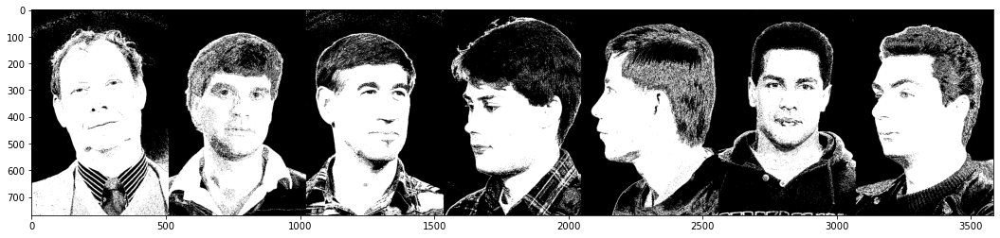

In [58]:
IMAGE = np.hstack([ np.hstack([np.hstack([np.hstack([np.hstack([np.hstack([cv2.imread("../Data/sfa/ORI/img (6).jpg"),
                                                                           cv2.imread("../Data/sfa/ORI/img (25).jpg")]),
                                                                cv2.imread("../Data/sfa/ORI/img (55).jpg")]),
                                                     cv2.imread("../Data/sfa/ORI/img (75).jpg")]),
                                          cv2.imread("../Data/sfa/ORI/img (89).jpg")]),
                             cv2.imread("../Data/sfa/ORI/img (118).jpg")]),
                  cv2.imread("../Data/sfa/ORI/img (110).jpg")])
MASK = getMask(cv2.cvtColor(cv2.cvtColor(IMAGE,cv2.COLOR_BGR2LAB),cv2.COLOR_BGR2RGB))
plt.figure(figsize = (20,4))
plt.imshow(MASK,cmap='gray')

In [56]:
with open('Result BO.pkl', 'wb') as f:
    pickle.dump(ELLIPSES, f)

In [26]:
with open('Result BO.pkl', 'rb') as f:
    ELLIPSES = pickle.load(f)

In [27]:
%matplotlib qt
import random
 
def color_generator(seed):
    random.seed(seed*20+5)
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    return (r/255, g/255, b/255)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('B')
ax.set_ylabel('A')
ax.set_zlabel('L')

for i in range(256):
    for ELLI in ELLIPSES[i]:
        u=ELLI.HMoy      #x-position of the center
        v=ELLI.SMoy      #y-position of the center
        a=ELLI.Th*ELLI.HEct       #radius on the x-axis
        b=ELLI.Th*ELLI.SEct      #radius on the y-axis
        t_rot=ELLI.thet #rotation angle

        t = np.linspace(0, 2*pi, 100)
        Ell = np.array([a*np.cos(t) , b*np.sin(t)])  
        R_rot = np.array([[cos(t_rot) , -sin(t_rot)],[sin(t_rot) , cos(t_rot)]])  
    #2-D rotation matrix

        Ell_rot = np.zeros((2,Ell.shape[1]))
        for j in range(Ell.shape[1]):
            Ell_rot[:,j] = np.dot(R_rot,Ell[:,j])

        ax.plot( u + Ell_rot[0,:] , v + Ell_rot[1,:],np.ones((Ell_rot[0].shape))*i,color=color_generator(ELLI.cluster) )
plt.show()